In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

# Import data

In [2]:
df = pd.read_csv('student_performance.csv')

In [3]:
df

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3,course
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,course,mother,2,2,0,yes,no,no,no,yes,yes,no,no,4,3,4,1,1,3,6,5,6,6,Math
1,GP,F,17,U,GT3,T,1,1,at_home,other,course,father,1,2,0,no,yes,no,no,no,yes,yes,no,5,3,3,1,1,3,4,5,5,6,Math
2,GP,F,15,U,LE3,T,1,1,at_home,other,other,mother,1,2,3,yes,no,yes,no,yes,yes,yes,no,4,3,2,2,3,3,10,7,8,10,Math
3,GP,F,15,U,GT3,T,4,2,health,services,home,mother,1,3,0,no,yes,yes,yes,yes,yes,yes,yes,3,2,2,1,1,5,2,15,14,15,Math
4,GP,F,16,U,GT3,T,3,3,other,other,home,father,1,2,0,no,yes,yes,no,yes,yes,no,no,4,3,2,1,2,5,4,6,10,10,Math
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1039,MS,F,19,R,GT3,T,2,3,services,other,course,mother,1,3,1,no,no,no,yes,no,yes,yes,no,5,4,2,1,2,5,4,10,11,10,Portuguese
1040,MS,F,18,U,LE3,T,3,1,teacher,services,course,mother,1,2,0,no,yes,no,no,yes,yes,yes,no,4,3,4,1,1,1,4,15,15,16,Portuguese
1041,MS,F,18,U,GT3,T,1,1,other,other,course,mother,2,2,0,no,no,no,yes,yes,yes,no,no,1,1,1,1,1,5,6,11,12,9,Portuguese
1042,MS,M,17,U,LE3,T,3,1,services,services,course,mother,2,1,0,no,no,no,no,no,yes,yes,no,2,4,5,3,4,2,6,10,10,10,Portuguese


# Cleaning Data

In [4]:
# standardizing the name of the variables
df.columns = df.columns.str.lower()
df.rename(columns={
    'famsize': 'family_size', 'pstatus': 'parent_status', 'medu': 'mother_education', 'fedu' : 'father_education', 'mjob' : 'mother_job', 
    'fjob' : 'father_job', 'traveltime' : 'travel_time', 'studytime' : 'study_time', 'schoolsup' : 'school_support', 'famsup' : 'family_support',
    'paid' : 'extra_paid_classes', 'activities' : 'extra_curricular_activities', 'nursery' : 'attended_nursery', 
    'higher' : 'higher_education_aspiration', 'internet' : 'home_internet_access', 'romantic' : 'in_relationship', 
    'higher' : 'higher_education_aspiration', 'famrel' : 'family_relationship', 'freetime' : 'free_time', 'goout' : 'going_out_frequency',
    'dalc' : 'work_day_alcohol_use', 'walc' : 'weekend_alcohol_use', 'health' : 'health_status', 'higher' : 'higher_education_aspiration',    
}, inplace=True)

In [5]:
df

,school,sex,age,address,family_size,parent_status,mother_education,father_education,mother_job,father_job,reason,guardian,travel_time,study_time,failures,school_support,family_support,extra_paid_classes,extra_curricular_activities,attended_nursery,higher_education_aspiration,home_internet_access,in_relationship,family_relationship,free_time,going_out_frequency,work_day_alcohol_use,weekend_alcohol_use,health_status,absences,g1,g2,g3,course
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,course,mother,2,2,0,yes,no,no,no,yes,yes,no,no,4,3,4,1,1,3,6,5,6,6,Math
1,GP,F,17,U,GT3,T,1,1,at_home,other,course,father,1,2,0,no,yes,no,no,no,yes,yes,no,5,3,3,1,1,3,4,5,5,6,Math
2,GP,F,15,U,LE3,T,1,1,at_home,other,other,mother,1,2,3,yes,no,yes,no,yes,yes,yes,no,4,3,2,2,3,3,10,7,8,10,Math
3,GP,F,15,U,GT3,T,4,2,health,services,home,mother,1,3,0,no,yes,yes,yes,yes,yes,yes,yes,3,2,2,1,1,5,2,15,14,15,Math
4,GP,F,16,U,GT3,T,3,3,other,other,home,father,1,2,0,no,yes,yes,no,yes,yes,no,no,4,3,2,1,2,5,4,6,10,10,Math
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1039,MS,F,19,R,GT3,T,2,3,services,other,course,mother,1,3,1,no,no,no,yes,no,yes,yes,no,5,4,2,1,2,5,4,10,11,10,Portuguese
1040,MS,F,18,U,LE3,T,3,1,teacher,services,course,mother,1,2,0,no,yes,no,no,yes,yes,yes,no,4,3,4,1,1,1,4,15,15,16,Portuguese
1041,MS,F,18,U,GT3,T,1,1,other,other,course,mother,2,2,0,no,no,no,yes,yes,yes,no,no,1,1,1,1,1,5,6,11,12,9,Portuguese
1042,MS,M,17,U,LE3,T,3,1,services,services,course,mother,2,1,0,no,no,no,no,no,yes,yes,no,2,4,5,3,4,2,6,10,10,10,Portuguese


In [6]:
# checking if there are missing values in each column
df.isnull().sum()

school                         0
sex                            0
age                            0
address                        0
family_size                    0
parent_status                  0
mother_education               0
father_education               0
mother_job                     0
father_job                     0
reason                         0
guardian                       0
travel_time                    0
study_time                     0
failures                       0
school_support                 0
family_support                 0
extra_paid_classes             0
extra_curricular_activities    0
attended_nursery               0
higher_education_aspiration    0
home_internet_access           0
in_relationship                0
family_relationship            0
free_time                      0
going_out_frequency            0
work_day_alcohol_use           0
weekend_alcohol_use            0
health_status                  0
absences                       0
g1        

In [7]:
df.describe()

,age,mother_education,father_education,travel_time,study_time,failures,family_relationship,free_time,going_out_frequency,work_day_alcohol_use,weekend_alcohol_use,health_status,absences,g1,g2,g3
count,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000,1044.000000
mean,16.726054,2.603448,2.387931,1.522989,1.970307,0.264368,3.935824,3.201149,3.156130,1.494253,2.284483,3.543103,4.434866,11.213602,11.246169,11.341954
std,1.239975,1.124907,1.099938,0.731727,0.834353,0.656142,0.933401,1.031507,1.152575,0.911714,1.285105,1.424703,6.210017,2.983394,3.285071,3.864796
min,15.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,16.000000,2.000000,1.000000,1.000000,1.000000,0.000000,4.000000,3.000000,2.000000,1.000000,1.000000,3.000000,0.000000,9.000000,9.000000,10.000000
50%,17.000000,3.000000,2.000000,1.000000,2.000000,0.000000,4.000000,3.000000,3.000000,1.000000,2.000000,4.000000,2.000000,11.000000,11.000000,11.000000
75%,18.000000,4.000000,3.000000,2.000000,2.000000,0.000000,5.000000,4.000000,4.000000,2.000000,3.000000,5.000000,6.000000,13.000000,13.000000,14.000000
max,22.000000,4.000000,4.000000,4.000000,4.000000,3.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,75.000000,19.000000,19.000000,20.000000


In [8]:
print(df.dtypes)

school                         object
sex                            object
age                             int64
address                        object
family_size                    object
parent_status                  object
mother_education                int64
father_education                int64
mother_job                     object
father_job                     object
reason                         object
guardian                       object
travel_time                     int64
study_time                      int64
failures                        int64
school_support                 object
family_support                 object
extra_paid_classes             object
extra_curricular_activities    object
attended_nursery               object
higher_education_aspiration    object
home_internet_access           object
in_relationship                object
family_relationship             int64
free_time                       int64
going_out_frequency             int64
work_day_alc

In [9]:
# checking if there are any duplicated values
df.duplicated().sum()

np.int64(0)

In [10]:
# exploring the unique values in all attributes of the dataframe

for col in df.columns:
    print(f"\n{col}:")
    print(df[col].unique())


school:
['GP' 'MS']

sex:
['F' 'M']

age:
[18 17 15 16 19 22 20 21]

address:
['U' 'R']

family_size:
['GT3' 'LE3']

parent_status:
['A' 'T']

mother_education:
[4 1 3 2 0]

father_education:
[4 1 2 3 0]

mother_job:
['at_home' 'health' 'other' 'services' 'teacher']

father_job:
['teacher' 'other' 'services' 'health' 'at_home']

reason:
['course' 'other' 'home' 'reputation']

guardian:
['mother' 'father' 'other']

travel_time:
[2 1 3 4]

study_time:
[2 3 1 4]

failures:
[0 3 2 1]

school_support:
['yes' 'no']

family_support:
['no' 'yes']

extra_paid_classes:
['no' 'yes']

extra_curricular_activities:
['no' 'yes']

attended_nursery:
['yes' 'no']

higher_education_aspiration:
['yes' 'no']

home_internet_access:
['no' 'yes']

in_relationship:
['no' 'yes']

family_relationship:
[4 5 3 1 2]

free_time:
[3 2 4 1 5]

going_out_frequency:
[4 3 2 1 5]

work_day_alcohol_use:
[1 2 5 3 4]

weekend_alcohol_use:
[1 3 2 4 5]

health_status:
[3 5 1 2 4]

absences:
[ 6  4 10  2  0 16 14  7  8 25 12 5

In [11]:
# exploring the unique values in the categorical attributes
categorical_cols = df.select_dtypes(include="object").columns
categorical_cols

for col in categorical_cols:
    print(f"\n{col}:")
    print(df[col].unique())


school:
['GP' 'MS']

sex:
['F' 'M']

address:
['U' 'R']

family_size:
['GT3' 'LE3']

parent_status:
['A' 'T']

mother_job:
['at_home' 'health' 'other' 'services' 'teacher']

father_job:
['teacher' 'other' 'services' 'health' 'at_home']

reason:
['course' 'other' 'home' 'reputation']

guardian:
['mother' 'father' 'other']

school_support:
['yes' 'no']

family_support:
['no' 'yes']

extra_paid_classes:
['no' 'yes']

extra_curricular_activities:
['no' 'yes']

attended_nursery:
['yes' 'no']

higher_education_aspiration:
['yes' 'no']

home_internet_access:
['no' 'yes']

in_relationship:
['no' 'yes']

course:
['Math' 'Portuguese']


In [12]:
# counting how many values per column
for col in df.columns:
    print(f"\n{col} value counts:")
    print(df[col].value_counts(dropna=False))


school value counts:
school
GP    772
MS    272
Name: count, dtype: int64

sex value counts:
sex
F    591
M    453
Name: count, dtype: int64

age value counts:
age
16    281
17    277
18    222
15    194
19     56
20      9
21      3
22      2
Name: count, dtype: int64

address value counts:
address
U    759
R    285
Name: count, dtype: int64

family_size value counts:
family_size
GT3    738
LE3    306
Name: count, dtype: int64

parent_status value counts:
parent_status
T    923
A    121
Name: count, dtype: int64

mother_education value counts:
mother_education
4    306
2    289
3    238
1    202
0      9
Name: count, dtype: int64

father_education value counts:
father_education
2    324
1    256
3    231
4    224
0      9
Name: count, dtype: int64

mother_job value counts:
mother_job
other       399
services    239
at_home     194
teacher     130
health       82
Name: count, dtype: int64

father_job value counts:
father_job
other       584
services    292
teacher      65
at_home     

# Exploratory data analysis

## Groupby

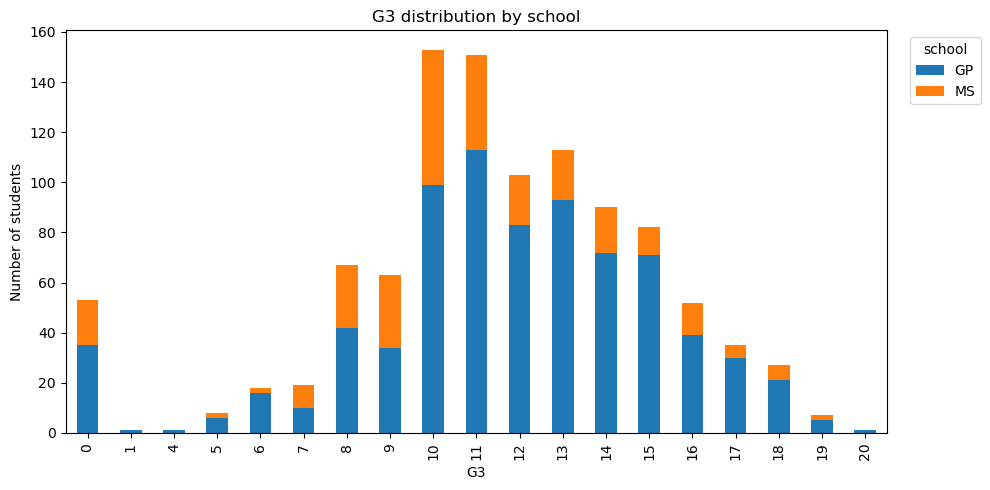

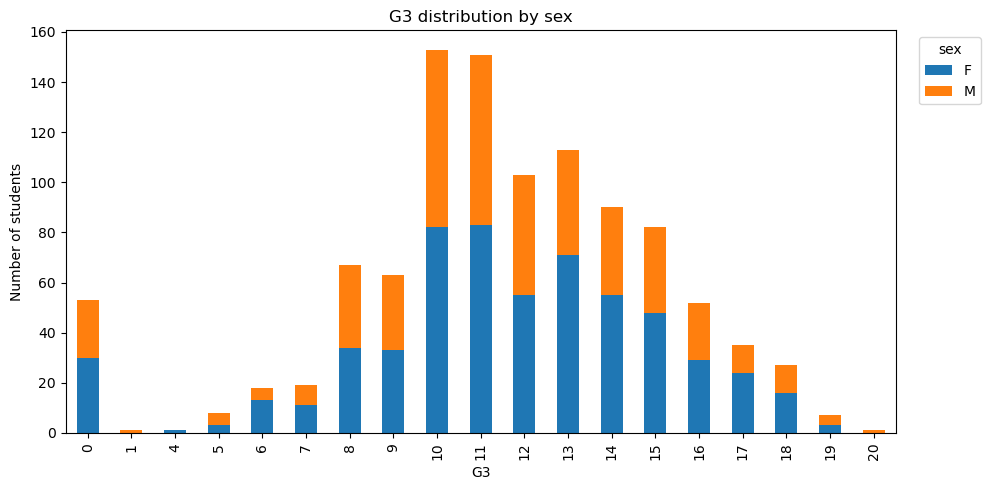

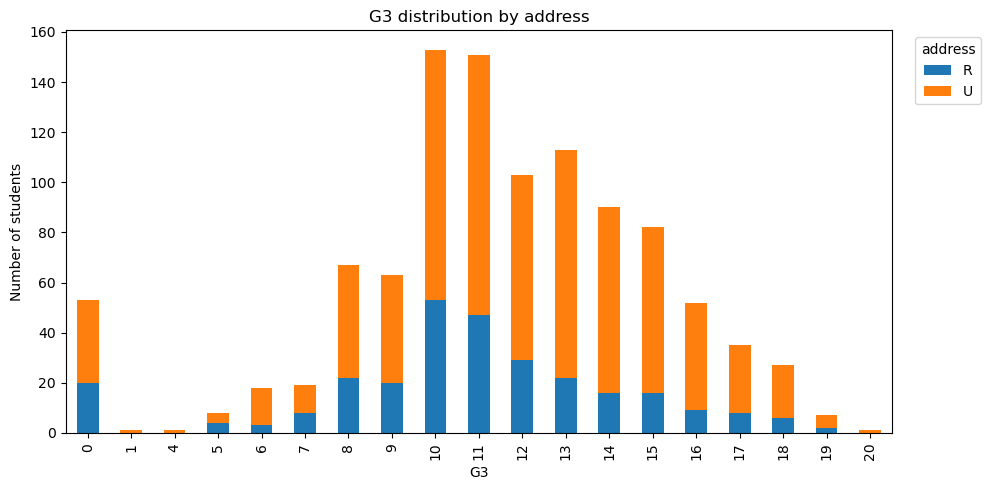

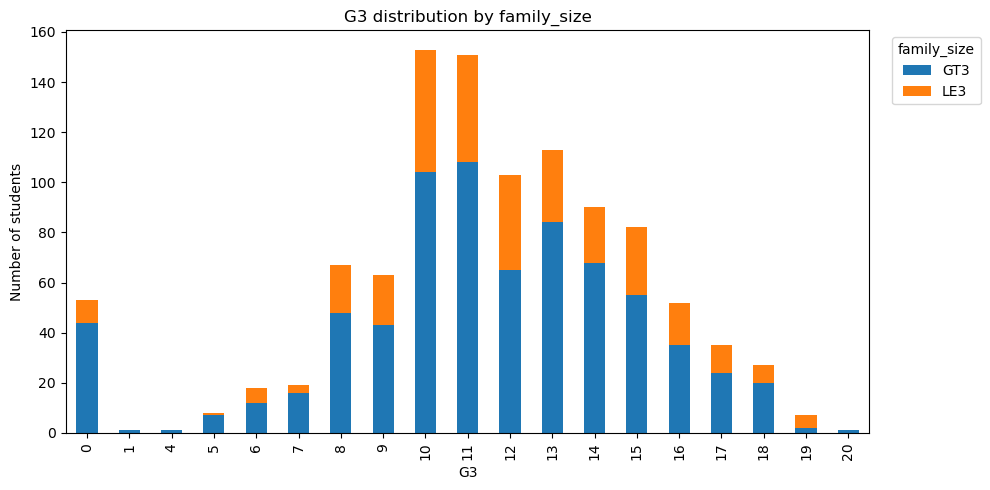

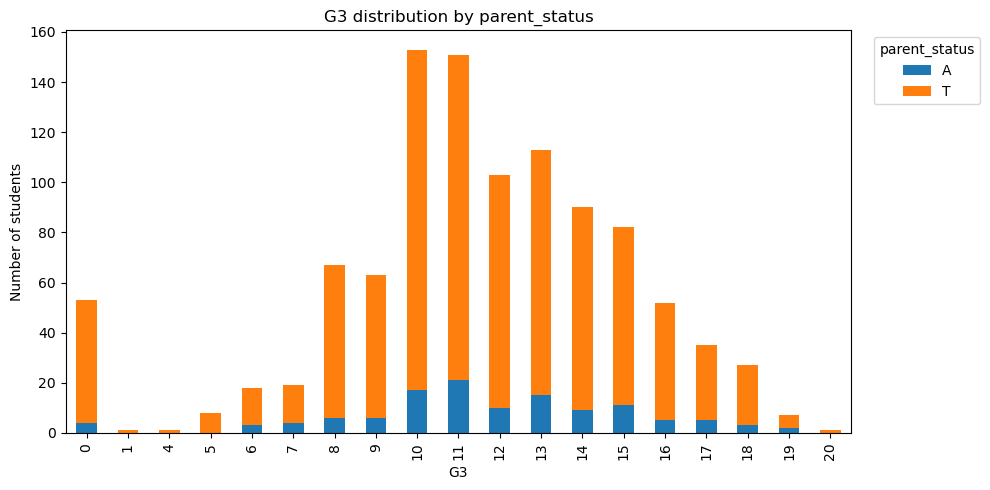

...

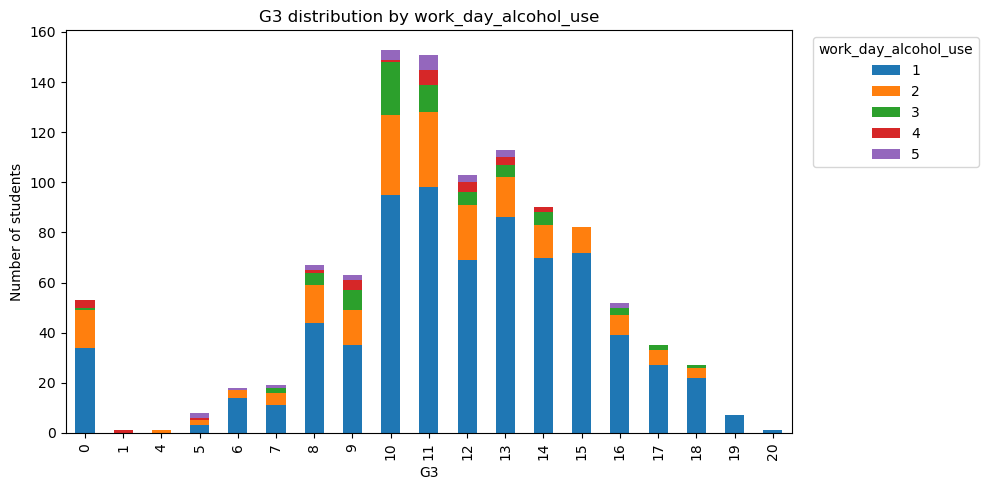

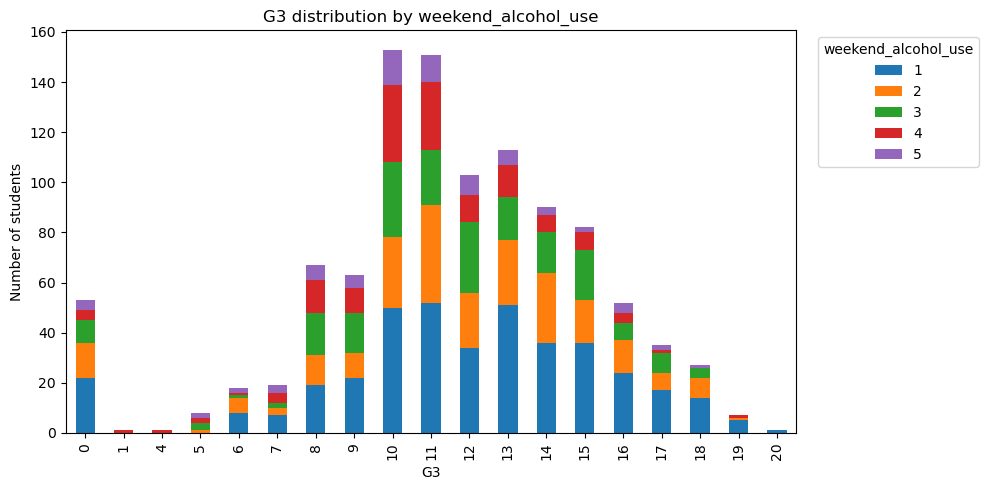

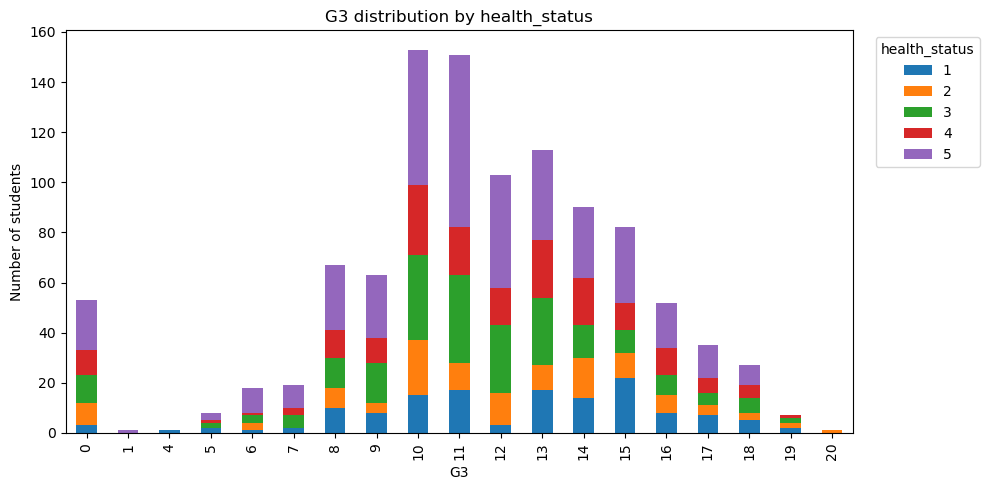

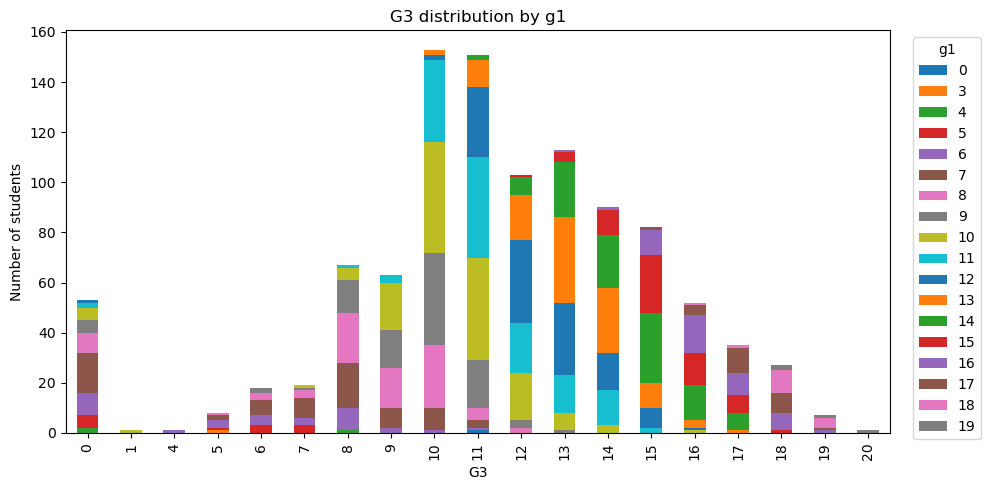

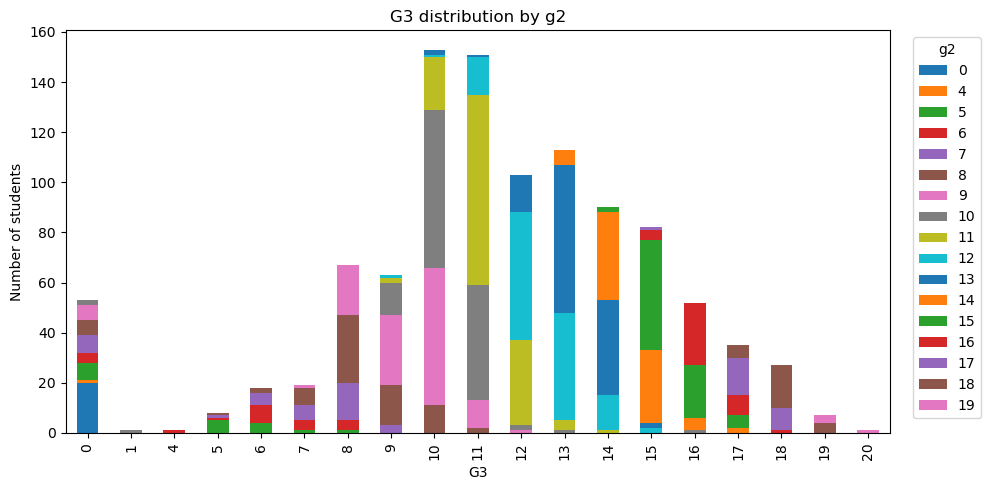

In [13]:
# using groupby to see correlation 

target = "g3"

features = [
    "school", "sex", "address", "family_size", "parent_status",
    "mother_education", "father_education", "mother_job", "father_job",
    "reason", "guardian", "travel_time", "study_time", "failures",
    "school_support", "family_support", "extra_paid_classes",
    "extra_curricular_activities", "attended_nursery",
    "higher_education_aspiration", "home_internet_access",
    "in_relationship", "free_time", "going_out_frequency",
    "work_day_alcohol_use", "weekend_alcohol_use", "health_status",
    "g1", "g2"
]

for f in features:
    table = df.groupby([target, f]).size().unstack(fill_value=0).sort_index()

    ax = table.plot(kind="bar", stacked=True, figsize=(10, 5))
    ax.set_xlabel(target.upper())
    ax.set_ylabel("Number of students")
    ax.set_title(f"{target.upper()} distribution by {f}")
    ax.legend(title=f, bbox_to_anchor=(1.02, 1), loc="upper left")
    plt.tight_layout()
    plt.show()


## Scatteplot

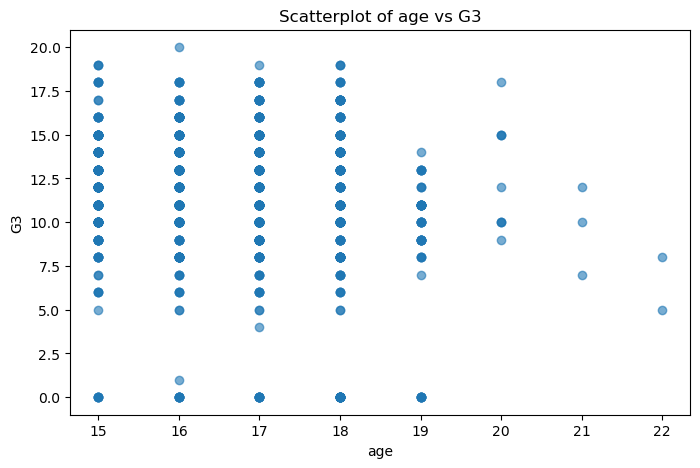

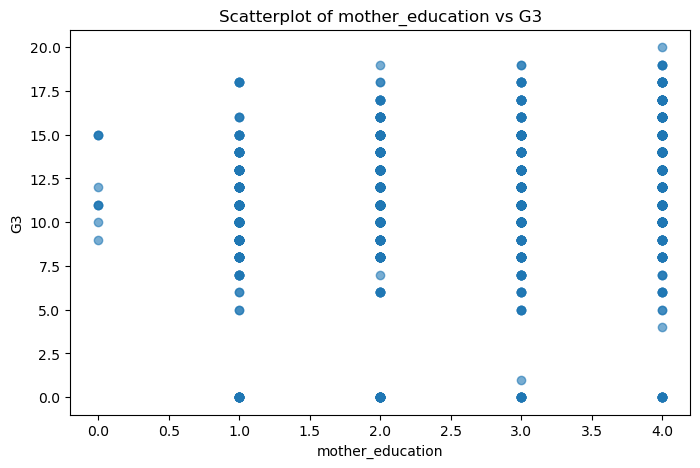

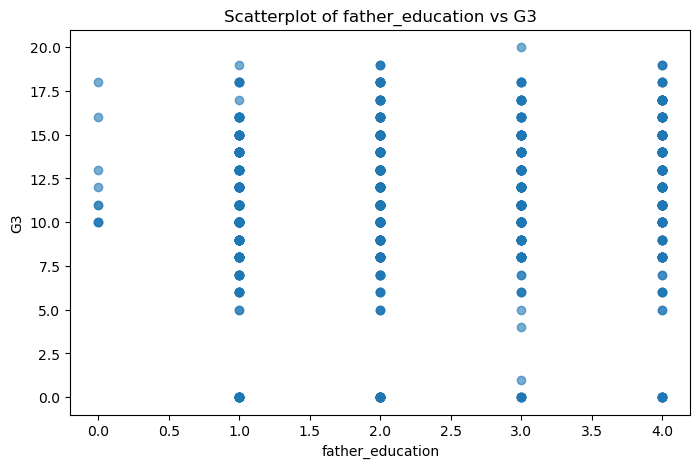

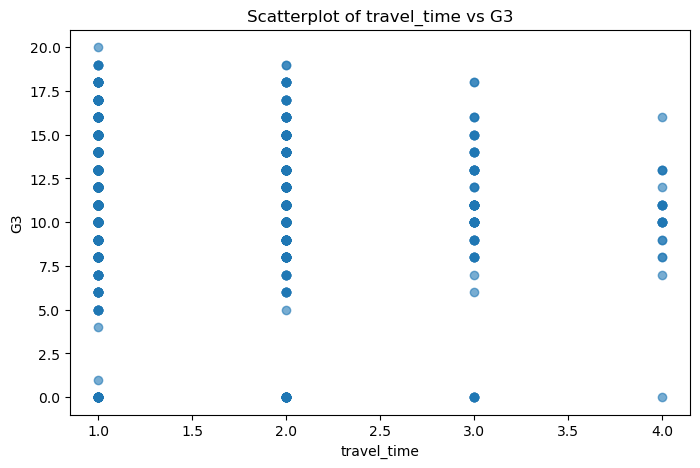

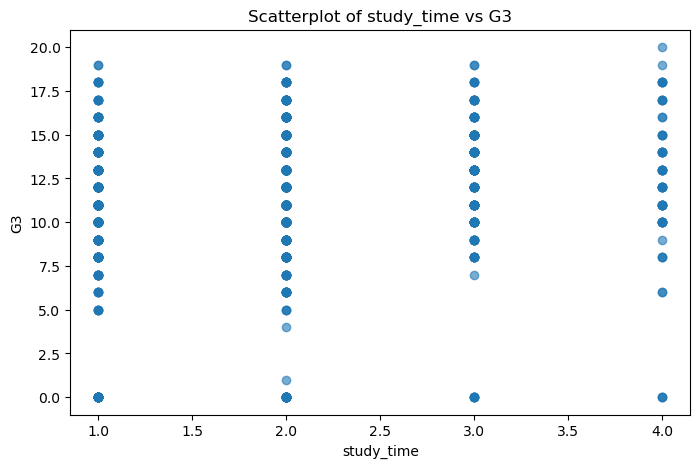

...

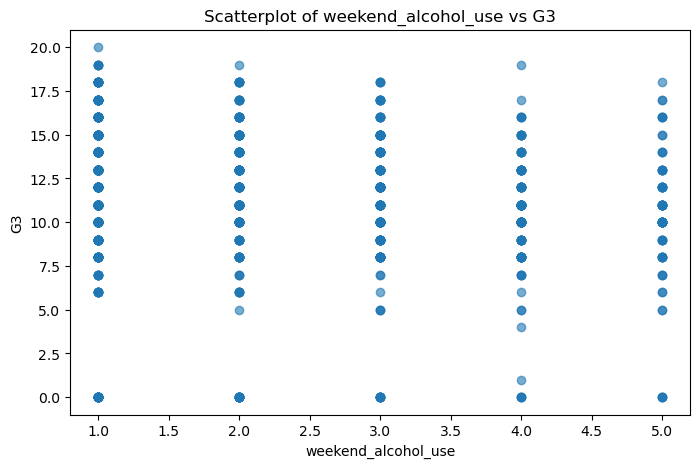

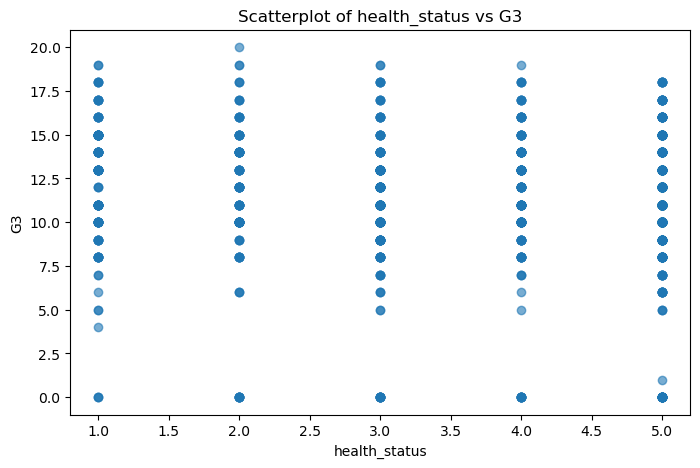

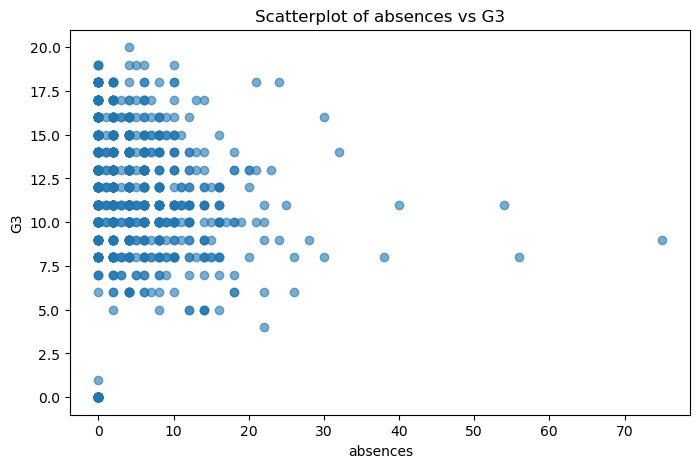

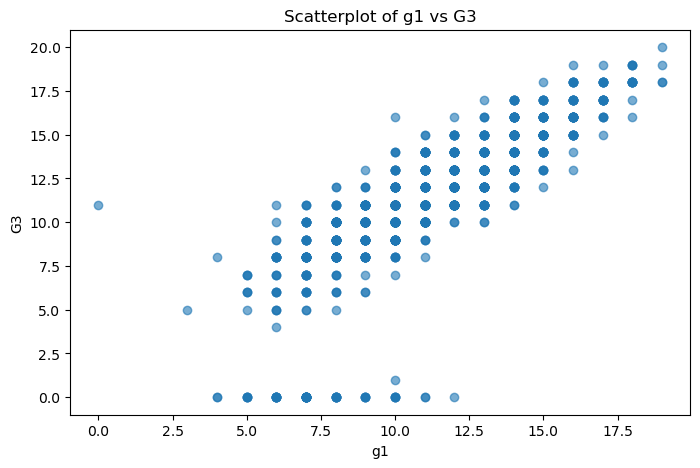

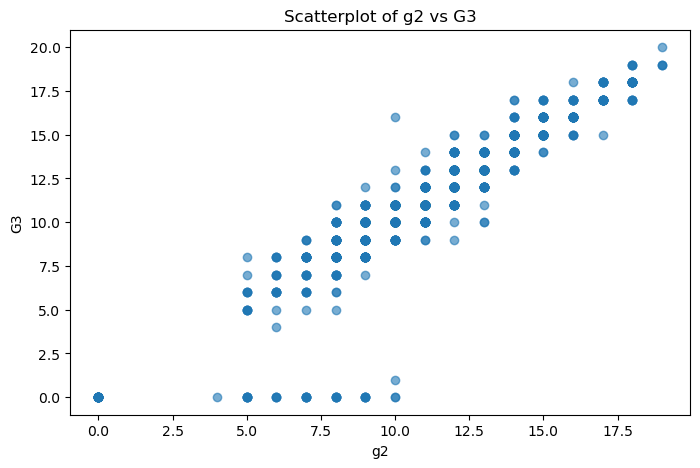

In [14]:
# Using scatterplot to analyse mnumerical features

target = 'g3'

# select only numeric features
numeric_features = df.select_dtypes(include='number').columns

# remove the target itself
numeric_features = numeric_features.drop(target, errors='ignore')

for feature in numeric_features:
    plt.figure(figsize=(8, 5))
    plt.scatter(df[feature], df[target], alpha=0.6)
    plt.xlabel(feature)
    plt.ylabel('G3')
    plt.title(f'Scatterplot of {feature} vs G3')
    plt.show()

## Boxplot

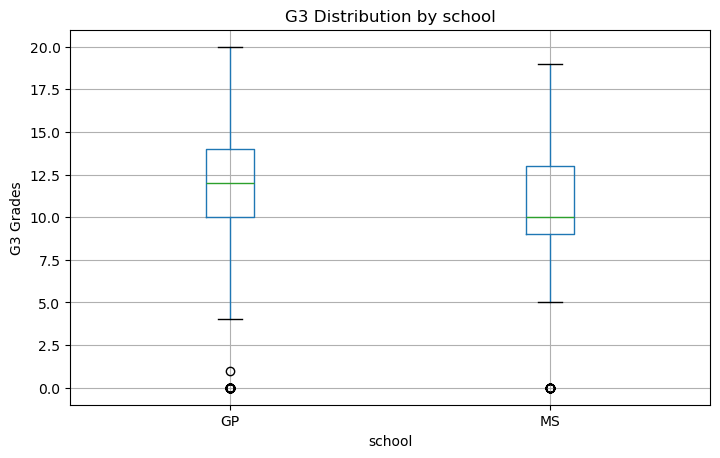

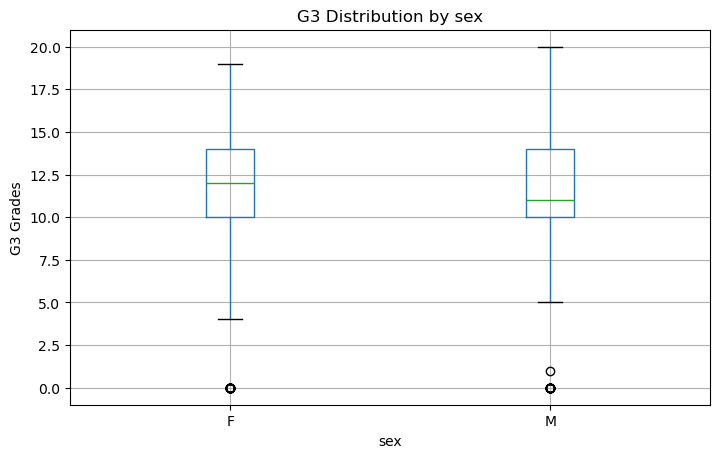

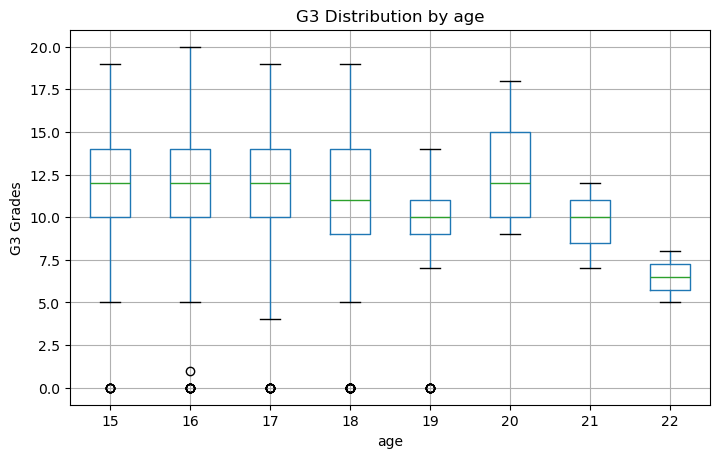

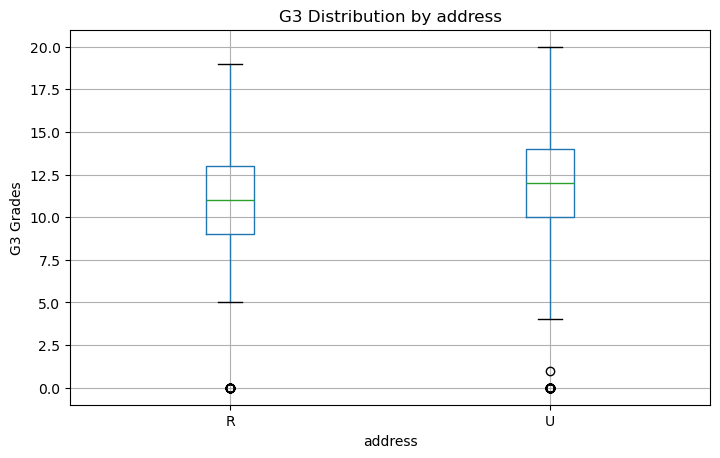

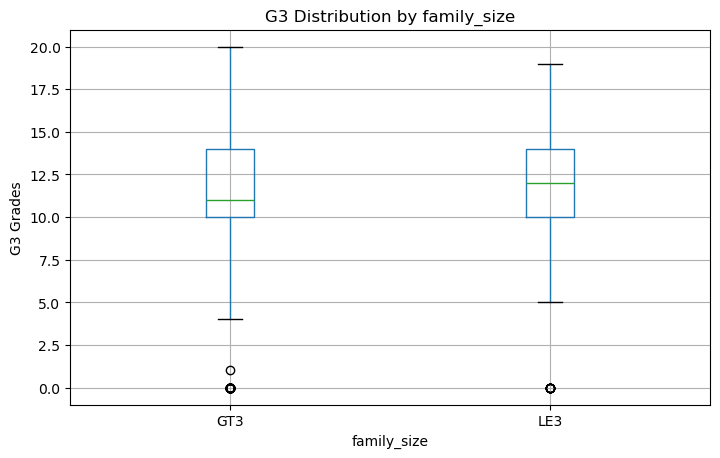

...

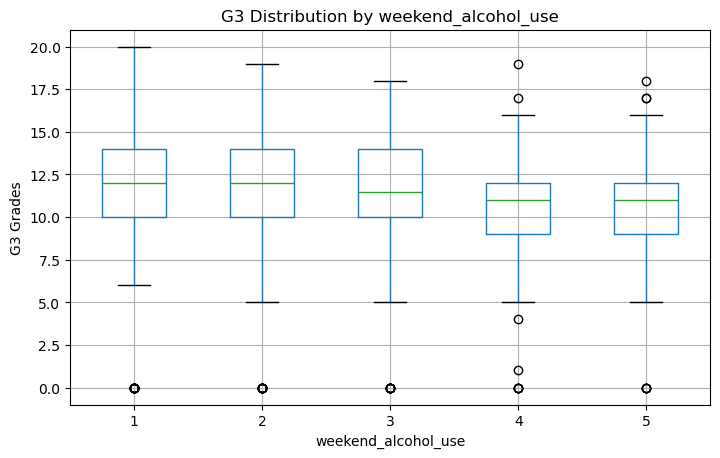

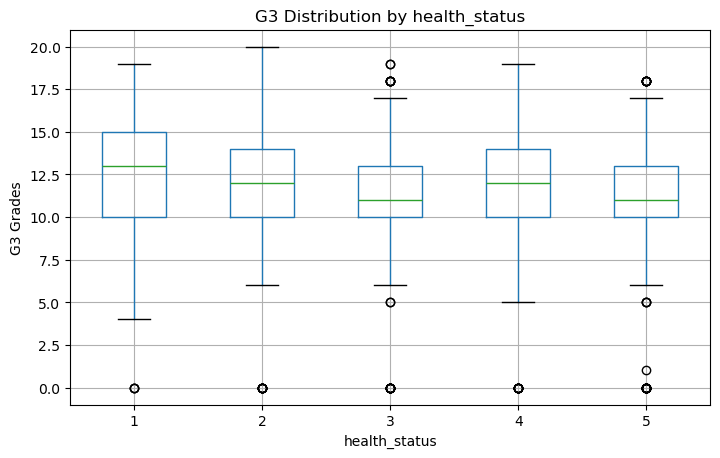

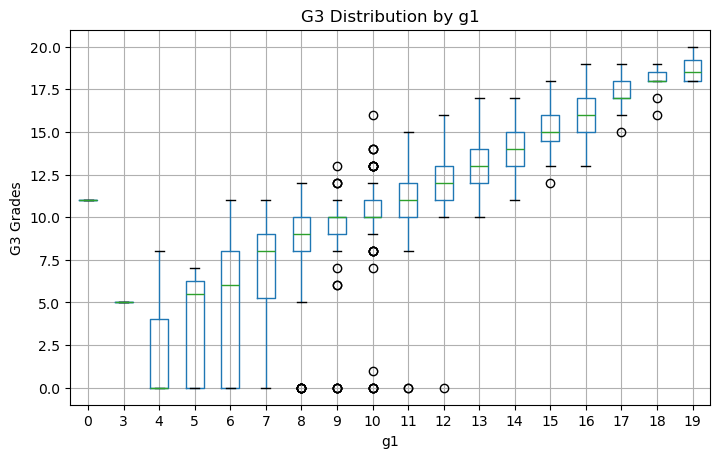

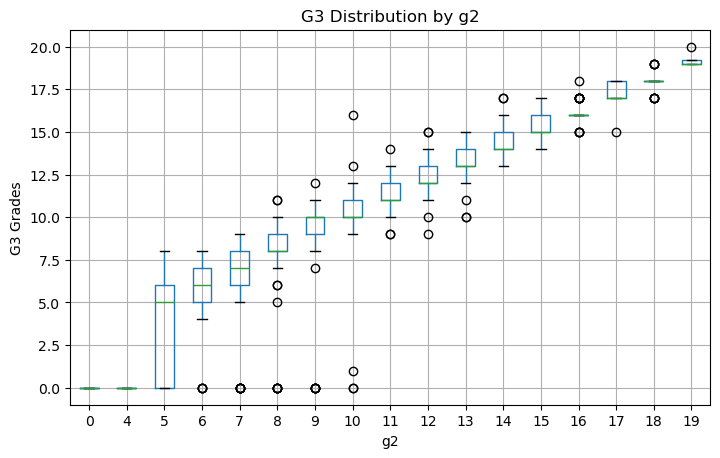

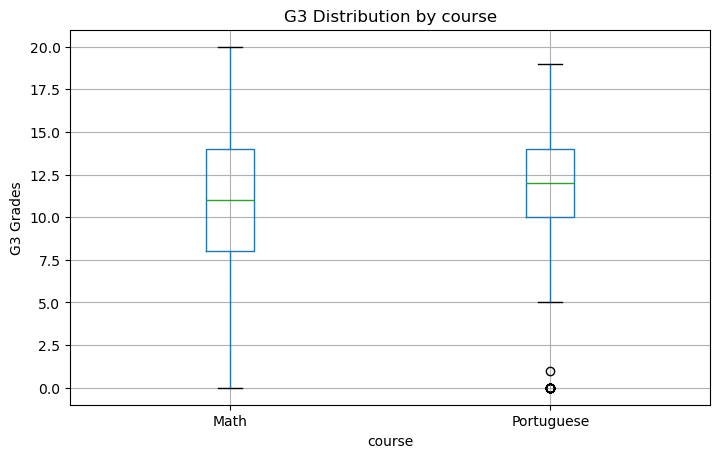

In [15]:
# using boxplot

for feature in df.columns:
    if feature == 'g3':
        continue

    # avoid plots with too many categories
    if df[feature].nunique() > 20:
        continue

    df.boxplot(column='g3', by=feature, figsize=(8, 5))
    plt.xlabel(feature)
    plt.ylabel('G3 Grades')
    plt.title(f'G3 Distribution by {feature}')
    plt.suptitle('')
    plt.show()

## Other explorations

In [16]:
# Using groupby to calculate the average G3 score per feature

df.groupby('school')['g3'].agg(['mean', 'count']).round(2)

,mean,count
school,,
GP,11.63,772
MS,10.51,272


In [17]:
df.groupby('sex')['g3'].agg(['mean', 'count']).round(2)

,mean,count
sex,,
F,11.45,591
M,11.20,453


In [18]:
df.groupby('address')['g3'].agg(['mean', 'count']).round(2)

,mean,count
address,,
R,10.60,285
U,11.62,759


In [19]:
df.groupby('family_size')['g3'].agg(['mean', 'count']).round(2)

,mean,count
family_size,,
GT3,11.19,738
LE3,11.71,306


In [20]:
df.groupby('parent_status')['g3'].agg(['mean', 'count']).round(2)

,mean,count
parent_status,,
A,11.67,121
T,11.30,923


In [21]:
df.groupby('mother_education')['g3'].agg(['mean', 'count']).round(2)

,mean,count
mother_education,,
0,12.11,9
1,10.18,202
2,10.97,289
3,11.25,238
4,12.51,306


In [22]:
df.groupby('father_education')['g3'].agg(['mean', 'count']).round(2)

,mean,count
father_education,,
0,12.33,9
1,10.37,256
2,11.24,324
3,11.64,231
4,12.25,224


In [23]:
df.groupby('mother_job')['g3'].agg(['mean', 'count']).round(2)

,mean,count
mother_job,,
at_home,10.47,194
health,12.68,82
other,11.02,399
services,11.66,239
teacher,12.21,130


In [24]:
df.groupby('father_job')['g3'].agg(['mean', 'count']).round(2)

,mean,count
father_job,,
at_home,11.02,62
health,12.15,41
other,11.26,584
services,11.12,292
teacher,12.86,65


In [25]:
df.groupby('reason')['g3'].agg(['mean', 'count']).round(2)

,mean,count
reason,,
course,10.97,430
home,11.37,258
other,10.85,108
reputation,12.18,248


In [26]:
df.groupby('guardian')['g3'].agg(['mean', 'count']).round(2)

,mean,count
guardian,,
father,11.64,243
mother,11.37,728
other,10.10,73


In [27]:
df.groupby('travel_time')['g3'].agg(['mean', 'count']).round(2)

,mean,count
travel_time,,
1,11.65,623
2,11.02,320
3,10.60,77
4,10.17,24


In [28]:
df.groupby('study_time')['g3'].agg(['mean', 'count']).round(2)

,mean,count
study_time,,
1,10.58,317
2,11.34,503
3,12.49,162
4,12.27,62


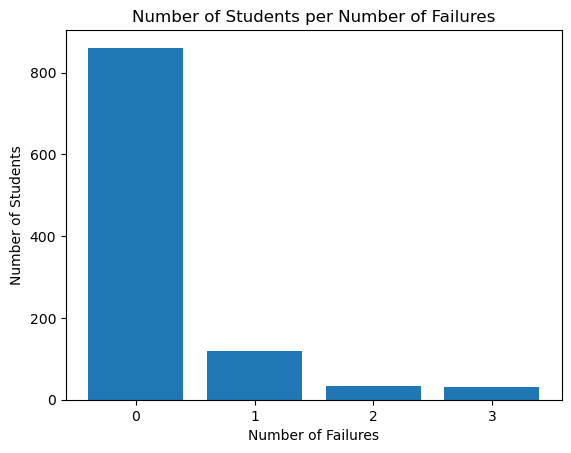

In [29]:
df.groupby('failures')['g3'].agg(['mean', 'count']).round(2)

# Counting number of students for each number of failures
failure_counts = df['failures'].value_counts().sort_index()
failure_counts = failure_counts.reindex(range(0, 4), fill_value=0)

plt.bar(failure_counts.index, failure_counts.values)
plt.xlabel('Number of Failures')
plt.ylabel('Number of Students')
plt.title('Number of Students per Number of Failures')
plt.xticks(range(0, 4))
plt.show()

In [30]:
df.groupby('school_support')['g3'].agg(['mean', 'count']).round(2)

,mean,count
school_support,,
no,11.45,925
yes,10.49,119


In [31]:
df.groupby('family_support')['g3'].agg(['mean', 'count']).round(2)

,mean,count
family_support,,
no,11.28,404
yes,11.38,640


In [32]:
df.groupby('extra_paid_classes')['g3'].agg(['mean', 'count']).round(2)

,mean,count
extra_paid_classes,,
no,11.44,824
yes,10.97,220


In [33]:
df.groupby('extra_curricular_activities')['g3'].agg(['mean', 'count']).round(2)

,mean,count
extra_curricular_activities,,
no,11.21,528
yes,11.47,516


In [34]:
df.groupby('attended_nursery')['g3'].agg(['mean', 'count']).round(2)

,mean,count
attended_nursery,,
no,11.03,209
yes,11.42,835


In [35]:
df.groupby('higher_education_aspiration')['g3'].agg(['mean', 'count']).round(2)

,mean,count
higher_education_aspiration,,
no,8.35,89
yes,11.62,955


In [36]:
df.groupby('home_internet_access')['g3'].agg(['mean', 'count']).round(2)

,mean,count
home_internet_access,,
no,10.53,217
yes,11.55,827


In [37]:
df.groupby('in_relationship')['g3'].agg(['mean', 'count']).round(2)

,mean,count
in_relationship,,
no,11.62,673
yes,10.83,371


In [38]:
df.groupby('family_relationship')['g3'].agg(['mean', 'count']).round(2)

,mean,count
family_relationship,,
1,10.63,30
2,10.49,47
3,10.97,169
4,11.59,512
5,11.34,286


In [39]:
df.groupby('free_time')['g3'].agg(['mean', 'count']).round(2)

,mean,count
free_time,,
1,11.17,64
2,12.28,171
3,11.18,408
4,11.21,293
5,10.92,108


In [40]:
df.groupby('going_out_frequency')['g3'].agg(['mean', 'count']).round(2)

,mean,count
going_out_frequency,,
1,10.45,71
2,12.06,248
3,11.69,335
4,11.09,227
5,10.28,163


In [41]:
df.groupby('work_day_alcohol_use')['g3'].agg(['mean', 'count']).round(2)

,mean,count
work_day_alcohol_use,,
1,11.70,727
2,10.56,196
3,10.90,69
4,9.27,26
5,10.38,26


In [42]:
df.groupby('weekend_alcohol_use')['g3'].agg(['mean', 'count']).round(2)

,mean,count
weekend_alcohol_use,,
1,11.74,398
2,11.47,235
3,11.29,200
4,10.54,138
5,10.40,73


df.groupby('health_status')['g3'].agg(['mean', 'count']).round(2)

In [43]:
df.groupby('course')['g3'].agg(['mean', 'count']).round(2)

,mean,count
course,,
Math,10.42,395
Portuguese,11.91,649


## EDA on absences

In [44]:
absence_counts = (
    df['absences']
      .value_counts()
      .sort_index()
      .reset_index()
)

absence_counts.columns = ['Number of Absences', 'Number of Students']
absence_counts

,Number of Absences,Number of Students
0,0,359
1,1,15
2,2,175
3,3,15
4,4,146
5,5,17
6,6,80
7,7,10
8,8,64
9,9,10


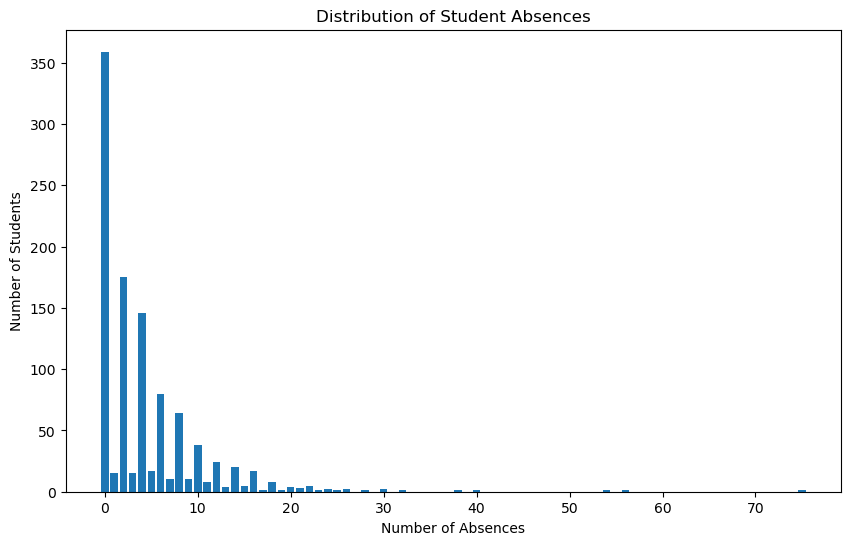

In [45]:
absence_counts = df['absences'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
plt.bar(absence_counts.index, absence_counts.values)

plt.xlabel('Number of Absences')
plt.ylabel('Number of Students')
plt.title('Distribution of Student Absences')

plt.show()

In [46]:
df.groupby('absences')['g3'].agg(['mean', 'count']).round(2)

,mean,count
absences,,
0,10.89,359
1,12.53,15
2,12.09,175
3,11.00,15
4,11.75,146
5,11.71,17
6,11.99,80
7,12.20,10
8,11.27,64


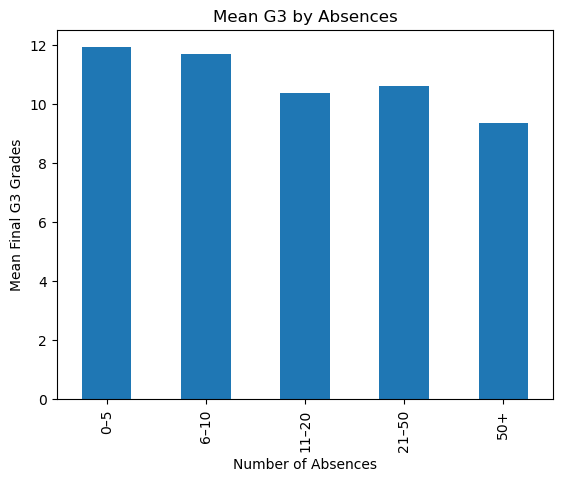

,Absence Ranges,G3 Mean,Number of Students
0,0–5,11.91,368
1,6–10,11.67,202
2,11–20,10.35,92
3,21–50,10.60,20
4,50+,9.33,3


In [47]:
df['absences_bin'] = pd.cut(
    df['absences'],
    bins=[0, 5, 10, 20, 50, 100],
    labels=['0–5', '6–10', '11–20', '21–50', '50+']
)
mean_g3_by_absences = df.groupby('absences_bin')['g3'].mean()

mean_g3_by_absences.plot(kind='bar')

plt.xlabel('Number of Absences')
plt.ylabel('Mean Final G3 Grades')
plt.title('Mean G3 by Absences')
plt.show()

g3_by_absences = (
    df.groupby('absences_bin')['g3']
      .agg(['mean', 'count'])
      .round(2)
      .reset_index()
)

g3_by_absences.columns = ['Absence Ranges', 'G3 Mean', 'Number of Students']

g3_by_absences

### Family correlation

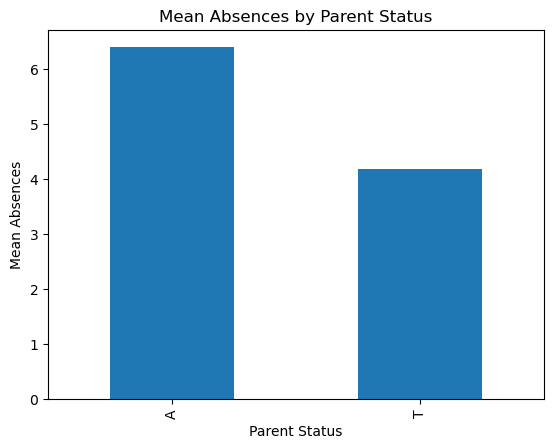

,mean,count
parent_status,,
A,6.39,121
T,4.18,923


In [48]:
mean_abs_parent = df.groupby('parent_status')['absences'].mean()
mean_abs_parent.plot(kind='bar')

plt.xlabel('Parent Status')
plt.ylabel('Mean Absences')
plt.title('Mean Absences by Parent Status')
plt.show()

df.groupby('parent_status')['absences'].agg(['mean', 'count']).round(2)

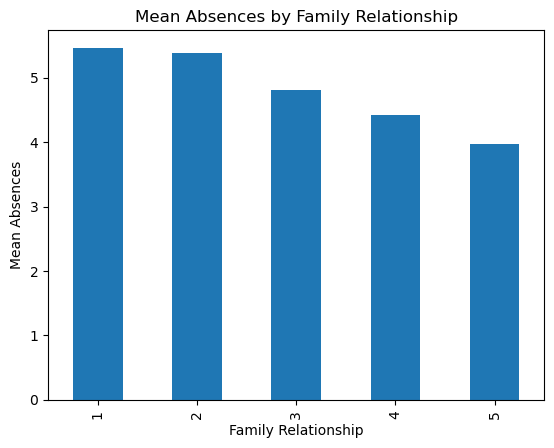

,mean,count
family_relationship,,
1,5.47,30
2,5.38,47
3,4.80,169
4,4.42,512
5,3.98,286


In [49]:
mean_abs_family = df.groupby('family_relationship')['absences'].mean()
mean_abs_family.plot(kind='bar')

plt.xlabel('Family Relationship')
plt.ylabel('Mean Absences')
plt.title('Mean Absences by Family Relationship')
plt.show()

df.groupby('family_relationship')['absences'].agg(['mean', 'count']).round(2)

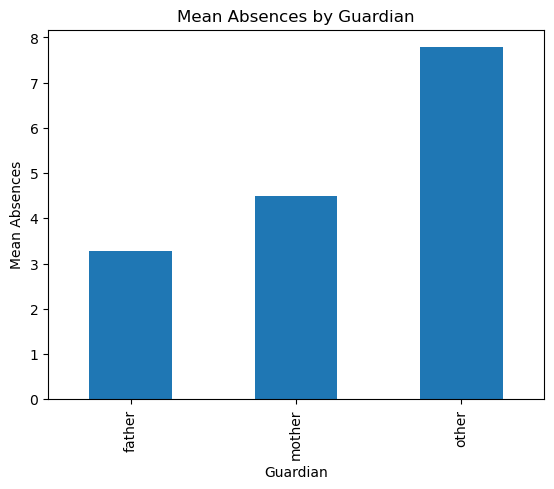

,mean,count
guardian,,
father,3.28,243
mother,4.48,728
other,7.78,73


In [50]:
mean_abs_guardian = df.groupby('guardian')['absences'].mean()
mean_abs_guardian.plot(kind='bar')

plt.xlabel('Guardian')
plt.ylabel('Mean Absences')
plt.title('Mean Absences by Guardian')
plt.show()

df.groupby('guardian')['absences'].agg(['mean', 'count']).round(2)

### School correlation

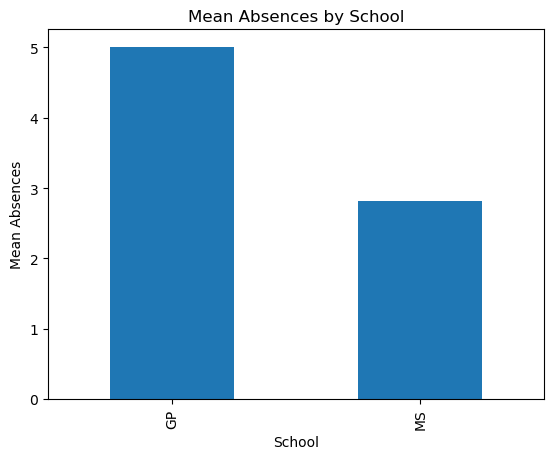

,mean,count
school,,
GP,5.01,772
MS,2.81,272


In [51]:
mean_abs_school = df.groupby('school')['absences'].mean()
mean_abs_school.plot(kind='bar')

plt.xlabel('School')
plt.ylabel('Mean Absences')
plt.title('Mean Absences by School')
plt.show()

df.groupby('school')['absences'].agg(['mean', 'count']).round(2)

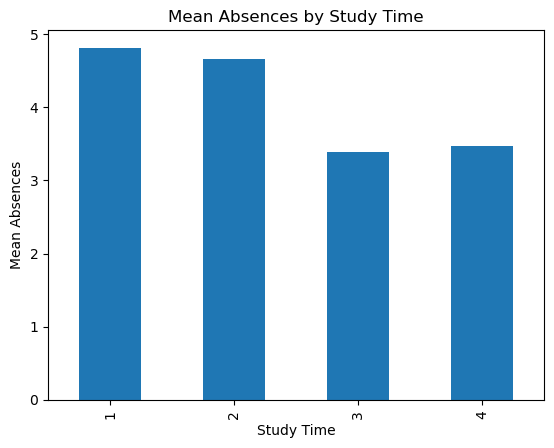

,mean,count
study_time,,
1,4.81,317
2,4.65,503
3,3.39,162
4,3.47,62


In [52]:
mean_abs_study = df.groupby('study_time')['absences'].mean()
mean_abs_study.plot(kind='bar')

plt.xlabel('Study Time')
plt.ylabel('Mean Absences')
plt.title('Mean Absences by Study Time')
plt.show()

df.groupby('study_time')['absences'].agg(['mean', 'count']).round(2)

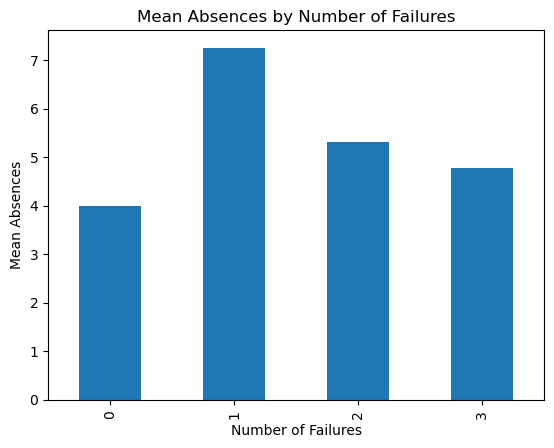

,mean,count
failures,,
0,4.00,861
1,7.25,120
2,5.30,33
3,4.77,30


In [53]:
mean_abs_failures = df.groupby('failures')['absences'].mean()
mean_abs_failures.plot(kind='bar')

plt.xlabel('Number of Failures')
plt.ylabel('Mean Absences')
plt.title('Mean Absences by Number of Failures')
plt.show()

df.groupby('failures')['absences'].agg(['mean', 'count']).round(2)

In [54]:
df.groupby(['sex', 'failures'])['absences'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
sex failures                   
F   0         4.00  1989    497
    1         8.05   523     65
    2         6.11   110     18
    3         3.73    41     11
M   0         3.99  1453    364
    1         6.31   347     55
    2         4.33    65     15
    3         5.37   102     19

### Support correlation

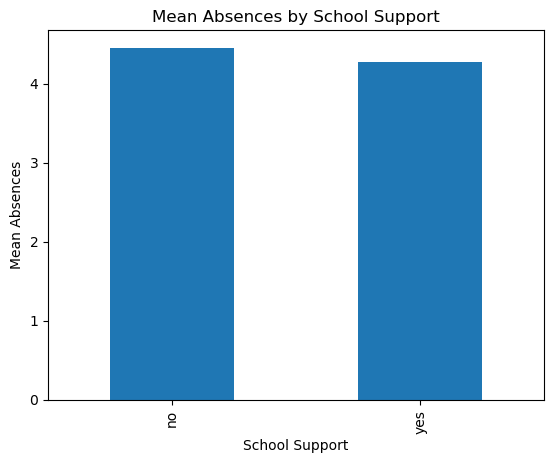

,mean,count
school_support,,
no,4.46,925
yes,4.28,119


In [55]:
mean_abs_school_support = df.groupby('school_support')['absences'].mean()
mean_abs_school_support.plot(kind='bar')

plt.xlabel('School Support')
plt.ylabel('Mean Absences')
plt.title('Mean Absences by School Support')
plt.show()

df.groupby('school_support')['absences'].agg(['mean', 'count']).round(2)

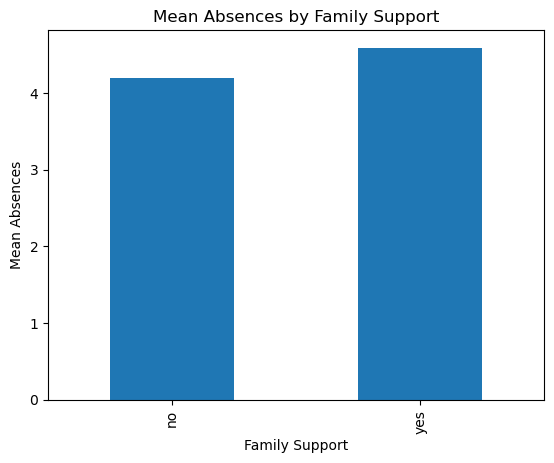

,mean,count
family_support,,
no,4.19,404
yes,4.59,640


In [56]:
mean_abs_family_support = df.groupby('family_support')['absences'].mean()
mean_abs_family_support.plot(kind='bar')

plt.xlabel('Family Support')
plt.ylabel('Mean Absences')
plt.title('Mean Absences by Family Support')
plt.show()

df.groupby('family_support')['absences'].agg(['mean', 'count']).round(2)

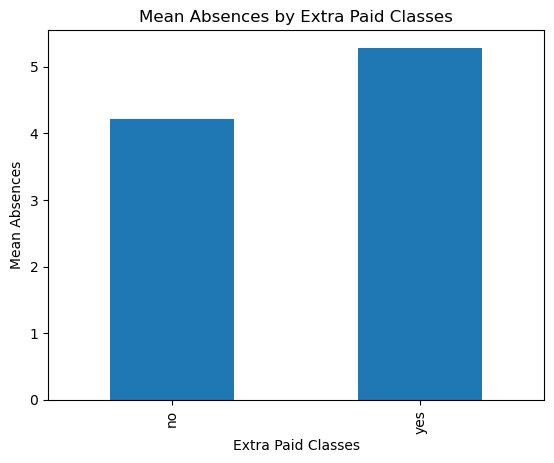

,mean,count
extra_paid_classes,,
no,4.21,824
yes,5.28,220


In [57]:
mean_abs_extra_paid = df.groupby('extra_paid_classes')['absences'].mean()
mean_abs_extra_paid.plot(kind='bar')

plt.xlabel('Extra Paid Classes')
plt.ylabel('Mean Absences')
plt.title('Mean Absences by Extra Paid Classes')
plt.show()

df.groupby('extra_paid_classes')['absences'].agg(['mean', 'count']).round(2)

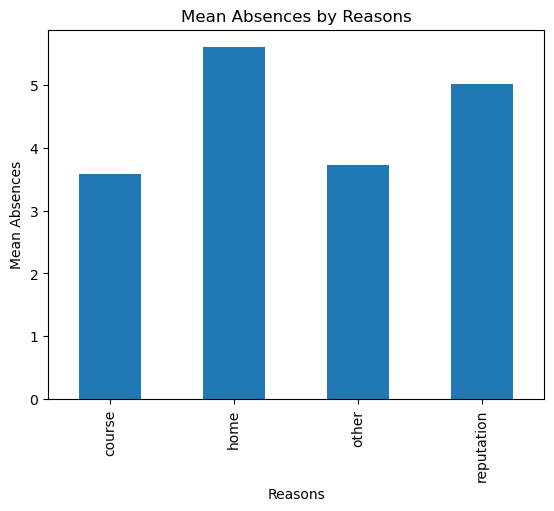

,mean,count
reason,,
course,3.59,430
home,5.59,258
other,3.72,108
reputation,5.01,248


In [58]:
mean_abs_reason = df.groupby('reason')['absences'].mean()
mean_abs_reason.plot(kind='bar')

plt.xlabel('Reasons')
plt.ylabel('Mean Absences')
plt.title('Mean Absences by Reasons')
plt.show()

df.groupby('reason')['absences'].agg(['mean', 'count']).round(2)

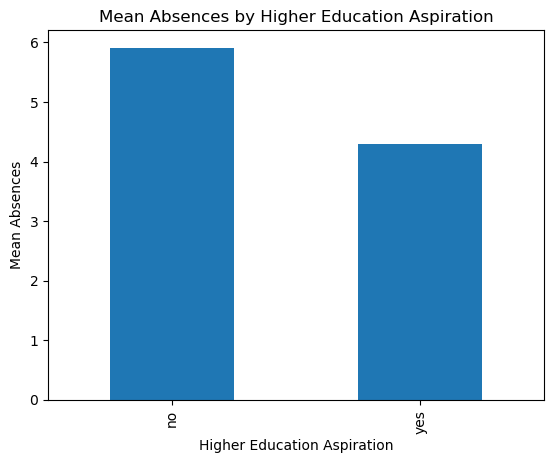

,mean,count
higher_education_aspiration,,
no,5.91,89
yes,4.30,955


In [59]:
mean_abs_higher_ed = df.groupby('higher_education_aspiration')['absences'].mean()
mean_abs_higher_ed.plot(kind='bar')

plt.xlabel('Higher Education Aspiration')
plt.ylabel('Mean Absences')
plt.title('Mean Absences by Higher Education Aspiration')
plt.show()

df.groupby('higher_education_aspiration')['absences'].agg(['mean', 'count']).round(2)

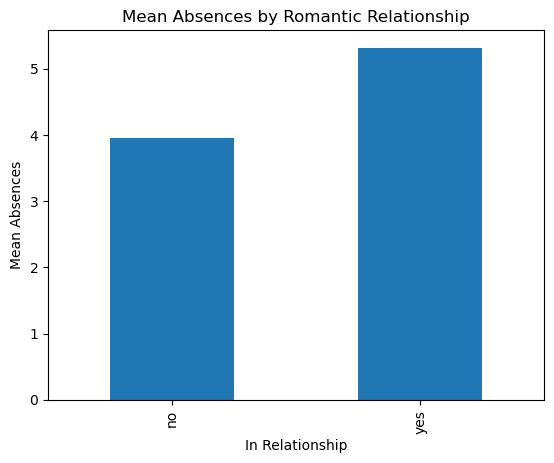

,mean,count
in_relationship,,
no,3.95,673
yes,5.32,371


In [60]:
mean_abs_relationship = df.groupby('in_relationship')['absences'].mean()
mean_abs_relationship.plot(kind='bar')

plt.xlabel('In Relationship')
plt.ylabel('Mean Absences')
plt.title('Mean Absences by Romantic Relationship')
plt.show()

df.groupby('in_relationship')['absences'].agg(['mean', 'count']).round(2)

### Alcohol correlation

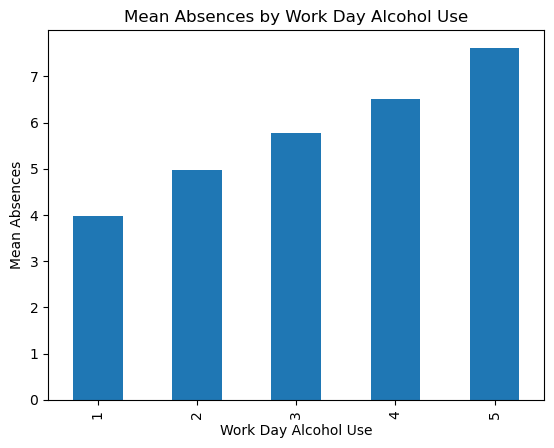

,mean,count
work_day_alcohol_use,,
1,3.97,727
2,4.98,196
3,5.78,69
4,6.50,26
5,7.62,26


In [61]:
mean_abs_wd_alcohol = df.groupby('work_day_alcohol_use')['absences'].mean()
mean_abs_wd_alcohol.plot(kind='bar')

plt.xlabel('Work Day Alcohol Use')
plt.ylabel('Mean Absences')
plt.title('Mean Absences by Work Day Alcohol Use')
plt.show()

df.groupby('work_day_alcohol_use')['absences'].agg(['mean', 'count']).round(2)

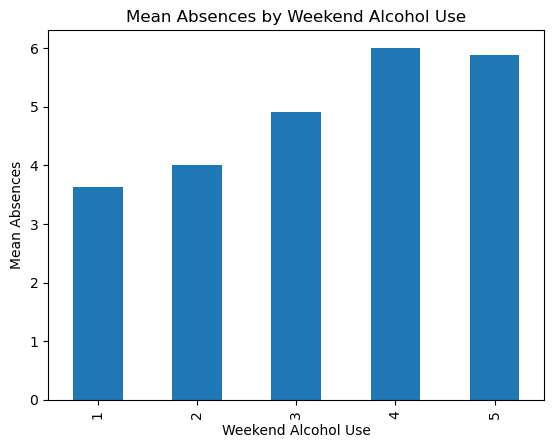

,mean,count
weekend_alcohol_use,,
1,3.64,398
2,4.01,235
3,4.91,200
4,6.01,138
5,5.88,73


In [62]:
mean_abs_we_alcohol = df.groupby('weekend_alcohol_use')['absences'].mean()
mean_abs_we_alcohol.plot(kind='bar')

plt.xlabel('Weekend Alcohol Use')
plt.ylabel('Mean Absences')
plt.title('Mean Absences by Weekend Alcohol Use')
plt.show()

df.groupby('weekend_alcohol_use')['absences'].agg(['mean', 'count']).round(2)

In [63]:
df.groupby(['sex', 'work_day_alcohol_use'])['absences'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
sex work_day_alcohol_use                   
F   1                     4.09  1932    472
    2                     6.10   555     91
    3                     7.19   115     16
    4                     5.00    45      9
    5                     5.33    16      3
M   1                     3.75   956    255
    2                     4.01   421    105
    3                     5.36   284     53
    4                     7.29   124     17
    5                     7.91   182     23

In [64]:
df.groupby('guardian')['work_day_alcohol_use'].agg(['mean', 'sum', 'count']).round(2)

,mean,sum,count
guardian,,,
father,1.55,377,243
mother,1.45,1054,728
other,1.77,129,73


In [65]:
df.groupby(['school_support', 'parent_status'])['absences'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
school_support parent_status                   
no             A              6.83   717    105
               T              4.15  3404    820
yes            A              3.50    56     16
               T              4.40   453    103

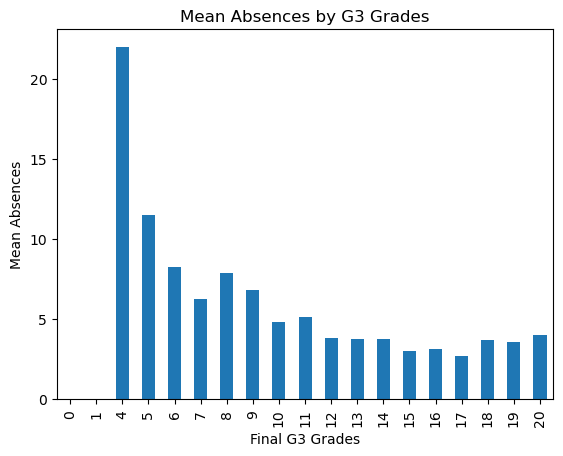

,mean,count
g3,,
0,0.00,53
1,0.00,1
4,22.00,1
5,11.50,8
6,8.28,18
7,6.26,19
8,7.87,67
9,6.84,63
10,4.80,153


In [66]:
mean_abs_g3 = df.groupby('g3')['absences'].mean()
mean_abs_g3.plot(kind='bar')

plt.xlabel('Final G3 Grades')
plt.ylabel('Mean Absences')
plt.title('Mean Absences by G3 Grades')
plt.show()

df.groupby('g3')['absences'].agg(['mean', 'count']).round(2)

In [67]:
df.groupby(['family_relationship', 'guardian'])['absences'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
family_relationship guardian                    
1                   father     7.00    14      2
                    mother     4.72   118     25
                    other     10.67    32      3
2                   father     6.00    54      9
                    mother     5.32   181     34
                    other      4.50    18      4
3                   father     4.74   251     53
                    mother     4.77   506    106
                    other      5.50    55     10
4                   father     2.64   301    114
                    mother     4.49  1611    359
                    other      9.03   352     39
5                   father     2.72   177     65
                    mother     4.16   849    204
                    other      6.53   111     17

In [68]:
df.groupby(['guardian', 'family_relationship'])['absences'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
guardian family_relationship                    
father   1                     7.00    14      2
         2                     6.00    54      9
         3                     4.74   251     53
         4                     2.64   301    114
         5                     2.72   177     65
mother   1                     4.72   118     25
         2                     5.32   181     34
         3                     4.77   506    106
         4                     4.49  1611    359
         5                     4.16   849    204
other    1                    10.67    32      3
         2                     4.50    18      4
         3                     5.50    55     10
         4                     9.03   352     39
         5                     6.53   111     17

In [69]:
df.groupby(['guardian', 'parent_status'])['absences'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
guardian parent_status                   
father   A              8.40    84     10
         T              3.06   713    233
mother   A              6.32   600     95
         T              4.21  2665    633
other    A              5.56    89     16
         T              8.40   479     57

In [70]:
df.groupby(['parent_status', 'guardian'])['absences'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
parent_status guardian                   
A             father    8.40    84     10
              mother    6.32   600     95
              other     5.56    89     16
T             father    3.06   713    233
              mother    4.21  2665    633
              other     8.40   479     57

In [71]:
df.groupby(['parent_status', 'guardian', 'work_day_alcohol_use'])['absences'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
parent_status guardian work_day_alcohol_use                    
A             father   1                     10.57    74      7
                       2                      0.00     0      1
                       3                      5.00    10      2
              mother   1                      5.62   405     72
                       2                      8.08    97     12
                       3                     12.57    88      7
                       4                      3.00     6      2
                       5                      2.00     4      2
              other    1                      3.92    47     12
                       2                      5.00     5      1
                       3                     16.00    16      1
                       4                     11.00    11      1
                       5                     10.00    10      1
T             father   1                      2.70   407    151
                       2                      3.04   161     53
                       3                      5.12    82     16
                       4                      5.12    41      8
                       5                      4.40    22      5
              mother   1                      3.73  1693    454
                       2                      5.45   632    116
                       3                      4.03   145     36
                       4                      5.40    54     10
                       5                      8.29   141     17
              other    1                      8.45   262     31
                       2                      6.23    81     13
                       3                      8.29    58      7
                       4                     11.40    57      5
                       5                     21.00    21      1

In [72]:
df.groupby(['parent_status', 'family_relationship'])['absences'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
parent_status family_relationship                   
A             1                    4.86    34      7
              2                    7.56    68      9
              3                    5.76    98     17
              4                    7.43   394     53
              5                    5.11   179     35
T             1                    5.65   130     23
              2                    4.87   185     38
              3                    4.70   714    152
              4                    4.07  1870    459
              5                    3.82   958    251

In [73]:
df.groupby(['family_relationship', 'parent_status'])['absences'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
family_relationship parent_status                   
1                   A              4.86    34      7
                    T              5.65   130     23
2                   A              7.56    68      9
                    T              4.87   185     38
3                   A              5.76    98     17
                    T              4.70   714    152
4                   A              7.43   394     53
                    T              4.07  1870    459
5                   A              5.11   179     35
                    T              3.82   958    251

In [74]:
df.groupby('sex')['absences'].agg(['mean', 'sum', 'count']).round(2)

,mean,sum,count
sex,,,
F,4.51,2663,591
M,4.34,1967,453


In [75]:
df.groupby(['sex', 'parent_status'])['absences'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
sex parent_status                   
F   A              6.66   513     77
    T              4.18  2150    514
M   A              5.91   260     44
    T              4.17  1707    409

In [76]:
df.groupby(['sex', 'guardian'])['absences'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
sex guardian                   
F   father    3.03   388    128
    mother    4.65  1944    418
    other     7.36   331     45
M   father    3.56   409    115
    mother    4.26  1321    310
    other     8.46   237     28

In [77]:
df.groupby(['sex', 'guardian', 'parent_status'])['absences'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
sex guardian parent_status                    
F   father   A              10.57    74      7
             T               2.60   314    121
    mother   A               6.17   370     60
             T               4.40  1574    358
    other    A               6.90    69     10
             T               7.49   262     35
M   father   A               3.33    10      3
             T               3.56   399    112
    mother   A               6.57   230     35
             T               3.97  1091    275
    other    A               3.33    20      6
             T               9.86   217     22

In [78]:
df.groupby(['school', 'parent_status'])['absences'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
school parent_status                   
GP     A              7.24   673     93
       T              4.70  3192    679
MS     A              3.57   100     28
       T              2.73   665    244

In [79]:
df.groupby(['school', 'guardian'])['absences'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
school guardian                   
GP     father    3.72   628    169
       mother    5.03  2760    549
       other     8.83   477     54
MS     father    2.28   169     74
       mother    2.82   505    179
       other     4.79    91     19

In [80]:
df.groupby(['school', 'guardian', 'parent_status'])['absences'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
school guardian parent_status                   
GP     father   A              9.50    76      8
                T              3.43   552    161
       mother   A              7.26   530     73
                T              4.68  2230    476
       other    A              5.58    67     12
                T              9.76   410     42
MS     father   A              4.00     8      2
                T              2.24   161     72
       mother   A              3.18    70     22
                T              2.77   435    157
       other    A              5.50    22      4
                T              4.60    69     15

## EDA on study time

In [81]:
study_time_counts = (
    df['study_time']
      .value_counts()
      .sort_index()
      .reset_index()
)

study_time_counts.columns = ['Study Time', 'Number of Students']
study_time_counts

,Study Time,Number of Students
0,1,317
1,2,503
2,3,162
3,4,62


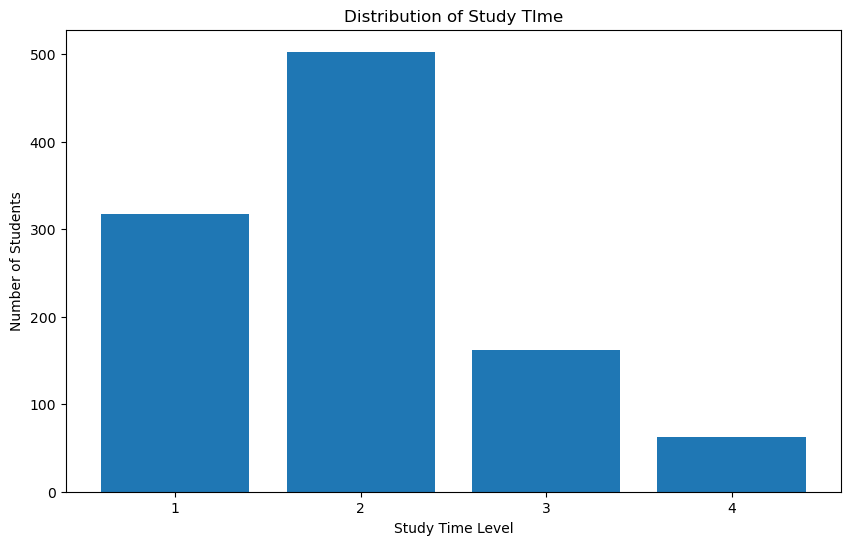

In [82]:
study_time_counts = df['study_time'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
plt.bar(study_time_counts.index, study_time_counts.values)

plt.xlabel('Study Time Level')
plt.ylabel('Number of Students')
plt.title('Distribution of Study TIme')

plt.xticks(study_time_counts.index)

plt.show()

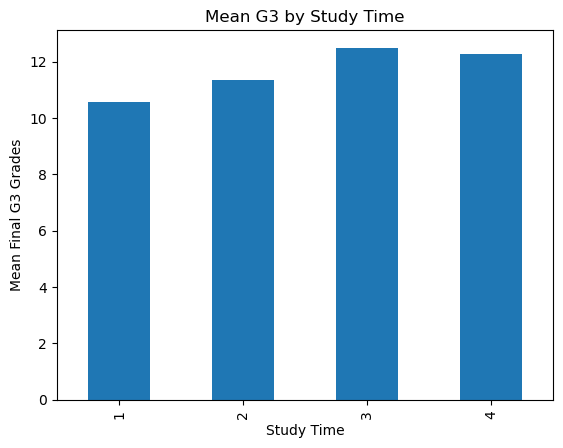

,Study Time,G3 Mean,Number of Students
0,1,10.58,317
1,2,11.34,503
2,3,12.49,162
3,4,12.27,62


In [83]:
mean_g3_by_study_time = df.groupby('study_time')['g3'].mean()

mean_g3_by_study_time.plot(kind='bar')

plt.xlabel('Study Time')
plt.ylabel('Mean Final G3 Grades')
plt.title('Mean G3 by Study Time')
plt.show()

g3_by_study_time = (
    df.groupby('study_time')['g3']
      .agg(['mean', 'count'])
      .round(2)
      .reset_index()
)

g3_by_study_time.columns = ['Study Time', 'G3 Mean', 'Number of Students']

g3_by_study_time

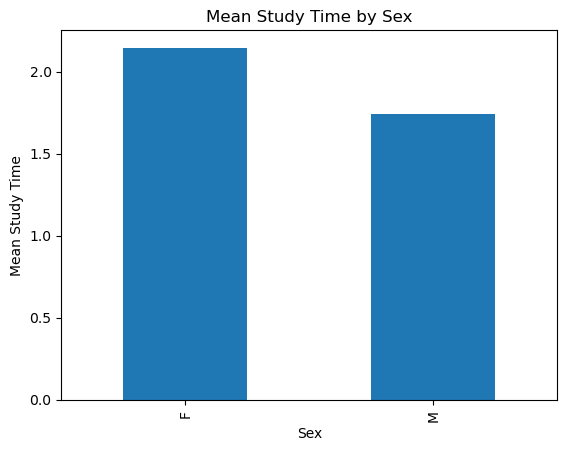

,mean,count
sex,,
F,2.15,591
M,1.74,453


In [84]:
mean_study_sex = df.groupby('sex')['study_time'].mean()
mean_study_sex.plot(kind='bar')

plt.xlabel('Sex')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Sex')
plt.show()

df.groupby('sex')['study_time'].agg(['mean', 'count']).round(2)

### School correlation

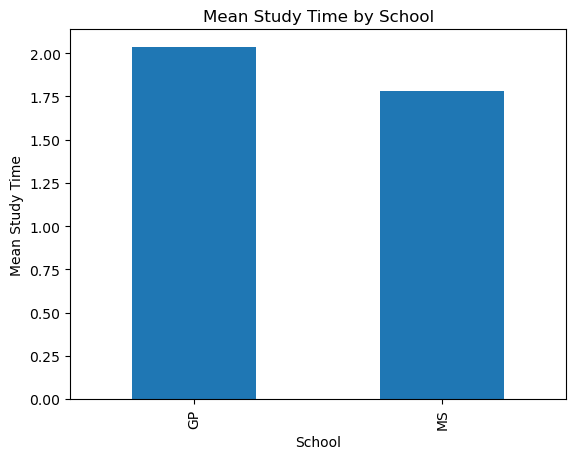

,mean,count
school,,
GP,2.04,772
MS,1.78,272


In [85]:
mean_study_school = df.groupby('school')['study_time'].mean()
mean_study_school.plot(kind='bar')

plt.xlabel('School')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by School')
plt.show()

df.groupby('school')['study_time'].agg(['mean', 'count']).round(2)

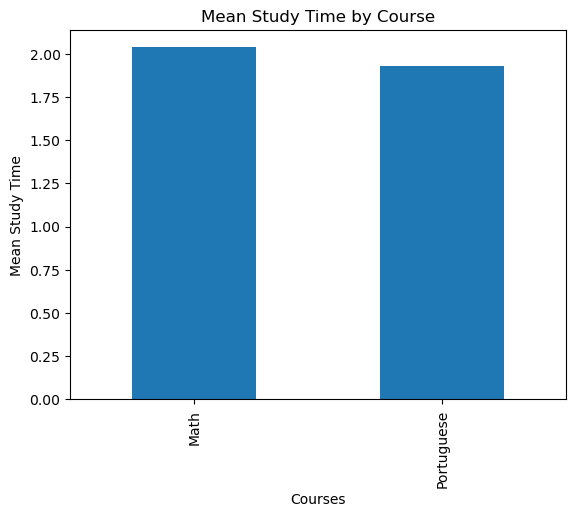

,mean,count
course,,
Math,2.04,395
Portuguese,1.93,649


In [86]:
mean_study_course = df.groupby('course')['study_time'].mean()
mean_study_course.plot(kind='bar')

plt.xlabel('Courses')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Course')
plt.show()

df.groupby('course')['study_time'].agg(['mean', 'count']).round(2)

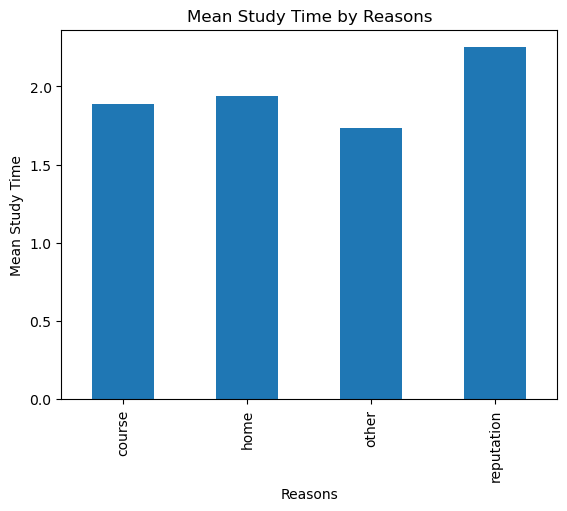

,mean,count
reason,,
course,1.89,430
home,1.94,258
other,1.73,108
reputation,2.25,248


In [87]:
mean_study_reason = df.groupby('reason')['study_time'].mean()
mean_study_reason.plot(kind='bar')

plt.xlabel('Reasons')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Reasons')
plt.show()

df.groupby('reason')['study_time'].agg(['mean', 'count']).round(2)

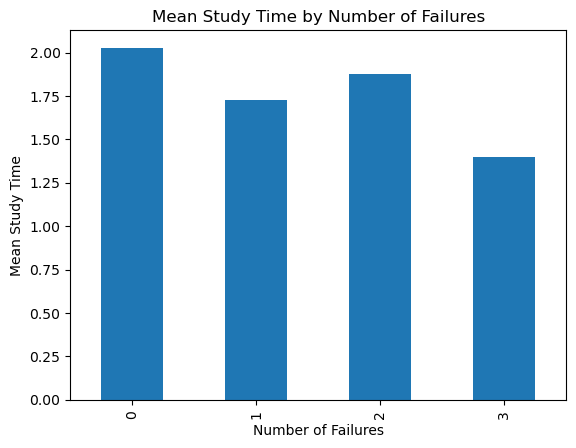

,mean,count
failures,,
0,2.03,861
1,1.72,120
2,1.88,33
3,1.40,30


In [88]:
mean_study_failures = df.groupby('failures')['study_time'].mean()
mean_study_failures.plot(kind='bar')

plt.xlabel('Number of Failures')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Number of Failures')
plt.show()

df.groupby('failures')['study_time'].agg(['mean', 'count']).round(2)

In [89]:
df.groupby(['school', 'sex', 'guardian'])['study_time'].agg(['mean', 'sum', 'count']).round(2)

mean  sum  count
school sex guardian                  
GP     F   father    2.36  196     83
           mother    2.20  661    301
           other     2.31   83     36
       M   father    1.84  158     86
           mother    1.79  444    248
           other     1.67   30     18
MS     F   father    1.98   89     45
           mother    1.85  217    117
           other     2.44   22      9
       M   father    1.38   40     29
           mother    1.68  104     62
           other     1.30   13     10

In [90]:
df.groupby(['sex', 'failures'])['study_time'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
sex failures                   
F   0         2.18  1085    497
    1         1.89   123     65
    2         2.22    40     18
    3         1.82    20     11
M   0         1.82   661    364
    1         1.53    84     55
    2         1.47    22     15
    3         1.16    22     19

In [91]:
df.groupby(['sex', 'failures'])['absences'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
sex failures                   
F   0         4.00  1989    497
    1         8.05   523     65
    2         6.11   110     18
    3         3.73    41     11
M   0         3.99  1453    364
    1         6.31   347     55
    2         4.33    65     15
    3         5.37   102     19

In [92]:
df.groupby(['school', 'reason'])['absences'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
school reason                       
GP     course      4.00  1165    291
       home        6.03  1285    213
       other       4.96   268     54
       reputation  5.36  1147    214
MS     course      2.71   377    139
       home        3.51   158     45
       other       2.48   134     54
       reputation  2.82    96     34

In [93]:
df.groupby(['school', 'reason'])['g3'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
school reason                        
GP     course      11.15  3245    291
       home        11.53  2456    213
       other       11.94   645     54
       reputation  12.31  2635    214
MS     course      10.58  1470    139
       home        10.60   477     45
       other        9.76   527     54
       reputation  11.35   386     34

In [94]:
df.groupby(['sex', 'school'])['g3'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
sex school                    
F   GP      11.68  4907    420
    MS      10.87  1859    171
M   GP      11.57  4074    352
    MS       9.91  1001    101

In [95]:
df.groupby('sex')['g3'].agg(['mean', 'sum', 'count']).round(2)

,mean,sum,count
sex,,,
F,11.45,6766,591
M,11.20,5075,453


### Support correlation

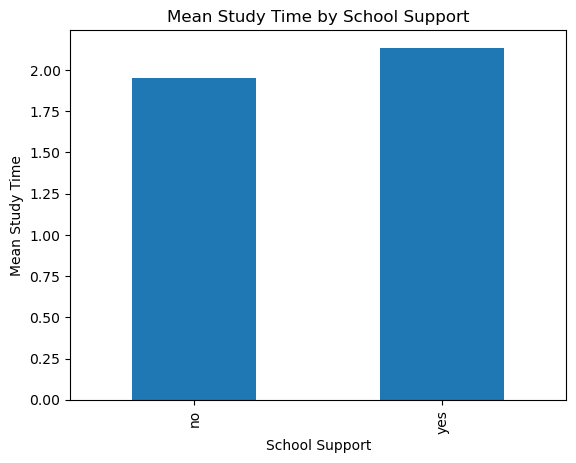

,mean,count
school_support,,
no,1.95,925
yes,2.13,119


In [96]:
mean_study_schoolsup = df.groupby('school_support')['study_time'].mean()
mean_study_schoolsup.plot(kind='bar')

plt.xlabel('School Support')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by School Support')
plt.show()

df.groupby('school_support')['study_time'].agg(['mean', 'count']).round(2)

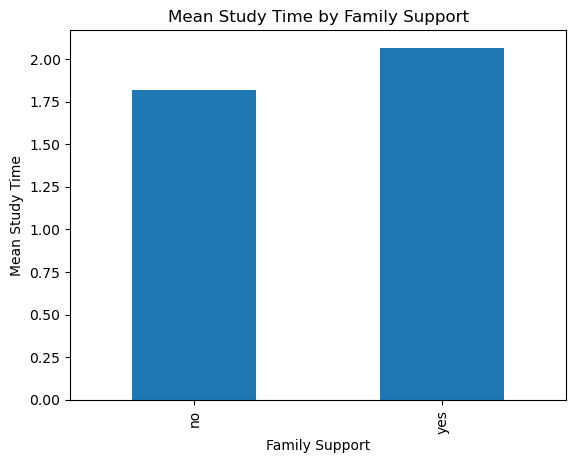

,mean,count
family_support,,
no,1.82,404
yes,2.07,640


In [97]:
mean_study_famsup = df.groupby('family_support')['study_time'].mean()
mean_study_famsup.plot(kind='bar')

plt.xlabel('Family Support')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Family Support')
plt.show()

df.groupby('family_support')['study_time'].agg(['mean', 'count']).round(2)

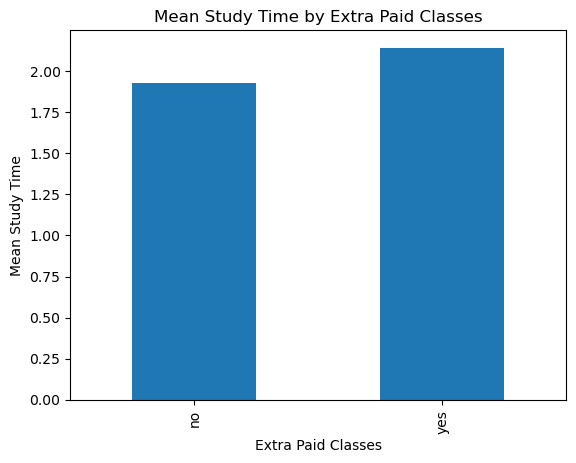

,mean,count
extra_paid_classes,,
no,1.92,824
yes,2.14,220


In [98]:
mean_study_extrapaid = df.groupby('extra_paid_classes')['study_time'].mean()
mean_study_extrapaid.plot(kind='bar')

plt.xlabel('Extra Paid Classes')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Extra Paid Classes')
plt.show()

df.groupby('extra_paid_classes')['study_time'].agg(['mean', 'count']).round(2)

In [99]:
df.groupby(['sex', 'family_support'])['study_time'].agg(['mean', 'sum', 'count']).round(2)

mean  sum  count
sex family_support                  
F   no              2.08  403    194
    yes             2.18  865    397
M   no              1.58  332    210
    yes             1.88  457    243

### Family correlation

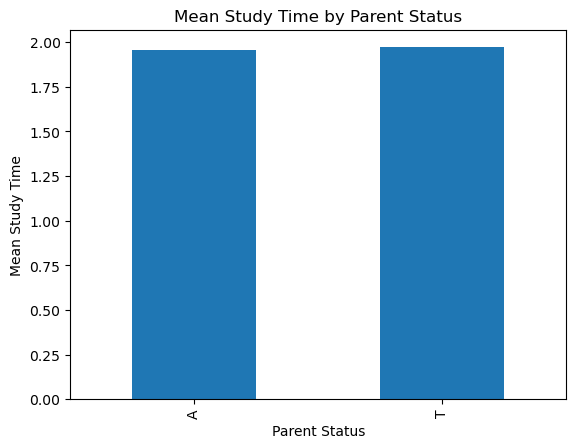

,mean,count
parent_status,,
A,1.96,121
T,1.97,923


In [100]:
mean_study_parent = df.groupby('parent_status')['study_time'].mean()
mean_study_parent.plot(kind='bar')

plt.xlabel('Parent Status')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Parent Status')
plt.show()

df.groupby('parent_status')['study_time'].agg(['mean', 'count']).round(2)

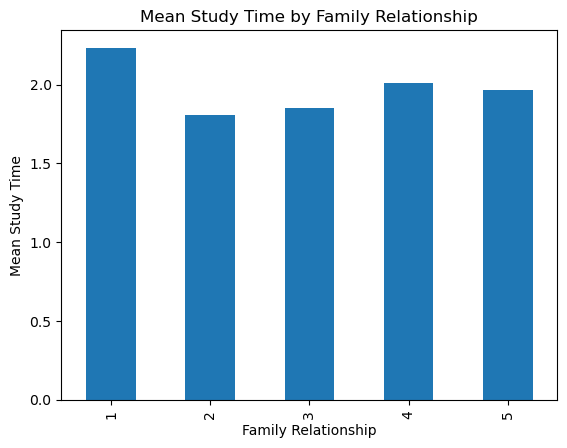

,mean,count
family_relationship,,
1,2.23,30
2,1.81,47
3,1.85,169
4,2.01,512
5,1.97,286


In [101]:
mean_study_famrel = df.groupby('family_relationship')['study_time'].mean()
mean_study_famrel.plot(kind='bar')

plt.xlabel('Family Relationship')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Family Relationship')
plt.show()

df.groupby('family_relationship')['study_time'].agg(['mean', 'count']).round(2)

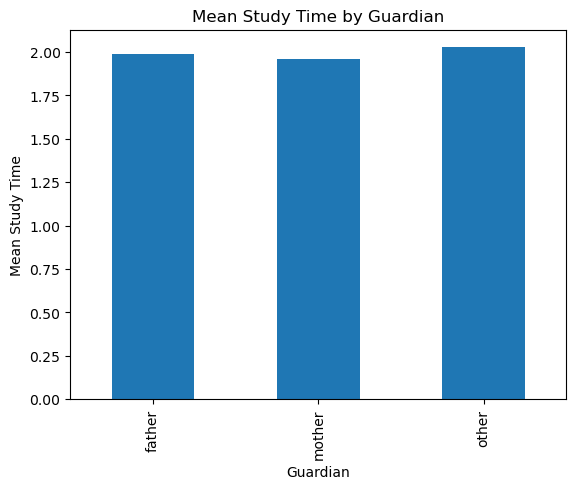

,mean,count
guardian,,
father,1.99,243
mother,1.96,728
other,2.03,73


In [102]:
mean_study_guardian = df.groupby('guardian')['study_time'].mean()
mean_study_guardian.plot(kind='bar')

plt.xlabel('Guardian')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Guardian')
plt.show()

df.groupby('guardian')['study_time'].agg(['mean', 'count']).round(2)

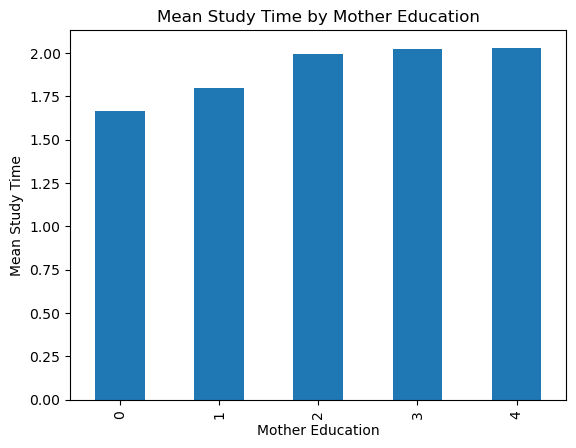

,mean,count
mother_education,,
0,1.67,9
1,1.80,202
2,2.00,289
3,2.02,238
4,2.03,306


In [103]:
mean_study_mothedu = df.groupby('mother_education')['study_time'].mean()
mean_study_mothedu.plot(kind='bar')

plt.xlabel('Mother Education')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Mother Education')
plt.show()

df.groupby('mother_education')['study_time'].agg(['mean', 'count']).round(2)

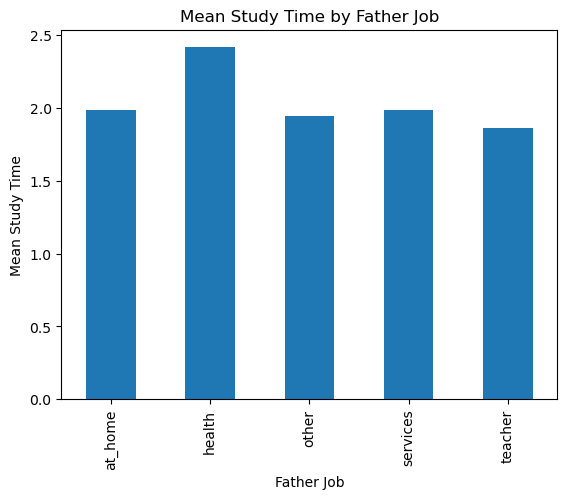

,mean,count
father_job,,
at_home,1.98,62
health,2.41,41
other,1.94,584
services,1.99,292
teacher,1.86,65


In [104]:
mean_study_fathjob = df.groupby('father_job')['study_time'].mean()
mean_study_fathjob.plot(kind='bar')

plt.xlabel('Father Job')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Father Job')
plt.show()

df.groupby('father_job')['study_time'].agg(['mean', 'count']).round(2)

### Free time correlation

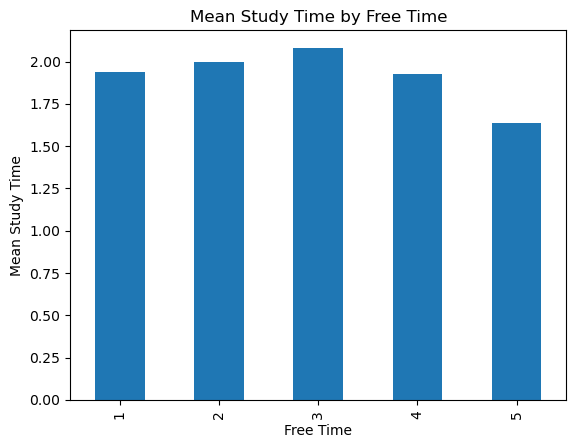

,mean,count
free_time,,
1,1.94,64
2,2.00,171
3,2.08,408
4,1.93,293
5,1.64,108


In [105]:
mean_study_freetime = df.groupby('free_time')['study_time'].mean()
mean_study_freetime.plot(kind='bar')

plt.xlabel('Free Time')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Free Time')
plt.show()

df.groupby('free_time')['study_time'].agg(['mean', 'count']).round(2)

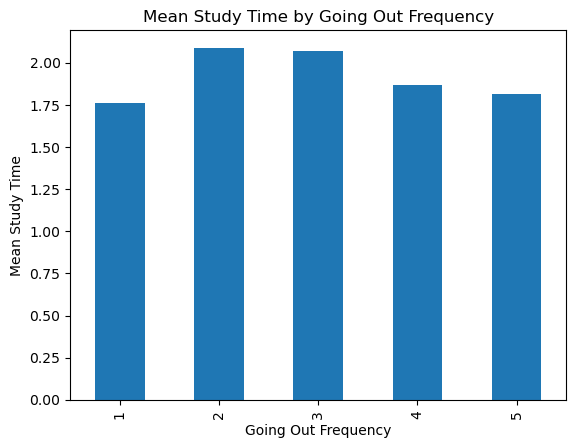

,mean,count
going_out_frequency,,
1,1.76,71
2,2.09,248
3,2.07,335
4,1.87,227
5,1.82,163


In [106]:
mean_study_goingout = df.groupby('going_out_frequency')['study_time'].mean()
mean_study_goingout.plot(kind='bar')

plt.xlabel('Going Out Frequency')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Going Out Frequency')
plt.show()

df.groupby('going_out_frequency')['study_time'].agg(['mean', 'count']).round(2)

### Alcohol and health correlation

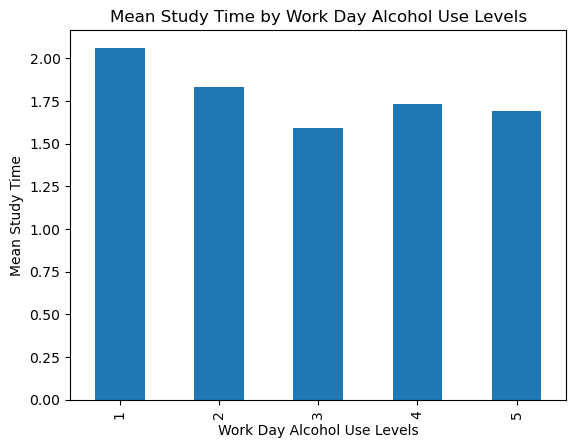

,mean,count
work_day_alcohol_use,,
1,2.06,727
2,1.83,196
3,1.59,69
4,1.73,26
5,1.69,26


In [107]:
mean_study_workday_alc = df.groupby('work_day_alcohol_use')['study_time'].mean()
mean_study_workday_alc.plot(kind='bar')

plt.xlabel('Work Day Alcohol Use Levels')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Work Day Alcohol Use Levels')
plt.show()

df.groupby('work_day_alcohol_use')['study_time'].agg(['mean', 'count']).round(2)

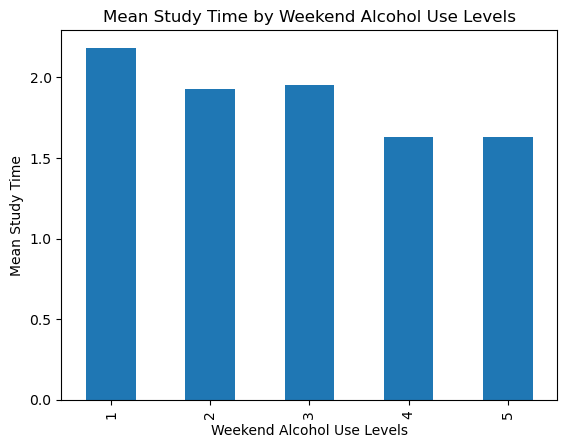

,mean,count
weekend_alcohol_use,,
1,2.18,398
2,1.93,235
3,1.96,200
4,1.63,138
5,1.63,73


In [108]:
mean_study_weekend_alc = df.groupby('weekend_alcohol_use')['study_time'].mean()
mean_study_weekend_alc.plot(kind='bar')

plt.xlabel('Weekend Alcohol Use Levels')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Weekend Alcohol Use Levels')
plt.show()

df.groupby('weekend_alcohol_use')['study_time'].agg(['mean', 'count']).round(2)

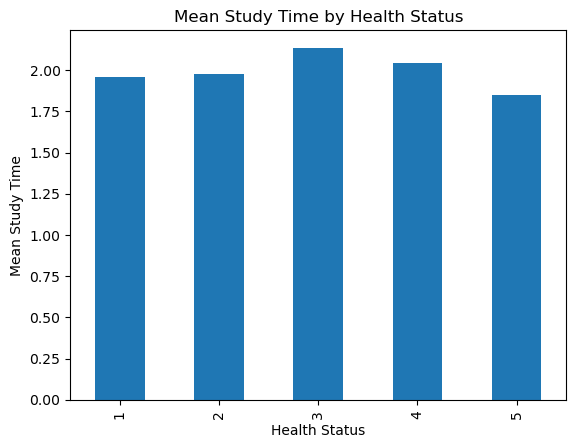

,mean,count
health_status,,
1,1.96,137
2,1.98,123
3,2.13,215
4,2.05,174
5,1.85,395


In [109]:
mean_study_health = df.groupby('health_status')['study_time'].mean()
mean_study_health.plot(kind='bar')

plt.xlabel('Health Status')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Health Status')
plt.show()

df.groupby('health_status')['study_time'].agg(['mean', 'count']).round(2)

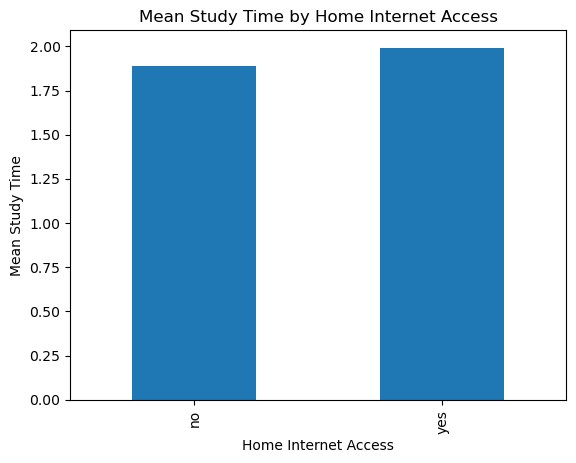

,mean,count
home_internet_access,,
no,1.89,217
yes,1.99,827


In [110]:
mean_study_internet = df.groupby('home_internet_access')['study_time'].mean()
mean_study_internet.plot(kind='bar')

plt.xlabel('Home Internet Access')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Home Internet Access')
plt.show()

df.groupby('home_internet_access')['study_time'].agg(['mean', 'count']).round(2)

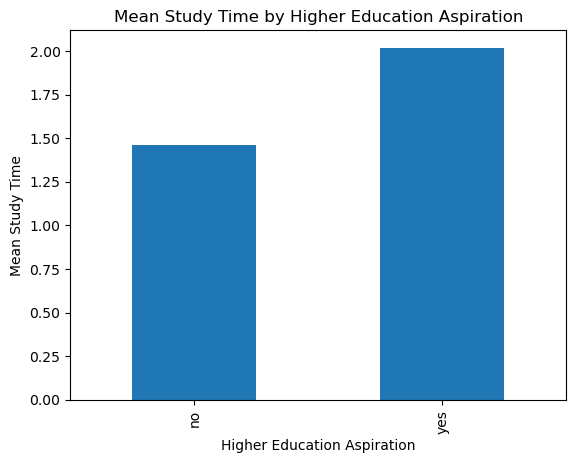

,mean,count
higher_education_aspiration,,
no,1.46,89
yes,2.02,955


In [111]:
mean_study_eduasp = df.groupby('higher_education_aspiration')['study_time'].mean()
mean_study_eduasp.plot(kind='bar')

plt.xlabel('Higher Education Aspiration')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Higher Education Aspiration')
plt.show()

df.groupby('higher_education_aspiration')['study_time'].agg(['mean', 'count']).round(2)

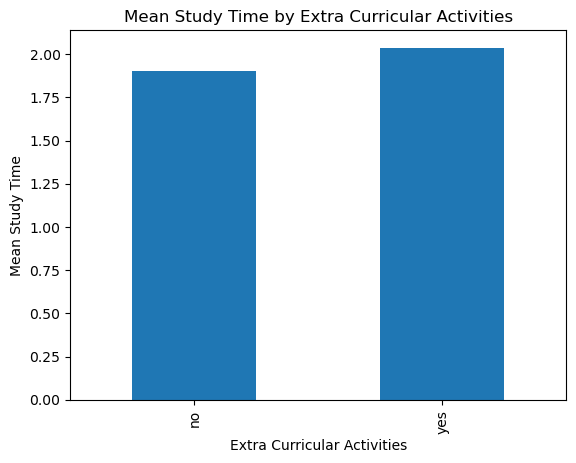

,mean,count
extra_curricular_activities,,
no,1.91,528
yes,2.04,516


In [112]:
mean_study_extracurr = df.groupby('extra_curricular_activities')['study_time'].mean()
mean_study_extracurr.plot(kind='bar')

plt.xlabel('Extra Curricular Activities')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Extra Curricular Activities')
plt.show()

df.groupby('extra_curricular_activities')['study_time'].agg(['mean', 'count']).round(2)

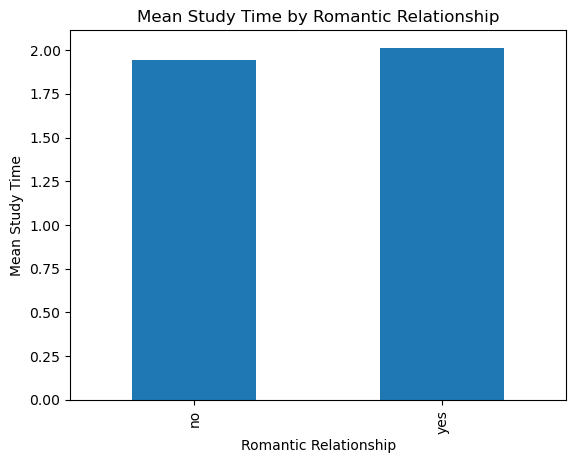

,mean,count
home_internet_access,,
no,1.89,217
yes,1.99,827


In [113]:
mean_study_relationship = df.groupby('in_relationship')['study_time'].mean()
mean_study_relationship.plot(kind='bar')

plt.xlabel('Romantic Relationship')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Romantic Relationship')
plt.show()

df.groupby('home_internet_access')['study_time'].agg(['mean', 'count']).round(2)

In [114]:
# analysing correlations between family situation and study time
df.groupby(['family_relationship', 'guardian'])['study_time'].agg(['mean', 'sum', 'count']).round(2)

mean  sum  count
family_relationship guardian                  
1                   father    4.00    8      2
                    mother    2.08   52     25
                    other     2.33    7      3
2                   father    2.11   19      9
                    mother    1.68   57     34
                    other     2.25    9      4
3                   father    1.68   89     53
                    mother    1.92  203    106
                    other     2.10   21     10
4                   father    2.19  250    114
                    mother    1.94  697    359
                    other     2.13   83     39
5                   father    1.80  117     65
                    mother    2.04  417    204
                    other     1.65   28     17

In [115]:
df.groupby(['parent_status', 'guardian'])['study_time'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
parent_status guardian                   
A             father    2.00    20     10
              mother    1.95   185     95
              other     2.00    32     16
T             father    1.99   463    233
              mother    1.96  1241    633
              other     2.04   116     57

In [116]:
df.groupby(['family_relationship', 'parent_status'])['study_time'].agg(['mean', 'sum', 'count']).round(2)

mean  sum  count
family_relationship parent_status                  
1                   A              2.71   19      7
                    T              2.09   48     23
2                   A              2.11   19      9
                    T              1.74   66     38
3                   A              1.94   33     17
                    T              1.84  280    152
4                   A              1.96  104     53
                    T              2.02  926    459
5                   A              1.77   62     35
                    T              1.99  500    251

In [117]:
df.groupby(['guardian', 'family_relationship'])['study_time'].agg(['mean', 'sum', 'count']).round(2)

mean  sum  count
guardian family_relationship                  
father   1                    4.00    8      2
         2                    2.11   19      9
         3                    1.68   89     53
         4                    2.19  250    114
         5                    1.80  117     65
mother   1                    2.08   52     25
         2                    1.68   57     34
         3                    1.92  203    106
         4                    1.94  697    359
         5                    2.04  417    204
other    1                    2.33    7      3
         2                    2.25    9      4
         3                    2.10   21     10
         4                    2.13   83     39
         5                    1.65   28     17

In [118]:
df.groupby(['guardian', 'parent_status'])['study_time'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
guardian parent_status                   
father   A              2.00    20     10
         T              1.99   463    233
mother   A              1.95   185     95
         T              1.96  1241    633
other    A              2.00    32     16
         T              2.04   116     57

In [119]:
df.groupby(['guardian', 'family_relationship'])['study_time'].agg(['mean', 'sum', 'count']).round(2)

mean  sum  count
guardian family_relationship                  
father   1                    4.00    8      2
         2                    2.11   19      9
         3                    1.68   89     53
         4                    2.19  250    114
         5                    1.80  117     65
mother   1                    2.08   52     25
         2                    1.68   57     34
         3                    1.92  203    106
         4                    1.94  697    359
         5                    2.04  417    204
other    1                    2.33    7      3
         2                    2.25    9      4
         3                    2.10   21     10
         4                    2.13   83     39
         5                    1.65   28     17

## EDA on grades

### Correlation among G1, G2 and G3

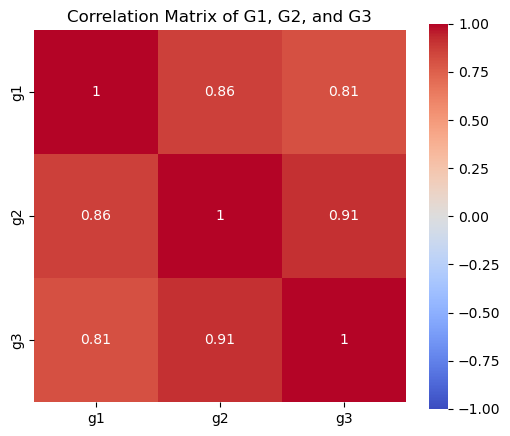

In [120]:
# checking correlation between g1, g2 and g3
corr_matrix_grades = df[['g1','g2','g3']].corr().round(2)

plt.figure(figsize=(6,5))

sns.heatmap(
    corr_matrix_grades,
    annot=True,      
    cmap='coolwarm',     
    vmin=-1, vmax=1,
    square=True
)

plt.title('Correlation Matrix of G1, G2, and G3')
plt.show()

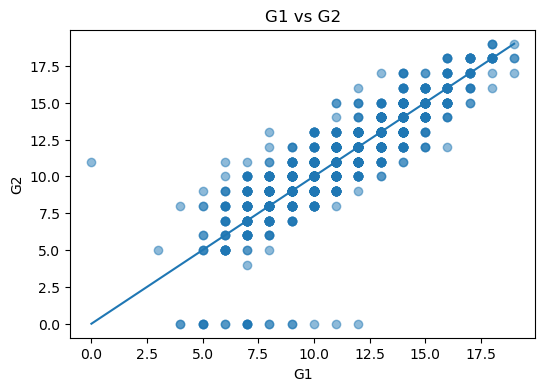

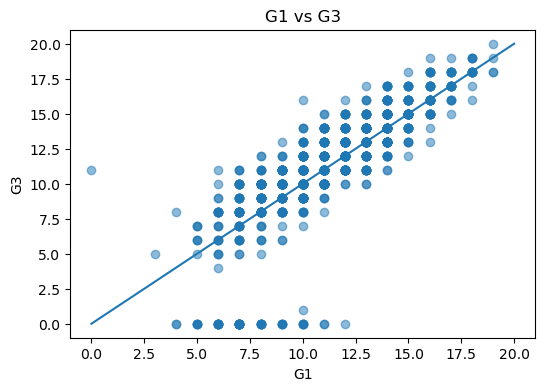

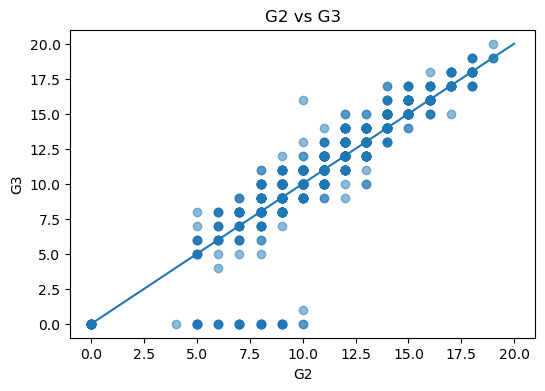

In [121]:
pairs = [('g1','g2'), ('g1','g3'), ('g2','g3')]

for x, y in pairs:
    plt.figure(figsize=(6,4))
    plt.scatter(df[x], df[y], alpha=0.5)
    plt.xlabel(x.upper())
    plt.ylabel(y.upper())
    plt.title(f'{x.upper()} vs {y.upper()}')

    mn = min(df[x].min(), df[y].min())
    mx = max(df[x].max(), df[y].max())
    plt.plot([mn, mx], [mn, mx])  # y = x

    plt.show()

In [122]:
change_summary = df.assign(
    change_g2_g1 = df['g2'] - df['g1'],
    change_g3_g2 = df['g3'] - df['g2'],
    change_g3_g1 = df['g3'] - df['g1'],
)[['change_g2_g1','change_g3_g2','change_g3_g1']].agg(['mean','median','std']).round(2)

change_summary

,change_g2_g1,change_g3_g2,change_g3_g1
mean,0.03,0.10,0.13
median,0.00,0.00,0.00
std,1.69,1.61,2.28


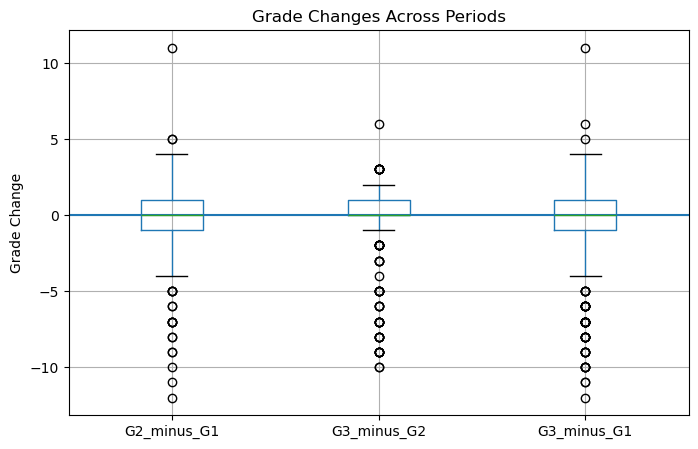

In [123]:
changes = df.assign(
    G2_minus_G1 = df['g2'] - df['g1'],
    G3_minus_G2 = df['g3'] - df['g2'],
    G3_minus_G1 = df['g3'] - df['g1']
)[['G2_minus_G1','G3_minus_G2','G3_minus_G1']]

plt.figure(figsize=(8,5))
changes.boxplot()
plt.axhline(0) 
plt.ylabel('Grade Change')
plt.title('Grade Changes Across Periods')
plt.show()

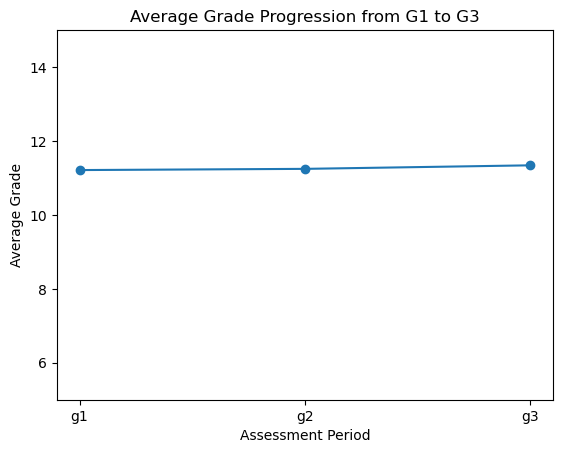

In [124]:
# Evolution of the grades
mean_grades = [
    df['g1'].mean(),
    df['g2'].mean(),
    df['g3'].mean()
]

plt.plot(['g1', 'g2', 'g3'], mean_grades, marker='o')
plt.xlabel('Assessment Period')
plt.ylabel('Average Grade')
plt.title('Average Grade Progression from G1 to G3')
plt.ylim(5, 15)
plt.show()

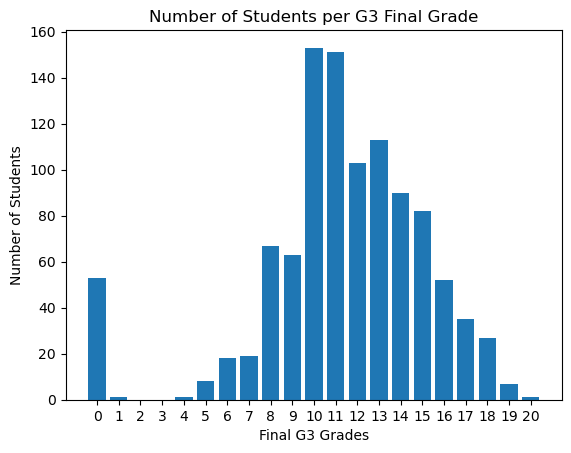

,Final G3 Grade,Number of Students
0,0,53
1,1,1
2,2,0
3,3,0
4,4,1
5,5,8
6,6,18
7,7,19
8,8,67
9,9,63


In [125]:
# counting number of students for each G3 grade
g3_counts = df['g3'].value_counts().sort_index()
g3_counts = g3_counts.reindex(range(0, 21), fill_value=0)

plt.bar(g3_counts.index, g3_counts.values)
plt.xlabel('Final G3 Grades')
plt.ylabel('Number of Students')
plt.title('Number of Students per G3 Final Grade')
plt.xticks(range(0, 21))
plt.show()

g3_grade_df = (
    df['g3']
    .value_counts()
    .sort_index()
    .reindex(range(0, 21), fill_value=0)
    .reset_index()
)
g3_grade_df.columns = ['Final G3 Grade', 'Number of Students']
g3_grade_df

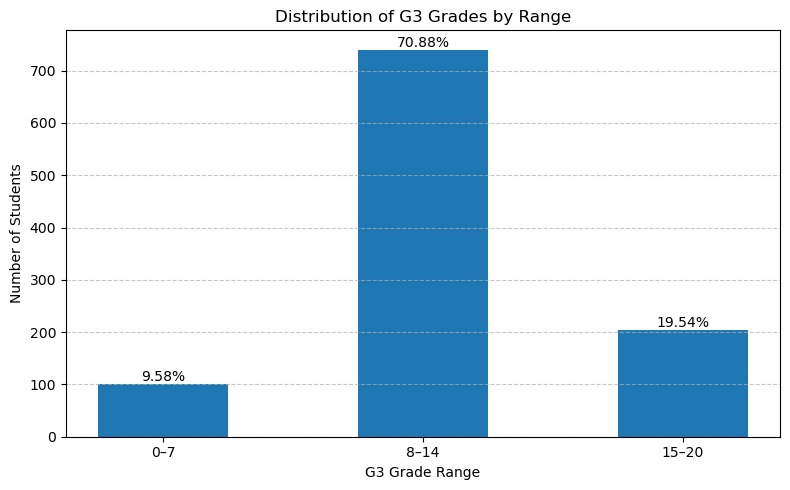

  G3 Range  Number of Students  Percentage (%)
0      0–7                 100            9.58
1     8–14                 740           70.88
2    15–20                 204           19.54


In [126]:
bins = [0, 7, 14, 20]
labels = ['0–7', '8–14', '15–20']

# Counting students per bin without creating a new column
table = pd.cut(df['g3'], bins=bins, labels=labels, include_lowest=True).value_counts().sort_index()

table = table.reset_index()
table.columns = ['G3 Range', 'Number of Students']

total = table['Number of Students'].sum()
table['Percentage (%)'] = (table['Number of Students'] / total * 100).round(2)

plt.figure(figsize=(8,5))
bars = plt.bar(table['G3 Range'], table['Number of Students'], width=0.5)

plt.title("Distribution of G3 Grades by Range")
plt.xlabel("G3 Grade Range")
plt.ylabel("Number of Students")
plt.grid(axis='y', linestyle='--', alpha=0.7)

for bar, pct in zip(bars, table['Percentage (%)']):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2,
             height,
             f"{pct}%",
             ha='center',
             va='bottom')

plt.tight_layout()
plt.show()

print(table)

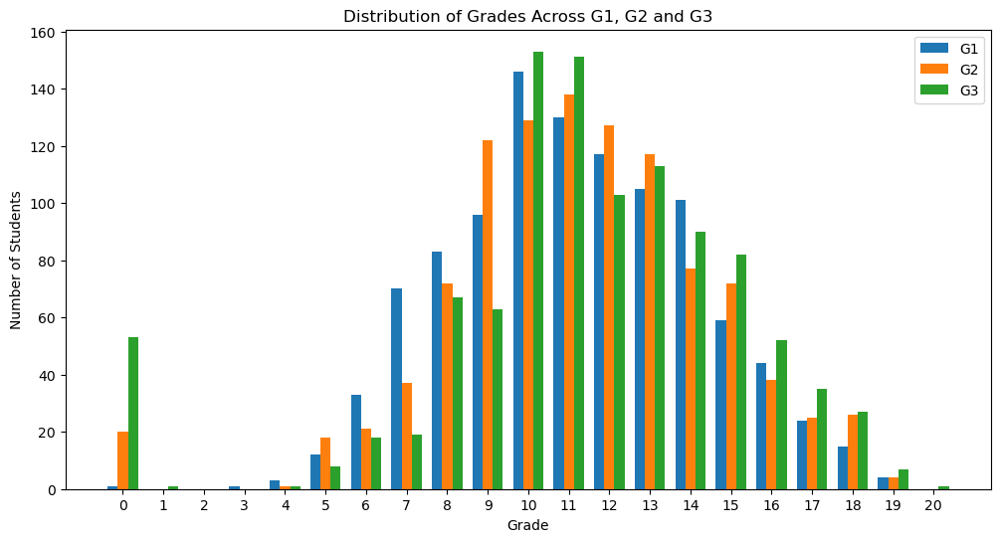

In [127]:
# Counting grades 0–20 for each period
g1_counts = df['g1'].value_counts().sort_index().reindex(range(0, 21), fill_value=0)
g2_counts = df['g2'].value_counts().sort_index().reindex(range(0, 21), fill_value=0)
g3_counts = df['g3'].value_counts().sort_index().reindex(range(0, 21), fill_value=0)

x = np.arange(0, 21)  
width = 0.25          

plt.figure(figsize=(12, 6))

plt.bar(x - width, g1_counts.values, width=width, label='G1')
plt.bar(x,         g2_counts.values, width=width, label='G2')
plt.bar(x + width, g3_counts.values, width=width, label='G3')

plt.xlabel('Grade')
plt.ylabel('Number of Students')
plt.title('Distribution of Grades Across G1, G2 and G3')
plt.xticks(x)
plt.legend()

plt.show()


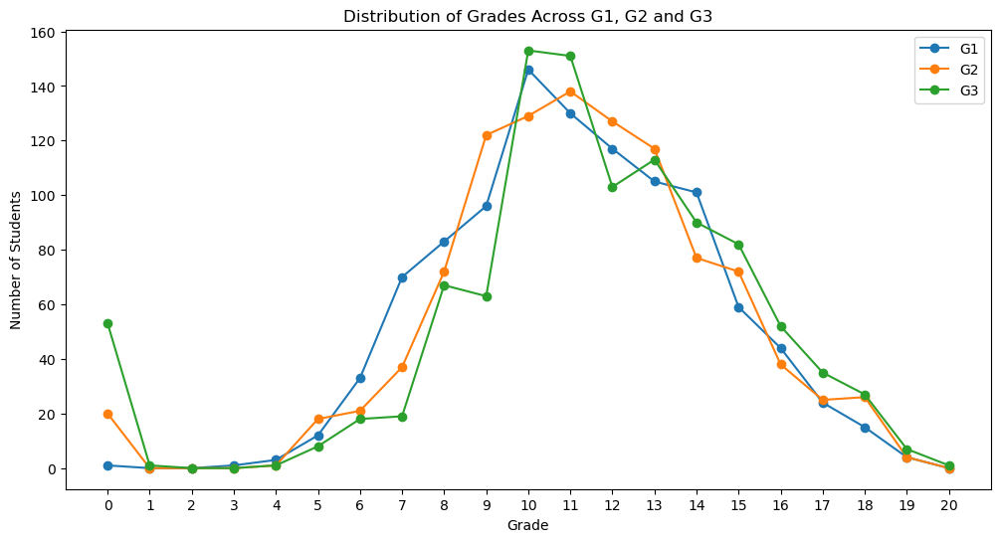

In [128]:
import matplotlib.pyplot as plt
import numpy as np

# Counting grades 0–20 for each period
g1_counts = df['g1'].value_counts().sort_index().reindex(range(0, 21), fill_value=0)
g2_counts = df['g2'].value_counts().sort_index().reindex(range(0, 21), fill_value=0)
g3_counts = df['g3'].value_counts().sort_index().reindex(range(0, 21), fill_value=0)

x = np.arange(0, 21)

plt.figure(figsize=(12, 6))

plt.plot(x, g1_counts.values, marker='o', label='G1')
plt.plot(x, g2_counts.values, marker='o', label='G2')
plt.plot(x, g3_counts.values, marker='o', label='G3')

plt.xlabel('Grade')
plt.ylabel('Number of Students')
plt.title('Distribution of Grades Across G1, G2 and G3')
plt.xticks(x)
plt.legend()

plt.show()


In [129]:
df.groupby('g1')['g3'].agg(['mean', 'count']).round(2)

,mean,count
g1,,
0,11.00,1
3,5.00,1
4,2.67,3
5,3.67,12
6,5.30,33
7,6.30,70
8,8.16,83
9,9.23,96
10,10.18,146


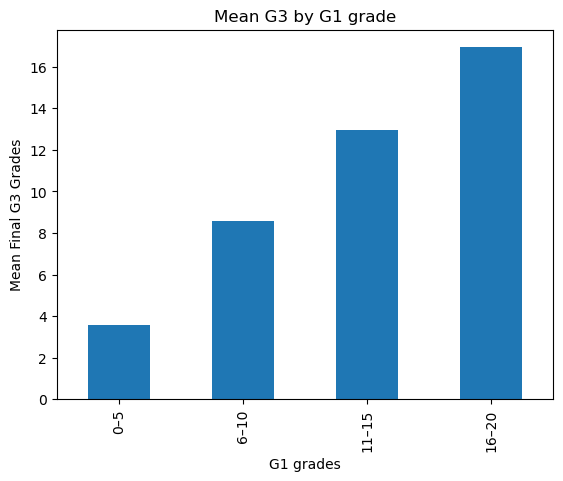

In [130]:
df['g1_bin'] = pd.cut(
    df['g1'],
    bins=[0, 5, 10, 15, 20],
    labels=['0–5', '6–10', '11–15', '16–20']
)
mean_g3_by_g1 = df.groupby('g1_bin')['g3'].mean()

mean_g3_by_g1.plot(kind='bar')

plt.xlabel('G1 grades')
plt.ylabel('Mean Final G3 Grades')
plt.title('Mean G3 by G1 grade')
plt.show()

In [131]:
df.groupby('g2')['g3'].agg(['mean', 'count']).round(2)

,mean,count
g2,,
0,0.00,20
4,0.00,1
5,3.56,18
6,5.29,21
7,6.05,37
8,7.75,72
9,9.03,122
10,10.13,129
11,11.14,138


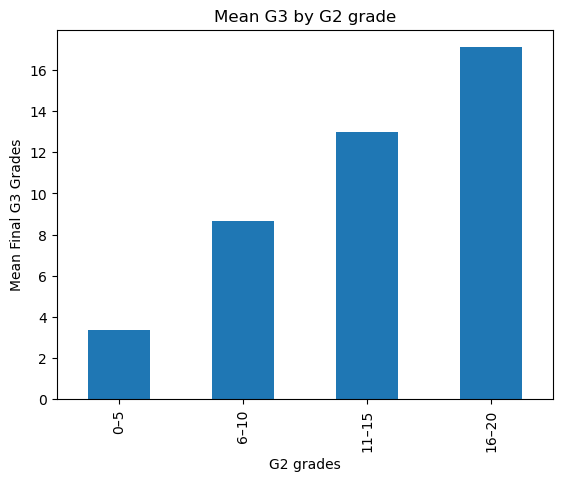

In [132]:
df['g2_bin'] = pd.cut(
    df['g2'],
    bins=[0, 5, 10, 15, 20],
    labels=['0–5', '6–10', '11–15', '16–20']
)
mean_g3_by_g2 = df.groupby('g2_bin')['g3'].mean()

mean_g3_by_g2.plot(kind='bar')

plt.xlabel('G2 grades')
plt.ylabel('Mean Final G3 Grades')
plt.title('Mean G3 by G2 grade')
plt.show()

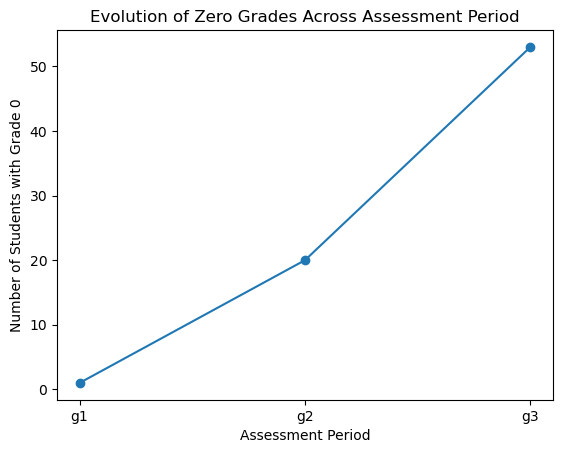

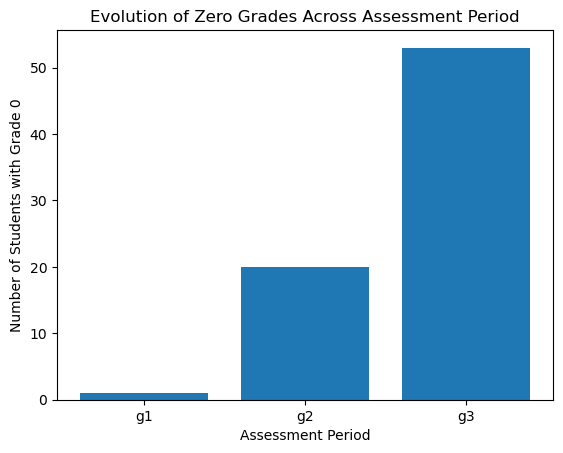

,Assessment Period,Zero Grade Count
0,g1,1
1,g2,20
2,g3,53


In [133]:
# Tracking the evolution of grade 0 over the three grading periods

zero_grade_counts = [
    (df['g1'] == 0).sum(),
    (df['g2'] == 0).sum(),
    (df['g3'] == 0).sum()
]

periods = ['g1', 'g2', 'g3']

plt.plot(periods, zero_grade_counts, marker='o')
plt.xlabel('Assessment Period')
plt.ylabel('Number of Students with Grade 0')
plt.title('Evolution of Zero Grades Across Assessment Period')
plt.show()

plt.bar(periods, zero_grade_counts)
plt.xlabel('Assessment Period')
plt.ylabel('Number of Students with Grade 0')
plt.title('Evolution of Zero Grades Across Assessment Period')
plt.show()

zero_grade_df = pd.DataFrame({
    'Assessment Period': ['g1', 'g2', 'g3'],
    'Zero Grade Count': [
        (df['g1'] == 0).sum(),
        (df['g2'] == 0).sum(),
        (df['g3'] == 0).sum()
    ]
})
zero_grade_df

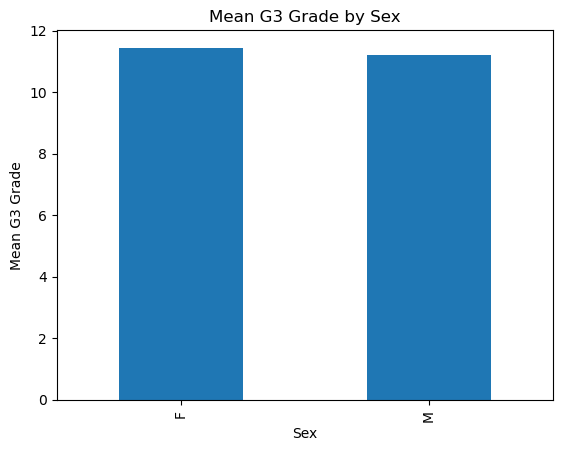

,mean,count
sex,,
F,11.45,591
M,11.20,453


In [134]:
mean_g3_sex = df.groupby('sex')['g3'].mean()
mean_g3_sex.plot(kind='bar')

plt.xlabel('Sex')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Sex')
plt.show()

df.groupby('sex')['g3'].agg(['mean', 'count']).round(2)

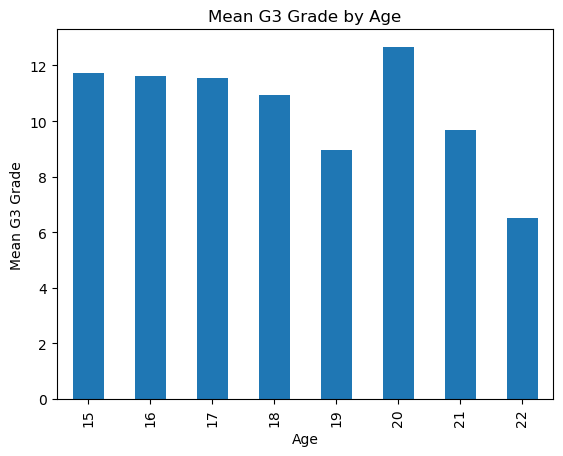

,mean,count
age,,
15,11.75,194
16,11.64,281
17,11.56,277
18,10.95,222
19,8.96,56
20,12.67,9
21,9.67,3
22,6.50,2


In [135]:
mean_g3_age = df.groupby('age')['g3'].mean()
mean_g3_age.plot(kind='bar')

plt.xlabel('Age')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Age')
plt.show()

df.groupby('age')['g3'].agg(['mean', 'count']).round(2)

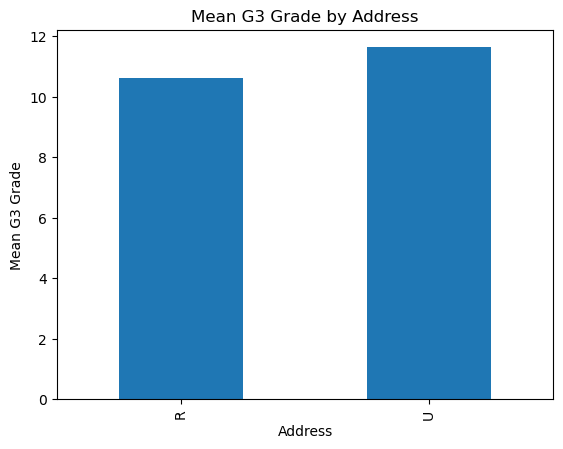

,mean,count
address,,
R,10.60,285
U,11.62,759


In [136]:
mean_g3_address = df.groupby('address')['g3'].mean()
mean_g3_address.plot(kind='bar')

plt.xlabel('Address')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Address')
plt.show()

df.groupby('address')['g3'].agg(['mean', 'count']).round(2)

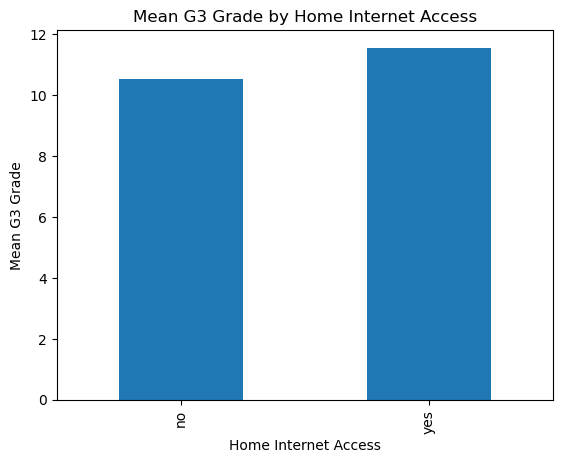

,mean,count
home_internet_access,,
no,10.53,217
yes,11.55,827


In [137]:
mean_g3_internet = df.groupby('home_internet_access')['g3'].mean()
mean_g3_internet.plot(kind='bar')

plt.xlabel('Home Internet Access')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Home Internet Access')
plt.show()

df.groupby('home_internet_access')['g3'].agg(['mean', 'count']).round(2)

In [138]:
df.groupby(['address', 'home_internet_access'])['g3'].agg(['mean', 'sum', 'count']).round(2)

mean   sum  count
address home_internet_access                    
R       no                    10.61  1019     96
        yes                   10.59  2002    189
U       no                    10.47  1267    121
        yes                   11.84  7553    638

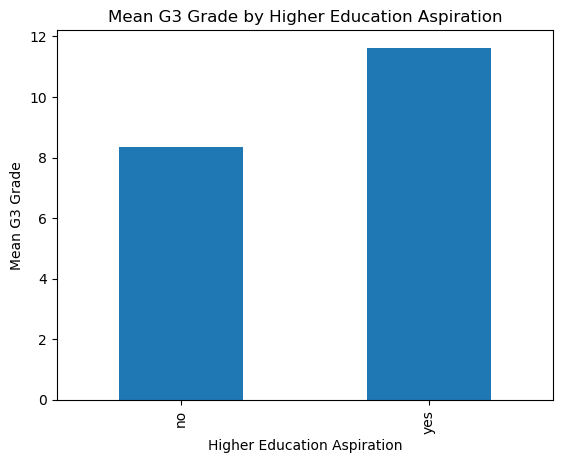

,mean,count
higher_education_aspiration,,
no,8.35,89
yes,11.62,955


In [139]:
mean_g3_eduasp = df.groupby('higher_education_aspiration')['g3'].mean()
mean_g3_eduasp.plot(kind='bar')

plt.xlabel('Higher Education Aspiration')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Higher Education Aspiration')
plt.show()

df.groupby('higher_education_aspiration')['g3'].agg(['mean', 'count']).round(2)

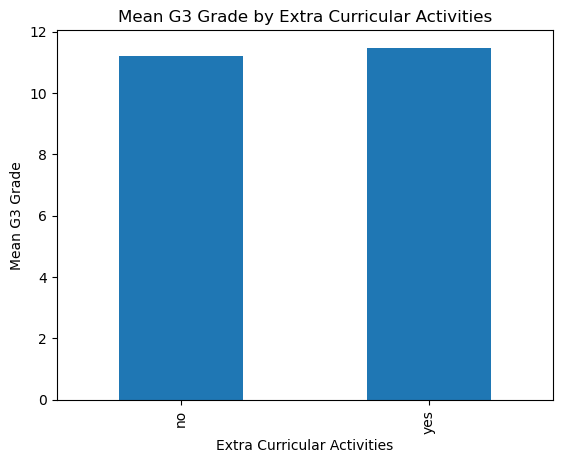

,mean,count
extra_curricular_activities,,
no,11.21,528
yes,11.47,516


In [140]:
mean_g3_extracurr = df.groupby('extra_curricular_activities')['g3'].mean()
mean_g3_extracurr.plot(kind='bar')

plt.xlabel('Extra Curricular Activities')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Extra Curricular Activities')
plt.show()

df.groupby('extra_curricular_activities')['g3'].agg(['mean', 'count']).round(2)

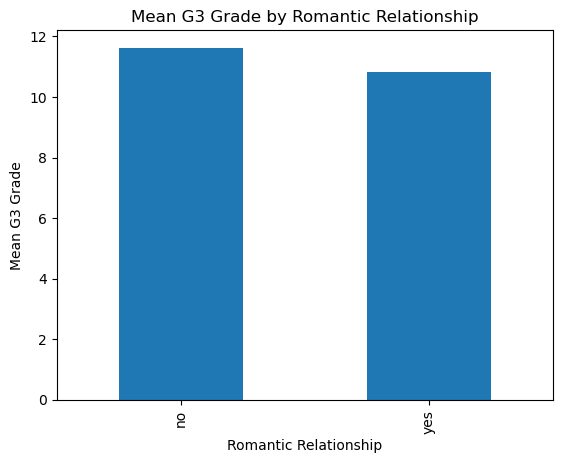

,mean,count
in_relationship,,
no,11.62,673
yes,10.83,371


In [141]:
mean_g3_relation = df.groupby('in_relationship')['g3'].mean()
mean_g3_relation.plot(kind='bar')

plt.xlabel('Romantic Relationship')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Romantic Relationship')
plt.show()

df.groupby('in_relationship')['g3'].agg(['mean', 'count']).round(2)

### School correlation

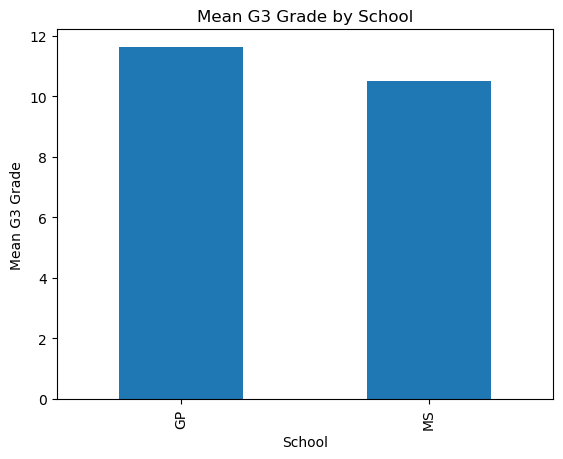

,mean,count
school,,
GP,11.63,772
MS,10.51,272


In [142]:
mean_g3_school = df.groupby('school')['g3'].mean()
mean_g3_school.plot(kind='bar')

plt.xlabel('School')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by School')
plt.show()

df.groupby('school')['g3'].agg(['mean', 'count']).round(2)

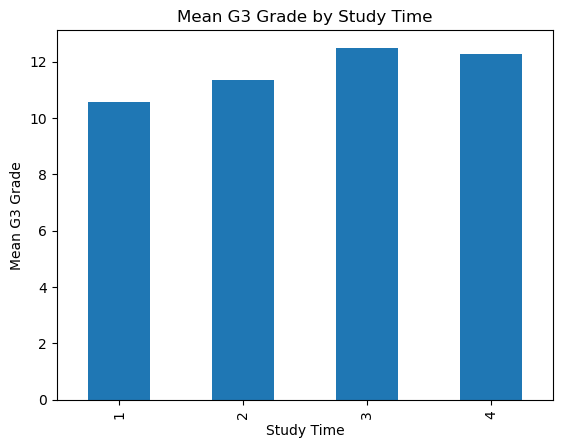

,mean,count
study_time,,
1,10.58,317
2,11.34,503
3,12.49,162
4,12.27,62


In [143]:
mean_g3_study = df.groupby('study_time')['g3'].mean()
mean_g3_study.plot(kind='bar')

plt.xlabel('Study Time')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Study Time')
plt.show()

df.groupby('study_time')['g3'].agg(['mean', 'count']).round(2)

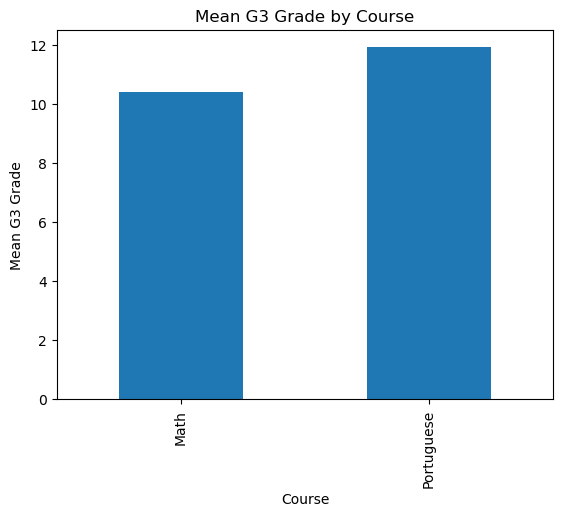

,mean,count
course,,
Math,10.42,395
Portuguese,11.91,649


In [144]:
mean_g3_course = df.groupby('course')['g3'].mean()
mean_g3_course.plot(kind='bar')

plt.xlabel('Course')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Course')
plt.show()

df.groupby('course')['g3'].agg(['mean', 'count']).round(2)

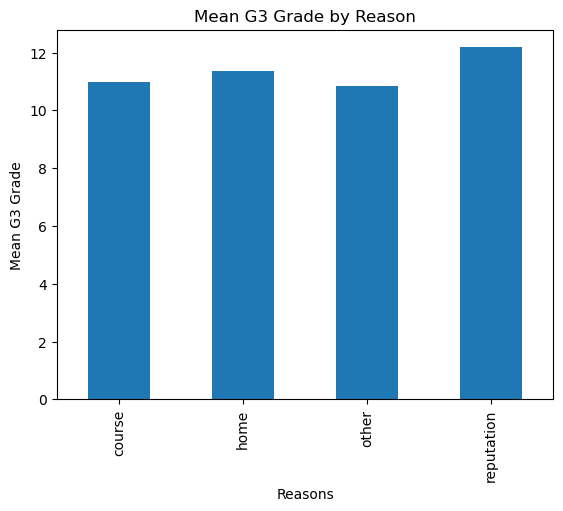

,mean,count
reason,,
course,10.97,430
home,11.37,258
other,10.85,108
reputation,12.18,248


In [145]:
mean_g3_reason = df.groupby('reason')['g3'].mean()
mean_g3_reason.plot(kind='bar')

plt.xlabel('Reasons')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Reason')
plt.show()

df.groupby('reason')['g3'].agg(['mean', 'count']).round(2)

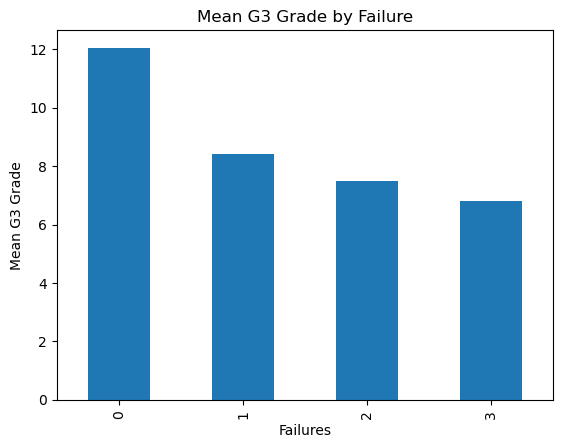

,mean,count
failures,,
0,12.05,861
1,8.43,120
2,7.48,33
3,6.80,30


In [146]:
mean_g3_failure = df.groupby('failures')['g3'].mean()
mean_g3_failure.plot(kind='bar')

plt.xlabel('Failures')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Failure')
plt.show()

df.groupby('failures')['g3'].agg(['mean', 'count']).round(2)

### Support Correlation

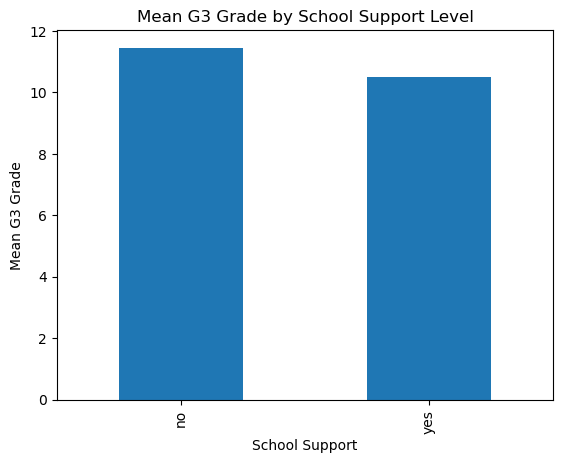

,mean,count
school_support,,
no,11.45,925
yes,10.49,119


In [147]:
mean_g3_schoolsup = df.groupby('school_support')['g3'].mean()
mean_g3_schoolsup.plot(kind='bar')

plt.xlabel('School Support')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by School Support Level')
plt.show()

df.groupby('school_support')['g3'].agg(['mean', 'count']).round(2)

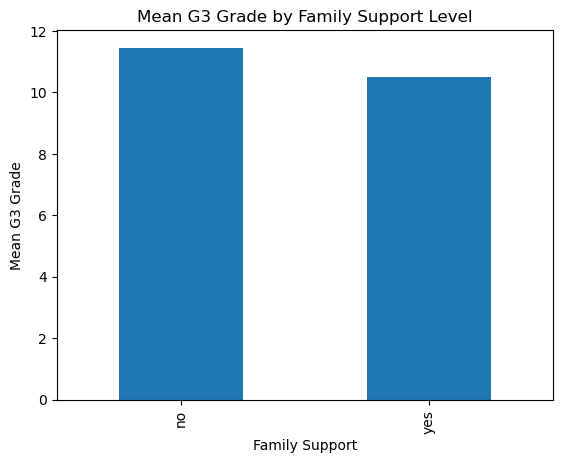

,mean,count
family_support,,
no,11.28,404
yes,11.38,640


In [148]:
mean_g3_famsup = df.groupby('school_support')['g3'].mean()
mean_g3_famsup.plot(kind='bar')

plt.xlabel('Family Support')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Family Support Level')
plt.show()

df.groupby('family_support')['g3'].agg(['mean', 'count']).round(2)

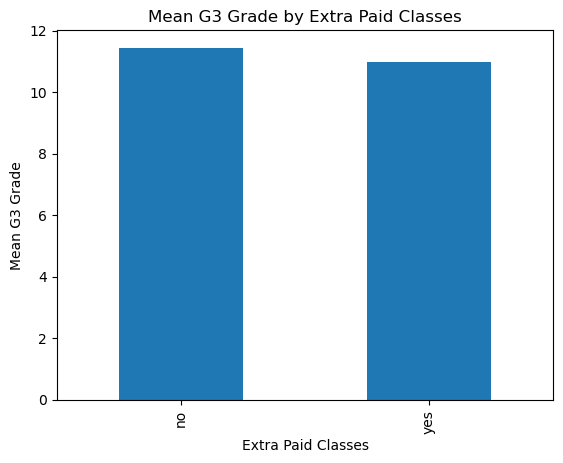

,mean,count
extra_paid_classes,,
no,11.44,824
yes,10.97,220


In [149]:
mean_g3_extrapaid = df.groupby('extra_paid_classes')['g3'].mean()
mean_g3_extrapaid.plot(kind='bar')

plt.xlabel('Extra Paid Classes')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Extra Paid Classes')
plt.show()

df.groupby('extra_paid_classes')['g3'].agg(['mean', 'count']).round(2)

### Family Correlation

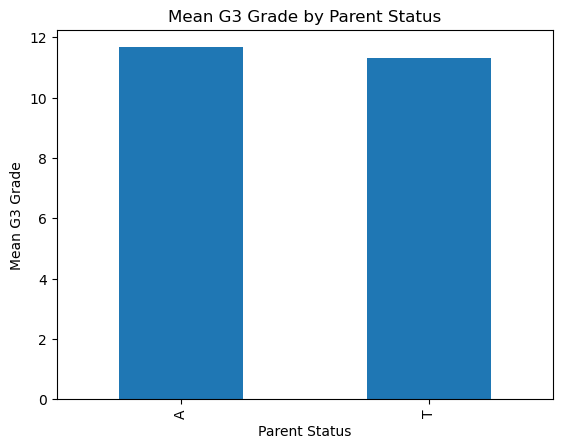

,mean,count
parent_status,,
A,11.67,121
T,11.30,923


In [150]:
mean_g3_parentstatus = df.groupby('parent_status')['g3'].mean()
mean_g3_parentstatus.plot(kind='bar')

plt.xlabel('Parent Status')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Parent Status')
plt.show()

df.groupby('parent_status')['g3'].agg(['mean', 'count']).round(2)

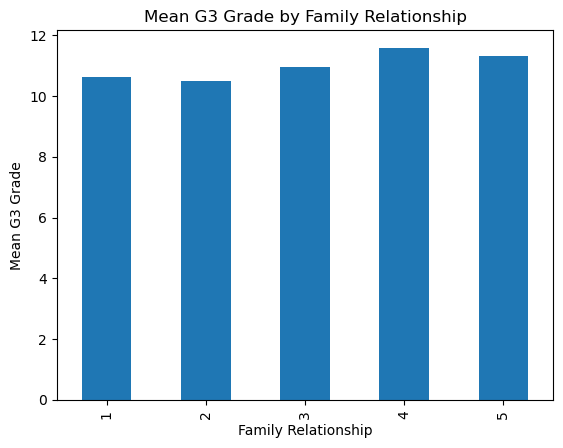

,mean,count
family_relationship,,
1,10.63,30
2,10.49,47
3,10.97,169
4,11.59,512
5,11.34,286


In [151]:
mean_g3_famrel = df.groupby('family_relationship')['g3'].mean()
mean_g3_famrel.plot(kind='bar')

plt.xlabel('Family Relationship')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Family Relationship')
plt.show()

df.groupby('family_relationship')['g3'].agg(['mean', 'count']).round(2)

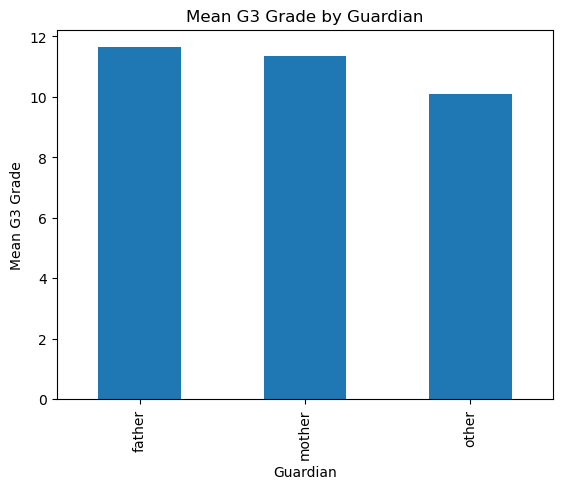

,mean,count
guardian,,
father,11.64,243
mother,11.37,728
other,10.10,73


In [152]:
mean_g3_guardian = df.groupby('guardian')['g3'].mean()
mean_g3_guardian.plot(kind='bar')

plt.xlabel('Guardian')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Guardian')
plt.show()

df.groupby('guardian')['g3'].agg(['mean', 'count']).round(2)

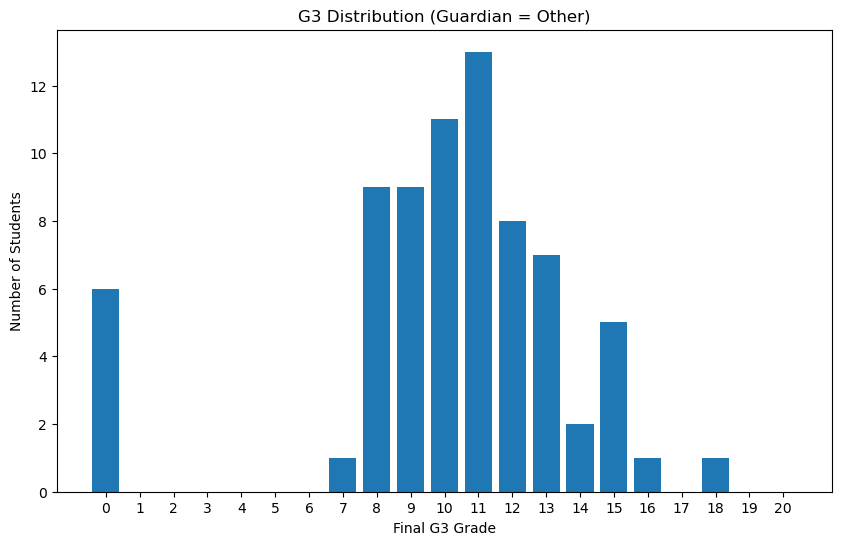

In [153]:
# Filtering students whose guardian is "other"
df_guardian_other = df[df['guardian'] == 'other']

g3_other_counts = (
    df_guardian_other['g3']
      .value_counts()
      .sort_index()
      .reindex(range(0, 21), fill_value=0)
)

plt.figure(figsize=(10, 6))
plt.bar(g3_other_counts.index, g3_other_counts.values)

plt.xlabel('Final G3 Grade')
plt.ylabel('Number of Students')
plt.title('G3 Distribution (Guardian = Other)')
plt.xticks(range(0, 21))

plt.show()


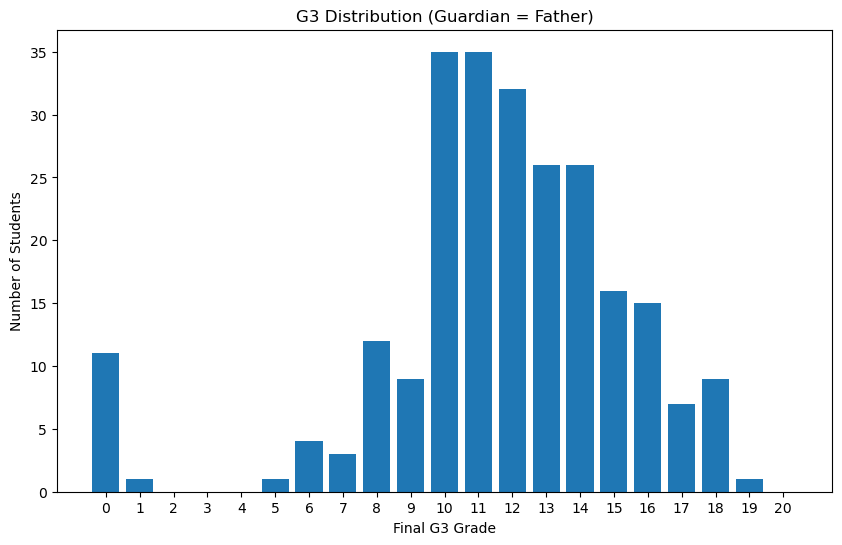

In [154]:
# Filtering students whose guardian is "father"
df_guardian_father = df[df['guardian'] == 'father']

g3_father_counts = (
    df_guardian_father['g3']
      .value_counts()
      .sort_index()
      .reindex(range(0, 21), fill_value=0)
)

plt.figure(figsize=(10, 6))
plt.bar(g3_father_counts.index, g3_father_counts.values)

plt.xlabel('Final G3 Grade')
plt.ylabel('Number of Students')
plt.title('G3 Distribution (Guardian = Father)')
plt.xticks(range(0, 21))

plt.show()


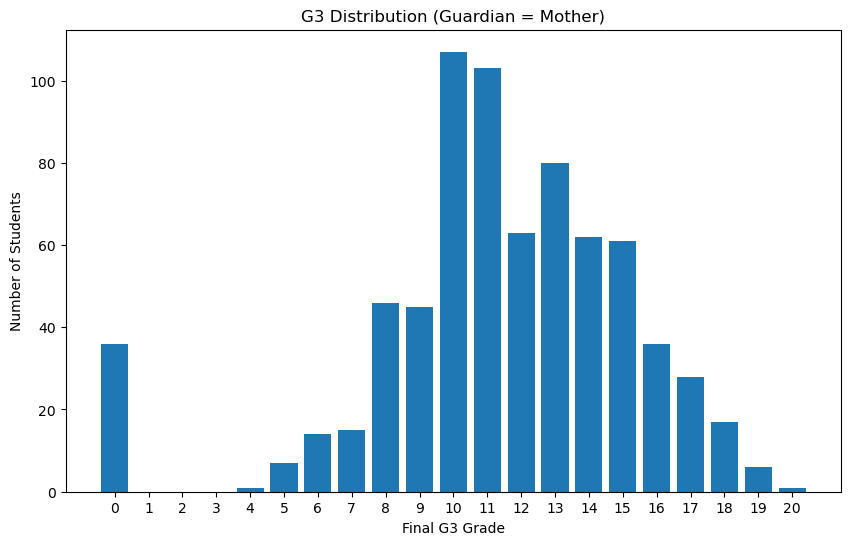

In [155]:
# Filtering students whose guardian is "mother"
df_guardian_mother = df[df['guardian'] == 'mother']

g3_mother_counts = (
    df_guardian_mother['g3']
      .value_counts()
      .sort_index()
      .reindex(range(0, 21), fill_value=0)
)

plt.figure(figsize=(10, 6))
plt.bar(g3_mother_counts.index, g3_mother_counts.values)

plt.xlabel('Final G3 Grade')
plt.ylabel('Number of Students')
plt.title('G3 Distribution (Guardian = Mother)')
plt.xticks(range(0, 21))

plt.show()


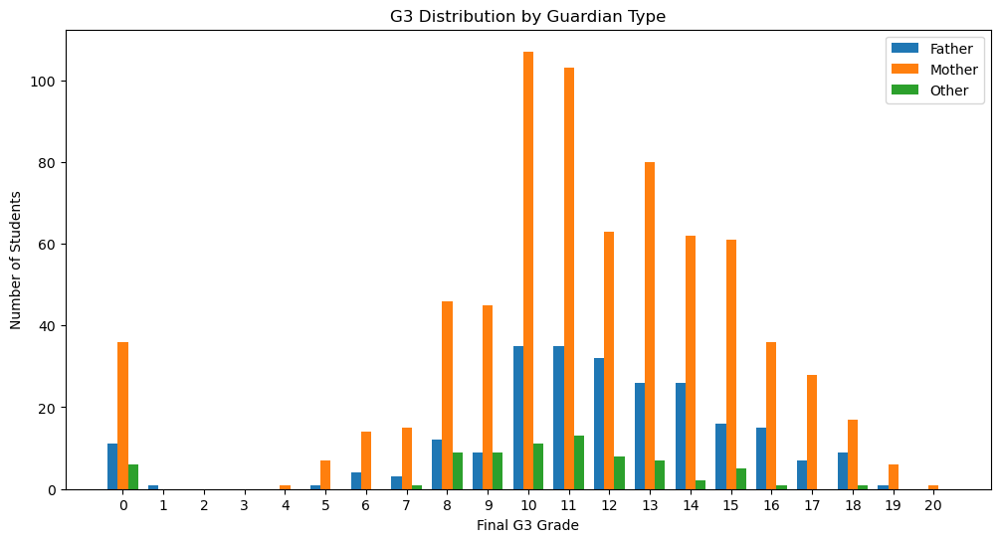

In [156]:
# Counting grades 0–20 for each guardian group
father_counts = (
    df[df['guardian'] == 'father']['g3']
    .value_counts()
    .sort_index()
    .reindex(range(0, 21), fill_value=0)
)

mother_counts = (
    df[df['guardian'] == 'mother']['g3']
    .value_counts()
    .sort_index()
    .reindex(range(0, 21), fill_value=0)
)

other_counts = (
    df[df['guardian'] == 'other']['g3']
    .value_counts()
    .sort_index()
    .reindex(range(0, 21), fill_value=0)
)

x = np.arange(0, 21)
width = 0.25

plt.figure(figsize=(12, 6))

plt.bar(x - width, father_counts.values, width=width, label='Father')
plt.bar(x,         mother_counts.values, width=width, label='Mother')
plt.bar(x + width, other_counts.values, width=width, label='Other')

plt.xlabel('Final G3 Grade')
plt.ylabel('Number of Students')
plt.title('G3 Distribution by Guardian Type')
plt.xticks(x)
plt.legend()

plt.show()


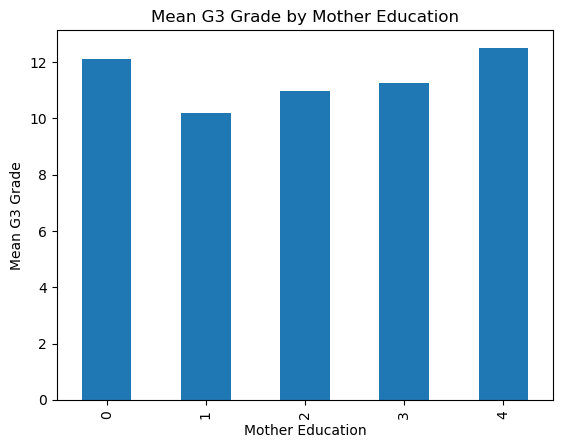

,mean,count
mother_education,,
0,12.11,9
1,10.18,202
2,10.97,289
3,11.25,238
4,12.51,306


In [157]:
mean_g3_mothedu = df.groupby('mother_education')['g3'].mean()
mean_g3_mothedu.plot(kind='bar')

plt.xlabel('Mother Education')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Mother Education')
plt.show()

df.groupby('mother_education')['g3'].agg(['mean', 'count']).round(2)

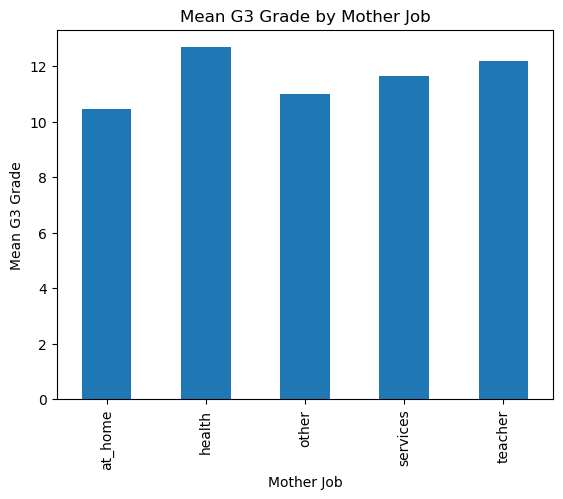

,mean,count
mother_job,,
at_home,10.47,194
health,12.68,82
other,11.02,399
services,11.66,239
teacher,12.21,130


In [158]:
mean_g3_mothjob = df.groupby('mother_job')['g3'].mean()
mean_g3_mothjob.plot(kind='bar')

plt.xlabel('Mother Job')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Mother Job')
plt.show()

df.groupby('mother_job')['g3'].agg(['mean', 'count']).round(2)

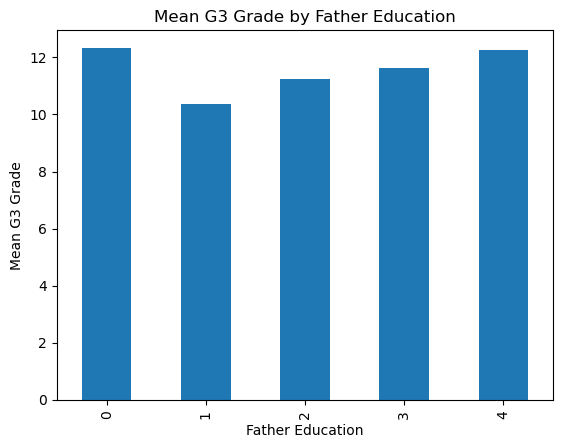

,mean,count
father_education,,
0,12.33,9
1,10.37,256
2,11.24,324
3,11.64,231
4,12.25,224


In [159]:
mean_g3_fathedu = df.groupby('father_education')['g3'].mean()
mean_g3_fathedu.plot(kind='bar')

plt.xlabel('Father Education')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Father Education')
plt.show()

df.groupby('father_education')['g3'].agg(['mean', 'count']).round(2)

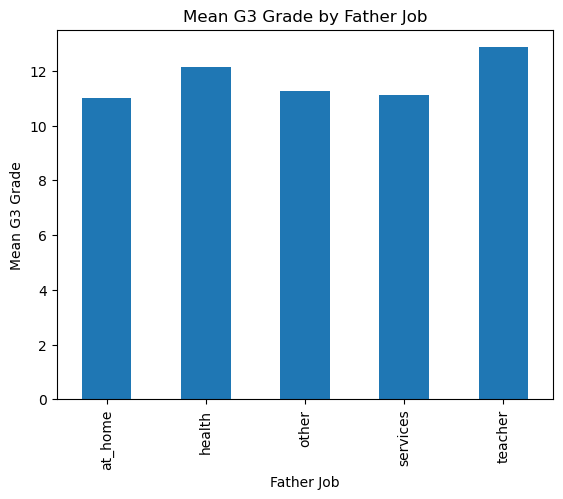

,mean,count
father_job,,
at_home,11.02,62
health,12.15,41
other,11.26,584
services,11.12,292
teacher,12.86,65


In [160]:
mean_g3_fathjob = df.groupby('father_job')['g3'].mean()
mean_g3_fathjob.plot(kind='bar')

plt.xlabel('Father Job')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Father Job')
plt.show()

df.groupby('father_job')['g3'].agg(['mean', 'count']).round(2)

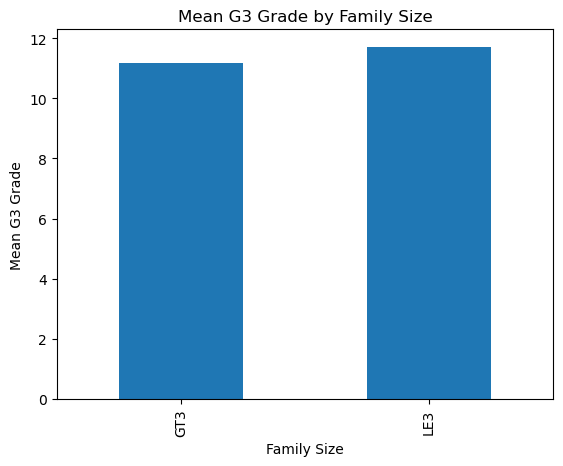

,mean,count
family_size,,
GT3,11.19,738
LE3,11.71,306


In [161]:
mean_g3_famsize = df.groupby('family_size')['g3'].mean()
mean_g3_famsize.plot(kind='bar')

plt.xlabel('Family Size')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Family Size')
plt.show()

df.groupby('family_size')['g3'].agg(['mean', 'count']).round(2)

### Free time correlation

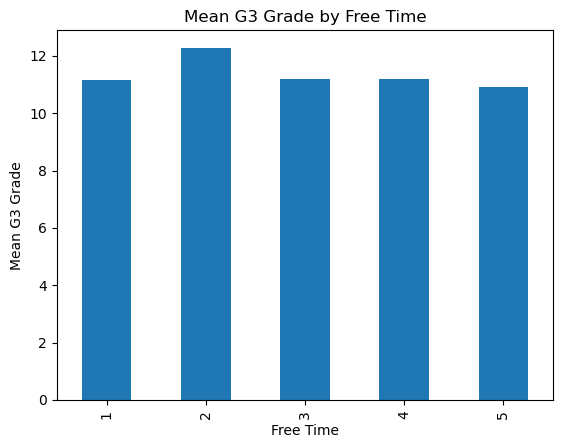

,mean,count
free_time,,
1,11.17,64
2,12.28,171
3,11.18,408
4,11.21,293
5,10.92,108


In [162]:
mean_g3_freetime = df.groupby('free_time')['g3'].mean()
mean_g3_freetime.plot(kind='bar')

plt.xlabel('Free Time')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Free Time')
plt.show()

df.groupby('free_time')['g3'].agg(['mean', 'count']).round(2)

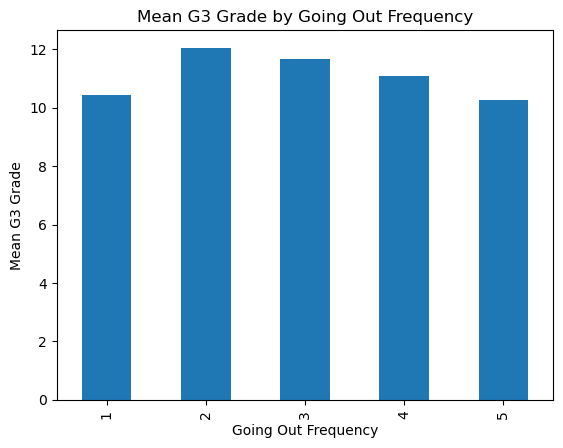

,mean,count
going_out_frequency,,
1,10.45,71
2,12.06,248
3,11.69,335
4,11.09,227
5,10.28,163


In [163]:
mean_g3_goingout = df.groupby('going_out_frequency')['g3'].mean()
mean_g3_goingout.plot(kind='bar')

plt.xlabel('Going Out Frequency')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Going Out Frequency')
plt.show()

df.groupby('going_out_frequency')['g3'].agg(['mean', 'count']).round(2)

### Alcohol and health correlation

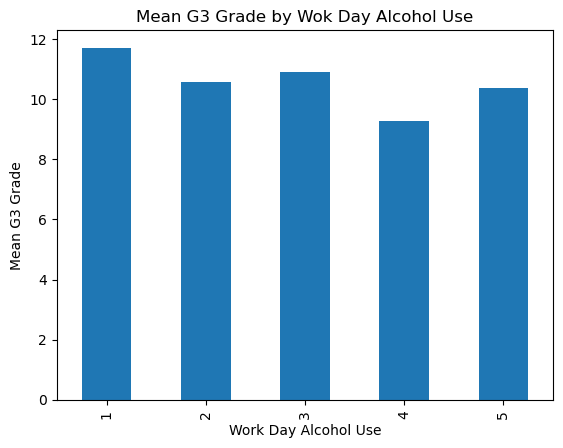

,mean,count
work_day_alcohol_use,,
1,11.70,727
2,10.56,196
3,10.90,69
4,9.27,26
5,10.38,26


In [164]:
mean_g3_workdayalc = df.groupby('work_day_alcohol_use')['g3'].mean()
mean_g3_workdayalc.plot(kind='bar')

plt.xlabel('Work Day Alcohol Use')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Wok Day Alcohol Use')
plt.show()

df.groupby('work_day_alcohol_use')['g3'].agg(['mean', 'count']).round(2)

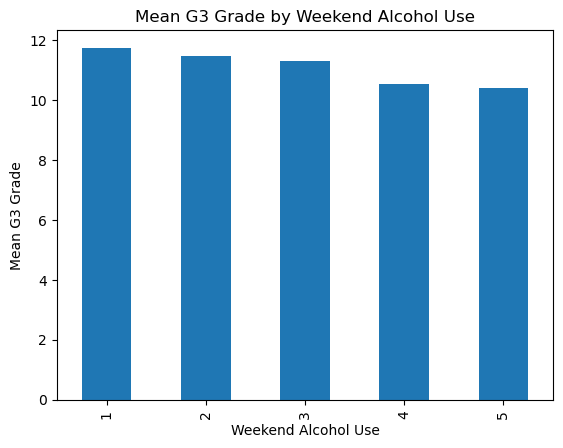

,mean,count
weekend_alcohol_use,,
1,11.74,398
2,11.47,235
3,11.29,200
4,10.54,138
5,10.40,73


In [165]:
mean_g3_weekend = df.groupby('weekend_alcohol_use')['g3'].mean()
mean_g3_weekend.plot(kind='bar')

plt.xlabel('Weekend Alcohol Use')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Weekend Alcohol Use')
plt.show()

df.groupby('weekend_alcohol_use')['g3'].agg(['mean', 'count']).round(2)

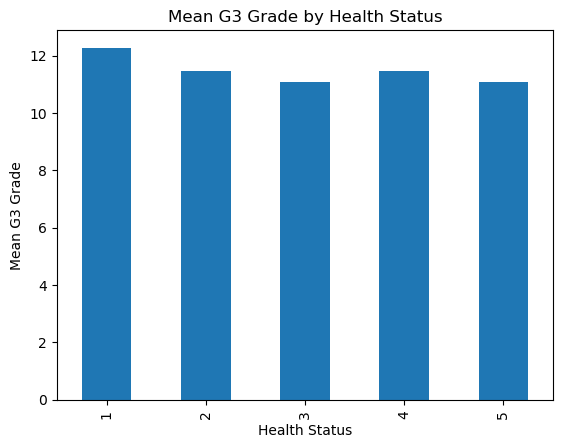

,mean,count
health_status,,
1,12.27,137
2,11.47,123
3,11.07,215
4,11.47,174
5,11.07,395


In [166]:
mean_g3_health = df.groupby('health_status')['g3'].mean()
mean_g3_health.plot(kind='bar')

plt.xlabel('Health Status')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Health Status')
plt.show()

df.groupby('health_status')['g3'].agg(['mean', 'count']).round(2)

## EDA of failures

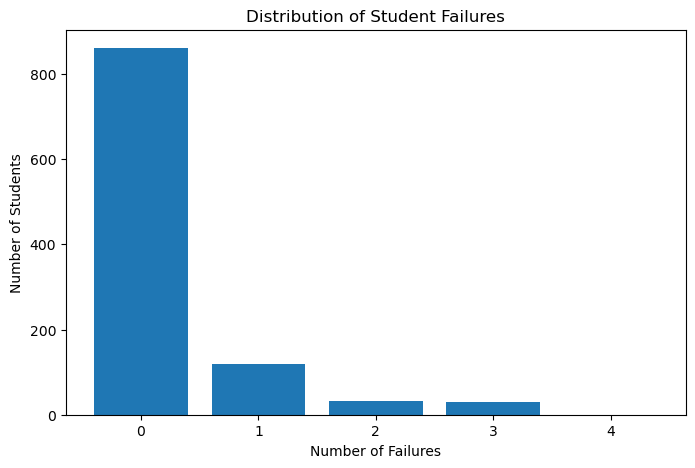

,Number of Failures,Number of Students
0,0,861
1,1,120
2,2,33
3,3,30
4,4,0


In [167]:
import matplotlib.pyplot as plt

failures_counts = (
    df['failures']
      .value_counts()
      .sort_index()
      .reindex(range(0, 5), fill_value=0) 
)

plt.figure(figsize=(8, 5))
plt.bar(failures_counts.index, failures_counts.values)

plt.xlabel('Number of Failures')
plt.ylabel('Number of Students')
plt.title('Distribution of Student Failures')
plt.xticks(range(0, 5))

plt.show()

failures_df = failures_counts.reset_index()
failures_df.columns = ['Number of Failures', 'Number of Students']

failures_df

In [168]:
grouped_family_failures = df.groupby(['family_relationship', 'failures'])['g3'].agg(['mean', 'count']).round(2)
grouped_family_failures

mean  count
family_relationship failures              
1                   0         12.04     23
                    1          5.67      6
                    2          8.00      1
2                   0         11.74     34
                    1          8.71      7
                    2          5.33      3
                    3          5.67      3
3                   0         11.83    135
                    1          9.31     16
                    2          5.82     11
                    3          6.29      7
4                   0         12.17    429
                    1          8.94     62
                    2          7.77     13
                    3          7.12      8
5                   0         12.02    240
                    1          7.34     29
                    2         11.60      5
                    3          7.17     12

In [169]:
grouped_failures_family = df.groupby(['failures', 'family_relationship'])['g3'].agg(['mean', 'count']).round(2)
grouped_failures_family

mean  count
failures family_relationship              
0        1                    12.04     23
         2                    11.74     34
         3                    11.83    135
         4                    12.17    429
         5                    12.02    240
1        1                     5.67      6
         2                     8.71      7
         3                     9.31     16
         4                     8.94     62
         5                     7.34     29
2        1                     8.00      1
         2                     5.33      3
         3                     5.82     11
         4                     7.77     13
         5                    11.60      5
3        2                     5.67      3
         3                     6.29      7
         4                     7.12      8
         5                     7.17     12

### School correlation

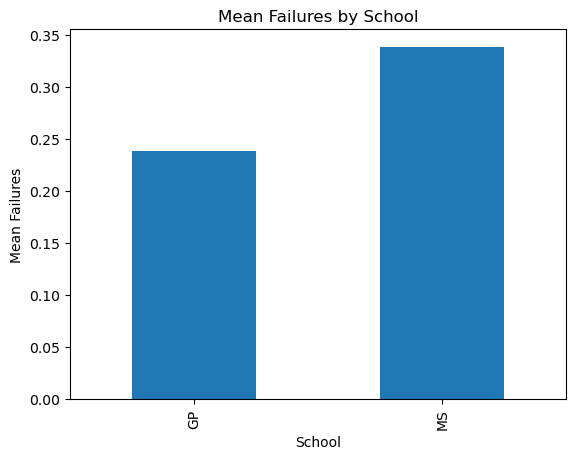

,mean,sum,count
school,,,
GP,0.24,184,772
MS,0.34,92,272


In [170]:
mean_failures_school = df.groupby('school')['failures'].mean()
mean_failures_school.plot(kind='bar')

plt.xlabel('School')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by School')
plt.show()

df.groupby('school')['failures'].agg(['mean', 'sum', 'count']).round(2)

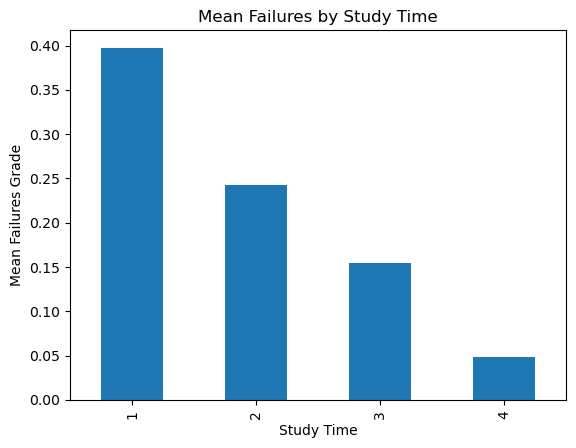

,mean,sum,count
study_time,,,
1,0.40,126,317
2,0.24,122,503
3,0.15,25,162
4,0.05,3,62


In [171]:
mean_failures_study = df.groupby('study_time')['failures'].mean()
mean_failures_study.plot(kind='bar')

plt.xlabel('Study Time')
plt.ylabel('Mean Failures Grade')
plt.title('Mean Failures by Study Time')
plt.show()

df.groupby('study_time')['failures'].agg(['mean', 'sum', 'count']).round(2)

In [172]:
pd.crosstab(df['study_time'], df['failures'])

failures,0,1,2,3
study_time,,,,
1,237,52,10,18
2,422,52,17,12
3,143,13,6,0
4,59,3,0,0


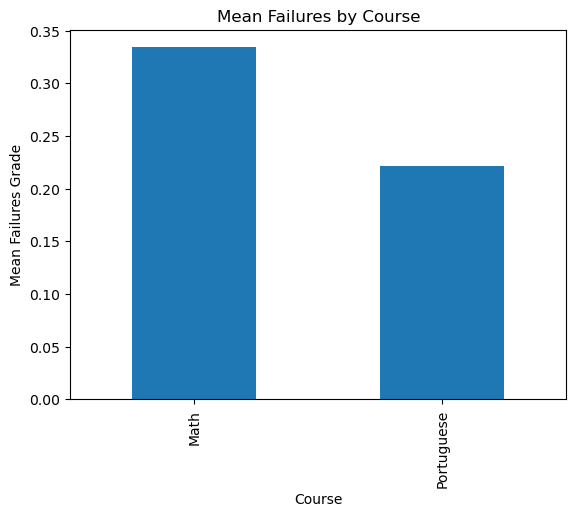

,mean,count
course,,
Math,0.33,395
Portuguese,0.22,649


In [173]:
mean_failures_course = df.groupby('course')['failures'].mean()
mean_failures_course.plot(kind='bar')

plt.xlabel('Course')
plt.ylabel('Mean Failures Grade')
plt.title('Mean Failures by Course')
plt.show()

df.groupby('course')['failures'].agg(['mean', 'count']).round(2)

In [174]:
pd.crosstab(df['course'], df['failures'])

failures,0,1,2,3
course,,,,
Math,312,50,17,16
Portuguese,549,70,16,14


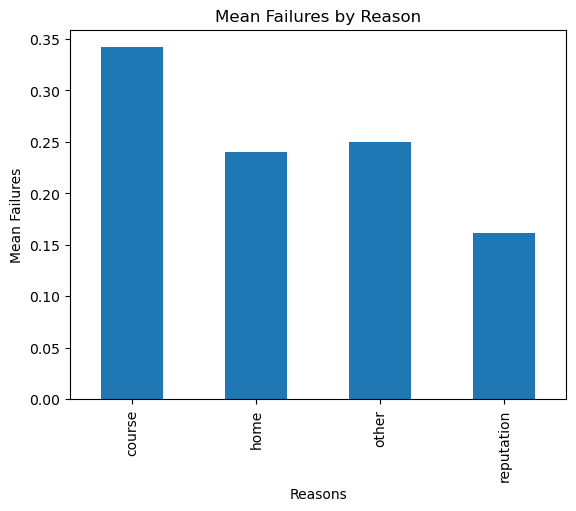

,mean,sum,count
reason,,,
course,0.34,147,430
home,0.24,62,258
other,0.25,27,108
reputation,0.16,40,248


In [175]:
mean_failures_reason = df.groupby('reason')['failures'].mean()
mean_failures_reason.plot(kind='bar')

plt.xlabel('Reasons')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by Reason')
plt.show()

df.groupby('reason')['failures'].agg(['mean', 'sum', 'count']).round(2)

In [176]:
pd.crosstab(df['reason'], df['failures'])

failures,0,1,2,3
reason,,,,
course,337,56,20,17
home,216,30,4,8
other,89,14,2,3
reputation,219,20,7,2


### Support correlation

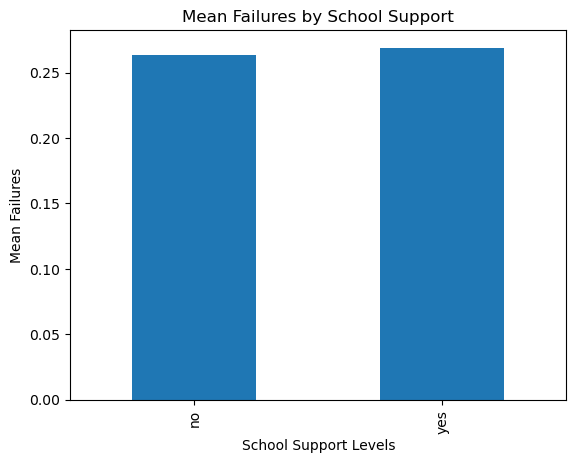

,mean,sum,count
school_support,,,
no,0.26,244,925
yes,0.27,32,119


In [177]:
mean_failures_schoosup = df.groupby('school_support')['failures'].mean()
mean_failures_schoosup.plot(kind='bar')

plt.xlabel('School Support Levels')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by School Support')
plt.show()

df.groupby('school_support')['failures'].agg(['mean', 'sum', 'count']).round(2)

In [178]:
pd.crosstab(df['school_support'], df['failures'])

failures,0,1,2,3
school_support,,,,
no,763,106,30,26
yes,98,14,3,4


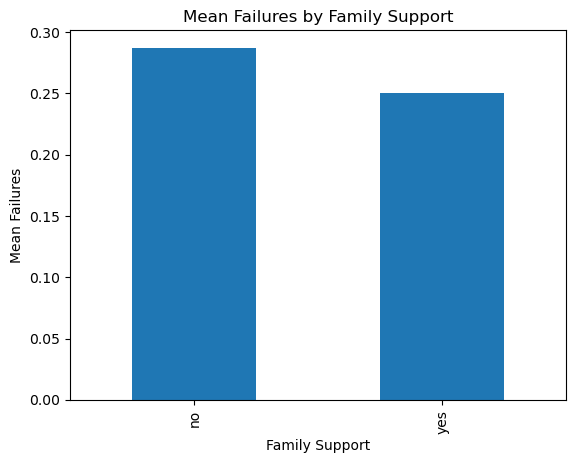

,mean,sum,count
family_support,,,
no,0.29,116,404
yes,0.25,160,640


In [179]:
mean_failures_famsup = df.groupby('family_support')['failures'].mean()
mean_failures_famsup.plot(kind='bar')

plt.xlabel('Family Support')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by Family Support')
plt.show()

df.groupby('family_support')['failures'].agg(['mean', 'sum', 'count']).round(2)

In [180]:
pd.crosstab(df['family_support'], df['failures'])

failures,0,1,2,3
family_support,,,,
no,326,53,12,13
yes,535,67,21,17


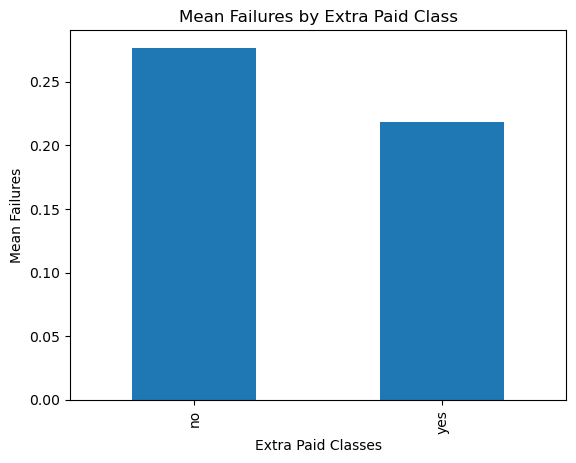

,mean,sum,count
extra_paid_classes,,,
no,0.28,228,824
yes,0.22,48,220


In [181]:
mean_failures_extrapaid = df.groupby('extra_paid_classes')['failures'].mean()
mean_failures_extrapaid.plot(kind='bar')

plt.xlabel('Extra Paid Classes')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by Extra Paid Class')
plt.show()

df.groupby('extra_paid_classes')['failures'].agg(['mean', 'sum', 'count']).round(2)

In [182]:
pd.crosstab(df['extra_paid_classes'], df['failures'])

failures,0,1,2,3
extra_paid_classes,,,,
no,673,100,25,26
yes,188,20,8,4


### Family Correlation

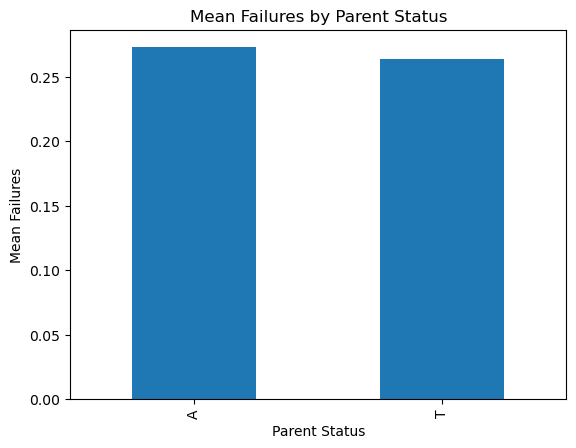

,mean,sum,count
parent_status,,,
A,0.27,33,121
T,0.26,243,923


In [183]:
mean_failures_parentstatus = df.groupby('parent_status')['failures'].mean()
mean_failures_parentstatus.plot(kind='bar')

plt.xlabel('Parent Status')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by Parent Status')
plt.show()

df.groupby('parent_status')['failures'].agg(['mean', 'sum', 'count']).round(2)

In [184]:
pd.crosstab(df['parent_status'], df['failures'])

failures,0,1,2,3
parent_status,,,,
A,101,10,7,3
T,760,110,26,27


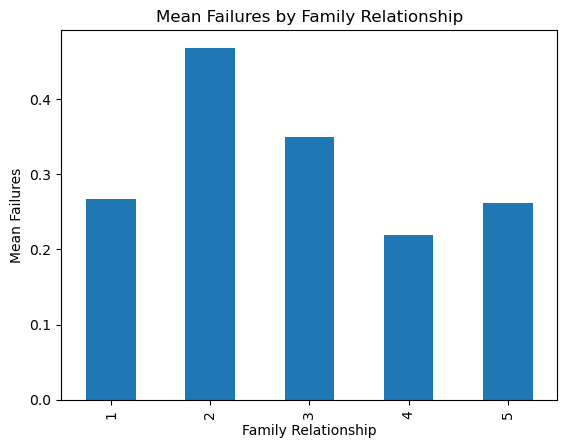

,mean,sum,count
family_relationship,,,
1,0.27,8,30
2,0.47,22,47
3,0.35,59,169
4,0.22,112,512
5,0.26,75,286


In [185]:
mean_failures_famrel = df.groupby('family_relationship')['failures'].mean()
mean_failures_famrel.plot(kind='bar')

plt.xlabel('Family Relationship')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by Family Relationship')
plt.show()

df.groupby('family_relationship')['failures'].agg(['mean', 'sum', 'count']).round(2)

In [186]:
pd.crosstab(df['family_relationship'], df['failures'])

failures,0,1,2,3
family_relationship,,,,
1,23,6,1,0
2,34,7,3,3
3,135,16,11,7
4,429,62,13,8
5,240,29,5,12


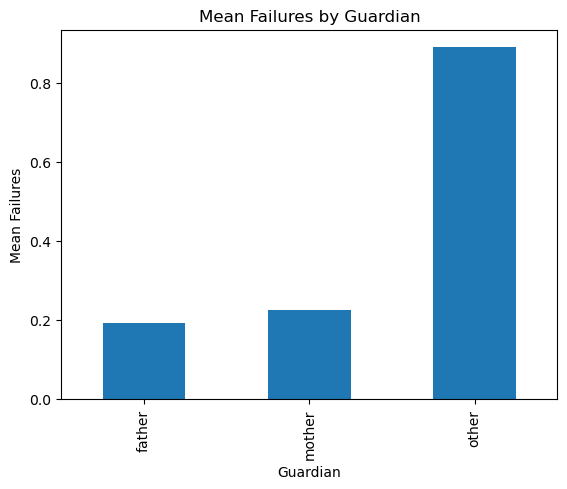

,mean,sum,count
guardian,,,
father,0.19,47,243
mother,0.23,164,728
other,0.89,65,73


In [187]:
mean_failures_guardian = df.groupby('guardian')['failures'].mean()
mean_failures_guardian.plot(kind='bar')

plt.xlabel('Guardian')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by Guardian')
plt.show()

df.groupby('guardian')['failures'].agg(['mean', 'sum', 'count']).round(2)

In [188]:
pd.crosstab(df['guardian'], df['failures'])

failures,0,1,2,3
guardian,,,,
father,206,30,4,3
mother,624,66,16,22
other,31,24,13,5


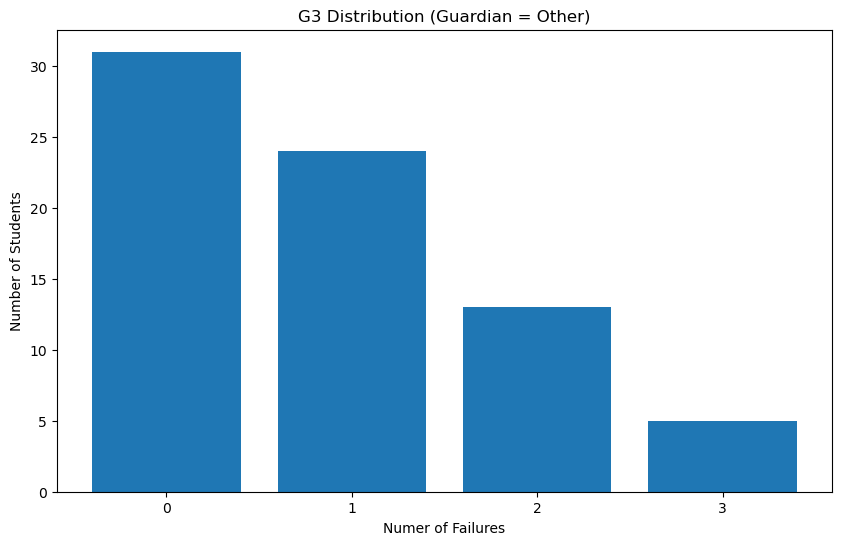

In [189]:
# Filtering students whose guardian is "other"
failures_guardian_other = df[df['guardian'] == 'other']

failures_other_counts = (
    failures_guardian_other['failures']
      .value_counts()
      .sort_index()
      .reindex(range(0, 4), fill_value=0)
)

plt.figure(figsize=(10, 6))
plt.bar(failures_other_counts.index, failures_other_counts.values)

plt.xlabel('Numer of Failures')
plt.ylabel('Number of Students')
plt.title('G3 Distribution (Guardian = Other)')
plt.xticks(range(0, 4))

plt.show()


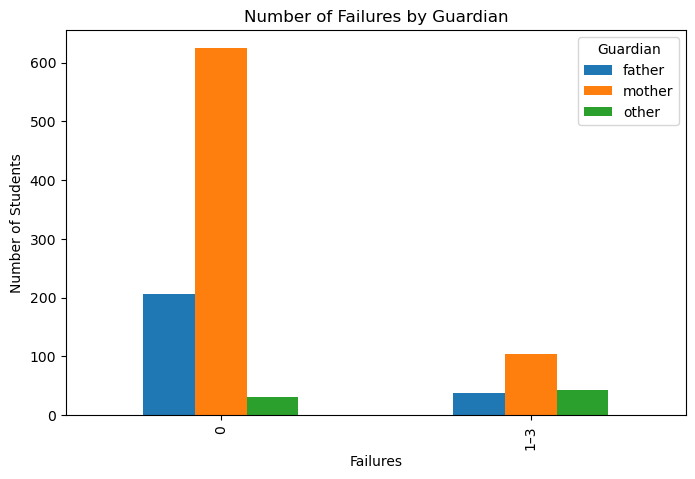

guardian,father,mother,other
failures_bin,,,
0,206,624,31
1–3,37,104,42


In [190]:
df['failures_bin'] = pd.cut(
    df['failures'],
    bins=[-1, 0, 3],
    labels=['0', '1–3']
)

failures_by_guardian = pd.crosstab(
    df['failures_bin'],
    df['guardian']
)

failures_by_guardian.plot(kind='bar', figsize=(8,5))

plt.xlabel('Failures')
plt.ylabel('Number of Students')
plt.title('Number of Failures by Guardian')
plt.legend(title='Guardian')

plt.show()
failures_by_guardian


failures_bin
0      31
1–3    42
Name: count, dtype: int64

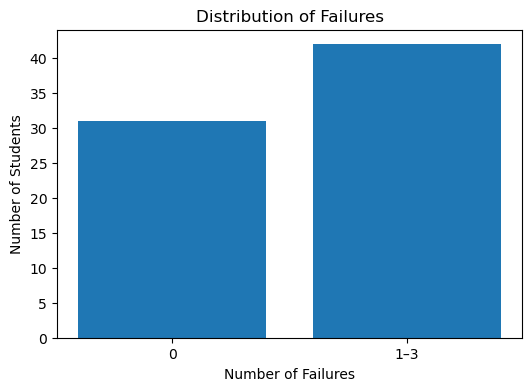

In [191]:
df_other = df[df['guardian'] == 'other']

failures_other_counts = (
    df_other['failures_bin']
      .value_counts()
      .reindex(['0', '1–3'], fill_value=0)
)

plt.figure(figsize=(6, 4))
bars = plt.bar(failures_other_counts.index,
               failures_other_counts.values)

plt.xlabel('Number of Failures')
plt.ylabel('Number of Students')
plt.title('Distribution of Failures')

failures_other_counts


In [192]:
df.groupby(['guardian', 'parent_status'])['failures'].agg(['mean', 'count']).round(2)

mean  count
guardian parent_status             
father   A              0.30     10
         T              0.19    233
mother   A              0.15     95
         T              0.24    633
other    A              1.00     16
         T              0.86     57

In [193]:
df.groupby(['guardian', 'parent_status', 'sex'])['failures'].agg(['mean', 'count']).round(2)

mean  count
guardian parent_status sex             
father   A             F    0.29      7
                       M    0.33      3
         T             F    0.19    121
                       M    0.19    112
mother   A             F    0.17     60
                       M    0.11     35
         T             F    0.17    358
                       M    0.33    275
other    A             F    1.20     10
                       M    0.67      6
         T             F    0.77     35
                       M    1.00     22

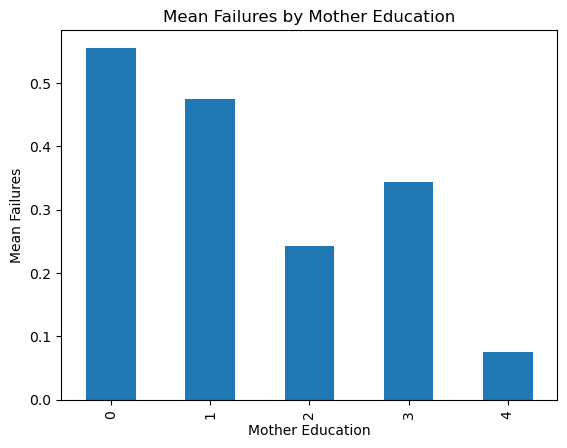

,mean,sum,count
mother_education,,,
0,0.56,5,9
1,0.48,96,202
2,0.24,70,289
3,0.34,82,238
4,0.08,23,306


In [194]:
mean_failures_mothedu = df.groupby('mother_education')['failures'].mean()
mean_failures_mothedu.plot(kind='bar')

plt.xlabel('Mother Education')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by Mother Education')
plt.show()

df.groupby('mother_education')['failures'].agg(['mean', 'sum', 'count']).round(2)

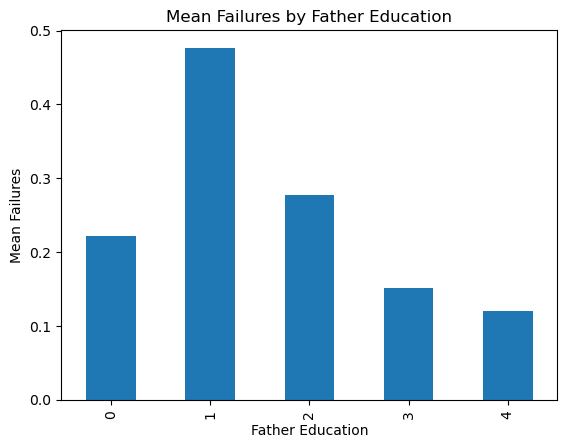

,mean,sum,count
father_education,,,
0,0.22,2,9
1,0.48,122,256
2,0.28,90,324
3,0.15,35,231
4,0.12,27,224


In [195]:
mean_failures_fathedu = df.groupby('father_education')['failures'].mean()
mean_failures_fathedu.plot(kind='bar')

plt.xlabel('Father Education')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by Father Education')
plt.show()

df.groupby('father_education')['failures'].agg(['mean', 'sum', 'count']).round(2)

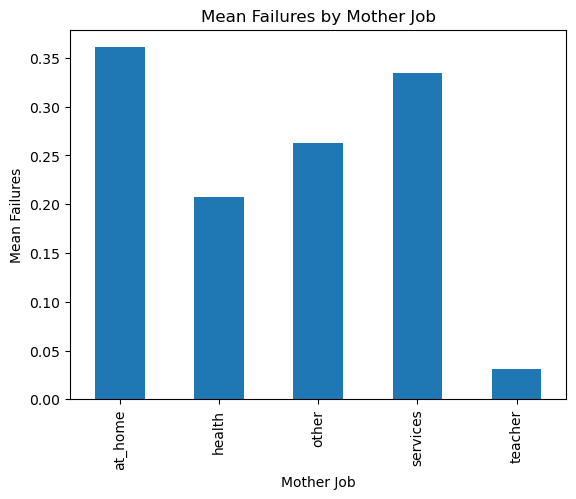

,mean,sum,count
mother_job,,,
at_home,0.36,70,194
health,0.21,17,82
other,0.26,105,399
services,0.33,80,239
teacher,0.03,4,130


In [196]:
mean_failures_mothjob = df.groupby('mother_job')['failures'].mean()
mean_failures_mothjob.plot(kind='bar')

plt.xlabel('Mother Job')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by Mother Job')
plt.show()

df.groupby('mother_job')['failures'].agg(['mean', 'sum', 'count']).round(2)

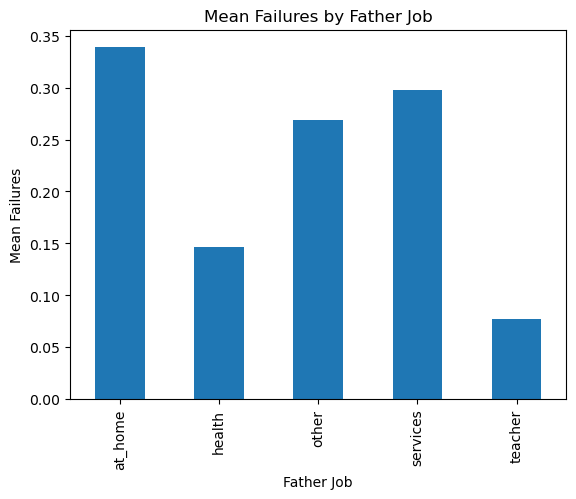

,mean,sum,count
father_job,,,
at_home,0.34,21,62
health,0.15,6,41
other,0.27,157,584
services,0.30,87,292
teacher,0.08,5,65


In [197]:
mean_failures_fathjob = df.groupby('father_job')['failures'].mean()
mean_failures_fathjob.plot(kind='bar')

plt.xlabel('Father Job')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by Father Job')
plt.show()

df.groupby('father_job')['failures'].agg(['mean', 'sum', 'count']).round(2)

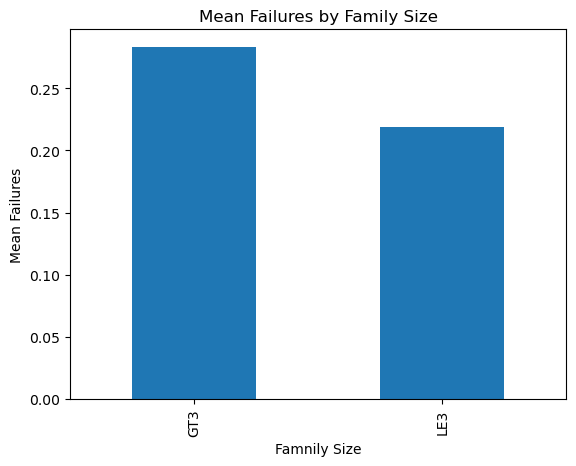

,mean,sum,count
family_size,,,
GT3,0.28,209,738
LE3,0.22,67,306


In [198]:
mean_failures_famsize = df.groupby('family_size')['failures'].mean()
mean_failures_famsize.plot(kind='bar')

plt.xlabel('Famnily Size')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by Family Size')
plt.show()

df.groupby('family_size')['failures'].agg(['mean', 'sum', 'count']).round(2)

### Free time correlation

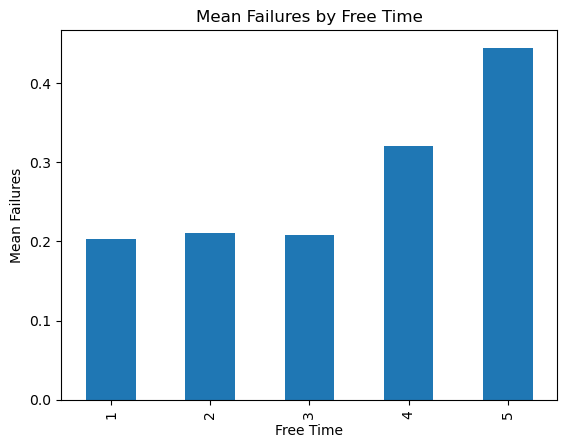

,mean,sum,count
free_time,,,
1,0.20,13,64
2,0.21,36,171
3,0.21,85,408
4,0.32,94,293
5,0.44,48,108


In [199]:
mean_failures_freetime = df.groupby('free_time')['failures'].mean()
mean_failures_freetime.plot(kind='bar')

plt.xlabel('Free Time')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by Free Time')
plt.show()

df.groupby('free_time')['failures'].agg(['mean', 'sum', 'count']).round(2)

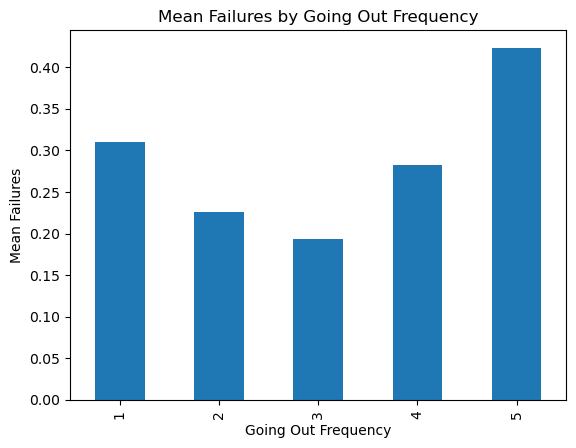

,mean,sum,count
going_out_frequency,,,
1,0.31,22,71
2,0.23,56,248
3,0.19,65,335
4,0.28,64,227
5,0.42,69,163


In [200]:
mean_failures_goingout = df.groupby('going_out_frequency')['failures'].mean()
mean_failures_goingout.plot(kind='bar')

plt.xlabel('Going Out Frequency')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by Going Out Frequency')
plt.show()

df.groupby('going_out_frequency')['failures'].agg(['mean', 'sum', 'count']).round(2)

### Alcohol and health correlation

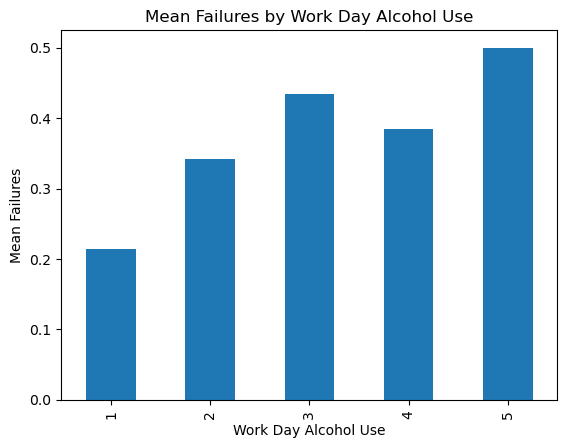

,mean,sum,count
work_day_alcohol_use,,,
1,0.21,156,727
2,0.34,67,196
3,0.43,30,69
4,0.38,10,26
5,0.50,13,26


In [201]:
mean_failures_workdayalc = df.groupby('work_day_alcohol_use')['failures'].mean()
mean_failures_workdayalc.plot(kind='bar')

plt.xlabel('Work Day Alcohol Use')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by Work Day Alcohol Use')
plt.show()

df.groupby('work_day_alcohol_use')['failures'].agg(['mean', 'sum', 'count']).round(2)

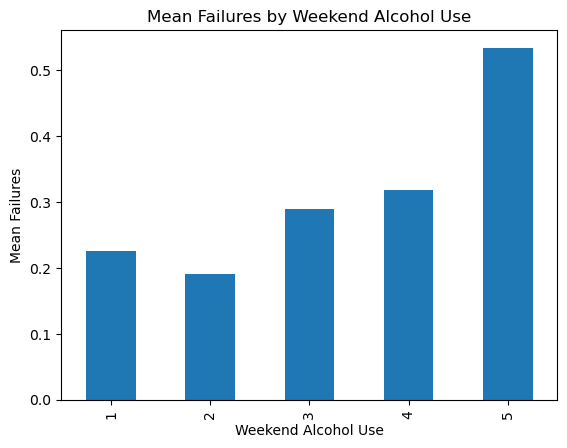

,mean,sum,count
weekend_alcohol_use,,,
1,0.23,90,398
2,0.19,45,235
3,0.29,58,200
4,0.32,44,138
5,0.53,39,73


In [202]:
mean_failures_weekendalc = df.groupby('weekend_alcohol_use')['failures'].mean()
mean_failures_weekendalc.plot(kind='bar')

plt.xlabel('Weekend Alcohol Use')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by Weekend Alcohol Use')
plt.show()

df.groupby('weekend_alcohol_use')['failures'].agg(['mean', 'sum', 'count']).round(2)

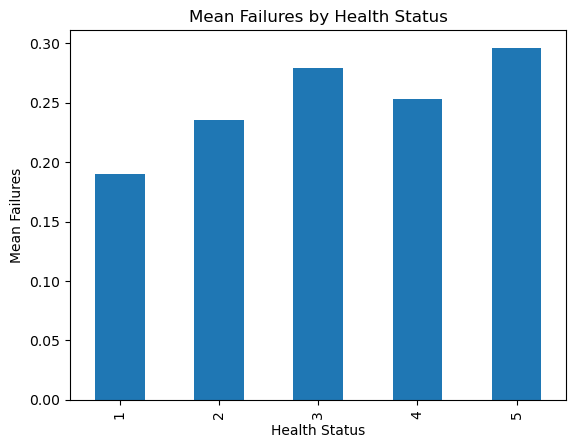

,mean,sum,count
health_status,,,
1,0.19,26,137
2,0.24,29,123
3,0.28,60,215
4,0.25,44,174
5,0.30,117,395


In [203]:
mean_failures_health = df.groupby('health_status')['failures'].mean()
mean_failures_health.plot(kind='bar')

plt.xlabel('Health Status')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by Health Status')
plt.show()

df.groupby('health_status')['failures'].agg(['mean', 'sum', 'count']).round(2)

# Pre-Processing

In [204]:
# applying get_dummies to categorical features
df_1 = pd.get_dummies(df, columns=categorical_cols)
df_1

,age,mother_education,father_education,travel_time,study_time,failures,family_relationship,free_time,going_out_frequency,work_day_alcohol_use,weekend_alcohol_use,health_status,absences,g1,g2,g3,absences_bin,g1_bin,g2_bin,failures_bin,school_GP,school_MS,sex_F,sex_M,address_R,address_U,family_size_GT3,family_size_LE3,parent_status_A,parent_status_T,mother_job_at_home,mother_job_health,mother_job_other,mother_job_services,mother_job_teacher,father_job_at_home,father_job_health,father_job_other,father_job_services,father_job_teacher,reason_course,reason_home,reason_other,reason_reputation,guardian_father,guardian_mother,guardian_other,school_support_no,school_support_yes,family_support_no,family_support_yes,extra_paid_classes_no,extra_paid_classes_yes,extra_curricular_activities_no,extra_curricular_activities_yes,attended_nursery_no,attended_nursery_yes,higher_education_aspiration_no,higher_education_aspiration_yes,home_internet_access_no,home_internet_access_yes,in_relationship_no,in_relationship_yes,course_Math,course_Portuguese
0,18,4,4,2,2,0,4,3,4,1,1,3,6,5,6,6,6–10,0–5,6–10,0,True,False,True,False,False,True,True,False,True,False,True,False,False,False,False,False,False,False,False,True,True,False,False,False,False,True,False,False,True,True,False,True,False,True,False,False,True,False,True,True,False,True,False,True,False
1,17,1,1,1,2,0,5,3,3,1,1,3,4,5,5,6,0–5,0–5,0–5,0,True,False,True,False,False,True,True,False,False,True,True,False,False,False,False,False,False,True,False,False,True,False,False,False,True,False,False,True,False,False,True,True,False,True,False,True,False,False,True,False,True,True,False,True,False
2,15,1,1,1,2,3,4,3,2,2,3,3,10,7,8,10,6–10,6–10,6–10,1–3,True,False,True,False,False,True,False,True,False,True,True,False,False,False,False,False,False,True,False,False,False,False,True,False,False,True,False,False,True,True,False,False,True,True,False,False,True,False,True,False,True,True,False,True,False
3,15,4,2,1,3,0,3,2,2,1,1,5,2,15,14,15,0–5,11–15,11–15,0,True,False,True,False,False,True,True,False,False,True,False,True,False,False,False,False,False,False,True,False,False,True,False,False,False,True,False,True,False,False,True,False,True,False,True,False,True,False,True,False,True,False,True,True,False
4,16,3,3,1,2,0,4,3,2,1,2,5,4,6,10,10,0–5,6–10,6–10,0,True,False,True,False,False,True,True,False,False,True,False,False,True,False,False,False,False,True,False,False,False,True,False,False,True,False,False,True,False,False,True,False,True,True,False,False,True,False,True,True,False,True,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1039,19,2,3,1,3,1,5,4,2,1,2,5,4,10,11,10,0–5,6–10,11–15,1–3,False,True,True,False,True,False,True,False,False,True,False,False,False,True,False,False,False,True,False,False,True,False,False,False,False,True,False,True,False,True,False,True,False,False,True,True,False,False,True,False,True,True,False,False,True
1040,18,3,1,1,2,0,4,3,4,1,1,1,4,15,15,16,0–5,11–15,11–15,0,False,True,True,False,False,True,False,True,False,True,False,False,False,False,True,False,False,False,True,False,True,False,False,False,False,True,False,True,False,False,True,True,False,True,False,False,True,False,True,False,True,True,False,False,True
1041,18,1,1,2,2,0,1,1,1,1,1,5,6,11,12,9,6–10,11–15,11–15,0,False,True,True,False,False,True,True,False,False,True,False,False,True,False,False,False,False,True,False,False,True,False,False,False,False,True,False,True,False,True,False,True,False,False,True,False,True,False,True,True,False,True,False,False,True
1042,17,3,1,2,1,0,2,4,5,3,4,2,6,10,10,10,6–10,6–10,6–10,0,False,True,False,True,False,True,False,True,False,True,False,False,False,True,False,False,False,False,True,False,True,False,False,False,False,True,False,True,False,True,False,

In [205]:
df_1.rename(columns={
    'school_GP': 'school_gp',
    'school_MS': 'school_ms',
    'sex_F': 'gender_female',
    'sex_M' : 'gender_male',
    'address_R' : 'address_rural',
    'address_U' : 'address_urban',
    'family_size_GT3' : 'family_size_greater_3',
    'family_size_LE3' : 'family_size_less_equal_3',
    'parent_status_A' : 'parent_status_apart',
    'parent_status_T' : 'parent_status_together',
    'course_Math' : 'course_math',
    'course_Portuguese' : 'course_portuguese'    
}, inplace=True)

df_1

,age,mother_education,father_education,travel_time,study_time,failures,family_relationship,free_time,going_out_frequency,work_day_alcohol_use,weekend_alcohol_use,health_status,absences,g1,g2,g3,absences_bin,g1_bin,g2_bin,failures_bin,school_gp,school_ms,gender_female,gender_male,address_rural,address_urban,family_size_greater_3,family_size_less_equal_3,parent_status_apart,parent_status_together,mother_job_at_home,mother_job_health,mother_job_other,mother_job_services,mother_job_teacher,father_job_at_home,father_job_health,father_job_other,father_job_services,father_job_teacher,reason_course,reason_home,reason_other,reason_reputation,guardian_father,guardian_mother,guardian_other,school_support_no,school_support_yes,family_support_no,family_support_yes,extra_paid_classes_no,extra_paid_classes_yes,extra_curricular_activities_no,extra_curricular_activities_yes,attended_nursery_no,attended_nursery_yes,higher_education_aspiration_no,higher_education_aspiration_yes,home_internet_access_no,home_internet_access_yes,in_relationship_no,in_relationship_yes,course_math,course_portuguese
0,18,4,4,2,2,0,4,3,4,1,1,3,6,5,6,6,6–10,0–5,6–10,0,True,False,True,False,False,True,True,False,True,False,True,False,False,False,False,False,False,False,False,True,True,False,False,False,False,True,False,False,True,True,False,True,False,True,False,False,True,False,True,True,False,True,False,True,False
1,17,1,1,1,2,0,5,3,3,1,1,3,4,5,5,6,0–5,0–5,0–5,0,True,False,True,False,False,True,True,False,False,True,True,False,False,False,False,False,False,True,False,False,True,False,False,False,True,False,False,True,False,False,True,True,False,True,False,True,False,False,True,False,True,True,False,True,False
2,15,1,1,1,2,3,4,3,2,2,3,3,10,7,8,10,6–10,6–10,6–10,1–3,True,False,True,False,False,True,False,True,False,True,True,False,False,False,False,False,False,True,False,False,False,False,True,False,False,True,False,False,True,True,False,False,True,True,False,False,True,False,True,False,True,True,False,True,False
3,15,4,2,1,3,0,3,2,2,1,1,5,2,15,14,15,0–5,11–15,11–15,0,True,False,True,False,False,True,True,False,False,True,False,True,False,False,False,False,False,False,True,False,False,True,False,False,False,True,False,True,False,False,True,False,True,False,True,False,True,False,True,False,True,False,True,True,False
4,16,3,3,1,2,0,4,3,2,1,2,5,4,6,10,10,0–5,6–10,6–10,0,True,False,True,False,False,True,True,False,False,True,False,False,True,False,False,False,False,True,False,False,False,True,False,False,True,False,False,True,False,False,True,False,True,True,False,False,True,False,True,True,False,True,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1039,19,2,3,1,3,1,5,4,2,1,2,5,4,10,11,10,0–5,6–10,11–15,1–3,False,True,True,False,True,False,True,False,False,True,False,False,False,True,False,False,False,True,False,False,True,False,False,False,False,True,False,True,False,True,False,True,False,False,True,True,False,False,True,False,True,True,False,False,True
1040,18,3,1,1,2,0,4,3,4,1,1,1,4,15,15,16,0–5,11–15,11–15,0,False,True,True,False,False,True,False,True,False,True,False,False,False,False,True,False,False,False,True,False,True,False,False,False,False,True,False,True,False,False,True,True,False,True,False,False,True,False,True,False,True,True,False,False,True
1041,18,1,1,2,2,0,1,1,1,1,1,5,6,11,12,9,6–10,11–15,11–15,0,False,True,True,False,False,True,True,False,False,True,False,False,True,False,False,False,False,True,False,False,True,False,False,False,False,True,False,True,False,True,False,True,False,False,True,False,True,False,True,True,False,True,False,False,True
1042,17,3,1,2,1,0,2,4,5,3,4,2,6,10,10,10,6–10,6–10,6–10,0,False,True,False,True,False,True,False,True,False,True,False,False,False,True,False,False,False,False,True,False,True,False,Fal

In [206]:
print(df_1.dtypes)

age                         int64
mother_education            int64
father_education            int64
travel_time                 int64
study_time                  int64
                            ...  
home_internet_access_yes     bool
in_relationship_no           bool
in_relationship_yes          bool
course_math                  bool
course_portuguese            bool
Length: 65, dtype: object


# Task 1.1 Performance Drivers

# Correlation analysis

In [207]:
# correlation analysis between features with g3
corr_with_g3 = (
    df_1.corr(numeric_only=True)['g3']
      .drop('g3')
      .sort_values(ascending=False)
)

corr_with_g3

g2                                 0.910743
g1                                 0.809142
higher_education_aspiration_yes    0.236578
mother_education                   0.201472
course_portuguese                  0.187166
study_time                         0.161629
father_education                   0.159796
school_gp                          0.127114
reason_reputation                  0.121303
address_urban                      0.117696
home_internet_access_yes           0.107064
father_job_teacher                 0.101361
mother_job_health                  0.101349
in_relationship_no                 0.098363
mother_job_teacher                 0.084521
school_support_no                  0.079346
family_size_less_equal_3           0.061209
family_relationship                0.054461
extra_paid_classes_no              0.049388
mother_job_services                0.045015
guardian_father                    0.042778
father_job_health                  0.042101
attended_nursery_yes            

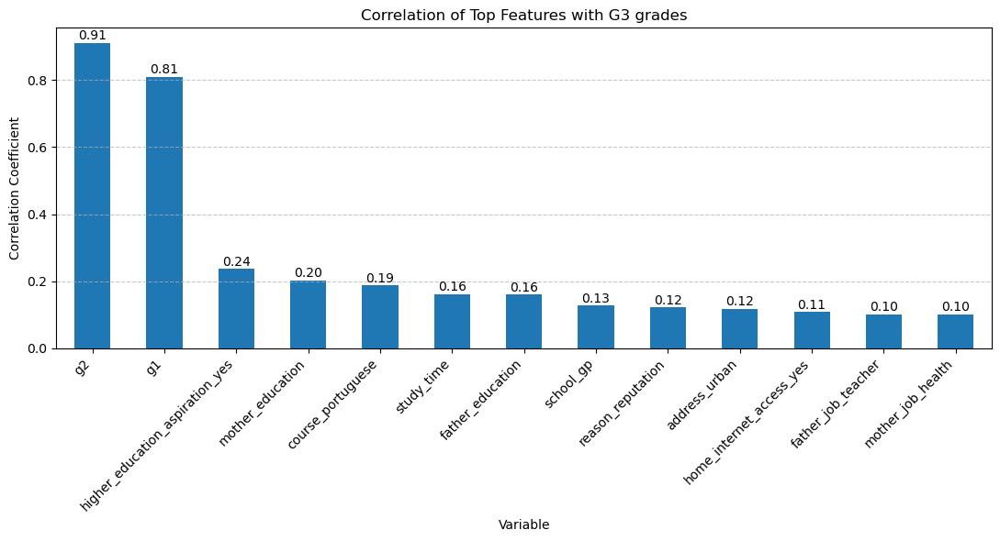

In [208]:
# Filtering and sorting the correlations > 0.1
positive_corr = corr_with_g3[corr_with_g3 > 0.1].sort_values(ascending=False)

plt.figure(figsize=(11, 6))
ax = positive_corr.plot(kind='bar')

plt.title('Correlation of Top Features with G3 grades')
plt.ylabel('Correlation Coefficient')
plt.xlabel('Variable')
plt.xticks(rotation=45, ha='right')
for i, v in enumerate(positive_corr):
    ax.text(i, v + 0.01, f"{v:.2f}", ha='center')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)

### VIF

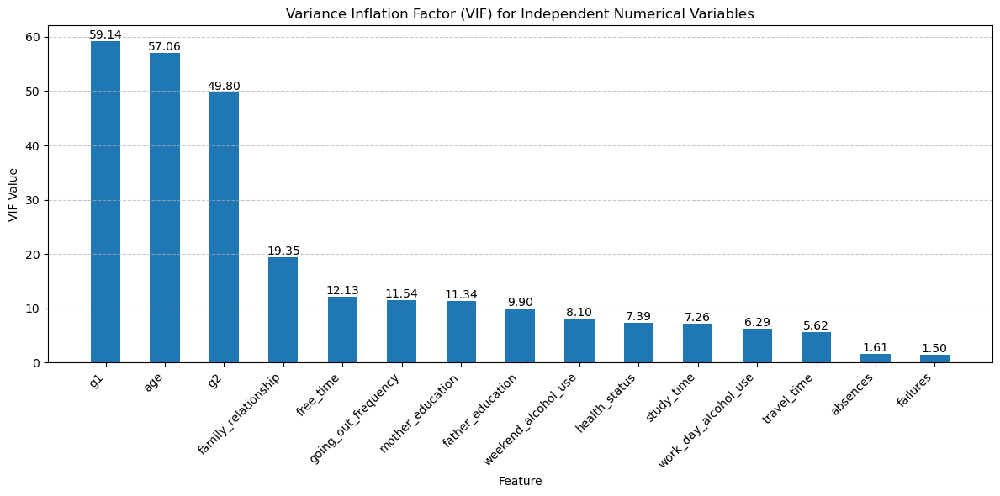

                 feature        VIF
13                    g1  59.140642
0                    age  57.061208
14                    g2  49.799753
6    family_relationship  19.349372
7              free_time  12.132417
8    going_out_frequency  11.537831
1       mother_education  11.340079
2       father_education   9.901142
10   weekend_alcohol_use   8.103103
11         health_status   7.385266
4             study_time   7.257896
9   work_day_alcohol_use   6.290331
3            travel_time   5.617128
12              absences   1.611638
5               failures   1.504068


In [209]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
# df_1 containing only the independent numerical variables
X = df_1.select_dtypes(include=['number']).drop(columns=['g3'])

vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

vif_data = vif_data.sort_values(by="VIF", ascending=False)

plt.figure(figsize=(12,6))
bars = plt.bar(vif_data["feature"], vif_data["VIF"], width=0.5)

plt.title("Variance Inflation Factor (VIF) for Independent Numerical Variables")
plt.ylabel("VIF Value")
plt.xlabel("Feature")
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2,
             height,
             f"{height:.2f}",
             ha='center',
             va='bottom')

plt.tight_layout()
plt.show()

print(vif_data)

## Multiple Linear Regression

In [210]:
from sklearn.model_selection import train_test_split

In [211]:
df_1.columns

Index(['age', 'mother_education', 'father_education', 'travel_time',
       'study_time', 'failures', 'family_relationship', 'free_time',
       'going_out_frequency', 'work_day_alcohol_use', 'weekend_alcohol_use',
       'health_status', 'absences', 'g1', 'g2', 'g3', 'absences_bin', 'g1_bin',
       'g2_bin', 'failures_bin', 'school_gp', 'school_ms', 'gender_female',
       'gender_male', 'address_rural', 'address_urban',
       'family_size_greater_3', 'family_size_less_equal_3',
       'parent_status_apart', 'parent_status_together', 'mother_job_at_home',
       'mother_job_health', 'mother_job_other', 'mother_job_services',
       'mother_job_teacher', 'father_job_at_home', 'father_job_health',
       'father_job_other', 'father_job_services', 'father_job_teacher',
       'reason_course', 'reason_home', 'reason_other', 'reason_reputation',
       'guardian_father', 'guardian_mother', 'guardian_other',
       'school_support_no', 'school_support_yes', 'family_support_no',
       'fa

### MLR 1

In [212]:
X_1 = df_1[['age', 'mother_education', 'father_education', 'travel_time',
       'study_time', 'failures', 'family_relationship', 'free_time',
       'going_out_frequency', 'work_day_alcohol_use', 'weekend_alcohol_use',
       'health_status', 'absences', 'g2', 'school_gp', 'school_ms', 'gender_female', 'gender_male',
       'address_rural', 'address_urban', 'family_size_greater_3',
       'family_size_less_equal_3', 'parent_status_apart',
       'parent_status_together', 'mother_job_at_home', 'mother_job_health',
       'mother_job_other', 'mother_job_services', 'mother_job_teacher',
       'father_job_at_home', 'father_job_health', 'father_job_other',
       'father_job_services', 'father_job_teacher', 'reason_course',
       'reason_home', 'reason_other', 'reason_reputation', 'guardian_father',
       'guardian_mother', 'guardian_other', 'school_support_no',
       'school_support_yes', 'family_support_no', 'family_support_yes',
       'extra_paid_classes_no', 'extra_paid_classes_yes',
       'extra_curricular_activities_no', 'extra_curricular_activities_yes',
       'attended_nursery_no', 'attended_nursery_yes',
       'higher_education_aspiration_no', 'higher_education_aspiration_yes',
       'home_internet_access_no', 'home_internet_access_yes',
       'in_relationship_no', 'in_relationship_yes', 'course_math',
       'course_portuguese']]
y_1 = df_1['g3']

In [213]:
X_1_train, X_1_test, y_1_train, y_1_test = train_test_split(X_1, y_1, test_size=0.2, random_state= 42)

In [214]:
# training the model

In [215]:
from sklearn.linear_model import LinearRegression

In [216]:
lr_1 = LinearRegression()

In [217]:
lr_1.fit(X_1_train, y_1_train)

LinearRegression()

In [218]:
lr_1.score(X_1_train, y_1_train)

0.8508465632939305

In [219]:
lr_1.score(X_1_test, y_1_test)

0.7991231454487978

In [220]:
lr_1.coef_

array([-7.31176866e-02, -1.94097010e-02,  1.14937392e-02,  1.66958837e-01,
       -4.42662591e-02, -3.51698823e-01,  7.82278250e-02, -4.95369723e-02,
        8.43355742e-02,  6.90333731e-03,  1.61858717e-02, -1.21463303e-02,
        2.65825450e-02,  1.03649975e+00,  7.49471961e-02, -7.49471961e-02,
        4.25574866e-02, -4.25574866e-02, -7.03435245e-02,  7.03435245e-02,
       -3.15911024e-02,  3.15911024e-02,  9.38436587e-04, -9.38436587e-04,
       -1.70328887e-01,  1.19564929e-01, -1.13578687e-01,  1.09679938e-01,
        5.46627069e-02,  2.64795826e-01,  3.68929463e-02,  2.84429395e-02,
       -1.65252372e-01, -1.64879339e-01,  1.33012896e-01, -5.59594712e-02,
       -1.39627043e-01,  6.25736182e-02, -2.16250749e-01, -1.35798414e-01,
        3.52049163e-01,  5.97676163e-02, -5.97676163e-02, -2.99065193e-02,
        2.99065193e-02,  3.19783418e-02, -3.19783418e-02,  8.04908163e-02,
       -8.04908163e-02,  1.15410898e-01, -1.15410898e-01, -7.68721473e-02,
        7.68721473e-02,  

In [221]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [222]:
y_1_pred =lr_1.predict(X_1_test)
y_1_pred

array([10.55888131,  8.36609977, 14.11628766, 11.15376239, 12.27305681,
       12.53758079,  5.34546587, 10.41146344, 14.42715922, 13.39446685,
       14.69869689,  7.06732197,  7.1491866 , 11.18630128,  7.8373624 ,
       10.90185261,  8.409403  , 16.78274126, 10.6372865 , 12.44299904,
        9.08090088, 15.82840861, 11.23358763,  0.09739699, 15.40261507,
       11.39290203, 17.339219  , 15.99810745, 11.67288622,  8.60857756,
       10.61813009,  9.50628087, 18.92190779, 11.56719569, 15.39628477,
       13.69388085, 15.07161326, 18.35549599,  9.89448822, 13.29660697,
       15.95771325, 16.37238395, 11.59319114,  8.58396877, 14.68653201,
       10.01264891, 11.04176715, 16.34694901, 12.55249505, 10.96285874,
       11.28357576, 14.3844133 ,  9.9732932 , 10.56406771,  6.17630228,
       10.88226814, 11.20074526, 13.76492985, 17.4251355 ,  7.60597215,
       11.41720815,  7.84178797,  7.34687609, 12.84795036,  5.86517887,
        9.31633419,  9.1204508 ,  6.44660648,  9.78506531, 18.59

In [223]:
mean_absolute_error(y_1_test, y_1_pred)

1.01021761213912

In [224]:
mean_squared_error(y_1_test, y_1_pred)

3.105720529750398

In [225]:
r2_score(y_1_test, y_1_pred)

0.7991231454487978

In [226]:
lr_1.intercept_

np.float64(0.2703573975581115)


Top 15 features influencing G3 grades:

                        feature  coefficient
                             g2     1.036500
                 guardian_other     0.352049
              course_portuguese     0.299604
             father_job_at_home     0.264796
                    travel_time     0.166959
                  reason_course     0.133013
              mother_job_health     0.119565
            attended_nursery_no     0.115411
            mother_job_services     0.109680
            going_out_frequency     0.084336
 extra_curricular_activities_no     0.080491
            family_relationship     0.078228
higher_education_aspiration_yes     0.076872
                      school_gp     0.074947
                  address_urban     0.070344


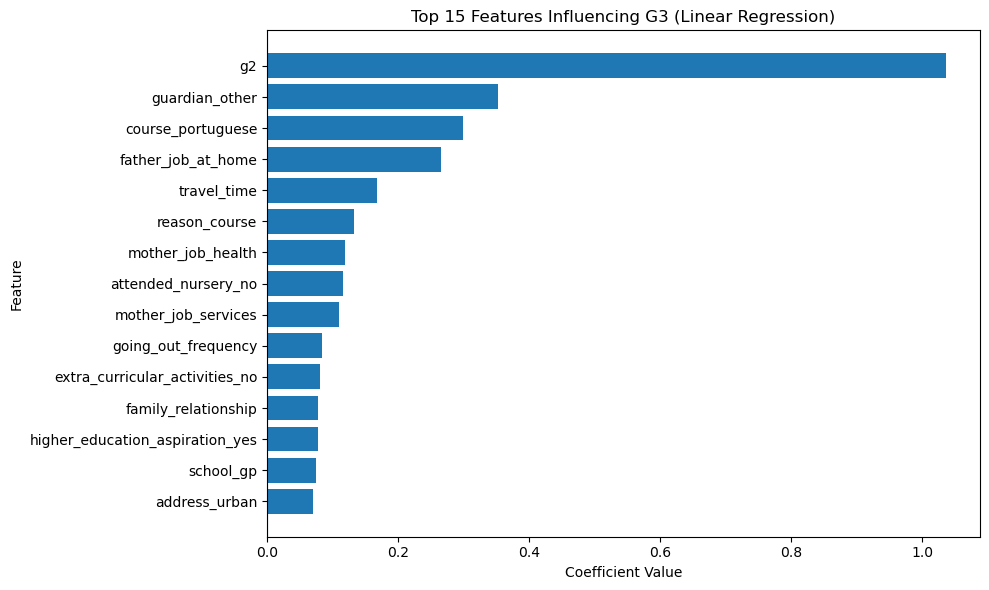

In [227]:
# discovering the highest 15 features influencing G3 grade

coef_df_1 = pd.DataFrame({
    'feature': X_1.columns,
    'coefficient': lr_1.coef_
})

coef_df_1['abs_coefficient'] = coef_df_1['coefficient'].abs()

top_15_1 = (
    coef_df_1[coef_df_1['coefficient'] > 0]
    .sort_values('coefficient', ascending=False)
    .head(15)
)

print("\nTop 15 features influencing G3 grades:\n")
print(top_15_1[['feature', 'coefficient']].to_string(index=False))

plt.figure(figsize=(10, 6))
plt.barh(top_15_1['feature'], top_15_1['coefficient'])
plt.axvline(0)  
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.title('Top 15 Features Influencing G3 (Linear Regression)')
plt.gca().invert_yaxis() 
plt.tight_layout()
plt.show()

### MLR 2

In [228]:
# discovering the highest 15 features influencing G3 grade excluding G2 and G1 grades because of multicollinearity

X_2 = df_1[['age', 'mother_education', 'father_education', 'travel_time',
       'study_time', 'failures', 'family_relationship', 'free_time',
       'going_out_frequency', 'work_day_alcohol_use', 'weekend_alcohol_use',
       'health_status', 'absences', 'school_gp', 'school_ms', 'gender_female', 'gender_male',
       'address_rural', 'address_urban', 'family_size_greater_3',
       'family_size_less_equal_3', 'parent_status_apart',
       'parent_status_together', 'mother_job_at_home', 'mother_job_health',
       'mother_job_other', 'mother_job_services', 'mother_job_teacher',
       'father_job_at_home', 'father_job_health', 'father_job_other',
       'father_job_services', 'father_job_teacher', 'reason_course',
       'reason_home', 'reason_other', 'reason_reputation', 'guardian_father',
       'guardian_mother', 'guardian_other', 'school_support_no',
       'school_support_yes', 'family_support_no', 'family_support_yes',
       'extra_paid_classes_no', 'extra_paid_classes_yes',
       'extra_curricular_activities_no', 'extra_curricular_activities_yes',
       'attended_nursery_no', 'attended_nursery_yes',
       'higher_education_aspiration_no', 'higher_education_aspiration_yes',
       'home_internet_access_no', 'home_internet_access_yes',
       'in_relationship_no', 'in_relationship_yes', 'course_math',
       'course_portuguese']]
y_2 = df_1['g3']

In [229]:
X_2_train, X_2_test, y_2_train, y_2_test = train_test_split(X_2, y_2, test_size=0.2, random_state= 42)

In [230]:
# training the model

In [231]:
lr_2 = LinearRegression()

In [232]:
lr_2.fit(X_2_train, y_2_train)

LinearRegression()

In [233]:
lr_2.score(X_2_train, y_2_train)

0.3094721197536533

In [234]:
lr_2.score(X_2_test, y_2_test)

0.1185460689973421

In [235]:
lr_2.coef_

array([ 1.84831009e-02,  1.03313539e-01,  1.51860332e-01,  3.67921799e-02,
        4.25713006e-01, -1.93843091e+00,  1.66599585e-01,  5.74752059e-02,
       -1.30789517e-01, -1.12241651e-01,  4.49942772e-02, -2.11244476e-01,
       -3.11850887e-03,  4.25860149e-01, -4.25860149e-01,  6.33339089e-02,
       -6.33339089e-02, -2.63860915e-01,  2.63860915e-01, -2.09212311e-01,
        2.09212311e-01, -7.54628990e-02,  7.54628990e-02, -5.06465111e-01,
        8.54623831e-01, -3.77614549e-01,  2.87328273e-01, -2.57872444e-01,
        4.02091457e-02, -4.35700540e-01, -1.36579501e-01, -3.11092419e-01,
        8.43163314e-01, -1.29881802e-02,  3.79934621e-02, -2.41418811e-01,
        2.16413530e-01, -4.00815235e-01, -5.12652855e-01,  9.13468090e-01,
        6.76776875e-01, -6.76776875e-01,  2.08091603e-01, -2.08091603e-01,
       -1.81610810e-01,  1.81610810e-01,  1.42119519e-03, -1.42119519e-03,
        1.03144554e-01, -1.03144554e-01, -8.50374219e-01,  8.50374219e-01,
       -5.92518192e-02,  

In [236]:
y_2_pred =lr_2.predict(X_2_test)
y_2_pred

array([10.02403227, 11.00944102, 11.90052432, 12.42714216, 13.55850132,
       12.16817639,  6.97477328, 11.36091624, 12.82478154, 13.27330129,
       10.83219792, 11.03137694,  9.55194111, 11.7918735 , 11.91465003,
        5.67411998,  5.8857477 , 11.07046203, 10.55106884, 13.44270794,
       11.6618395 , 11.79012722, 10.0146566 , 12.47086466, 10.3127303 ,
       13.29873523, 11.48913523, 12.15612903, 11.81838357,  9.73844101,
       11.14096874,  8.82888229, 13.62973668, 11.79482945, 12.5500883 ,
       10.01727493,  9.50739227, 11.87235742,  7.87233219, 12.56293124,
       13.0590064 , 12.38181013, 11.27445149, 10.98733288, 11.957824  ,
       10.17286724, 11.70440818, 11.21742763, 12.0802237 , 12.29953202,
       12.27558701, 12.15609716, 11.39169387, 11.70819154,  9.68392691,
       11.33336646, 11.18314544, 13.19576294, 11.99806483,  7.18360527,
       12.31257364, 11.82680711,  8.19189234, 13.79209513,  5.73033046,
       10.96803386, 10.27839148,  9.36039036, 12.33690841, 10.65

In [237]:
mean_absolute_error(y_2_test, y_2_pred)

2.617497104027545

In [238]:
mean_squared_error(y_2_test, y_2_pred)

13.62799898306035

In [239]:
r2_score(y_2_test, y_2_pred)

0.1185460689973421

In [240]:
lr_2.intercept_

np.float64(9.37062460588481)


Top 15 features influencing G3 grades:

                        feature  coefficient
              course_portuguese     0.968345
                 guardian_other     0.913468
              mother_job_health     0.854624
higher_education_aspiration_yes     0.850374
             father_job_teacher     0.843163
              school_support_no     0.676777
                      school_gp     0.425860
                     study_time     0.425713
             in_relationship_no     0.315561
            mother_job_services     0.287328
                  address_urban     0.263861
              reason_reputation     0.216414
       family_size_less_equal_3     0.209212
              family_support_no     0.208092
         extra_paid_classes_yes     0.181611


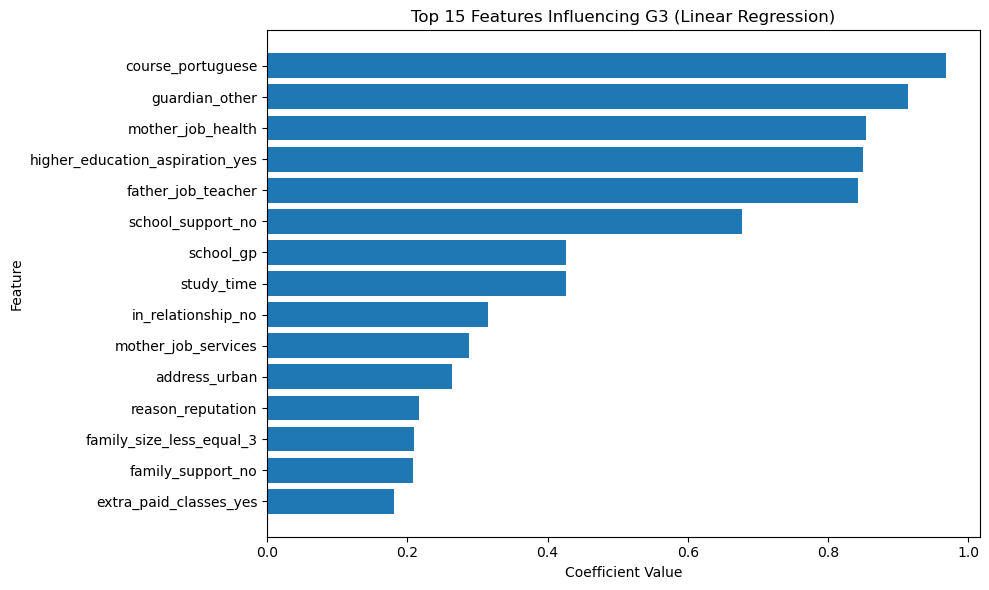

In [241]:
# discovering the highest 15 features influencing G3 grade excluding features g1 and g2 to avoid multicollinearity

coef_df_2 = pd.DataFrame({
    'feature': X_2.columns,
    'coefficient': lr_2.coef_
})

coef_df_2['abs_coefficient'] = coef_df_2['coefficient'].abs()

top_15_2 = (
    coef_df_2[coef_df_2['coefficient'] > 0]
    .sort_values('coefficient', ascending=False)
    .head(15)
)

print("\nTop 15 features influencing G3 grades:\n")
print(top_15_2[['feature', 'coefficient']].to_string(index=False))

plt.figure(figsize=(10, 6))
plt.barh(top_15_2['feature'], top_15_2['coefficient'])
plt.axvline(0)  
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.title('Top 15 Features Influencing G3 (Linear Regression)')
plt.gca().invert_yaxis()  
plt.tight_layout()
plt.show()

### MLR 3 (scaling features)

In [242]:
# scaling features to run multiple linear regression including g2 features

X_3 = df_1[['age', 'mother_education', 'father_education', 'travel_time',
       'study_time', 'failures', 'family_relationship', 'free_time',
       'going_out_frequency', 'work_day_alcohol_use', 'weekend_alcohol_use',
       'health_status', 'absences', 'g1', 'g2', 'school_gp', 'school_ms', 'gender_female', 'gender_male',
       'address_rural', 'address_urban', 'family_size_greater_3',
       'family_size_less_equal_3', 'parent_status_apart',
       'parent_status_together', 'mother_job_at_home', 'mother_job_health',
       'mother_job_other', 'mother_job_services', 'mother_job_teacher',
       'father_job_at_home', 'father_job_health', 'father_job_other',
       'father_job_services', 'father_job_teacher', 'reason_course',
       'reason_home', 'reason_other', 'reason_reputation', 'guardian_father',
       'guardian_mother', 'guardian_other', 'school_support_no',
       'school_support_yes', 'family_support_no', 'family_support_yes',
       'extra_paid_classes_no', 'extra_paid_classes_yes',
       'extra_curricular_activities_no', 'extra_curricular_activities_yes',
       'attended_nursery_no', 'attended_nursery_yes',
       'higher_education_aspiration_no', 'higher_education_aspiration_yes',
       'home_internet_access_no', 'home_internet_access_yes',
       'in_relationship_no', 'in_relationship_yes', 'course_math',
       'course_portuguese']]
y_3 = df_1['g3']

In [243]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_3_scaled = scaler.fit_transform(X_3)


In [244]:
X_3_scaled_train, X_3_scaled_test, y_3_train, y_3_test = train_test_split(X_3_scaled, y_3, test_size=0.2, random_state= 42)

In [245]:
lr_3 = LinearRegression()

In [246]:
lr_3.fit(X_3_scaled_train, y_3_train)

LinearRegression()

In [247]:
lr_3.score(X_3_scaled_train, y_3_train)

0.854369306789487

In [248]:
lr_3.score(X_3_scaled_test, y_3_test)

0.7996635665959497

In [249]:
lr_3.coef_

array([-8.41146132e-02, -1.72822618e-02,  2.90239975e-03,  1.16067148e-01,
       -6.21342232e-02, -2.14893227e-01,  7.47569371e-02, -5.52134558e-02,
        9.22071441e-02,  1.05997015e-02,  3.73096595e-02, -2.58703163e-02,
        1.66707399e-01,  4.69241546e-01,  3.02733302e+00,  2.14644480e-02,
       -2.14644480e-02,  1.86015676e-02, -1.86015676e-02, -3.52332251e-02,
        3.52332251e-02, -8.81765146e-03,  8.81765146e-03,  2.76710091e-03,
       -2.76710091e-03, -4.67229284e-02,  3.01341481e-02, -3.03193930e-02,
        4.50437110e-02,  1.77928568e-02,  6.16112320e-02,  2.29914053e-02,
        3.33138710e-02, -5.13502278e-02, -5.18072795e-02,  5.50565814e-02,
       -4.02538191e-02, -4.91220769e-02,  1.22786486e-02, -5.36576923e-02,
       -1.24878290e-02,  1.11413114e-01, -1.77244128e-03,  1.77244128e-03,
       -1.88143848e-02,  1.88143848e-02,  4.53727076e-03, -4.53727076e-03,
        3.98038666e-02, -3.98038666e-02,  4.14731214e-02, -4.14731214e-02,
       -9.25484377e-03,  

In [250]:
y_3_pred =lr_3.predict(X_3_scaled_test)
y_3_pred

array([10.4673792 ,  8.22345928, 14.33031976, 11.0440093 , 12.27221811,
       12.54730455,  5.56816949, 10.42655814, 14.65178055, 13.40482264,
       14.91514483,  6.7278814 ,  7.28833282, 11.31368225,  7.69168422,
       11.19556542,  8.80175527, 17.18753669, 10.94590334, 12.09125514,
        9.13077162, 16.12318517, 11.14163004,  0.65192306, 15.85528715,
       11.51811342, 17.65037319, 16.04786439, 11.47616524,  8.60865569,
       10.4276628 ,  9.44692315, 19.06938159, 11.35534012, 15.53428563,
       13.37042624, 14.65464855, 18.46558072,  9.78386753, 13.24900446,
       15.98720114, 16.22965122, 11.51133201,  8.23630239, 14.4914561 ,
        9.89406429, 10.85226796, 16.3427782 , 12.99019843, 10.85740191,
       11.3651487 , 14.59816145, 10.09621306, 10.16870543,  5.94554448,
       10.68240398, 11.02639691, 13.78950697, 17.51010065,  7.26350168,
       10.98896681,  8.04207991,  7.60340241, 12.96175093,  6.01170805,
        9.41375562,  8.86689976,  6.15514545,  9.79261216, 18.81

In [251]:
r2_1 = r2_score(y_3_test, y_3_pred)
mae_1 = mean_absolute_error(y_3_test, y_3_pred)
mse_1 = mean_squared_error(y_3_test, y_3_pred)
print(f"R2 Score = {r2_1}")
print(f"MAE = {mae_1}")
print(f"MSE = {mse_1}")

R2 Score = 0.7996635665959497
MAE = 1.0168877078816252
MSE = 3.097365176640301


In [252]:
lr_3.intercept_

np.float64(11.352576207337739)

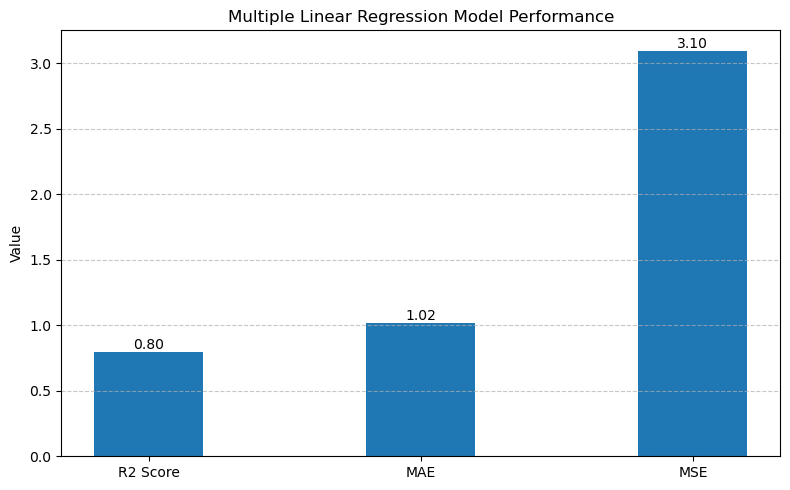

In [253]:
metrics = ['R2 Score', 'MAE', 'MSE']
values = [r2_1, mae_1, mse_1]

plt.figure(figsize=(8,5))
bars = plt.bar(metrics, values, width=0.4)

plt.title('Multiple Linear Regression Model Performance')
plt.ylabel('Value')

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height,
             f'{height:.2f}', ha='center', va='bottom')

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


Top 7 features influencing G3 grades (Multiple Linear Regression):

            feature  coefficient
                 g2     3.027333
                 g1     0.469242
           absences     0.166707
  course_portuguese     0.149898
        travel_time     0.116067
     guardian_other     0.111413
going_out_frequency     0.092207


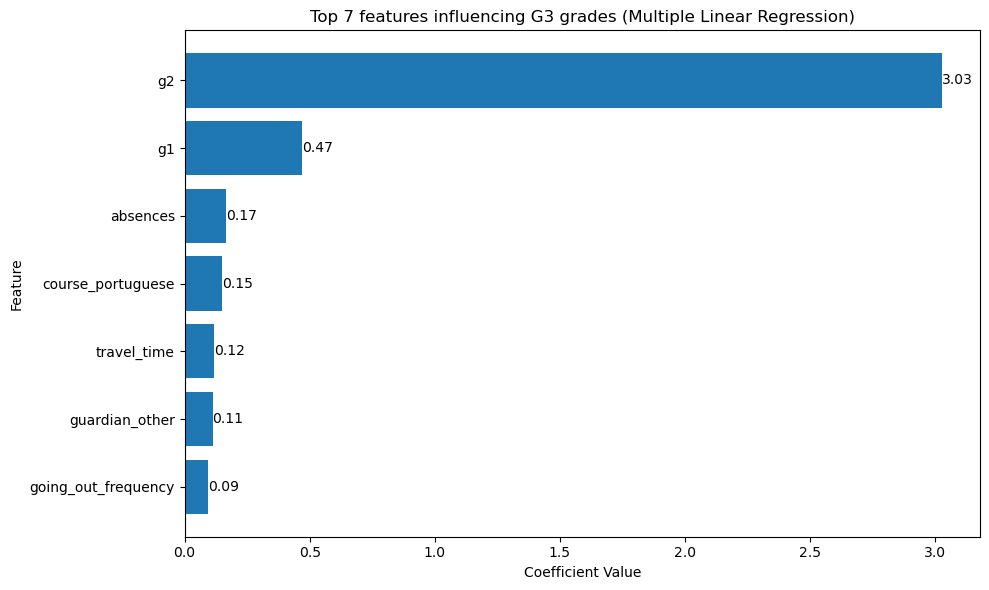

In [254]:
# discovering the highest 15 features influencing G3 grade after scaling

coef_df_3 = pd.DataFrame({
    'feature': X_3.columns,
    'coefficient': lr_3.coef_
})

coef_df_3['abs_coefficient'] = coef_df_3['coefficient'].abs()

top_15_3 = (
    coef_df_3[coef_df_3['coefficient'] > 0.08]
    .sort_values('coefficient', ascending=False)
    .head(15)
)

print("\nTop 7 features influencing G3 grades (Multiple Linear Regression):\n")
print(top_15_3[['feature', 'coefficient']].to_string(index=False))

plt.figure(figsize=(10, 6))
ax = plt.barh(top_15_3['feature'], top_15_3['coefficient'])

plt.axvline(0)
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.title('Top 7 features influencing G3 grades (Multiple Linear Regression)')
plt.gca().invert_yaxis()

for bar in ax:
    width = bar.get_width()
    y = bar.get_y() + bar.get_height()/2
    plt.text(width, y, f'{width:.2f}', va='center', ha='left')

plt.tight_layout()
plt.show()

### MLR 4 (scaling features)

In [255]:
# scaling features to run multiple linear regression excluding variables excluded for multicollinearity

X_4 = df_1[['father_education', 'travel_time', 'study_time', 'failures', 'work_day_alcohol_use', 'health_status', 'absences', 'school_ms', 
            'gender_male', 'address_urban', 'family_size_greater_3', 'parent_status_apart', 'parent_status_together', 'mother_job_at_home', 
            'mother_job_health', 'mother_job_other', 'mother_job_services', 'mother_job_teacher', 'father_job_at_home', 'father_job_health', 
            'father_job_other', 'father_job_services', 'father_job_teacher', 'reason_course', 'reason_home', 'reason_other', 'reason_reputation', 
            'guardian_father', 'guardian_other', 'school_support_yes', 'family_support_yes', 'extra_paid_classes_yes', 'extra_curricular_activities_yes',
       'attended_nursery_yes', 'higher_education_aspiration_yes', 'home_internet_access_yes', 'in_relationship_yes', 'course_portuguese']]
y_4 = df_1['g3']

In [256]:
X_4_scaled = scaler.fit_transform(X_4)

In [257]:
X_4_scaled_train, X_4_scaled_test, y_4_train, y_4_test = train_test_split(X_4_scaled, y_4, test_size=0.2, random_state= 42)

In [258]:
lr_4 = LinearRegression()

In [259]:
lr_4.fit(X_4_scaled_train, y_4_train)

LinearRegression()

In [260]:
lr_4.score(X_4_scaled_train, y_4_train)

0.3066643017110311

In [261]:
lr_4.score(X_4_scaled_test, y_4_test)

0.10168436701855643

In [262]:
lr_4.coef_

array([ 0.21476322,  0.01250835,  0.34822675, -1.28043929, -0.11055159,
       -0.28138325, -0.02200921, -0.37521494, -0.02970424,  0.22705406,
       -0.19042554, -0.02566505,  0.02566505, -0.17294123,  0.25870821,
       -0.14482238,  0.17168192, -0.01238673,  0.02966403, -0.07418048,
       -0.01166587, -0.08771158,  0.21751922, -0.02728866, -0.00290426,
       -0.07942981,  0.0913418 ,  0.05030854,  0.36919588, -0.43041895,
       -0.20181711,  0.15627954, -0.00273108, -0.08022951,  0.48603228,
        0.05082348, -0.29715195,  0.93489234])

In [263]:
y_4_pred =lr_4.predict(X_4_scaled_test)
y_4_pred

array([10.27881137, 10.79032919, 11.88649939, 11.99301792, 13.29590556,
       12.29737397,  6.94232592, 11.20962999, 12.81297297, 13.30114109,
       10.58024041, 11.31914739,  9.27875793, 11.8928974 , 11.85687187,
        5.61569837,  6.38685999, 11.48274092, 10.43311297, 13.36522148,
       11.639801  , 11.63634929, 10.11459989, 12.53423165, 10.26730735,
       13.75049809, 11.7347943 , 12.07250238, 11.85155962,  9.73733057,
       11.29579947,  8.74065368, 13.4143446 , 12.01902599, 12.67905373,
       10.11451333,  9.72229965, 11.83958812,  7.95260617, 12.57254087,
       13.08713903, 12.35280003, 11.2353181 , 11.11948912, 11.85840477,
       10.01622273, 11.95115491, 11.18870699, 12.19777052, 12.32217954,
       12.25906677, 12.46732883, 11.47905015, 11.61168617,  9.70022334,
       11.01471268, 11.41765438, 13.16901369, 12.02228174,  7.23501379,
       12.24853153, 12.02801133,  8.10884701, 14.02008209,  5.80167459,
       10.96933449, 10.02205572,  9.43541053, 12.57006664, 10.59

In [264]:
r2_2 = r2_score(y_4_test, y_4_pred)
mae_2 = mean_absolute_error(y_4_test, y_4_pred)
mse_2 = mean_squared_error(y_4_test, y_4_pred)
print(f"R2 Score = {r2_2}")
print(f"MAE = {mae_2}")
print(f"MSE = {mse_2}")

R2 Score = 0.10168436701855643
MAE = 2.6300603167919046
MSE = 13.888694691976378


In [265]:
lr_4.intercept_

np.float64(11.35515881179756)

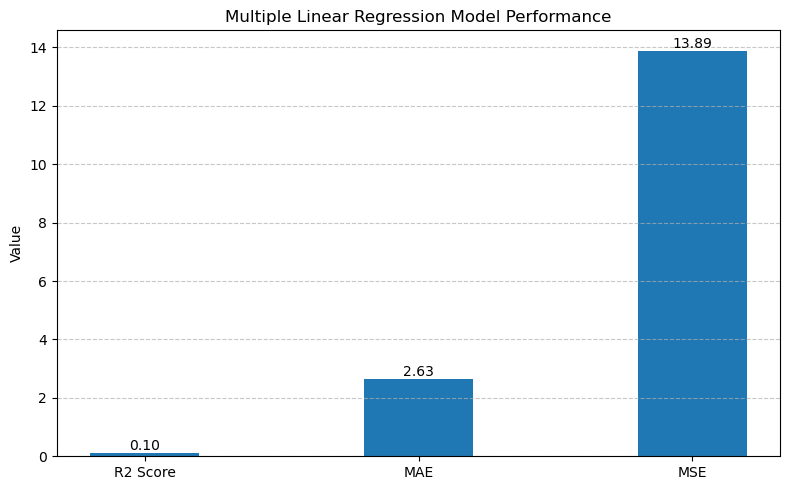

In [266]:
metrics = ['R2 Score', 'MAE', 'MSE']
values = [r2_2, mae_2, mse_2]

plt.figure(figsize=(8,5))
bars = plt.bar(metrics, values, width=0.4)

plt.title('Multiple Linear Regression Model Performance')
plt.ylabel('Value')

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height,
             f'{height:.2f}', ha='center', va='bottom')

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


Top 15 features influencing G3 grades after scaling:

                        feature  coefficient
              course_portuguese     0.934892
higher_education_aspiration_yes     0.486032
                 guardian_other     0.369196
                     study_time     0.348227
              mother_job_health     0.258708
                  address_urban     0.227054
             father_job_teacher     0.217519
               father_education     0.214763
            mother_job_services     0.171682
         extra_paid_classes_yes     0.156280
              reason_reputation     0.091342
       home_internet_access_yes     0.050823
                guardian_father     0.050309
             father_job_at_home     0.029664
         parent_status_together     0.025665


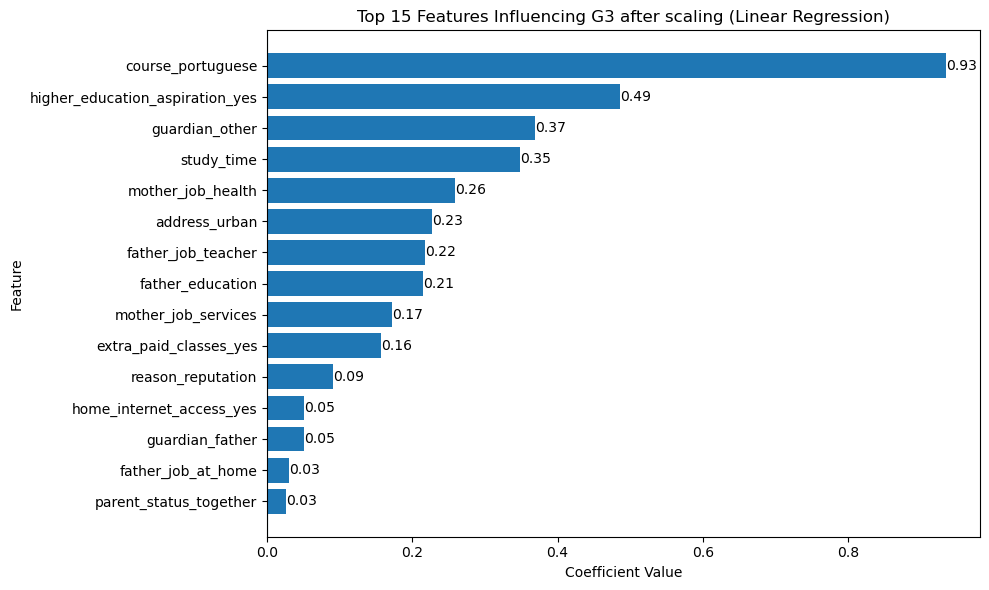

In [267]:
# discovering the highest 15 features influencing G3 grade (excluding features g1 and g2) after scaling

coef_df_4 = pd.DataFrame({
    'feature': X_4.columns,
    'coefficient': lr_4.coef_
})

coef_df_4['abs_coefficient'] = coef_df_4['coefficient'].abs()

top_15_4 = (
    coef_df_4[coef_df_4['coefficient'] > 0]
    .sort_values('coefficient', ascending=False)
    .head(15)
)

print("\nTop 15 features influencing G3 grades after scaling:\n")
print(top_15_4[['feature', 'coefficient']].to_string(index=False))

plt.figure(figsize=(10, 6))
ax = plt.barh(top_15_4['feature'], top_15_4['coefficient'])
plt.axvline(0) 
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.title('Top 15 Features Influencing G3 after scaling (Linear Regression)')
plt.gca().invert_yaxis()  

for bar in ax:
    width = bar.get_width()
    y = bar.get_y() + bar.get_height()/2
    plt.text(width, y, f'{width:.2f}', va='center', ha='left')
plt.tight_layout()
plt.show()

## Decision Tree Regressor

### DTR 1

In [268]:
X_5 = df_1[['age', 'mother_education', 'father_education', 'travel_time',
       'study_time', 'failures', 'family_relationship', 'free_time',
       'going_out_frequency', 'work_day_alcohol_use', 'weekend_alcohol_use',
       'health_status', 'absences', 'g1', 'g2', 'school_gp', 'school_ms', 'gender_female', 'gender_male',
       'address_rural', 'address_urban', 'family_size_greater_3',
       'family_size_less_equal_3', 'parent_status_apart',
       'parent_status_together', 'mother_job_at_home', 'mother_job_health',
       'mother_job_other', 'mother_job_services', 'mother_job_teacher',
       'father_job_at_home', 'father_job_health', 'father_job_other',
       'father_job_services', 'father_job_teacher', 'reason_course',
       'reason_home', 'reason_other', 'reason_reputation', 'guardian_father',
       'guardian_mother', 'guardian_other', 'school_support_no',
       'school_support_yes', 'family_support_no', 'family_support_yes',
       'extra_paid_classes_no', 'extra_paid_classes_yes',
       'extra_curricular_activities_no', 'extra_curricular_activities_yes',
       'attended_nursery_no', 'attended_nursery_yes',
       'higher_education_aspiration_no', 'higher_education_aspiration_yes',
       'home_internet_access_no', 'home_internet_access_yes',
       'in_relationship_no', 'in_relationship_yes', 'course_math',
       'course_portuguese']]
y_5 = df_1['g3']

In [269]:
X_5_train, X_5_test, y_5_train, y_5_test = train_test_split(X_5, y_5, test_size=0.2, random_state= 42)

In [270]:
from sklearn.tree import DecisionTreeRegressor

In [271]:
dtr_5 = DecisionTreeRegressor(max_depth=7, min_samples_leaf=18, random_state=42)

In [272]:
dtr_5.fit(X_5_train, y_5_train)

DecisionTreeRegressor(max_depth=7, min_samples_leaf=18, random_state=42)

In [273]:
y_5_pred = dtr_5.predict(X_5_test)
y_5_pred

array([10.92307692,  8.05      , 13.16666667, 10.95652174, 12.68965517,
       12.30769231,  1.94736842, 10.76666667, 14.90909091, 13.21212121,
       15.58823529,  1.94736842,  6.27777778, 10.3255814 ,  8.05      ,
       11.94444444,  7.09375   , 16.15625   , 11.38709677, 12.30769231,
        9.83870968, 16.15625   , 10.76666667,  1.94736842, 15.58823529,
       11.38709677, 17.23809524, 16.15625   , 10.76666667,  7.09375   ,
       10.        , 10.3255814 , 18.16      , 10.95652174, 15.05263158,
       14.14285714, 15.58823529, 18.16      , 10.92307692, 12.61904762,
       15.05263158, 17.23809524, 10.76666667,  7.09375   , 15.05263158,
       10.92307692, 10.95652174, 16.15625   , 12.30769231, 10.76666667,
       11.38709677, 15.58823529,  9.22222222, 10.3255814 ,  7.10526316,
       10.76666667, 10.76666667, 13.16666667, 17.23809524,  8.05      ,
       12.30769231,  7.09375   ,  6.27777778, 12.30769231,  7.10526316,
        8.85      , 10.3255814 ,  6.27777778,  9.83870968, 18.16

In [274]:
r2_5 = r2_score(y_5_test, y_5_pred)
mae_5 = mean_absolute_error(y_5_test, y_5_pred)
mse_5 = np.sqrt(mean_squared_error(y_5_test, y_5_pred))

print(f"R2 Score: {r2_5:.3f}")
print(f"MAE: {mae_5:.3f}")
print(f"MSE: {mse_5:.3f}")

R2 Score: 0.843
MAE: 0.935
MSE: 1.560


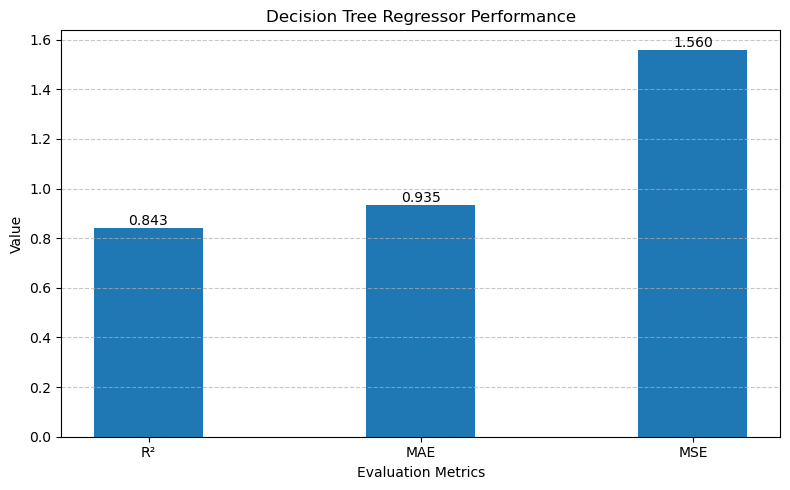

In [275]:
metrics = ['R²', 'MAE', 'MSE']
values = [r2_5, mae_5, mse_5]

plt.figure(figsize=(8,5))
bars = plt.bar(metrics, values, width=0.4)

plt.title("Decision Tree Regressor Performance")
plt.ylabel("Value")
plt.xlabel("Evaluation Metrics")
plt.grid(axis='y', linestyle='--', alpha=0.7)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2,
             height,
             f"{height:.3f}",
             ha='center',
             va='bottom')

plt.tight_layout()
plt.show()

In [276]:
from sklearn.model_selection import cross_val_score

In [277]:
cv_score = cross_val_score(dtr_5, X_5_train, y_5_train, cv=10)
print("Cross-validation scores:", cv_score)
print("Mean R²:", cv_score.mean().round(3))
print("Std R²:", cv_score.std().round(3))

Cross-validation scores: [0.788861   0.91892059 0.72961235 0.76990078 0.70150976 0.84072122
 0.90194293 0.86715047 0.88801036 0.88490717]
Mean R²: 0.829
Std R²: 0.073


In [278]:
dtr_5.feature_importances_

array([1.73860038e-04, 6.26783479e-04, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 7.47812740e-04,
       6.05947414e-02, 1.80586795e-03, 9.29070742e-01, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.19661140e-03,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       5.90436777e-04, 0.00000000e+00, 0.00000000e+00, 4.89705969e-04,
       1.31072090e-03, 0.00000000e+00, 1.74778692e-04, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 2.71151895e-04, 1.03653948e-05, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 1.55977378e-03, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
      

            feature  importance
                 g2    0.929071
           absences    0.060595
                 g1    0.001806
attended_nursery_no    0.001560
  course_portuguese    0.001377
        reason_home    0.001311
   mother_job_other    0.001197
      health_status    0.000748
   mother_education    0.000627
   father_job_other    0.000590


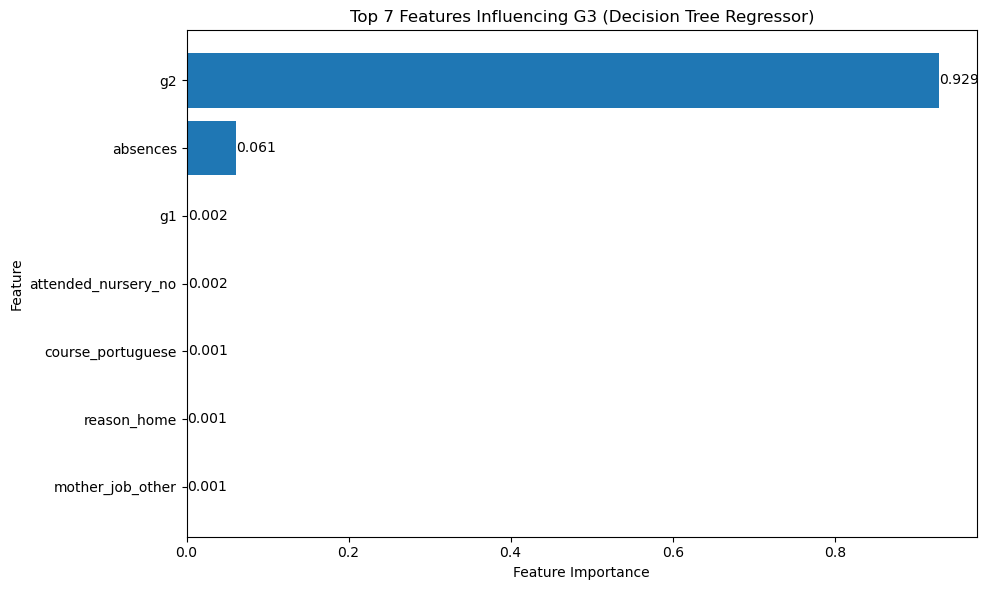

In [279]:
fi_5 = pd.DataFrame({
    "feature": X_5_train.columns,
    "importance": dtr_5.feature_importances_
}).sort_values("importance", ascending=False)

print(fi_5.head(10).to_string(index=False))

top_10_5 = fi_5.head(7)

plt.figure(figsize=(10, 6))
bars = plt.barh(top_10_5["feature"], top_10_5["importance"])

plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.title("Top 7 Features Influencing G3 (Decision Tree Regressor)")
plt.gca().invert_yaxis()

for bar in bars:
    width = bar.get_width()
    y = bar.get_y() + bar.get_height()/2
    plt.text(width,
             y,
             f"{width:.3f}",
             va='center',
             ha='left')

plt.tight_layout()
plt.show()

### DTR 2

In [280]:
X_6 = df_1[['age', 'mother_education', 'father_education', 'travel_time',
       'study_time', 'failures', 'family_relationship', 'free_time',
       'going_out_frequency', 'work_day_alcohol_use', 'weekend_alcohol_use',
       'health_status', 'absences', 'school_gp', 'school_ms', 'gender_female', 'gender_male',
       'address_rural', 'address_urban', 'family_size_greater_3',
       'family_size_less_equal_3', 'parent_status_apart',
       'parent_status_together', 'mother_job_at_home', 'mother_job_health',
       'mother_job_other', 'mother_job_services', 'mother_job_teacher',
       'father_job_at_home', 'father_job_health', 'father_job_other',
       'father_job_services', 'father_job_teacher', 'reason_course',
       'reason_home', 'reason_other', 'reason_reputation', 'guardian_father',
       'guardian_mother', 'guardian_other', 'school_support_no',
       'school_support_yes', 'family_support_no', 'family_support_yes',
       'extra_paid_classes_no', 'extra_paid_classes_yes',
       'extra_curricular_activities_no', 'extra_curricular_activities_yes',
       'attended_nursery_no', 'attended_nursery_yes',
       'higher_education_aspiration_no', 'higher_education_aspiration_yes',
       'home_internet_access_no', 'home_internet_access_yes',
       'in_relationship_no', 'in_relationship_yes', 'course_math',
       'course_portuguese']]
y_6 = df_1['g3']

In [281]:
X_6_train, X_6_test, y_6_train, y_6_test = train_test_split(X_6, y_6, test_size=0.2, random_state= 42)

In [282]:
dtr_6 = DecisionTreeRegressor(max_depth=5, min_samples_leaf=10, random_state=42)

In [283]:
dtr_6.fit(X_6_train, y_6_train)

DecisionTreeRegressor(max_depth=5, min_samples_leaf=10, random_state=42)

In [284]:
y_6_pred = dtr_6.predict(X_6_test)
y_6_pred

array([13.12844037, 13.12844037, 12.28395062, 13.12844037, 13.12844037,
       13.12844037,  6.35294118, 10.83544304, 12.28395062, 13.12844037,
       13.12844037, 10.83544304,  9.78125   , 12.28395062, 13.12844037,
        9.3       ,  6.35294118, 12.28395062,  9.3       , 13.12844037,
       13.12844037, 13.12844037, 12.28395062, 10.83544304, 10.83544304,
       12.28395062, 13.12844037, 13.12844037, 13.12844037, 13.12844037,
       12.28395062,  6.35294118, 13.12844037, 12.42857143, 12.28395062,
       10.83544304,  8.        , 13.12844037,  6.35294118, 12.28395062,
       12.28395062, 13.12844037, 12.28395062, 13.12844037, 13.12844037,
        7.7       , 13.12844037, 13.12844037, 13.12844037, 13.12844037,
       12.28395062, 13.12844037, 12.28395062, 13.12844037, 11.23076923,
        9.78125   , 12.28395062, 12.28395062, 12.28395062,  9.33333333,
        6.35294118, 13.12844037,  8.8       , 12.28395062,  8.8       ,
       10.875     ,  6.35294118,  9.78125   , 12.28395062,  9.78

In [285]:
r2_6 = r2_score(y_6_test, y_6_pred)
mae_6 = mean_absolute_error(y_6_test, y_6_pred)
rmse_6 = np.sqrt(mean_squared_error(y_6_test, y_6_pred))

print(f"R²: {r2_6:.3f}")
print(f"MAE: {mae_6:.3f}")
print(f"RMSE: {rmse_6:.3f}")

R²: 0.138
MAE: 2.744
RMSE: 3.652


In [286]:
cv_score_6 = cross_val_score(dtr_6, X_6_train, y_6_train, cv=10)
print("Cross-validation scores:", cv_score_6)
print("Mean R²:", cv_score_6.mean().round(3))
print("Std R²:", cv_score_6.std().round(3))

Cross-validation scores: [ 0.30273897  0.08843695 -0.01920377  0.309908    0.06627851  0.43863265
  0.22915228  0.1711667   0.26910519  0.44920469]
Mean R²: 0.231
Std R²: 0.147


In [287]:
dtr_6.feature_importances_

array([4.21573607e-03, 4.49273173e-02, 0.00000000e+00, 5.86716266e-02,
       2.71303031e-04, 4.88387971e-01, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 2.96284553e-03, 0.00000000e+00, 0.00000000e+00,
       2.05069969e-01, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 6.59266366e-03, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       5.27119531e-02, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 5.76412617e-02,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
      

                        feature  importance
                       failures    0.488388
                       absences    0.205070
                    travel_time    0.058672
higher_education_aspiration_yes    0.057641
              course_portuguese    0.054364
              school_support_no    0.052712
               mother_education    0.044927
                    course_math    0.024183
                  reason_course    0.006593
                            age    0.004216
           work_day_alcohol_use    0.002963
                     study_time    0.000271
                  health_status    0.000000
            weekend_alcohol_use    0.000000
            going_out_frequency    0.000000


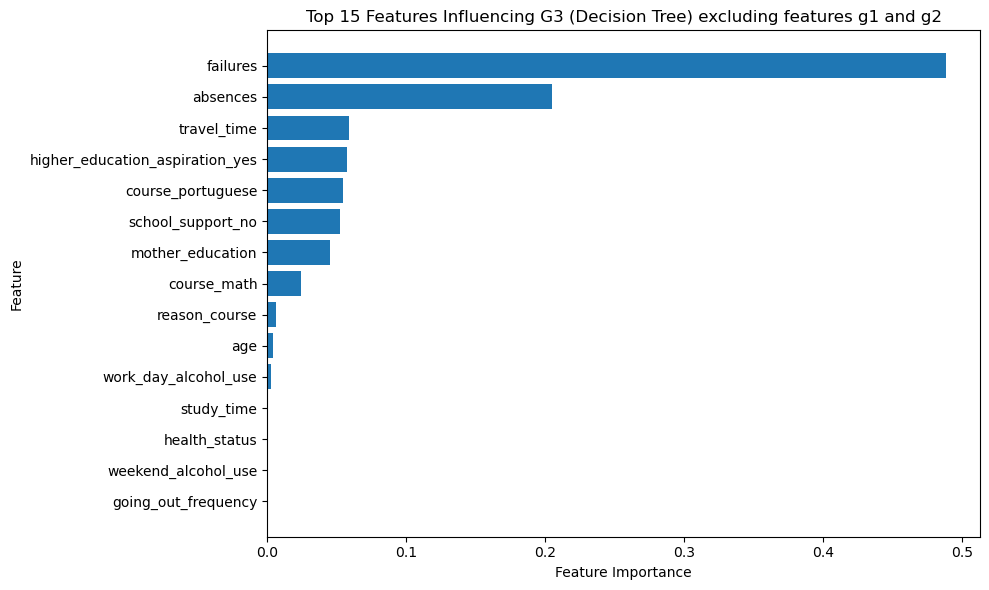

In [288]:
fi_6 = pd.DataFrame({
    "feature": X_6_train.columns,
    "importance": dtr_6.feature_importances_
}).sort_values("importance", ascending=False)

# listing top 15 features
print(fi_6.head(15).to_string(index=False))

top_15_6 = fi_6.head(15)
plt.figure(figsize=(10, 6))
plt.barh(top_15_6["feature"], top_15_6["importance"])
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.title("Top 15 Features Influencing G3 (Decision Tree) excluding features g1 and g2")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

## Random Forest Regressor

### RFR 1

In [289]:
X_7 = df_1[['age', 'mother_education', 'father_education', 'travel_time',
       'study_time', 'failures', 'family_relationship', 'free_time',
       'going_out_frequency', 'work_day_alcohol_use', 'weekend_alcohol_use',
       'health_status', 'absences', 'g1', 'g2', 'school_gp', 'school_ms', 'gender_female', 'gender_male',
       'address_rural', 'address_urban', 'family_size_greater_3',
       'family_size_less_equal_3', 'parent_status_apart',
       'parent_status_together', 'mother_job_at_home', 'mother_job_health',
       'mother_job_other', 'mother_job_services', 'mother_job_teacher',
       'father_job_at_home', 'father_job_health', 'father_job_other',
       'father_job_services', 'father_job_teacher', 'reason_course',
       'reason_home', 'reason_other', 'reason_reputation', 'guardian_father',
       'guardian_mother', 'guardian_other', 'school_support_no',
       'school_support_yes', 'family_support_no', 'family_support_yes',
       'extra_paid_classes_no', 'extra_paid_classes_yes',
       'extra_curricular_activities_no', 'extra_curricular_activities_yes',
       'attended_nursery_no', 'attended_nursery_yes',
       'higher_education_aspiration_no', 'higher_education_aspiration_yes',
       'home_internet_access_no', 'home_internet_access_yes',
       'in_relationship_no', 'in_relationship_yes', 'course_math',
       'course_portuguese']]
y_7 = df_1['g3']

In [290]:
X_7_train, X_7_test, y_7_train, y_7_test = train_test_split(X_7, y_7, test_size=0.2, random_state=42)

In [291]:
from sklearn.ensemble import RandomForestRegressor

In [292]:
rfr_7 = RandomForestRegressor(random_state = 42)

In [293]:
rfr_7.fit(X_7_train, y_7_train)

RandomForestRegressor(random_state=42)

In [294]:
y_7_pred = rfr_7.predict(X_7_test)
y_7_pred

array([10.28,  7.46, 13.12, 11.03, 13.19, 13.05,  2.99, 11.09, 14.6 ,
       13.55, 15.75,  4.99,  7.88, 10.79,  8.19, 11.91, 10.16, 15.59,
       11.15, 12.62, 10.08, 15.93, 11.25,  1.28, 15.47, 11.35, 17.72,
       16.38, 10.98,  8.13,  9.92, 10.24, 17.9 , 11.07, 15.18, 14.48,
       15.47, 18.45, 10.32, 13.11, 15.16, 16.81, 11.03,  6.89, 15.87,
       10.56, 11.04, 16.25, 12.53, 10.91, 11.32, 15.49, 10.36, 10.24,
        7.34, 11.02, 11.08, 13.  , 17.62,  8.18, 12.36,  4.83,  7.71,
       12.47,  7.93,  9.49,  8.41,  6.63, 10.27, 18.2 , 11.24, 14.5 ,
        9.55,  8.44,  7.68, 10.18,  7.53,  7.75,  7.47, 13.67, 12.97,
       12.65, 10.47,  9.23, 16.12, 14.56,  6.79,  7.48,  8.35, 11.2 ,
       15.56,  0.08, 10.06, 14.17, 12.26, 12.11, 10.11,  7.78, 12.47,
       10.94, 15.04, 13.23, 13.05, 12.97, 11.02, 14.9 , 18.07, 10.98,
        9.22, 11.35, 14.41,  9.34, 18.71, 15.32,  9.82, 13.25, 13.4 ,
       10.91, 11.04,  7.28,  9.67,  8.41, 13.29,  9.8 , 15.78,  9.14,
       10.58, 12.39,

In [295]:
r2_7 = r2_score(y_7_test, y_7_pred)
mae_7 = mean_absolute_error(y_7_test, y_7_pred)
rmse_7 = np.sqrt(mean_squared_error(y_7_test, y_7_pred))

print(f"R²: {r2_7:.3f}")
print(f"MAE: {mae_7:.3f}")
print(f"RMSE: {rmse_7:.3f}")

R²: 0.830
MAE: 0.937
RMSE: 1.619


In [296]:
rfr_7.feature_importances_

array([6.13834994e-03, 2.89370283e-03, 2.93019813e-03, 2.68029002e-03,
       1.03984030e-02, 2.37976365e-03, 3.98532493e-03, 4.14807751e-03,
       6.78987194e-03, 1.91481798e-03, 2.86345457e-03, 6.07385202e-03,
       5.81451221e-02, 1.05302841e-02, 8.24786440e-01, 6.83915355e-04,
       4.91714631e-04, 2.56287362e-03, 1.96867497e-03, 4.94642708e-04,
       4.29779212e-04, 6.72323524e-04, 5.73093704e-04, 2.79697290e-04,
       3.41652682e-04, 1.01123888e-03, 6.63051925e-04, 7.53062188e-04,
       1.08338645e-03, 2.60562953e-03, 7.85440696e-04, 3.00629965e-04,
       1.80999040e-03, 2.85990507e-03, 1.49145985e-04, 2.59725097e-03,
       3.48460804e-03, 1.78987147e-03, 8.53124051e-04, 1.83726632e-03,
       8.22753893e-04, 1.86764229e-04, 1.28452857e-03, 1.25299311e-03,
       8.55132065e-04, 1.08595164e-03, 1.10708587e-03, 1.78176859e-03,
       1.02430264e-03, 8.43066365e-04, 7.39010426e-04, 7.12277505e-04,
       8.15415359e-04, 7.52645183e-04, 2.99922993e-04, 4.43259231e-04,
      

            feature  importance
                 g2    0.824786
           absences    0.058145
                 g1    0.010530
         study_time    0.010398
going_out_frequency    0.006790
                age    0.006138
      health_status    0.006074
          free_time    0.004148
  course_portuguese    0.004014
family_relationship    0.003985
        reason_home    0.003485
   father_education    0.002930
   mother_education    0.002894
weekend_alcohol_use    0.002863
father_job_services    0.002860


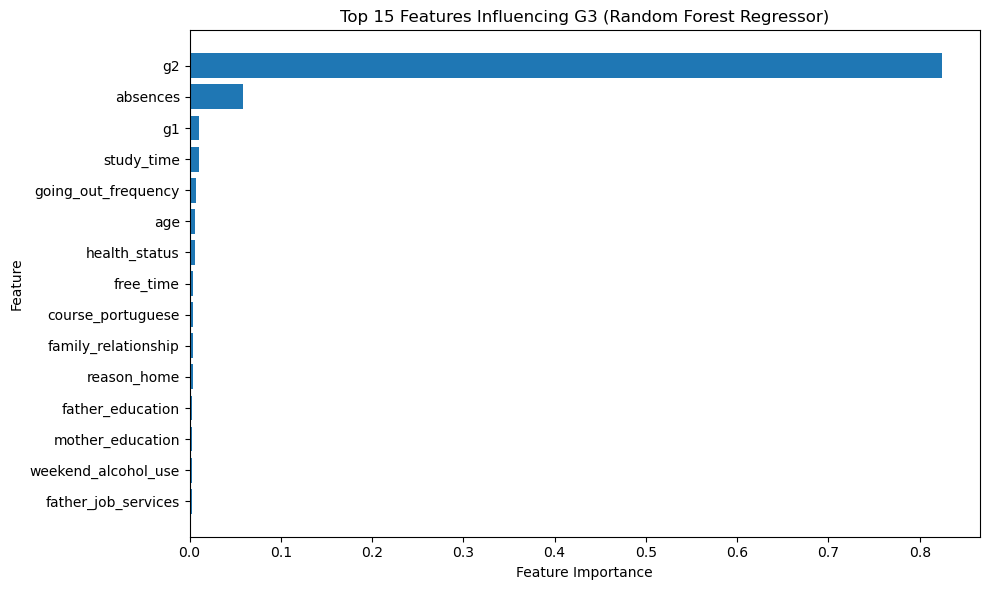

In [297]:
fi_7 = pd.DataFrame({
    "feature": X_7_train.columns,
    "importance": rfr_7.feature_importances_
}).sort_values("importance", ascending=False)

# listing top 15 features
print(fi_7.head(15).to_string(index=False))

top_15_7 = fi_7.head(15)
plt.figure(figsize=(10, 6))
plt.barh(top_15_7["feature"], top_15_7["importance"])
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.title("Top 15 Features Influencing G3 (Random Forest Regressor)")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

### RFR 2

In [298]:
X_8 = df_1[['age', 'mother_education', 'father_education', 'travel_time',
       'study_time', 'failures', 'family_relationship', 'free_time',
       'going_out_frequency', 'work_day_alcohol_use', 'weekend_alcohol_use',
       'health_status', 'absences', 'g1', 'g2', 'school_gp', 'school_ms', 'gender_female', 'gender_male',
       'address_rural', 'address_urban', 'family_size_greater_3',
       'family_size_less_equal_3', 'parent_status_apart',
       'parent_status_together', 'mother_job_at_home', 'mother_job_health',
       'mother_job_other', 'mother_job_services', 'mother_job_teacher',
       'father_job_at_home', 'father_job_health', 'father_job_other',
       'father_job_services', 'father_job_teacher', 'reason_course',
       'reason_home', 'reason_other', 'reason_reputation', 'guardian_father',
       'guardian_mother', 'guardian_other', 'school_support_no',
       'school_support_yes', 'family_support_no', 'family_support_yes',
       'extra_paid_classes_no', 'extra_paid_classes_yes',
       'extra_curricular_activities_no', 'extra_curricular_activities_yes',
       'attended_nursery_no', 'attended_nursery_yes',
       'higher_education_aspiration_no', 'higher_education_aspiration_yes',
       'home_internet_access_no', 'home_internet_access_yes',
       'in_relationship_no', 'in_relationship_yes', 'course_math',
       'course_portuguese']]
y_8 = df_1['g3']

In [299]:
X_8_train, X_8_test, y_8_train, y_8_test = train_test_split(X_8, y_8, test_size=0.2, random_state=42)

In [300]:
rfr_8 = RandomForestRegressor(random_state = 42)

In [301]:
rfr_8.fit(X_8_train, y_8_train)

RandomForestRegressor(random_state=42)

In [302]:
y_8_pred = rfr_8.predict(X_8_test)
y_8_pred

array([10.28,  7.46, 13.12, 11.03, 13.19, 13.05,  2.99, 11.09, 14.6 ,
       13.55, 15.75,  4.99,  7.88, 10.79,  8.19, 11.91, 10.16, 15.59,
       11.15, 12.62, 10.08, 15.93, 11.25,  1.28, 15.47, 11.35, 17.72,
       16.38, 10.98,  8.13,  9.92, 10.24, 17.9 , 11.07, 15.18, 14.48,
       15.47, 18.45, 10.32, 13.11, 15.16, 16.81, 11.03,  6.89, 15.87,
       10.56, 11.04, 16.25, 12.53, 10.91, 11.32, 15.49, 10.36, 10.24,
        7.34, 11.02, 11.08, 13.  , 17.62,  8.18, 12.36,  4.83,  7.71,
       12.47,  7.93,  9.49,  8.41,  6.63, 10.27, 18.2 , 11.24, 14.5 ,
        9.55,  8.44,  7.68, 10.18,  7.53,  7.75,  7.47, 13.67, 12.97,
       12.65, 10.47,  9.23, 16.12, 14.56,  6.79,  7.48,  8.35, 11.2 ,
       15.56,  0.08, 10.06, 14.17, 12.26, 12.11, 10.11,  7.78, 12.47,
       10.94, 15.04, 13.23, 13.05, 12.97, 11.02, 14.9 , 18.07, 10.98,
        9.22, 11.35, 14.41,  9.34, 18.71, 15.32,  9.82, 13.25, 13.4 ,
       10.91, 11.04,  7.28,  9.67,  8.41, 13.29,  9.8 , 15.78,  9.14,
       10.58, 12.39,

In [303]:
r2_8 = r2_score(y_8_test, y_8_pred)
mae_8 = mean_absolute_error(y_8_test, y_8_pred)
rmse_8 = np.sqrt(mean_squared_error(y_8_test, y_8_pred))

print(f"R²: {r2_8:.3f}")
print(f"MAE: {mae_8:.3f}")
print(f"RMSE: {rmse_8:.3f}")

R²: 0.830
MAE: 0.937
RMSE: 1.619


In [304]:
rfr_8.feature_importances_

array([6.13834994e-03, 2.89370283e-03, 2.93019813e-03, 2.68029002e-03,
       1.03984030e-02, 2.37976365e-03, 3.98532493e-03, 4.14807751e-03,
       6.78987194e-03, 1.91481798e-03, 2.86345457e-03, 6.07385202e-03,
       5.81451221e-02, 1.05302841e-02, 8.24786440e-01, 6.83915355e-04,
       4.91714631e-04, 2.56287362e-03, 1.96867497e-03, 4.94642708e-04,
       4.29779212e-04, 6.72323524e-04, 5.73093704e-04, 2.79697290e-04,
       3.41652682e-04, 1.01123888e-03, 6.63051925e-04, 7.53062188e-04,
       1.08338645e-03, 2.60562953e-03, 7.85440696e-04, 3.00629965e-04,
       1.80999040e-03, 2.85990507e-03, 1.49145985e-04, 2.59725097e-03,
       3.48460804e-03, 1.78987147e-03, 8.53124051e-04, 1.83726632e-03,
       8.22753893e-04, 1.86764229e-04, 1.28452857e-03, 1.25299311e-03,
       8.55132065e-04, 1.08595164e-03, 1.10708587e-03, 1.78176859e-03,
       1.02430264e-03, 8.43066365e-04, 7.39010426e-04, 7.12277505e-04,
       8.15415359e-04, 7.52645183e-04, 2.99922993e-04, 4.43259231e-04,
      

            feature  importance
                 g2    0.824786
           absences    0.058145
                 g1    0.010530
         study_time    0.010398
going_out_frequency    0.006790
                age    0.006138
      health_status    0.006074
          free_time    0.004148
  course_portuguese    0.004014
family_relationship    0.003985
        reason_home    0.003485
   father_education    0.002930
   mother_education    0.002894
weekend_alcohol_use    0.002863
father_job_services    0.002860


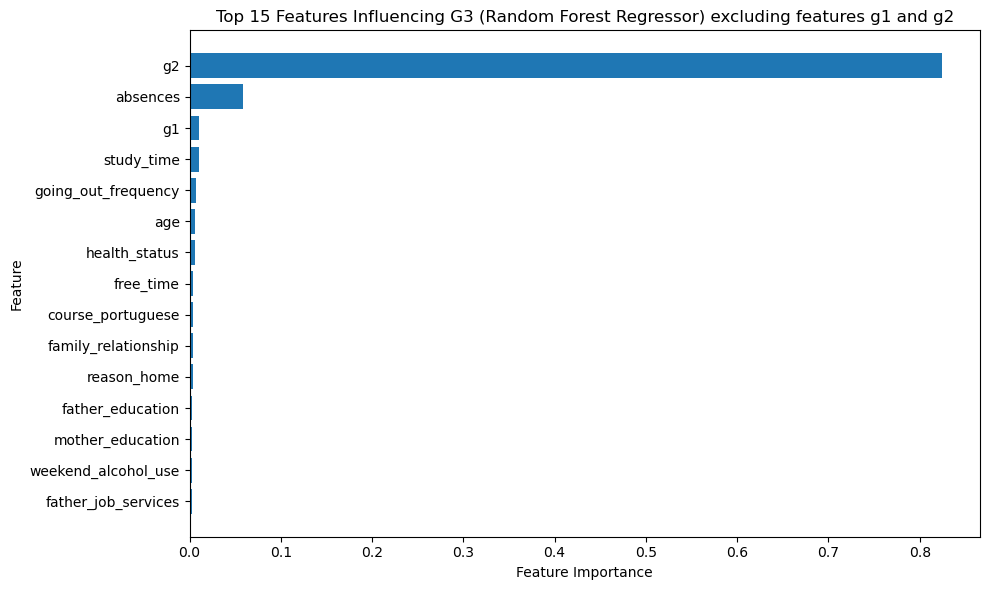

In [305]:
fi_8 = pd.DataFrame({
    "feature": X_8_train.columns,
    "importance": rfr_8.feature_importances_
}).sort_values("importance", ascending=False)

# listing top 15 features
print(fi_8.head(15).to_string(index=False))

top_15_8 = fi_8.head(15)
plt.figure(figsize=(10, 6))
plt.barh(top_15_8["feature"], top_15_8["importance"])
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.title("Top 15 Features Influencing G3 (Random Forest Regressor) excluding features g1 and g2")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# Task 1.2 At-Risk Students

### Correlation heatmap

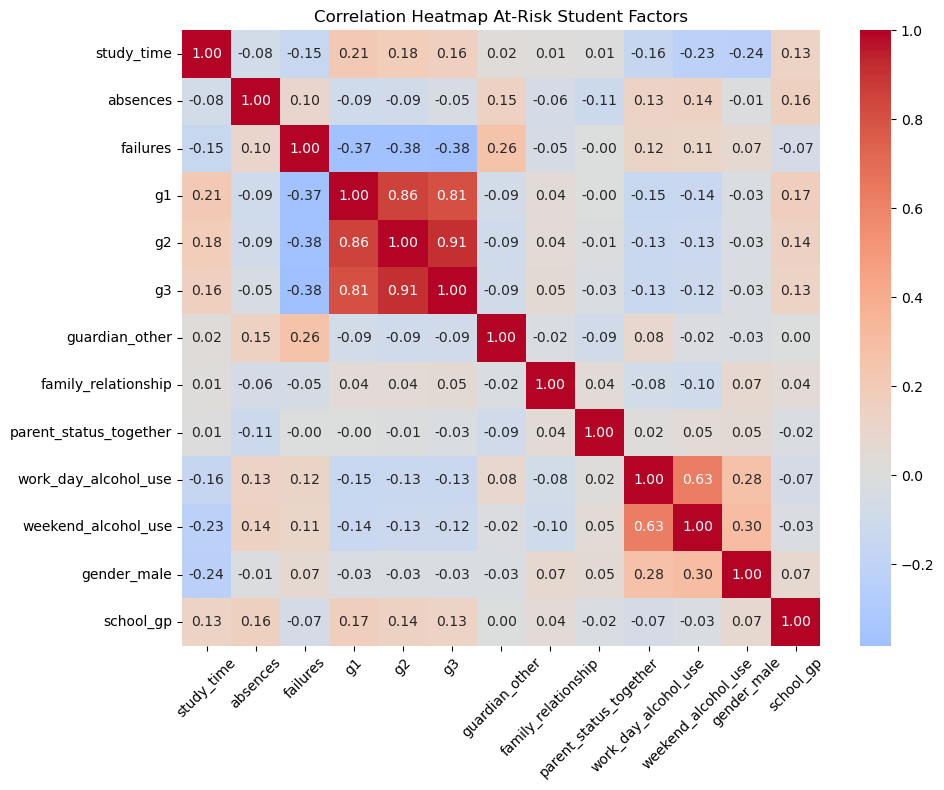

In [306]:
# Correlation Heatmap between the features related to disengagement or under-performance
corr_df_abs = df_1[['study_time', 'absences', 'failures', 'g1', 'g2', 'g3', 'guardian_other', 'family_relationship', 'parent_status_together', 'work_day_alcohol_use', 'weekend_alcohol_use',
    'gender_male', 'school_gp']]

corr_df_abs.head()

corr_matrix_risk = corr_df_abs.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix_risk, annot=True, cmap='coolwarm', center=0, fmt=".2f")

plt.title('Correlation Heatmap At-Risk Student Factors')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

## G3 grade

### Correlation analysis

In [307]:
# correlation analysis between features with absences
corr_with_g3_grades = (
    df_1.corr(numeric_only=True)['g3']
      .drop('g3')
      .sort_values(ascending=False)
)

corr_with_g3_grades

g2                                 0.910743
g1                                 0.809142
higher_education_aspiration_yes    0.236578
mother_education                   0.201472
course_portuguese                  0.187166
study_time                         0.161629
father_education                   0.159796
school_gp                          0.127114
reason_reputation                  0.121303
address_urban                      0.117696
home_internet_access_yes           0.107064
father_job_teacher                 0.101361
mother_job_health                  0.101349
in_relationship_no                 0.098363
mother_job_teacher                 0.084521
school_support_no                  0.079346
family_size_less_equal_3           0.061209
family_relationship                0.054461
extra_paid_classes_no              0.049388
mother_job_services                0.045015
guardian_father                    0.042778
father_job_health                  0.042101
attended_nursery_yes            

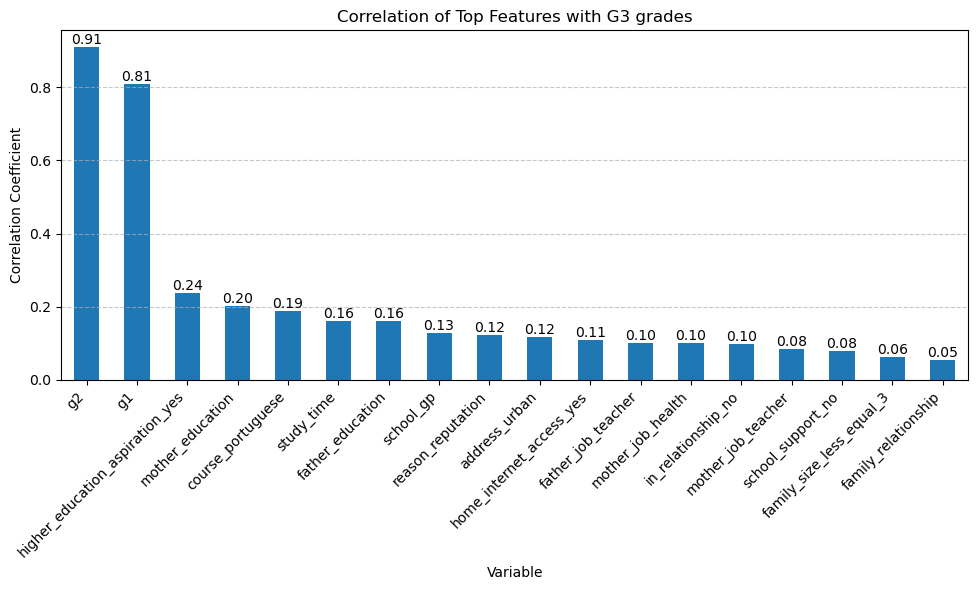

In [308]:
# Filtering and sorting the correlations > 0.05
positive_corr_g3_grades = corr_with_g3_grades[corr_with_g3_grades > 0.05].sort_values(ascending=False)

plt.figure(figsize=(10, 6))
ax = positive_corr_g3_grades.plot(kind='bar')

plt.title('Correlation of Top Features with G3 grades')
plt.ylabel('Correlation Coefficient')
plt.xlabel('Variable')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

for bar in ax.patches:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2,
            height,
            f"{height:.2f}",
            ha='center',
            va='bottom')

plt.tight_layout()
plt.show()

## Failures

### Correlation analysis

In [309]:
# correlation analysis between features with failures
corr_with_failures = (
    df_1.corr(numeric_only=True)['failures']
      .drop('failures')
      .sort_values(ascending=False)
)

corr_with_failures

higher_education_aspiration_no     0.284893
age                                0.282364
guardian_other                     0.261738
work_day_alcohol_use               0.116336
weekend_alcohol_use                0.107432
free_time                          0.102679
absences                           0.099998
reason_course                      0.098883
travel_time                        0.087177
course_math                        0.083043
attended_nursery_no                0.083027
in_relationship_yes                0.076042
going_out_frequency                0.074683
home_internet_access_no            0.074263
mother_job_at_home                 0.070264
school_ms                          0.066856
gender_male                        0.065543
address_rural                      0.061160
mother_job_services                0.058457
health_status                      0.048311
family_size_greater_3              0.044589
extra_paid_classes_no              0.036389
father_job_services             

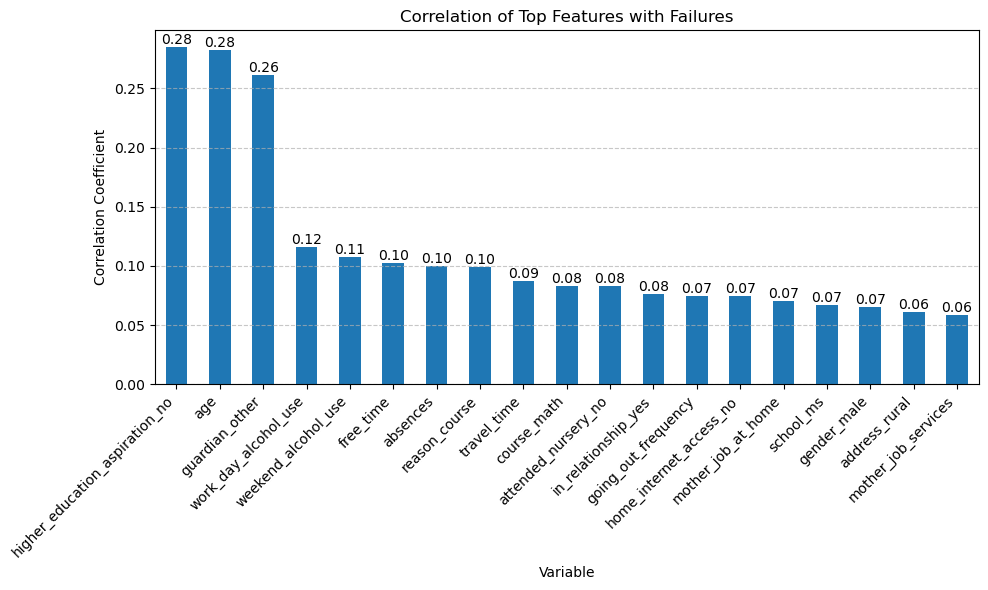

In [310]:
# Filtering and sorting the correlations > 0.05
positive_corr_with_failures = corr_with_failures[corr_with_failures > 0.05].sort_values(ascending=False)

plt.figure(figsize=(10, 6))
ax = positive_corr_with_failures.plot(kind='bar')

plt.title('Correlation of Top Features with Failures')
plt.ylabel('Correlation Coefficient')
plt.xlabel('Variable')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

for bar in ax.patches:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2,
            height,
            f"{height:.2f}",
            ha='center',
            va='bottom')

plt.tight_layout()
plt.show()

## Study time

## Correlation analysis

In [311]:
# correlation analysis between features with study time
corr_with_studyttime = (
    df_1.corr(numeric_only=True)['study_time']
      .drop('study_time')
      .sort_values(ascending=False)
)

corr_with_studyttime

gender_female                      0.239972
g1                                 0.211314
reason_reputation                  0.187202
higher_education_aspiration_yes    0.186556
g2                                 0.183167
g3                                 0.161629
family_support_yes                 0.143858
school_gp                          0.133255
father_job_health                  0.107722
extra_paid_classes_yes             0.105704
mother_education                   0.090616
extra_curricular_activities_yes    0.078847
school_support_yes                 0.070598
course_math                        0.060934
attended_nursery_yes               0.056817
home_internet_access_yes           0.049695
in_relationship_yes                0.038435
address_urban                      0.037480
family_size_greater_3              0.035109
father_education                   0.033458
mother_job_teacher                 0.020386
mother_job_services                0.019401
guardian_other                  

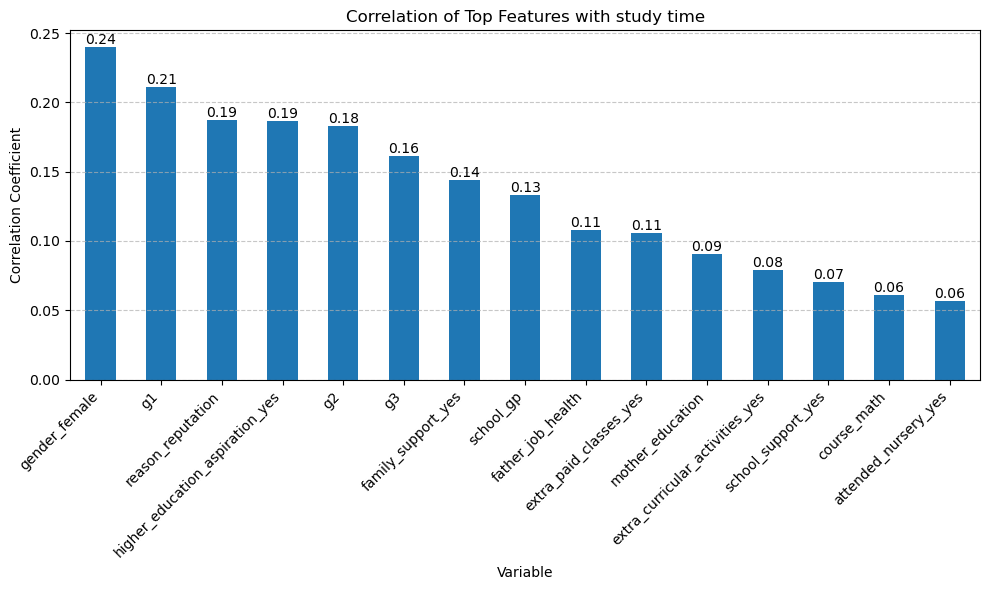

In [312]:
# Filtering and sorting the correlations > 0.05
positive_corr_with_studyttime = corr_with_studyttime[corr_with_studyttime > 0.05].sort_values(ascending=False)

plt.figure(figsize=(10, 6))
ax = positive_corr_with_studyttime.plot(kind='bar')

plt.title('Correlation of Top Features with study time')
plt.ylabel('Correlation Coefficient')
plt.xlabel('Variable')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

for bar in ax.patches:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2,
            height,
            f"{height:.2f}",
            ha='center',
            va='bottom')

plt.tight_layout()
plt.show()

## Absences

### Correlation analysis

In [313]:
# correlation analysis between features with absences
corr_with_absences = (
    df_1.corr(numeric_only=True)['absences']
      .drop('absences')
      .sort_values(ascending=False)
)

corr_with_absences

course_math                        0.160125
school_gp                          0.155146
age                                0.153196
guardian_other                     0.147804
weekend_alcohol_use                0.139703
work_day_alcohol_use               0.132867
parent_status_apart                0.113955
reason_home                        0.106901
in_relationship_yes                0.105323
failures                           0.099998
home_internet_access_yes           0.090652
higher_education_aspiration_no     0.072556
extra_paid_classes_yes             0.070505
mother_education                   0.059708
going_out_frequency                0.056142
mother_job_services                0.053283
reason_reputation                  0.051908
father_education                   0.040829
address_urban                      0.036696
family_support_yes                 0.031267
mother_job_other                   0.026514
family_size_less_equal_3           0.018284
father_job_other                

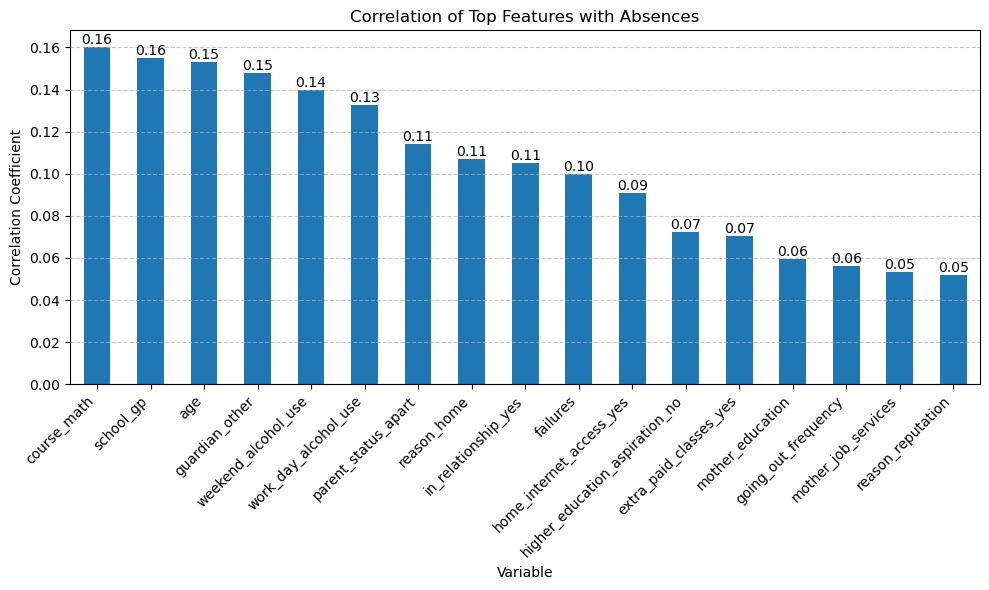

In [314]:
# Filtering and sorting the correlations > 0.05
positive_corr_absences = corr_with_absences[corr_with_absences > 0.05].sort_values(ascending=False)

plt.figure(figsize=(10, 6))
ax = positive_corr_absences.plot(kind='bar')

plt.title('Correlation of Top Features with Absences')
plt.ylabel('Correlation Coefficient')
plt.xlabel('Variable')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

for bar in ax.patches:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2,
            height,
            f"{height:.2f}",
            ha='center',
            va='bottom')

plt.tight_layout()
plt.show()

### Linear Regression

In [315]:
X_abs = df_1[['age', 'mother_education', 'father_education', 'travel_time',
       'study_time', 'failures', 'family_relationship', 'free_time',
       'going_out_frequency', 'work_day_alcohol_use', 'weekend_alcohol_use',
       'health_status', 'g1', 'g2', 'g3', 'school_gp', 'school_ms', 'gender_female', 'gender_male',
       'address_rural', 'address_urban', 'family_size_greater_3',
       'family_size_less_equal_3', 'parent_status_apart',
       'parent_status_together', 'mother_job_at_home', 'mother_job_health',
       'mother_job_other', 'mother_job_services', 'mother_job_teacher',
       'father_job_at_home', 'father_job_health', 'father_job_other',
       'father_job_services', 'father_job_teacher', 'reason_course',
       'reason_home', 'reason_other', 'reason_reputation', 'guardian_father',
       'guardian_mother', 'guardian_other', 'school_support_no',
       'school_support_yes', 'family_support_no', 'family_support_yes',
       'extra_paid_classes_no', 'extra_paid_classes_yes',
       'extra_curricular_activities_no', 'extra_curricular_activities_yes',
       'attended_nursery_no', 'attended_nursery_yes',
       'higher_education_aspiration_no', 'higher_education_aspiration_yes',
       'home_internet_access_no', 'home_internet_access_yes',
       'in_relationship_no', 'in_relationship_yes', 'course_math',
       'course_portuguese']]
y_abs = df_1['absences']

In [316]:
X_abs_train, X_abs_test, y_abs_train, y_abs_test = train_test_split(X_abs, y_abs, test_size=0.2, random_state= 42)

In [317]:
lr_abs = LinearRegression()

In [318]:
lr_abs.fit(X_abs_train, y_abs_train)

LinearRegression()

In [319]:
lr_abs.score(X_abs_train, y_abs_train)

0.17315506629008415

In [320]:
lr_abs.score(X_abs_test, y_abs_test)

0.16438764866185052

In [321]:
lr_abs.coef_

array([ 0.46757344,  0.31715513,  0.20033962,  0.14803904, -0.54123434,
       -0.08179511, -0.18014832, -0.20699376, -0.13768164,  0.32695962,
        0.60075069, -0.1087788 , -0.09279994, -0.48954698,  0.41423626,
        1.02448326, -1.02448326,  0.5253341 , -0.5253341 ,  0.14570632,
       -0.14570632,  0.03680707, -0.03680707,  0.86708963, -0.86708963,
        0.35634207, -1.16224215,  0.95886842,  0.42225995, -0.57522829,
       -0.48812333,  1.0548339 , -0.3294738 ,  0.08639145, -0.32362822,
       -0.681109  ,  0.79092741, -0.57315894,  0.46334052, -1.47955703,
       -0.27754448,  1.75710151,  0.46642054, -0.46642054, -0.37208006,
        0.37208006,  0.39649638, -0.39649638, -0.03943081,  0.03943081,
       -0.02015831,  0.02015831,  0.66987169, -0.66987169, -0.35634317,
        0.35634317, -0.48499724,  0.48499724,  0.85155453, -0.85155453])

In [322]:
y_abs_pred =lr_abs.predict(X_abs_test)
y_abs_pred

array([ 6.11330298,  9.39616145,  1.88853021,  4.58565964,  3.86282193,
        5.34502328,  1.93952573,  2.76546394,  2.48879512,  1.95859835,
        4.5594077 ,  3.23801189,  7.10558657,  6.53296694,  3.87773509,
        2.7559235 ,  3.54609361,  0.06119667,  6.86016116,  3.73726156,
        6.82812302,  5.19004259,  0.61091561,  8.25188429,  2.94975005,
        3.95042218,  9.6133427 ,  2.61247337,  3.26169974,  2.93026031,
        1.14976249, -0.16548676,  2.64546394,  3.12307926,  5.82349013,
        3.92460213,  5.13233834,  7.52233589,  6.17265566,  3.81207541,
        2.87270659,  2.51948016,  3.61956098,  2.08961739,  1.59844217,
        4.26153569,  4.57942862,  4.22338364,  1.69381564,  0.24203945,
        4.04357949,  7.65726887,  0.93099182,  0.79899028,  3.17826574,
        0.97343929, -2.5800649 ,  3.84878537,  3.38978594,  2.62570479,
        7.70667369,  7.27572901,  7.65164396,  5.21888428,  6.88977731,
        5.67436968,  3.92639792,  7.65443687,  4.24770415,  8.46

In [323]:
mean_absolute_error(y_abs_test, y_abs_pred)

3.7436462405846984

In [324]:
mean_squared_error(y_abs_test, y_abs_pred)

26.93605912524662

In [325]:
r2_score(y_abs_test, y_abs_pred)

0.16438764866185052

In [326]:
lr_abs.intercept_

np.float64(-1.2085959899186092)


Top 15 features influencing absences:

                        feature  coefficient
              course_portuguese     0.299604
                    travel_time     0.166959
              mother_job_health     0.119565
            attended_nursery_no     0.115411
            mother_job_services     0.109680
higher_education_aspiration_yes     0.076872
                      school_gp     0.074947
                  address_urban     0.070344
              school_support_no     0.059768
             mother_job_teacher     0.054663
          extra_paid_classes_no     0.031978
       family_size_less_equal_3     0.031591
             in_relationship_no     0.028591
               father_job_other     0.028443
            weekend_alcohol_use     0.016186


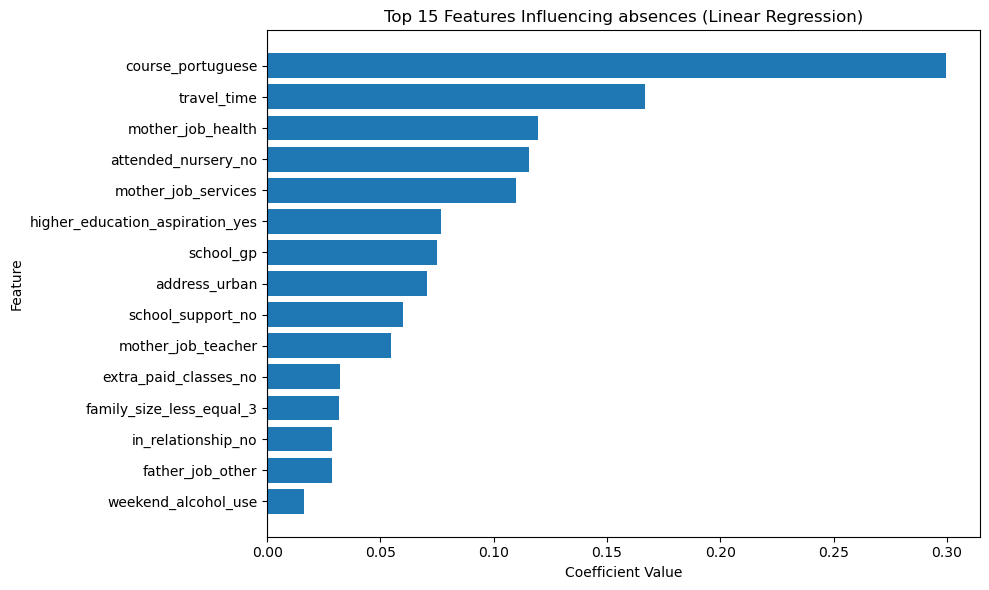

In [327]:
# discovering the highest 15 features influencing absences

coef_df_abs = pd.DataFrame({
    'feature': X_abs.columns,
    'coefficient': lr_abs.coef_
})

coef_df_abs['abs_coefficient'] = coef_df_abs['coefficient'].abs()

top_15_abs = (
    coef_df_1[coef_df_abs['coefficient'] > 0]
    .sort_values('coefficient', ascending=False)
    .head(15)
)

print("\nTop 15 features influencing absences:\n")
print(top_15_abs[['feature', 'coefficient']].to_string(index=False))

plt.figure(figsize=(10, 6))
plt.barh(top_15_abs['feature'], top_15_abs['coefficient'])
plt.axvline(0) 
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.title('Top 15 Features Influencing absences (Linear Regression)')
plt.gca().invert_yaxis() 
plt.tight_layout()
plt.show()

## Clustering

### Clustering under-performance + disengagement

In [328]:
from sklearn.cluster import KMeans
risk_features = ['g3', 'failures', 'absences', 'study_time']
X_cluster = df_1[risk_features]
scaler_clust = StandardScaler()
X_scaled = scaler_clust.fit_transform(X_cluster)


  File "C:\Users\meiot\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
        "wmic CPU Get NumberOfCores /Format:csv".split(),
        capture_output=True,
        text=True,
    )
  File "C:\Users\meiot\anaconda3\Lib\subprocess.py", line 554, in run
    with Popen(*popenargs, **kwargs) as process:
         ~~~~~^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\meiot\anaconda3\Lib\subprocess.py", line 1039, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
    ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
                        pass_fds, cwd, env,
                        ^^^^^^^^^^^^^^^^^^^
    ...<5 lines>...
                        gid, gids, uid, umask,
                        ^^^^^^^^^^^^^^^^^^^^^^
                        start_new_session, process_group)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\meiot\anaconda3\Lib\subprocess.

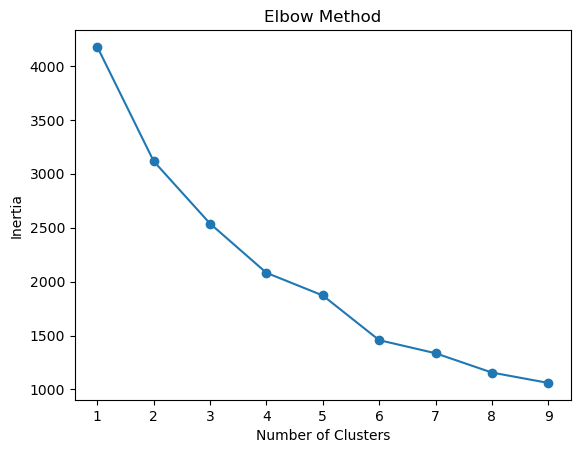

In [329]:
inertia_1 = []

for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia_1.append(kmeans.inertia_)

plt.plot(range(1, 10), inertia_1, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.show()


In [330]:
kmeans = KMeans(n_clusters=6, random_state=42)
df_1['cluster_risk'] = kmeans.fit_predict(X_scaled)

In [331]:
cluster_summary = df_1.groupby('cluster_risk')[risk_features].mean().round(2)
cluster_summary['Number of Students'] = df_1.groupby('cluster_risk').size()
cluster_summary

,g3,failures,absences,study_time,Number of Students
cluster_risk,,,,,
0,11.74,0.12,3.50,1.00,247
1,13.02,0.05,3.08,3.29,206
2,7.16,2.49,4.51,1.64,61
3,9.99,0.40,17.54,1.77,107
4,12.65,0.05,2.51,2.00,371
5,1.17,0.38,0.92,1.96,52


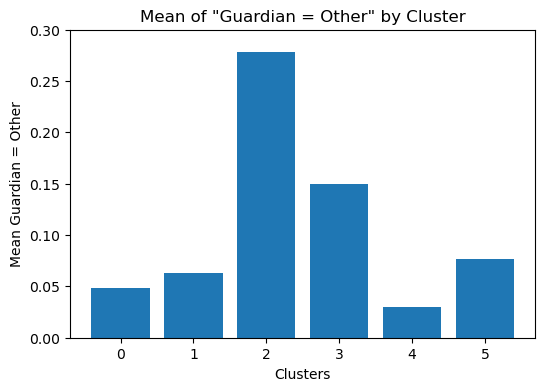

cluster_risk
0    0.048583
1    0.063107
2    0.278689
3    0.149533
4    0.029650
5    0.076923
Name: guardian_other, dtype: float64

In [332]:
# testing EDA findings in cluster number 2
clust_risk_guardother = (
    df_1.groupby('cluster_risk')['guardian_other']
      .mean()
)

plt.figure(figsize=(6, 4))
bars = plt.bar(clust_risk_guardother.index,
               clust_risk_guardother.values)

plt.xlabel('Clusters')
plt.ylabel('Mean Guardian = Other')
plt.title('Mean of "Guardian = Other" by Cluster')

plt.ylim(0, 0.3) 

plt.show()

clust_risk_guardother

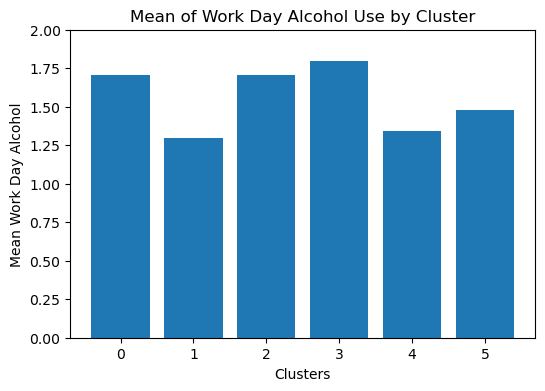

cluster_risk
0    1.708502
1    1.296117
2    1.704918
3    1.794393
4    1.342318
5    1.480769
Name: work_day_alcohol_use, dtype: float64

In [333]:
clust_risk_workdayalc = (
    df_1.groupby('cluster_risk')['work_day_alcohol_use']
      .mean()
)

plt.figure(figsize=(6, 4))
bars = plt.bar(clust_risk_workdayalc.index,
               clust_risk_workdayalc.values)

plt.xlabel('Clusters')
plt.ylabel('Mean Work Day Alcohol')
plt.title('Mean of Work Day Alcohol Use by Cluster')

plt.ylim(0, 2) 

plt.show()

clust_risk_workdayalc

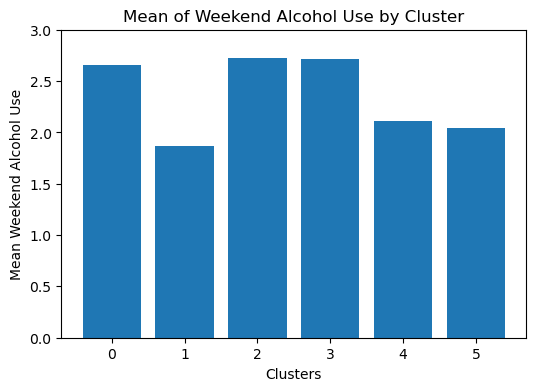

cluster_risk
0    2.651822
1    1.864078
2    2.721311
3    2.710280
4    2.113208
5    2.038462
Name: weekend_alcohol_use, dtype: float64

In [334]:
clust_risk_weekendalc = (
    df_1.groupby('cluster_risk')['weekend_alcohol_use']
      .mean()
)

plt.figure(figsize=(6, 4))
bars = plt.bar(clust_risk_weekendalc.index,
               clust_risk_weekendalc.values)

plt.xlabel('Clusters')
plt.ylabel('Mean Weekend Alcohol Use')
plt.title('Mean of Weekend Alcohol Use by Cluster')

plt.ylim(0, 3) 

plt.show()

clust_risk_weekendalc

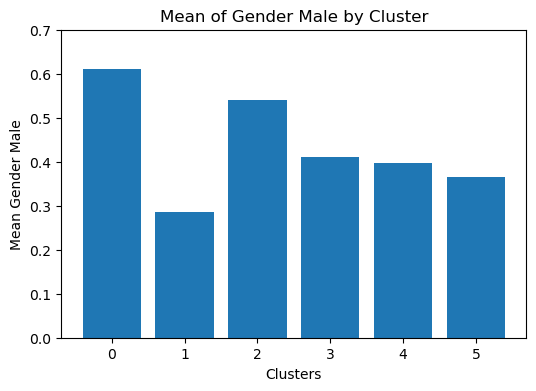

cluster_risk
0    0.611336
1    0.286408
2    0.540984
3    0.411215
4    0.396226
5    0.365385
Name: gender_male, dtype: float64

In [335]:
clust_risk_male = (
    df_1.groupby('cluster_risk')['gender_male']
      .mean()
)

plt.figure(figsize=(6, 4))
bars = plt.bar(clust_risk_male.index,
               clust_risk_male.values)

plt.xlabel('Clusters')
plt.ylabel('Mean Gender Male')
plt.title('Mean of Gender Male by Cluster')

plt.ylim(0, 0.7) 

plt.show()

clust_risk_male

### Clustering under-performance

In [336]:
risk_perf_features = ['g3', 'failures']
df_cluster_perf = df_1[risk_perf_features]
scaler_clust = StandardScaler()
df_cluster_perf_scaled = scaler_clust.fit_transform(df_cluster_perf)

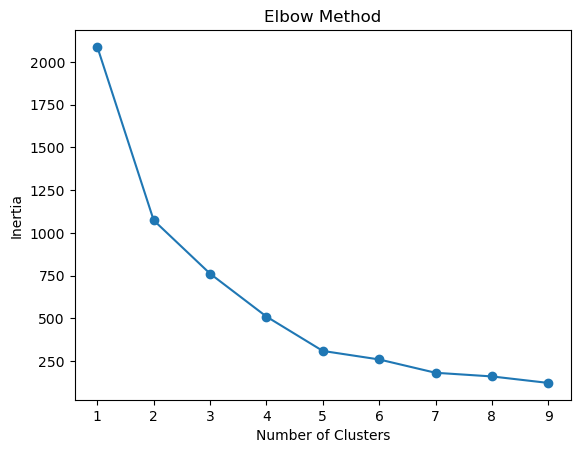

In [337]:
inertia_2 = []

for k in range(1, 10):
    kmeans_perf = KMeans(n_clusters=k, random_state=42)
    kmeans_perf.fit(df_cluster_perf_scaled)
    inertia_2.append(kmeans_perf.inertia_)

plt.plot(range(1, 10), inertia_2, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.show()


In [338]:
kmeans_perf = KMeans(n_clusters=5, random_state=42)
df_1['cluster_risk_performance'] = kmeans_perf.fit_predict(df_cluster_perf_scaled)

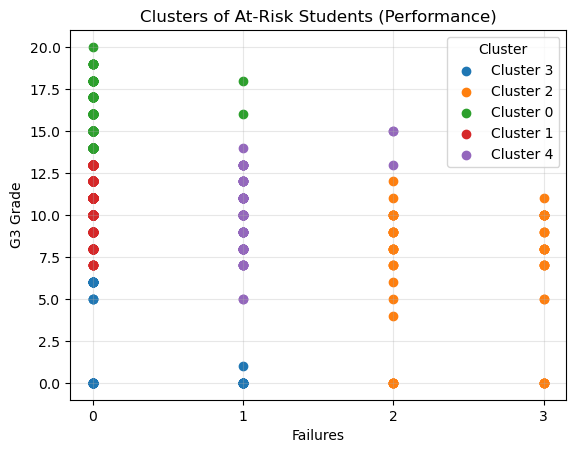

In [339]:
for cluster in df_1['cluster_risk_performance'].unique():
    subset = df_1[df_1['cluster_risk_performance'] == cluster]
    
    plt.scatter(
        subset['failures'],
        subset['g3'],
        label=f'Cluster {cluster}'
    )

plt.xlabel('Failures')
plt.ylabel('G3 Grade')
plt.title('Clusters of At-Risk Students (Performance)')
plt.legend(title="Cluster")
plt.grid(alpha=0.3)
plt.xticks(range(int(df_1['failures'].min()), int(df_1['failures'].max()) + 1))

plt.show()

In [340]:
cluster_summary_perf = df_1.groupby('cluster_risk_performance')[risk_perf_features].mean().round(2)
cluster_summary_perf['Number of Students'] = df_1.groupby('cluster_risk_performance').size()
cluster_summary_perf

,g3,failures,Number of Students
cluster_risk_performance,,,
0,15.51,0.01,291
1,10.95,0.00,528
2,6.80,2.50,60
3,1.90,0.29,62
4,9.89,1.03,103


In [341]:
from sklearn.metrics import silhouette_score
sil_score_perf = silhouette_score(df_cluster_perf_scaled, df_1['cluster_risk_performance'])
print(f"Silhouette Score: {sil_score_perf:.3f}")

Silhouette Score: 0.578


In [342]:
from sklearn.metrics import davies_bouldin_score
db_score_perf = davies_bouldin_score(df_cluster_perf_scaled, df_1['cluster_risk_performance'])
print(f"Davies-Bouldin Index: {db_score_perf:.3f}")

Davies-Bouldin Index: 0.596


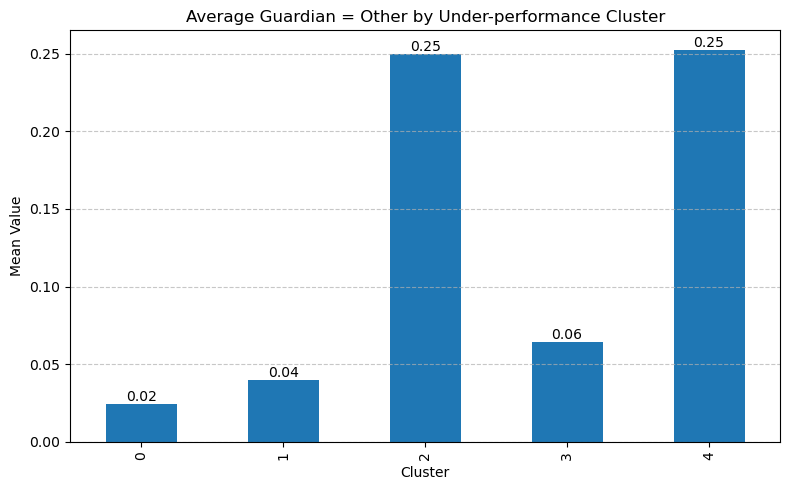

cluster_risk_performance
0    0.024055
1    0.039773
2    0.250000
3    0.064516
4    0.252427
Name: guardian_other, dtype: float64

In [343]:
# testing my EDA findings in cluster number 2
guardian_mean = df_1.groupby('cluster_risk_performance')['guardian_other'].mean()

plt.figure(figsize=(8,5))
ax = guardian_mean.plot(kind='bar')

plt.title('Average Guardian = Other by Under-performance Cluster')
plt.xlabel('Cluster')
plt.ylabel('Mean Value')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add numbers on top of columns
for bar in ax.patches:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2,
            height,
            f"{height:.2f}",
            ha='center',
            va='bottom')

plt.tight_layout()
plt.show()

guardian_mean 

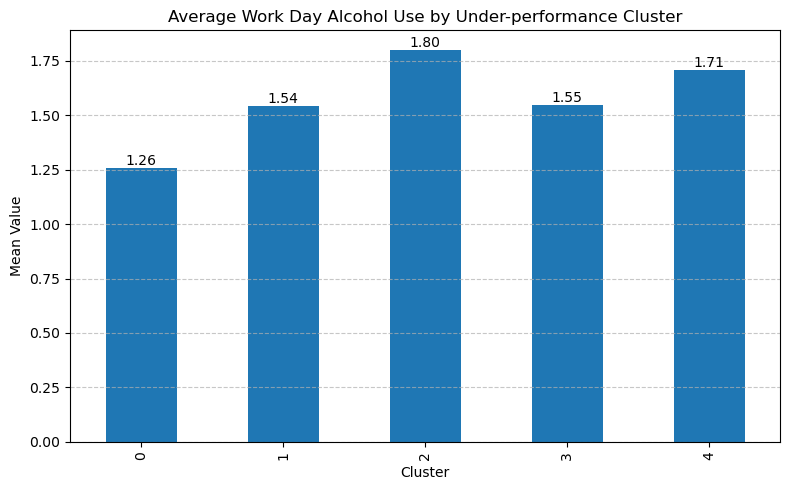

cluster_risk_performance
0    1.257732
1    1.541667
2    1.800000
3    1.548387
4    1.708738
Name: work_day_alcohol_use, dtype: float64

In [344]:
workday_alc_mean = df_1.groupby('cluster_risk_performance')['work_day_alcohol_use'].mean()

plt.figure(figsize=(8,5))
ax = workday_alc_mean.plot(kind='bar')

plt.title('Average Work Day Alcohol Use by Under-performance Cluster')
plt.xlabel('Cluster')
plt.ylabel('Mean Value')
plt.grid(axis='y', linestyle='--', alpha=0.7)

for bar in ax.patches:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2,
            height,
            f"{height:.2f}",
            ha='center',
            va='bottom')

plt.tight_layout()
plt.show()

workday_alc_mean

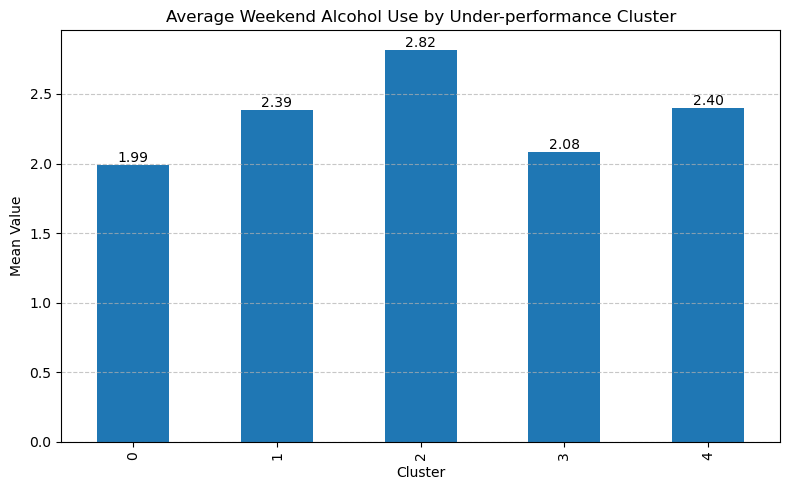

cluster_risk_performance
0    1.989691
1    2.388258
2    2.816667
3    2.080645
4    2.398058
Name: weekend_alcohol_use, dtype: float64

In [345]:
weekebnd_acl_mean = df_1.groupby('cluster_risk_performance')['weekend_alcohol_use'].mean()

plt.figure(figsize=(8,5))
ax = weekebnd_acl_mean.plot(kind='bar')

plt.title('Average Weekend Alcohol Use by Under-performance Cluster')
plt.xlabel('Cluster')
plt.ylabel('Mean Value')
plt.grid(axis='y', linestyle='--', alpha=0.7)

for bar in ax.patches:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2,
            height,
            f"{height:.2f}",
            ha='center',
            va='bottom')

plt.tight_layout()
plt.show()

weekebnd_acl_mean

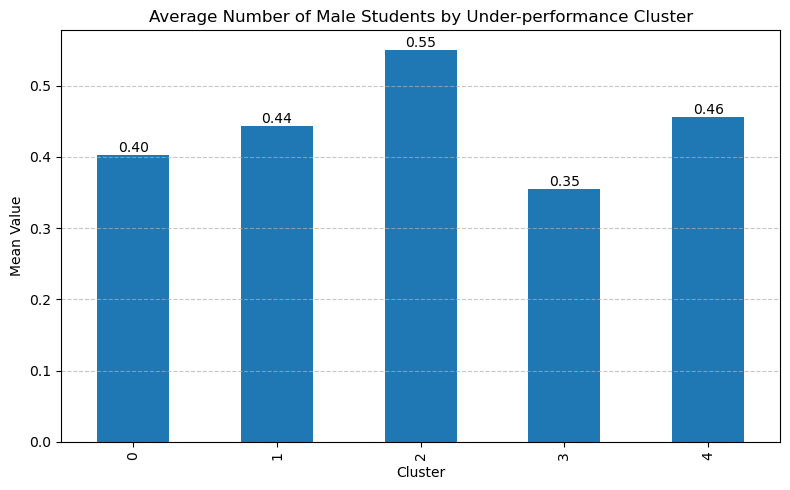

cluster_risk_performance
0    0.402062
1    0.443182
2    0.550000
3    0.354839
4    0.456311
Name: gender_male, dtype: float64

In [346]:
gendermale_mean = df_1.groupby('cluster_risk_performance')['gender_male'].mean()

plt.figure(figsize=(8,5))
ax = gendermale_mean.plot(kind='bar')

plt.title('Average Number of Male Students by Under-performance Cluster')
plt.xlabel('Cluster')
plt.ylabel('Mean Value')
plt.grid(axis='y', linestyle='--', alpha=0.7)

for bar in ax.patches:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2,
            height,
            f"{height:.2f}",
            ha='center',
            va='bottom')

plt.tight_layout()
plt.show()

gendermale_mean

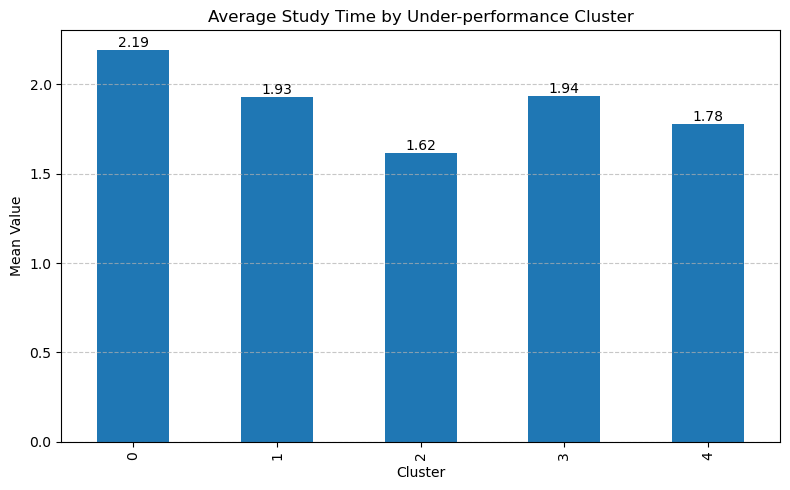

cluster_risk_performance
0    2.192440
1    1.929924
2    1.616667
3    1.935484
4    1.776699
Name: study_time, dtype: float64

In [347]:
studytime_mean = df_1.groupby('cluster_risk_performance')['study_time'].mean()

plt.figure(figsize=(8,5))
ax = studytime_mean.plot(kind='bar')

plt.title('Average Study Time by Under-performance Cluster')
plt.xlabel('Cluster')
plt.ylabel('Mean Value')
plt.grid(axis='y', linestyle='--', alpha=0.7)

for bar in ax.patches:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2,
            height,
            f"{height:.2f}",
            ha='center',
            va='bottom')

plt.tight_layout()
plt.show()

studytime_mean

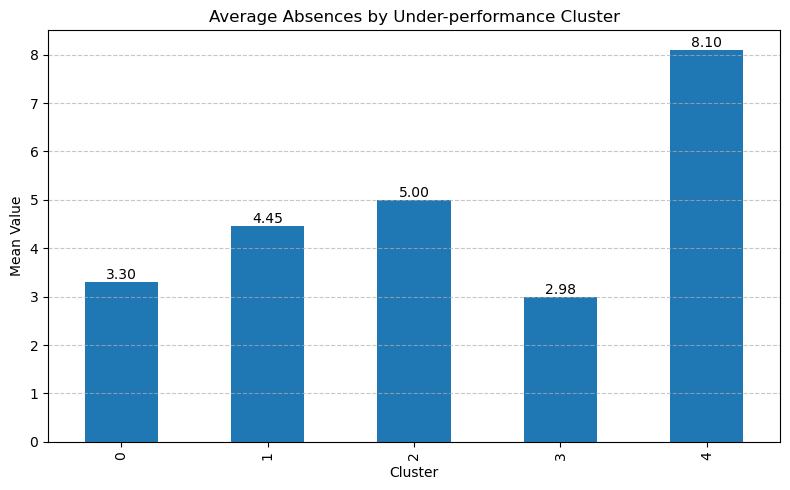

cluster_risk_performance
0    3.298969
1    4.452652
2    5.000000
3    2.983871
4    8.097087
Name: absences, dtype: float64

In [348]:
absences_mean = df_1.groupby('cluster_risk_performance')['absences'].mean()

plt.figure(figsize=(8,5))
ax = absences_mean.plot(kind='bar')

plt.title('Average Absences by Under-performance Cluster')
plt.xlabel('Cluster')
plt.ylabel('Mean Value')
plt.grid(axis='y', linestyle='--', alpha=0.7)

for bar in ax.patches:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2,
            height,
            f"{height:.2f}",
            ha='center',
            va='bottom')

plt.tight_layout()
plt.show()

absences_mean

### Clustering disengagement

In [349]:
risk_dis_features = ['study_time', 'absences']
df_cluster_dis = df_1[risk_dis_features]
df_cluster_dis_scaled = scaler_clust.fit_transform(df_cluster_dis)

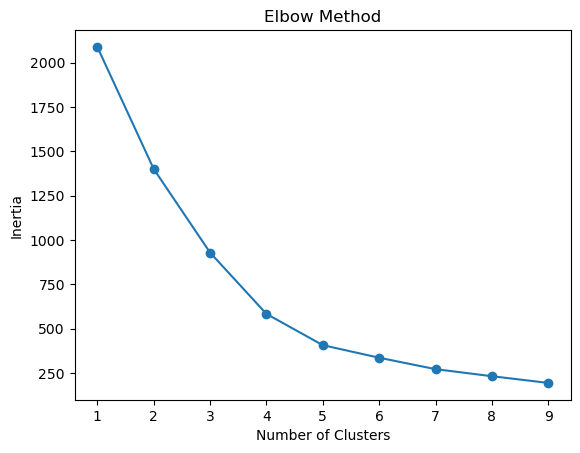

In [350]:
inertia_3 = []

for k in range(1, 10):
    kmeans_dis = KMeans(n_clusters=k, random_state=42)
    kmeans_dis.fit(df_cluster_dis_scaled)
    inertia_3.append(kmeans_dis.inertia_)

plt.plot(range(1, 10), inertia_3, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.show()


In [351]:
kmeans_dis = KMeans(n_clusters=4, random_state=42)
df_1['cluster_risk_disengagement'] = kmeans_dis.fit_predict(df_cluster_dis_scaled)

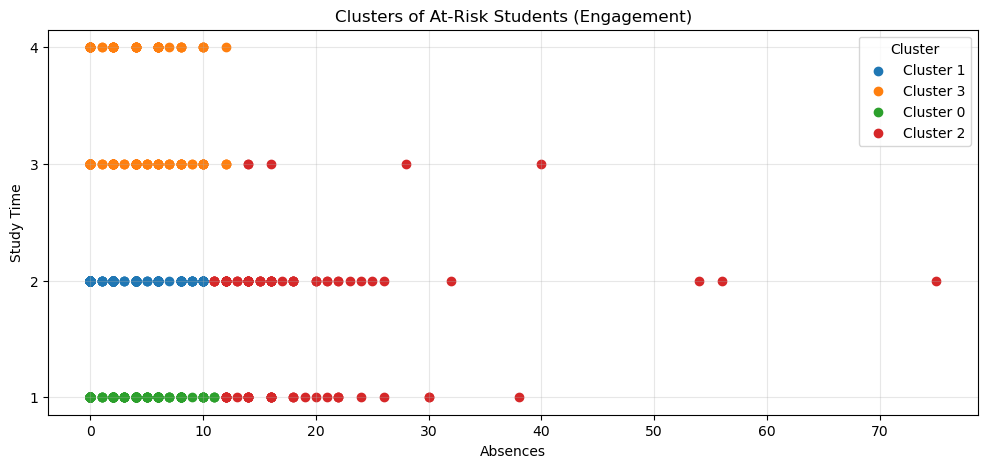

In [352]:
plt.figure(figsize=(12,5))
for cluster in df_1['cluster_risk_disengagement'].unique():
    subset = df_1[df_1['cluster_risk_disengagement'] == cluster]
    
    plt.scatter(
        subset['absences'],
        subset['study_time'],
        label=f'Cluster {cluster}'
    )

plt.xlabel('Absences')
plt.ylabel('Study Time')
plt.title('Clusters of At-Risk Students (Engagement)')
plt.legend(title="Cluster")
plt.grid(alpha=0.3)
plt.yticks(range(int(df_1['study_time'].min()), int(df_1['study_time'].max()) + 1))

plt.show()

In [353]:
cluster_summary_dis = df_1.groupby('cluster_risk_disengagement')[risk_dis_features].mean().round(2)
cluster_summary_dis['Number of Students'] = df_1.groupby('cluster_risk_disengagement').size()
cluster_summary_dis

,study_time,absences,Number of Students
cluster_risk_disengagement,,,
0,1.00,3.14,280
1,2.00,2.66,437
2,1.70,17.94,108
3,3.28,2.98,219


In [354]:
sil_score_dis = silhouette_score(df_cluster_dis_scaled, df_1['cluster_risk_disengagement'])
print(f"Silhouette Score: {sil_score_dis:.3f}")

Silhouette Score: 0.555


In [355]:
db_score_dis = davies_bouldin_score(df_cluster_dis_scaled, df_1['cluster_risk_disengagement'])
print(f"Davies-Bouldin Index: {db_score_dis:.3f}")

Davies-Bouldin Index: 0.682


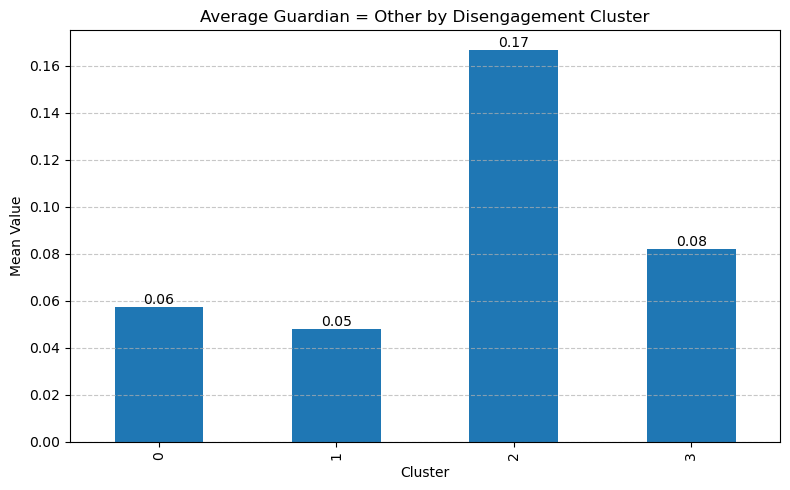

cluster_risk_disengagement
0    0.057143
1    0.048055
2    0.166667
3    0.082192
Name: guardian_other, dtype: float64

In [356]:
# testing EDA findings in cluster number 2
guardian_dis_mean = df_1.groupby('cluster_risk_disengagement')['guardian_other'].mean()

plt.figure(figsize=(8,5))
ax = guardian_dis_mean.plot(kind='bar')

plt.title('Average Guardian = Other by Disengagement Cluster')
plt.xlabel('Cluster')
plt.ylabel('Mean Value')
plt.grid(axis='y', linestyle='--', alpha=0.7)

for bar in ax.patches:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2,
            height,
            f"{height:.2f}",
            ha='center',
            va='bottom')

plt.tight_layout()
plt.show()

guardian_dis_mean

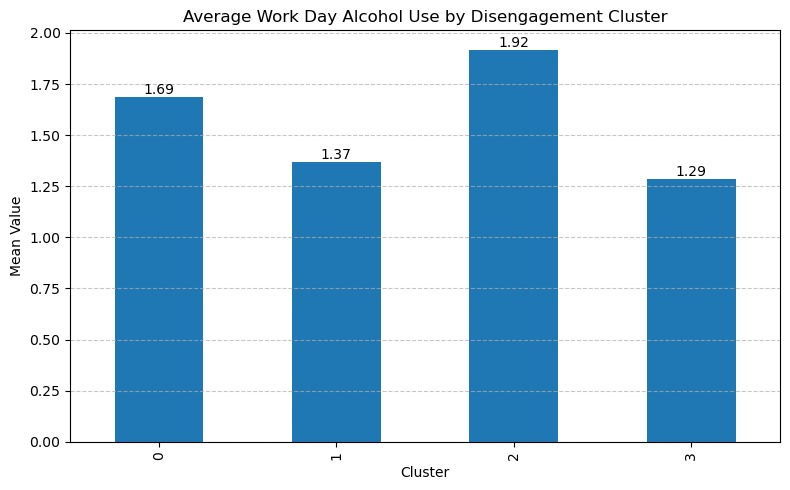

cluster_risk_disengagement
0    1.685714
1    1.370709
2    1.916667
3    1.287671
Name: work_day_alcohol_use, dtype: float64

In [357]:
workday_alc_dis_mean = df_1.groupby('cluster_risk_disengagement')['work_day_alcohol_use'].mean()

plt.figure(figsize=(8,5))
ax = workday_alc_dis_mean.plot(kind='bar')

plt.title('Average Work Day Alcohol Use by Disengagement Cluster')
plt.xlabel('Cluster')
plt.ylabel('Mean Value')
plt.grid(axis='y', linestyle='--', alpha=0.7)

for bar in ax.patches:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2,
            height,
            f"{height:.2f}",
            ha='center',
            va='bottom')

plt.tight_layout()
plt.show()

workday_alc_dis_mean

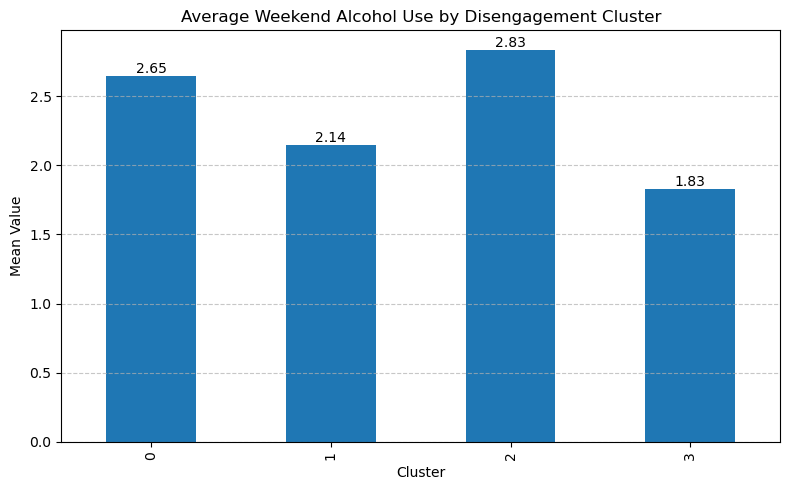

cluster_risk_disengagement
0    2.646429
1    2.144165
2    2.833333
3    1.831050
Name: weekend_alcohol_use, dtype: float64

In [358]:
weekend_alc_dis_mean = df_1.groupby('cluster_risk_disengagement')['weekend_alcohol_use'].mean()

plt.figure(figsize=(8,5))
ax = weekend_alc_dis_mean.plot(kind='bar')

plt.title('Average Weekend Alcohol Use by Disengagement Cluster')
plt.xlabel('Cluster')
plt.ylabel('Mean Value')
plt.grid(axis='y', linestyle='--', alpha=0.7)

for bar in ax.patches:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2,
            height,
            f"{height:.2f}",
            ha='center',
            va='bottom')

plt.tight_layout()
plt.show()

weekend_alc_dis_mean

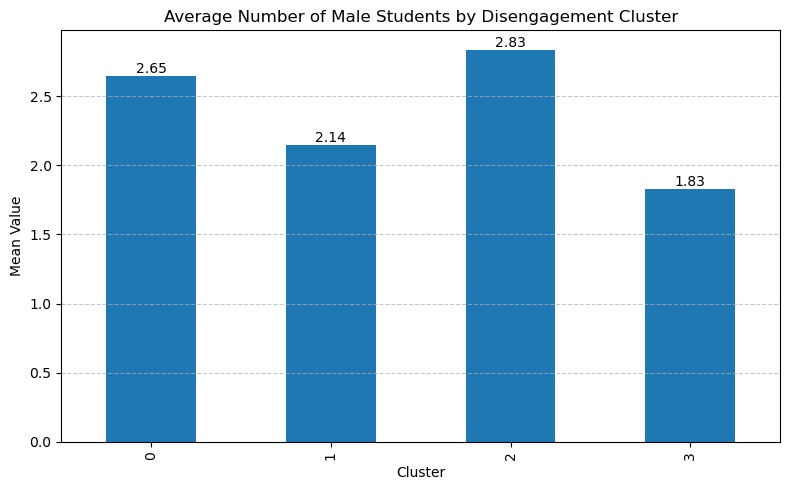

cluster_risk_disengagement
0    0.639286
1    0.379863
2    0.444444
3    0.273973
Name: gender_male, dtype: float64

In [359]:
gendermale_mean = df_1.groupby('cluster_risk_disengagement')['gender_male'].mean()

plt.figure(figsize=(8,5))
ax = weekend_alc_dis_mean.plot(kind='bar')

plt.title('Average Number of Male Students by Disengagement Cluster')
plt.xlabel('Cluster')
plt.ylabel('Mean Value')
plt.grid(axis='y', linestyle='--', alpha=0.7)

for bar in ax.patches:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2,
            height,
            f"{height:.2f}",
            ha='center',
            va='bottom')

plt.tight_layout()
plt.show()

gendermale_mean

# Task 2

## EDA on absences

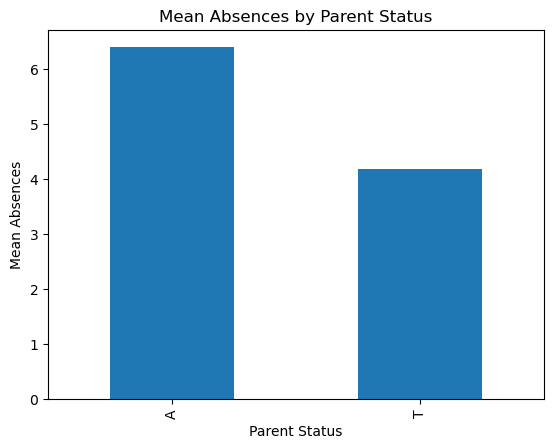

,mean,count
parent_status,,
A,6.39,121
T,4.18,923


In [360]:
# checking correlation between absences and family situation (guardian, family relationship & parent status)
mean_abs_parent = df.groupby('parent_status')['absences'].mean()
mean_abs_parent.plot(kind='bar')

plt.xlabel('Parent Status')
plt.ylabel('Mean Absences')
plt.title('Mean Absences by Parent Status')
plt.show()

df.groupby('parent_status')['absences'].agg(['mean', 'count']).round(2)

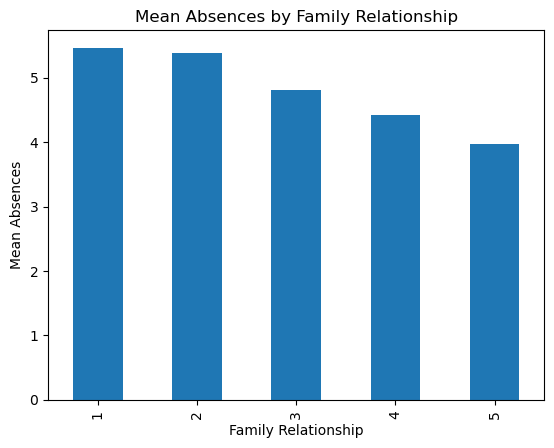

,mean,count
family_relationship,,
1,5.47,30
2,5.38,47
3,4.80,169
4,4.42,512
5,3.98,286


In [361]:
mean_abs_family = df.groupby('family_relationship')['absences'].mean()
mean_abs_family.plot(kind='bar')

plt.xlabel('Family Relationship')
plt.ylabel('Mean Absences')
plt.title('Mean Absences by Family Relationship')
plt.show()

df.groupby('family_relationship')['absences'].agg(['mean', 'count']).round(2)

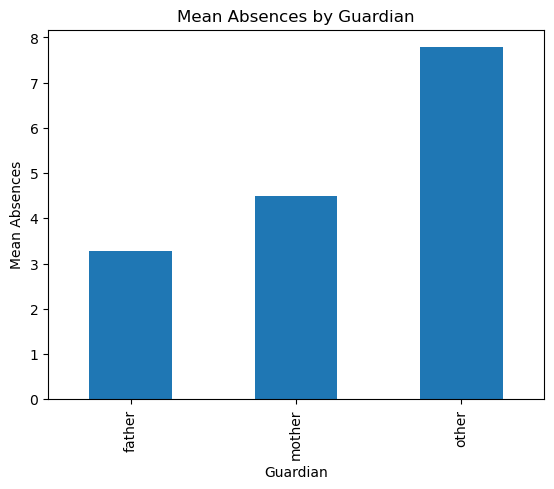

,mean,count
guardian,,
father,3.28,243
mother,4.48,728
other,7.78,73


In [362]:
mean_abs_guardian = df.groupby('guardian')['absences'].mean()
mean_abs_guardian.plot(kind='bar')

plt.xlabel('Guardian')
plt.ylabel('Mean Absences')
plt.title('Mean Absences by Guardian')
plt.show()

df.groupby('guardian')['absences'].agg(['mean', 'count']).round(2)

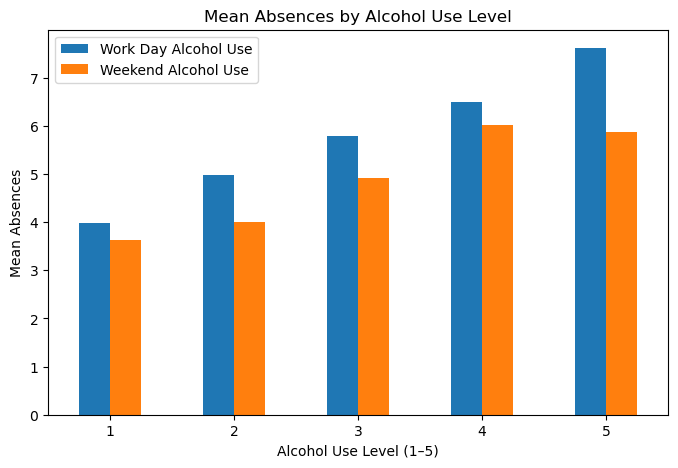

In [363]:
mean_abs_alcohol = df.groupby('work_day_alcohol_use')['absences'].mean().to_frame()

mean_abs_alcohol['Weekend Alcohol Use'] = (
    df.groupby('weekend_alcohol_use')['absences'].mean()
)

mean_abs_alcohol.columns = ['Work Day Alcohol Use', 'Weekend Alcohol Use']

mean_abs_alcohol.plot(kind='bar', figsize=(8,5))

plt.xlabel('Alcohol Use Level (1–5)')
plt.ylabel('Mean Absences')
plt.title('Mean Absences by Alcohol Use Level')
plt.xticks(rotation=0)
plt.show()

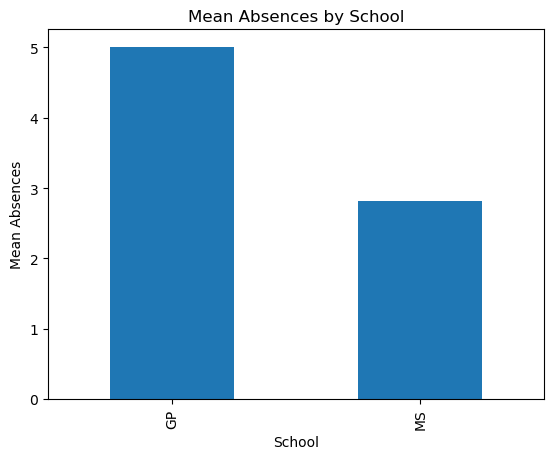

,mean,count
school,,
GP,5.01,772
MS,2.81,272


In [364]:
mean_abs_scho = df.groupby('school')['absences'].mean()
mean_abs_scho.plot(kind='bar')

plt.xlabel('School')
plt.ylabel('Mean Absences')
plt.title('Mean Absences by School')
plt.show()

df.groupby('school')['absences'].agg(['mean', 'count']).round(2)

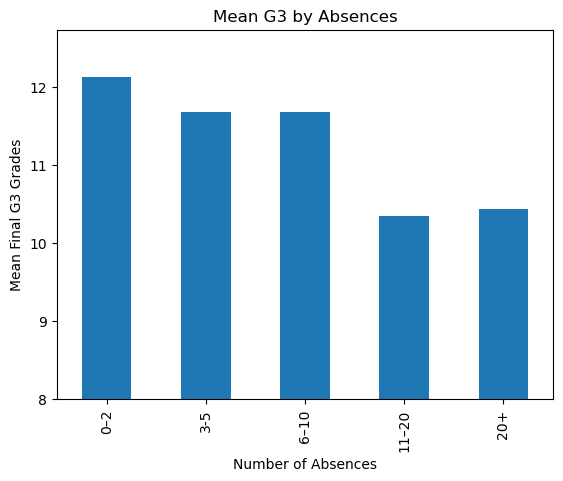

,Absence Range,Mean G3,N. of Students
0,0–2,12.12,190
1,3-5,11.68,178
2,6–10,11.67,202
3,11–20,10.35,92
4,20+,10.43,23


In [365]:
# checking correlation between absences and g3
df['absences_bin_2'] = pd.cut(
    df['absences'],
    bins=[0, 2, 5, 10, 20, 100],
    labels=['0–2', '3-5', '6–10', '11–20', '20+']
)
mean_g3_by_absences = df.groupby('absences_bin_2')['g3'].mean()

mean_g3_by_absences.plot(kind='bar')

plt.xlabel('Number of Absences')
plt.ylabel('Mean Final G3 Grades')
plt.title('Mean G3 by Absences')
plt.ylim(bottom=8)
plt.show()

g3_by_absences = (
    df.groupby('absences_bin_2')['g3']
      .agg(['mean', 'count'])
      .round(2)
      .reset_index()
)
g3_by_absences.columns = ['Absence Range', 'Mean G3', 'N. of Students']

g3_by_absences


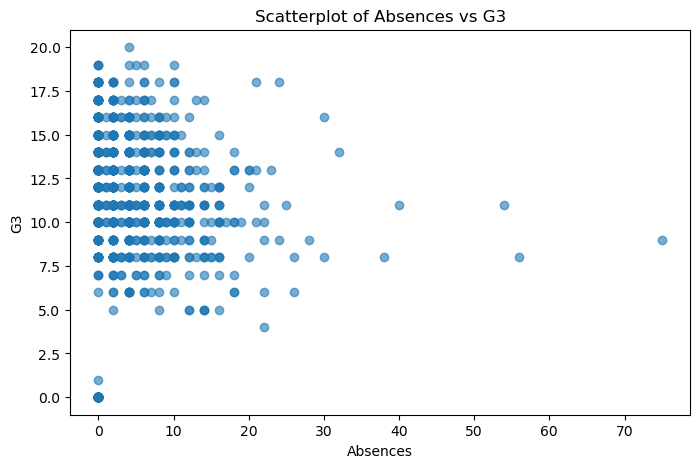

In [366]:
# checking correlation between absences and G3
plt.figure(figsize=(8, 5))
plt.scatter(df['absences'], df['g3'], alpha=0.6)

plt.xlabel('Absences')
plt.ylabel('G3')
plt.title('Scatterplot of Absences vs G3')

plt.show()

## EDA on study time

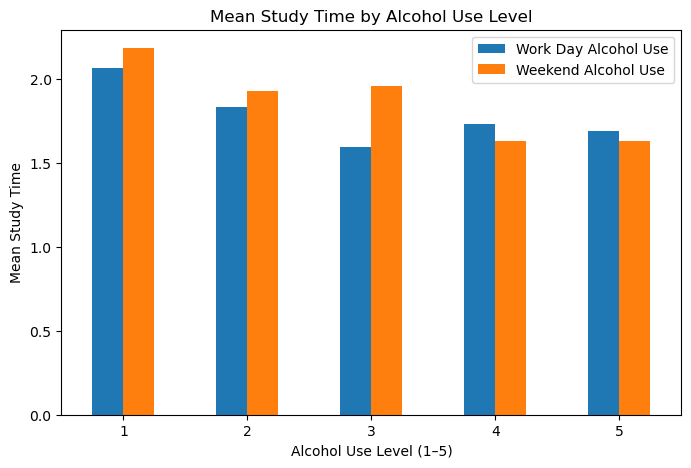

In [367]:
# checking relation between alcohol consumption and study time
mean_studytime_alcohol = df.groupby('work_day_alcohol_use')['study_time'].mean().to_frame()

mean_studytime_alcohol['Weekend Alcohol Use'] = (
    df.groupby('weekend_alcohol_use')['study_time'].mean()
)

mean_studytime_alcohol.columns = ['Work Day Alcohol Use', 'Weekend Alcohol Use']

mean_studytime_alcohol.plot(kind='bar', figsize=(8,5))

plt.xlabel('Alcohol Use Level (1–5)')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Alcohol Use Level')
plt.xticks(rotation=0)
plt.show()

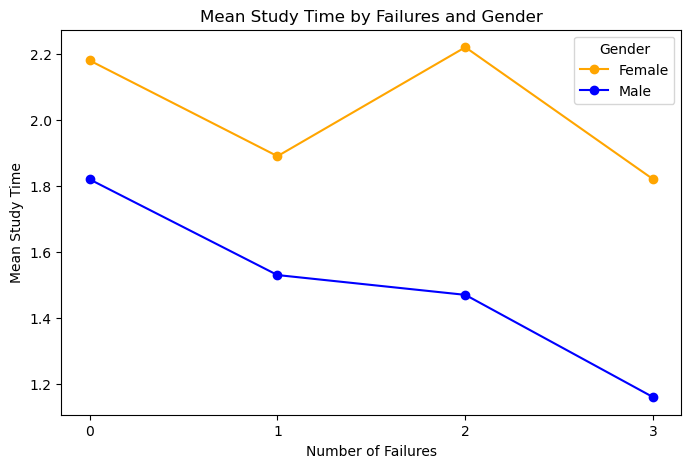

sex,F,M
failures,,
0,2.18,1.82
1,1.89,1.53
2,2.22,1.47
3,1.82,1.16


In [368]:
mean_study_genfail = (
    df.groupby(['failures', 'sex'])['study_time']
      .mean()
      .unstack()
      .sort_index()
      .round(2)
)

plt.figure(figsize=(8,5))

plt.plot(mean_study_genfail.index, mean_study_genfail['F'], marker='o', color='orange', label='Female')
plt.plot(mean_study_genfail.index, mean_study_genfail['M'], marker='o', color='blue', label='Male')

plt.xlabel('Number of Failures')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Failures and Gender')

plt.xticks(mean_study_genfail.index)

plt.legend(title='Gender')

plt.show()
mean_study_genfail

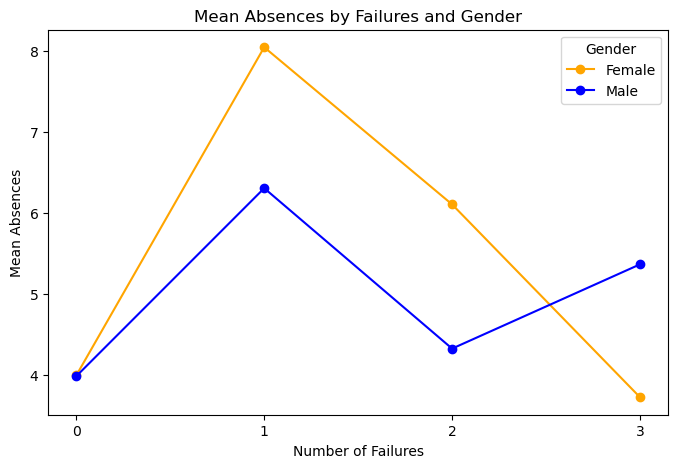

sex,F,M
failures,,
0,4.00,3.99
1,8.05,6.31
2,6.11,4.33
3,3.73,5.37


In [369]:
mean_abs_genfail = (
    df.groupby(['failures', 'sex'])['absences']
      .mean()
      .unstack()
      .sort_index()
      .round(2)
)

plt.figure(figsize=(8,5))

plt.plot(mean_abs_genfail.index, mean_abs_genfail['F'], marker='o', color='orange', label='Female')
plt.plot(mean_abs_genfail.index, mean_abs_genfail['M'], marker='o', color='blue', label='Male')

plt.xlabel('Number of Failures')
plt.ylabel('Mean Absences')
plt.title('Mean Absences by Failures and Gender')

plt.xticks(mean_abs_genfail.index)

plt.legend(title='Gender')

plt.show()
mean_abs_genfail

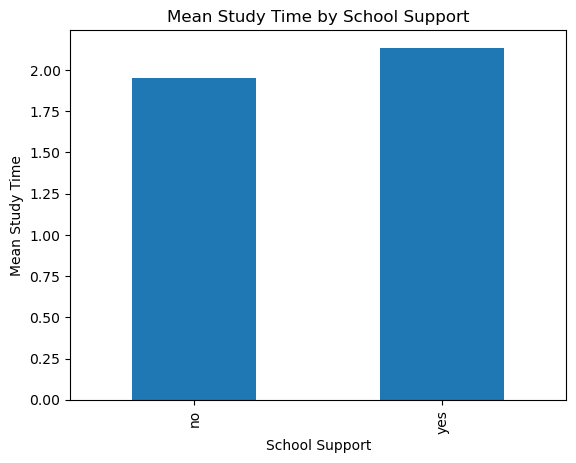

,mean,count
school_support,,
no,1.95,925
yes,2.13,119


In [370]:
# checking how family and school support affect positively the study time
mean_study_schoolsup = df.groupby('school_support')['study_time'].mean()
mean_study_schoolsup.plot(kind='bar')

plt.xlabel('School Support')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by School Support')
plt.show()

df.groupby('school_support')['study_time'].agg(['mean', 'count']).round(2)

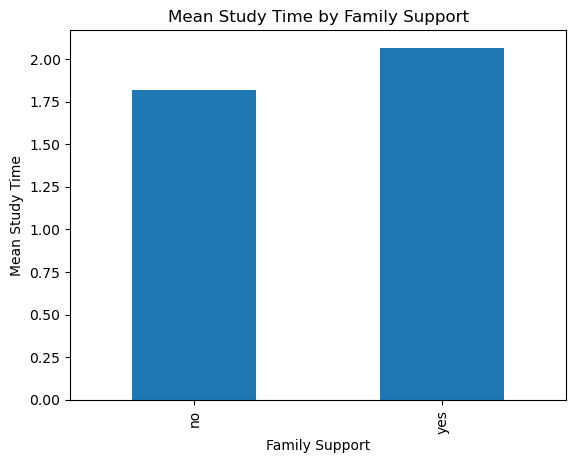

,mean,count
family_support,,
no,1.82,404
yes,2.07,640


In [371]:
mean_study_famsup = df.groupby('family_support')['study_time'].mean()
mean_study_famsup.plot(kind='bar')

plt.xlabel('Family Support')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Family Support')
plt.show()

df.groupby('family_support')['study_time'].agg(['mean', 'count']).round(2)

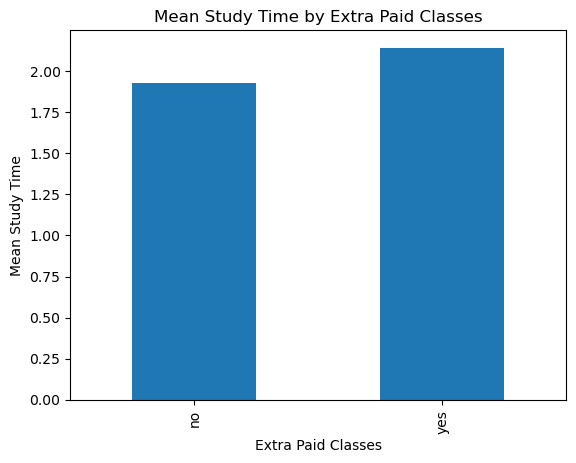

,mean,count
extra_paid_classes,,
no,1.92,824
yes,2.14,220


In [372]:
mean_study_extrapaid = df.groupby('extra_paid_classes')['study_time'].mean()
mean_study_extrapaid.plot(kind='bar')

plt.xlabel('Extra Paid Classes')
plt.ylabel('Mean Study Time')
plt.title('Mean Study Time by Extra Paid Classes')
plt.show()

df.groupby('extra_paid_classes')['study_time'].agg(['mean', 'count']).round(2)

## EDA on failures

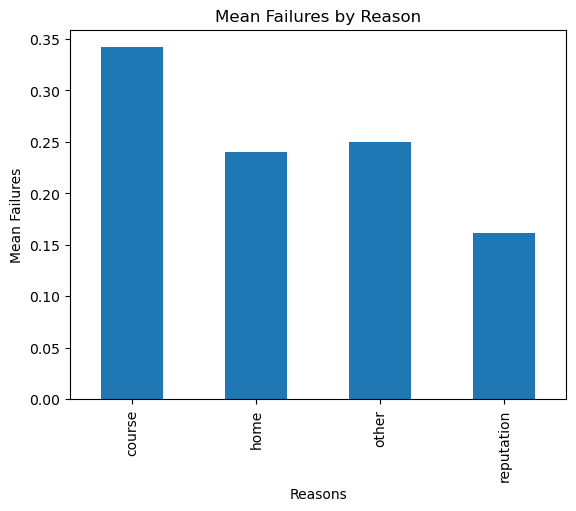

,mean,sum,count
reason,,,
course,0.34,147,430
home,0.24,62,258
other,0.25,27,108
reputation,0.16,40,248


In [373]:
mean_failures_reason = df.groupby('reason')['failures'].mean()
mean_failures_reason.plot(kind='bar')

plt.xlabel('Reasons')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by Reason')
plt.show()

df.groupby('reason')['failures'].agg(['mean', 'sum', 'count']).round(2)

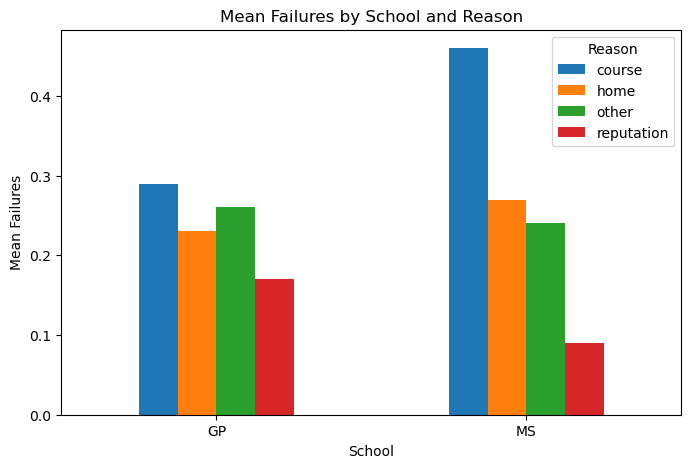

mean  sum  count
school reason                      
GP     course      0.29   83    291
       home        0.23   50    213
       other       0.26   14     54
       reputation  0.17   37    214
MS     course      0.46   64    139
       home        0.27   12     45
       other       0.24   13     54
       reputation  0.09    3     34

In [374]:
mean_failures = (
    df.groupby(['school', 'reason'])['failures']
      .mean()
      .unstack()
      .round(2)
)

mean_failures.plot(kind='bar', figsize=(8,5))

plt.xlabel('School')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by School and Reason')
plt.xticks(rotation=0)
plt.legend(title='Reason')

plt.show()

df.groupby(['school', 'reason'])['failures'].agg(['mean', 'sum', 'count']).round(2)

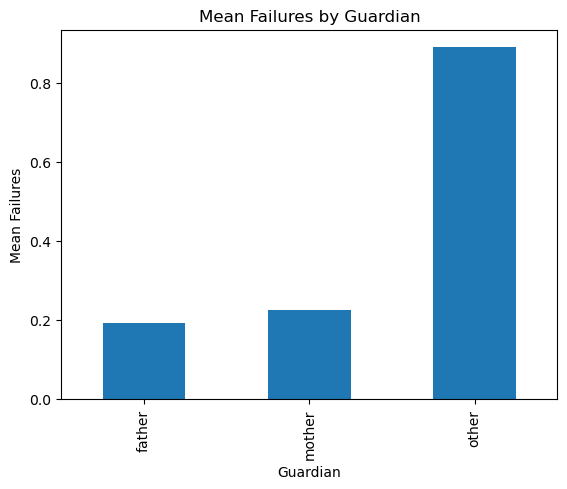

,mean,sum,count
guardian,,,
father,0.19,47,243
mother,0.23,164,728
other,0.89,65,73


In [375]:
mean_failures_guardian = df.groupby('guardian')['failures'].mean()
mean_failures_guardian.plot(kind='bar')

plt.xlabel('Guardian')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by Guardian')
plt.show()

df.groupby('guardian')['failures'].agg(['mean', 'sum', 'count']).round(2)

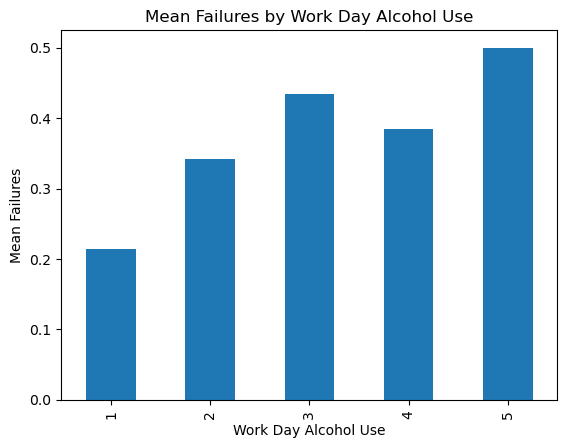

,mean,sum,count
work_day_alcohol_use,,,
1,0.21,156,727
2,0.34,67,196
3,0.43,30,69
4,0.38,10,26
5,0.50,13,26


In [376]:
mean_failures_workdayalc = df.groupby('work_day_alcohol_use')['failures'].mean()
mean_failures_workdayalc.plot(kind='bar')

plt.xlabel('Work Day Alcohol Use')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by Work Day Alcohol Use')
plt.show()

df.groupby('work_day_alcohol_use')['failures'].agg(['mean', 'sum', 'count']).round(2)

In [377]:
df.groupby('guardian')['work_day_alcohol_use'].agg(['mean', 'sum', 'count']).round(2)

,mean,sum,count
guardian,,,
father,1.55,377,243
mother,1.45,1054,728
other,1.77,129,73


In [378]:
df.groupby(['guardian', 'work_day_alcohol_use'])['failures'].agg(['mean', 'sum', 'count']).round(2)

mean  sum  count
guardian work_day_alcohol_use                  
father   1                     0.15   23    158
         2                     0.30   16     54
         3                     0.11    2     18
         4                     0.62    5      8
         5                     0.20    1      5
mother   1                     0.18   93    526
         2                     0.34   44    128
         3                     0.37   16     43
         4                     0.08    1     12
         5                     0.53   10     19
other    1                     0.93   40     43
         2                     0.50    7     14
         3                     1.50   12      8
         4                     0.67    4      6
         5                     1.00    2      2

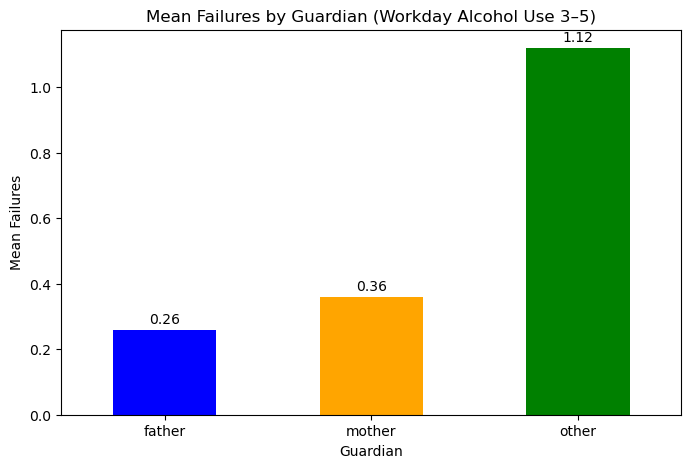

In [379]:
# Filtering alcohol levels 3, 4, 5
df_alcohol = df[df['work_day_alcohol_use'].isin([3, 4, 5])]

mean_failures = (
    df_alcohol.groupby('guardian')['failures']
    .mean()
    .round(2)
)

ax = mean_failures.plot(
    kind='bar',
    figsize=(8,5),
    color=['blue', 'orange', 'green']
)

plt.xlabel('Guardian')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by Guardian (Workday Alcohol Use 3–5)')
plt.xticks(rotation=0)

for i, v in enumerate(mean_failures):
    ax.text(i, v + 0.02, str(v), ha='center')

plt.show()

In [380]:
df['alcohol_group'] = np.where(
    df['work_day_alcohol_use'].isin([1,2]),
    'Low (1–2)',
    'High (3–5)'
)

table = (
    df.groupby(['guardian','alcohol_group'])['failures']
      .agg(['mean','count'])
      .round(2)
      .unstack()
)

table

mean                count          
alcohol_group High (3–5) Low (1–2) High (3–5) Low (1–2)
guardian                                               
father              0.26      0.18         31       212
mother              0.36      0.21         74       654
other               1.12      0.82         16        57

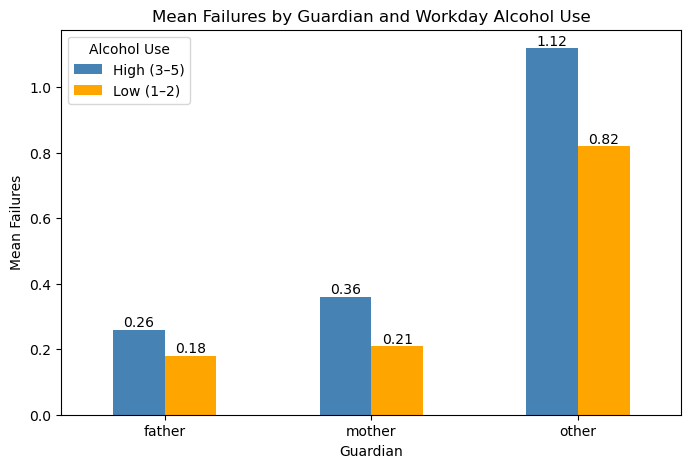

In [381]:
mean_table = (
    df.groupby(['guardian','alcohol_group'])['failures']
      .mean()
      .round(2)
      .unstack()
)

mean_table = mean_table.reindex(['father','mother','other'])

ax = mean_table.plot(
    kind='bar',
    figsize=(8,5),
    color=['steelblue','orange']
)

plt.xlabel('Guardian')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by Guardian and Workday Alcohol Use')
plt.xticks(rotation=0)
plt.legend(title='Alcohol Use')

for container in ax.containers:
    ax.bar_label(container, fmt='%.2f')

plt.show()

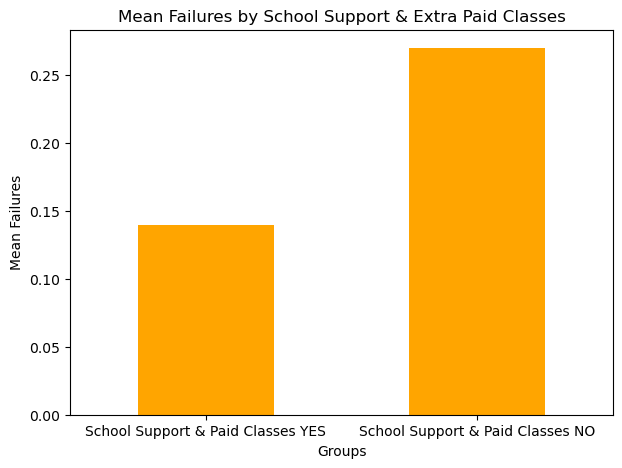

In [382]:
# Group 1
group_yes_yes = df[
    (df['school_support'] == 'yes') &
    (df['extra_paid_classes'] == 'yes')
]['failures']

# Group 2
group_no_no = df[
    (df['school_support'] == 'no') &
    (df['extra_paid_classes'] == 'no')
]['failures']

mean_yes_yes = group_yes_yes.mean().round(2)
count_yes_yes = group_yes_yes.count()

mean_no_no = group_no_no.mean().round(2)
count_no_no = group_no_no.count()

comparison = pd.DataFrame({
    'Groups': ['School Support & Paid Classes YES', 'School Support & Paid Classes NO'],
    'Mean Failures': [mean_yes_yes, mean_no_no]
}).round(2)

ax = comparison.set_index('Groups').plot(
    kind='bar',
    figsize=(7,5),
    color=['orange']
)

plt.ylabel('Mean Failures')
plt.title('Mean Failures by School Support & Extra Paid Classes')
plt.xticks(rotation=0)
plt.legend().remove()

plt.show()

In [383]:
comparison_table = (
    df.groupby(['school_support','extra_paid_classes'])['failures']
      .agg(['mean','count'])
      .round(2)
)

comparison_table

mean  count
school_support extra_paid_classes             
no             no                  0.27    733
               yes                 0.23    192
yes            no                  0.31     91
               yes                 0.14     28

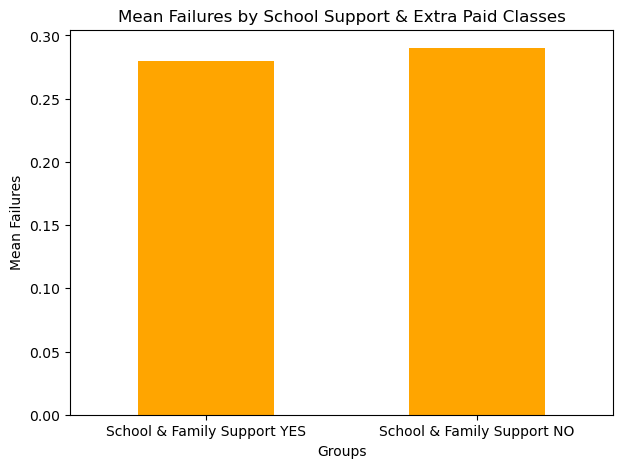

In [384]:
# Group 1
group_yes_yes = df[
    (df['school_support'] == 'yes') &
    (df['family_support'] == 'yes')
]['failures']

# Group 2
group_no_no = df[
    (df['school_support'] == 'no') &
    (df['family_support'] == 'no')
]['failures']

mean_yes_yes = group_yes_yes.mean().round(2)
count_yes_yes = group_yes_yes.count()

mean_no_no = group_no_no.mean().round(2)
count_no_no = group_no_no.count()

comparison = pd.DataFrame({
    'Groups': ['School & Family Support YES', 'School & Family Support NO'],
    'Mean Failures': [mean_yes_yes, mean_no_no]
}).round(2)

# Plot
ax = comparison.set_index('Groups').plot(
    kind='bar',
    figsize=(7,5),
    color=['orange']
)

plt.ylabel('Mean Failures')
plt.title('Mean Failures by School Support & Extra Paid Classes')
plt.xticks(rotation=0)
plt.legend().remove()

plt.show()

In [385]:
df.groupby(['school_support', 'extra_paid_classes'])['failures'].agg(['mean', 'sum', 'count']).round(2)

mean  sum  count
school_support extra_paid_classes                  
no             no                  0.27  200    733
               yes                 0.23   44    192
yes            no                  0.31   28     91
               yes                 0.14    4     28

In [386]:
df.groupby(['guardian', 'school_support', 'extra_paid_classes'])['failures'].agg(['mean', 'sum', 'count']).round(2)

mean  sum  count
guardian school_support extra_paid_classes                  
father   no             no                  0.17   29    170
                        yes                 0.20    8     40
         yes            no                  0.31   10     32
                        yes                 0.00    0      1
mother   no             no                  0.24  124    513
                        yes                 0.16   21    134
         yes            no                  0.28   15     54
                        yes                 0.15    4     27
other    no             no                  0.94   47     50
                        yes                 0.83   15     18
         yes            no                  0.60    3      5

In [387]:
df['school_support_num'] = df['school_support'].map({'yes':1, 'no':0})
df['extra_paid_num'] = df['extra_paid_classes'].map({'yes':1, 'no':0})

mean_support = (
    df.groupby('guardian')[['school_support_num','extra_paid_num']]
      .mean()
      .round(2)
)

mean_support

,school_support_num,extra_paid_num
guardian,,
father,0.14,0.17
mother,0.11,0.22
other,0.07,0.25


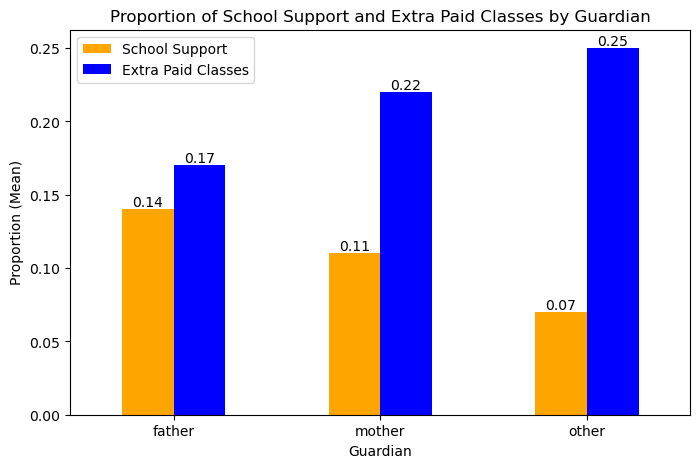

In [388]:
mean_support = mean_support.reindex(['father','mother','other']) 

ax = mean_support.plot(
    kind='bar',
    figsize=(8,5),
    color=['orange','blue']
)

plt.xlabel('Guardian')
plt.ylabel('Proportion (Mean)')
plt.title('Proportion of School Support and Extra Paid Classes by Guardian')
plt.xticks(rotation=0)
plt.legend(['School Support','Extra Paid Classes'])

for container in ax.containers:
    ax.bar_label(container, fmt='%.2f')

plt.show()

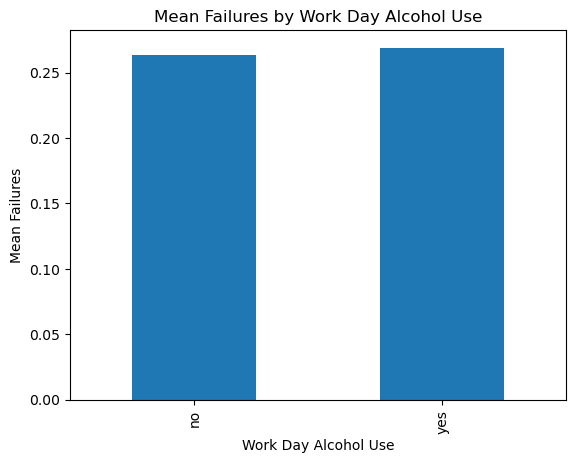

,mean,sum,count
school_support,,,
no,0.26,244,925
yes,0.27,32,119


In [389]:
mean_failures_schoosup = df.groupby('school_support')['failures'].mean()
mean_failures_schoosup.plot(kind='bar')

plt.xlabel('Work Day Alcohol Use')
plt.ylabel('Mean Failures')
plt.title('Mean Failures by Work Day Alcohol Use')
plt.show()

df.groupby('school_support')['failures'].agg(['mean', 'sum', 'count']).round(2)

## EDA on g3 grades

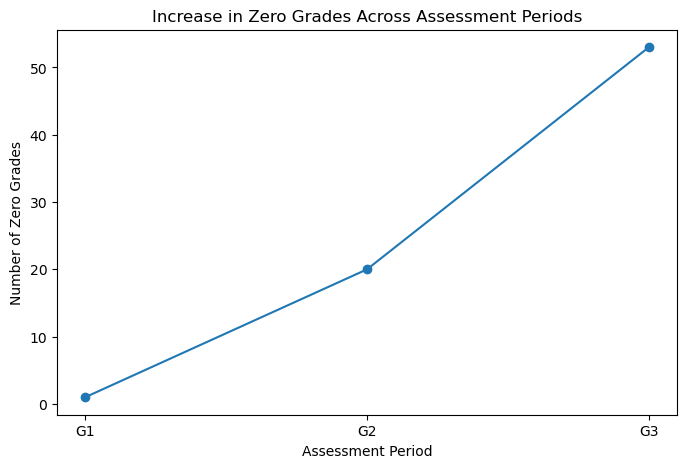

,Assessment Period,Zero Grade Count
0,g1,1
1,g2,20
2,g3,53


In [390]:
zero_counts = {
    'G1': (df['g1'] == 0).sum(),
    'G2': (df['g2'] == 0).sum(),
    'G3': (df['g3'] == 0).sum()
}

periods = list(zero_counts.keys())
counts = list(zero_counts.values())

# Plot
plt.figure(figsize=(8,5))
plt.plot(periods, counts, marker='o')

plt.xlabel('Assessment Period')
plt.ylabel('Number of Zero Grades')
plt.title('Increase in Zero Grades Across Assessment Periods')

plt.show()

zero_grade_df = pd.DataFrame({
    'Assessment Period': ['g1', 'g2', 'g3'],
    'Zero Grade Count': [
        (df['g1'] == 0).sum(),
        (df['g2'] == 0).sum(),
        (df['g3'] == 0).sum()
    ]
})
zero_grade_df

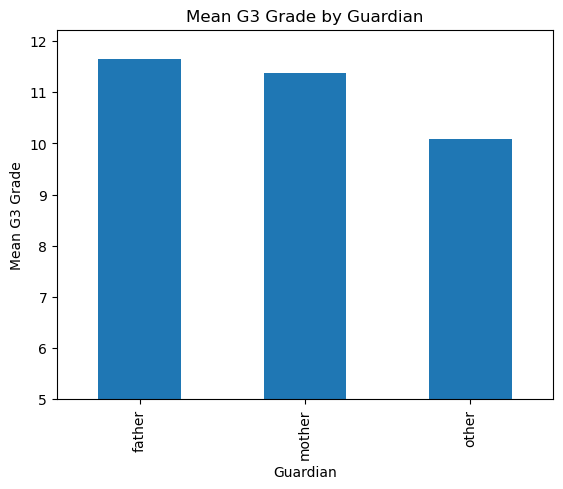

,mean,count
guardian,,
father,11.64,243
mother,11.37,728
other,10.10,73


In [391]:
mean_g3_guardian = df.groupby('guardian')['g3'].mean()
mean_g3_guardian.plot(kind='bar')

plt.xlabel('Guardian')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Guardian')
plt.ylim(bottom=5)
plt.show()

df.groupby('guardian')['g3'].agg(['mean', 'count']).round(2)

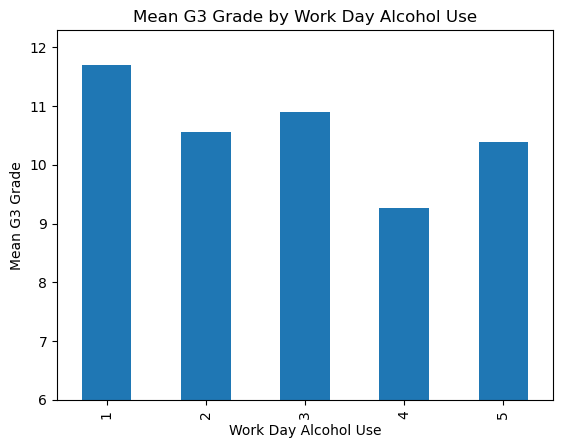

,mean,count
work_day_alcohol_use,,
1,11.70,727
2,10.56,196
3,10.90,69
4,9.27,26
5,10.38,26


In [392]:
mean_g3_workdayalc = df.groupby('work_day_alcohol_use')['g3'].mean()
mean_g3_workdayalc.plot(kind='bar')

plt.xlabel('Work Day Alcohol Use')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Work Day Alcohol Use')
plt.ylim(bottom=6)
plt.show()

df.groupby('work_day_alcohol_use')['g3'].agg(['mean', 'count']).round(2)

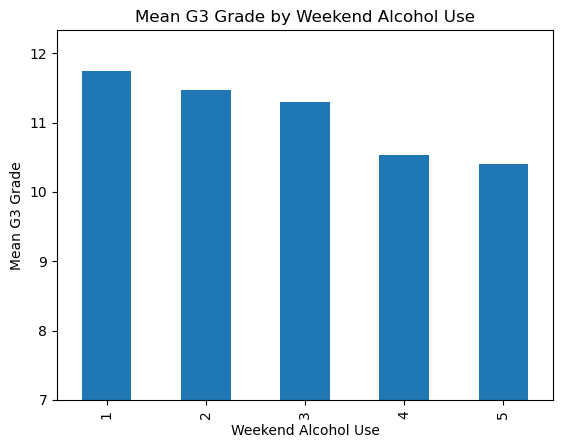

,mean,count
weekend_alcohol_use,,
1,11.74,398
2,11.47,235
3,11.29,200
4,10.54,138
5,10.40,73


In [393]:
mean_g3_weekend = df.groupby('weekend_alcohol_use')['g3'].mean()
mean_g3_weekend.plot(kind='bar')

plt.xlabel('Weekend Alcohol Use')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Weekend Alcohol Use')
plt.ylim(bottom=7)
plt.show()

df.groupby('weekend_alcohol_use')['g3'].agg(['mean', 'count']).round(2)

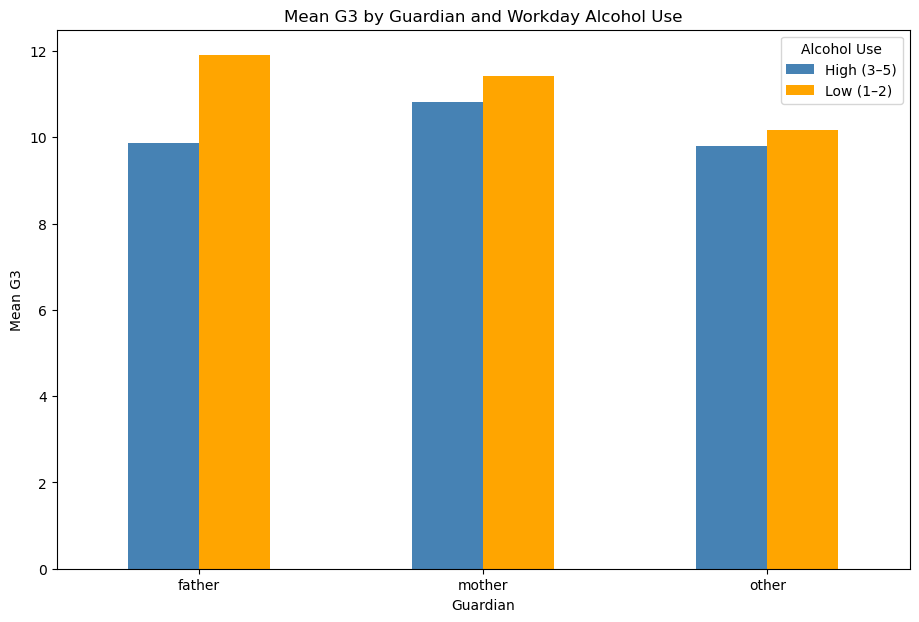

In [394]:
mean_table_g3 = (
    df.groupby(['guardian','alcohol_group'])['g3']
      .mean()
      .round(2)
      .unstack()
)

mean_table_g3 = mean_table_g3.reindex(['father','mother','other'])

ax_2 = mean_table_g3.plot(
    kind='bar',
    figsize=(11,7),
    color=['steelblue','orange']
)

plt.xlabel('Guardian')
plt.ylabel('Mean G3')
plt.title('Mean G3 by Guardian and Workday Alcohol Use')
plt.xticks(rotation=0)
plt.legend(title='Alcohol Use')

for container in ax.containers:
    ax.bar_label(container, fmt='%.2f')

plt.show()

<Figure size 800x500 with 0 Axes>

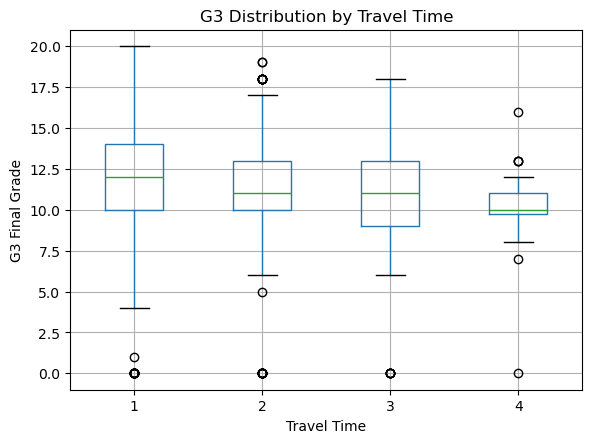

In [395]:
plt.figure(figsize=(8,5))

df.boxplot(column='g3', by='travel_time')

plt.xlabel('Travel Time')
plt.ylabel('G3 Final Grade')
plt.title('G3 Distribution by Travel Time')

plt.suptitle('') 
plt.show()

In [396]:
df.groupby(['school', 'travel_time'])['g3'].agg(['mean', 'count']).round(2)

mean  count
school travel_time              
GP     1            11.90    526
       2            11.19    193
       3            10.97     35
       4            10.00     18
MS     1            10.28     97
       2            10.76    127
       3            10.29     42
       4            10.67      6

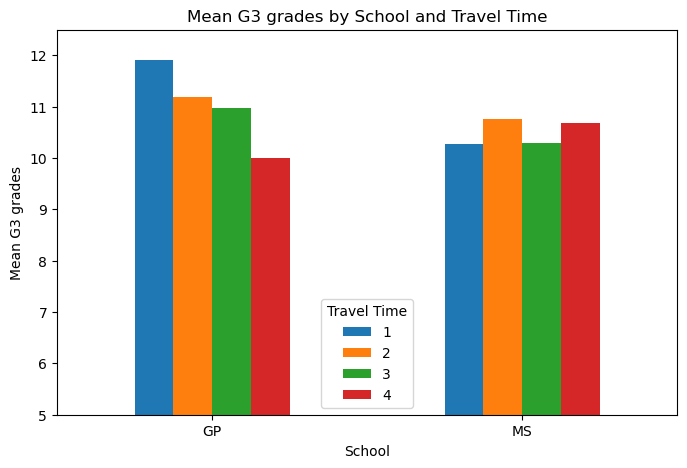

mean  sum  count
school reason                      
GP     course      0.29   83    291
       home        0.23   50    213
       other       0.26   14     54
       reputation  0.17   37    214
MS     course      0.46   64    139
       home        0.27   12     45
       other       0.24   13     54
       reputation  0.09    3     34

In [397]:
mean_tratime_schoo = (
    df.groupby(['school', 'travel_time'])['g3']
      .mean()
      .unstack()
      .round(2)
)

mean_tratime_schoo.plot(kind='bar', figsize=(8,5))

plt.xlabel('School')
plt.ylabel('Mean G3 grades')
plt.title('Mean G3 grades by School and Travel Time')
plt.xticks(rotation=0)
plt.ylim(bottom=5)
plt.legend(title='Travel Time')

plt.show()

df.groupby(['school', 'reason'])['failures'].agg(['mean', 'sum', 'count']).round(2)

<Figure size 800x500 with 0 Axes>

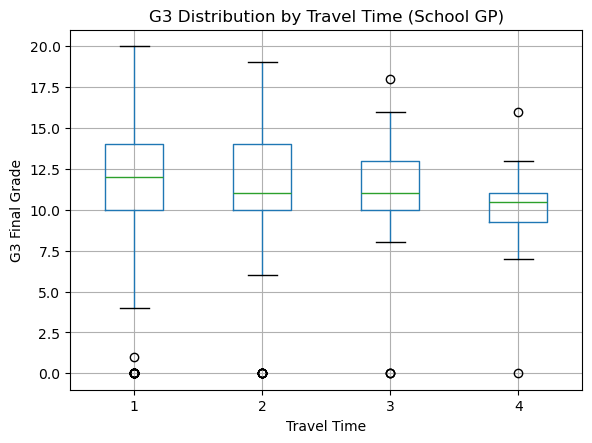

In [398]:
# Filtering only GP
df_gp = df[df['school'] == 'GP']

plt.figure(figsize=(8,5))

df_gp.boxplot(column='g3', by='travel_time')

plt.xlabel('Travel Time')
plt.ylabel('G3 Final Grade')
plt.title('G3 Distribution by Travel Time (School GP)')

plt.suptitle('') 
plt.show()

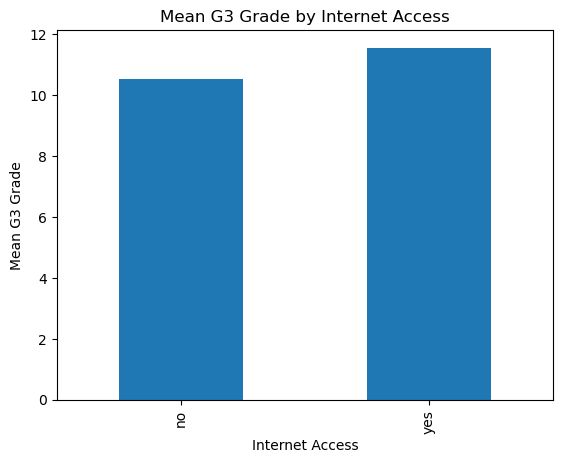

,mean,count
home_internet_access,,
no,10.53,217
yes,11.55,827


In [399]:
mean_g3_internet = df.groupby('home_internet_access')['g3'].mean()
mean_g3_internet.plot(kind='bar')

plt.xlabel('Internet Access')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Internet Access')
plt.show()

df.groupby('home_internet_access')['g3'].agg(['mean', 'count']).round(2)

<Figure size 800x500 with 0 Axes>

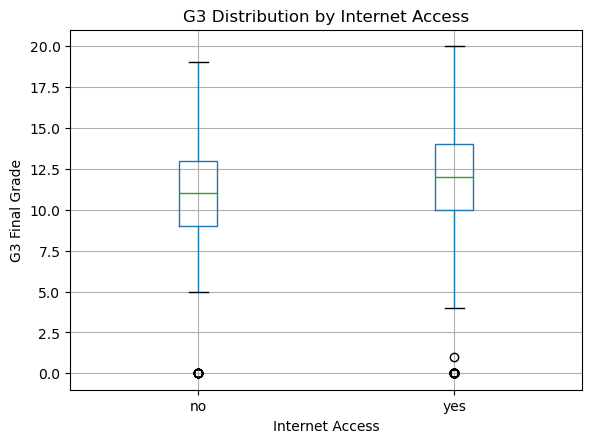

,mean,count
home_internet_access,,
no,10.53,217
yes,11.55,827


In [400]:
plt.figure(figsize=(8,5))

df.boxplot(column='g3', by='home_internet_access')

plt.xlabel('Internet Access')
plt.ylabel('G3 Final Grade')
plt.title('G3 Distribution by Internet Access')

plt.suptitle('')
plt.show()

df.groupby('home_internet_access')['g3'].agg(['mean', 'count']).round(2)

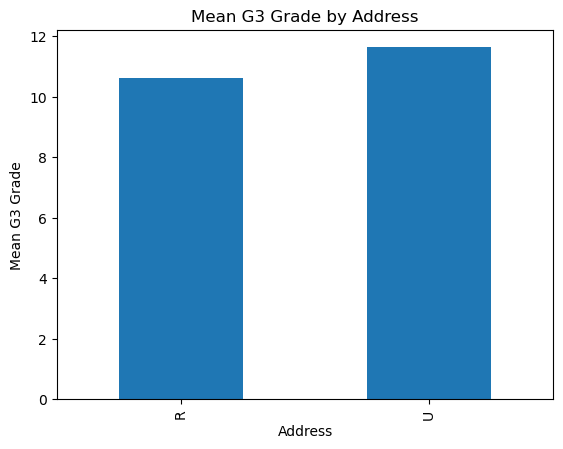

,mean,count
address,,
R,10.60,285
U,11.62,759


In [401]:
mean_g3_internet = df.groupby('address')['g3'].mean()
mean_g3_internet.plot(kind='bar')

plt.xlabel('Address')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Address')
plt.show()

df.groupby('address')['g3'].agg(['mean', 'count']).round(2)

<Figure size 800x500 with 0 Axes>

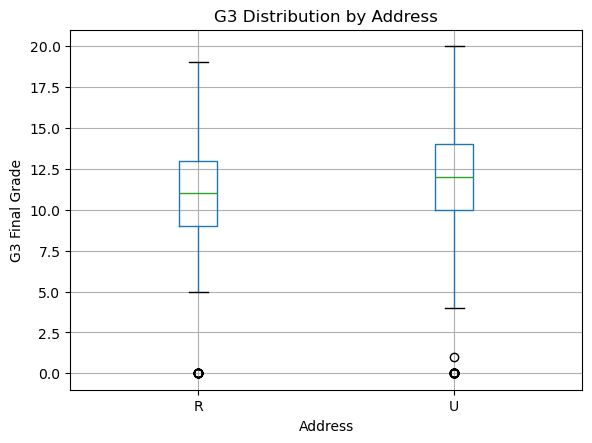

,mean,count
address,,
R,10.60,285
U,11.62,759


In [402]:
plt.figure(figsize=(8,5))

df.boxplot(column='g3', by='address')

plt.xlabel('Address')
plt.ylabel('G3 Final Grade')
plt.title('G3 Distribution by Address')

plt.suptitle('')
plt.show()

df.groupby(['address'])['g3'].agg(['mean', 'count']).round(2)

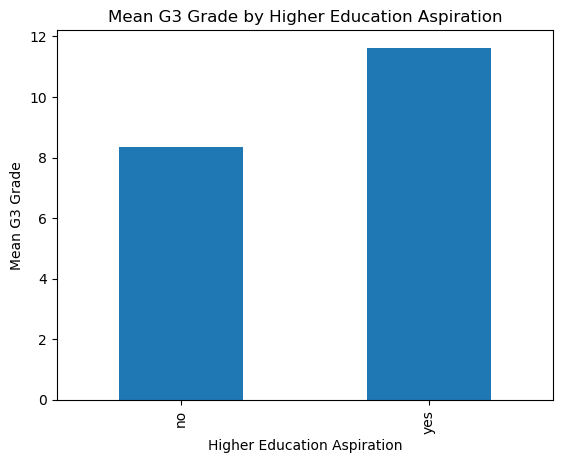

,mean,count
higher_education_aspiration,,
no,8.35,89
yes,11.62,955


In [403]:
mean_g3_eduasp = df.groupby('higher_education_aspiration')['g3'].mean()
mean_g3_eduasp.plot(kind='bar')

plt.xlabel('Higher Education Aspiration')
plt.ylabel('Mean G3 Grade')
plt.title('Mean G3 Grade by Higher Education Aspiration')
plt.show()

df.groupby(['higher_education_aspiration'])['g3'].agg(['mean', 'count']).round(2)

In [404]:
df.groupby(['father_education', 'higher_education_aspiration'])['g3'].agg(['mean', 'count']).round(2)

mean  count
father_education higher_education_aspiration              
0                yes                          12.33      9
1                no                            8.12     43
                 yes                          10.82    213
2                no                            8.64     33
                 yes                          11.54    291
3                no                            9.50     10
                 yes                          11.73    221
4                no                            4.67      3
                 yes                          12.36    221

In [405]:
df.groupby(['mother_education', 'higher_education_aspiration'])['g3'].agg(['mean', 'count']).round(2)

mean  count
mother_education higher_education_aspiration              
0                no                           10.00      2
                 yes                          12.71      7
1                no                            8.52     33
                 yes                          10.50    169
2                no                            8.65     34
                 yes                          11.28    255
3                no                            7.88     17
                 yes                          11.51    221
4                no                            4.67      3
                 yes                          12.59    303

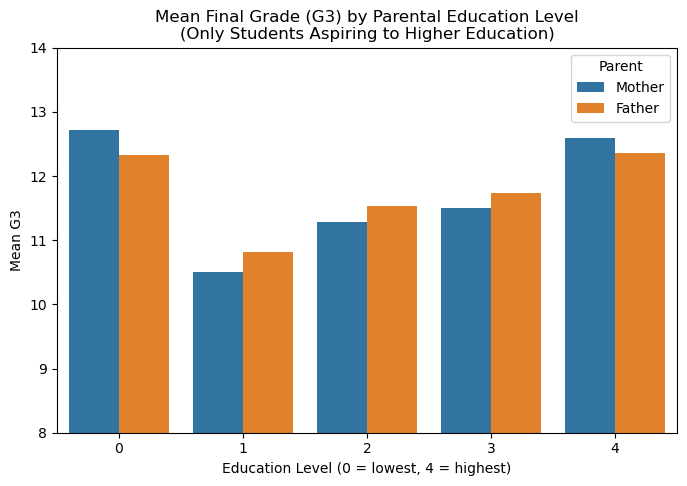

In [406]:
df_yes = df[df['higher_education_aspiration'] == 'yes']

mean_mother = df_yes.groupby('mother_education')['g3'].mean().reset_index()
mean_mother['Parent'] = 'Mother'

mean_father = df_yes.groupby('father_education')['g3'].mean().reset_index()
mean_father['Parent'] = 'Father'

mean_mother.rename(columns={'mother_education': 'Education_Level'}, inplace=True)
mean_father.rename(columns={'father_education': 'Education_Level'}, inplace=True)

combined = pd.concat([mean_mother, mean_father])

plt.figure(figsize=(8,5))

sns.barplot(
    data=combined,
    x='Education_Level',
    y='g3',
    hue='Parent'
)

plt.title('Mean Final Grade (G3) by Parental Education Level\n(Only Students Aspiring to Higher Education)')
plt.xlabel('Education Level (0 = lowest, 4 = highest)')
plt.ylabel('Mean G3')
plt.ylim(8, 14)

plt.legend(title='Parent')
plt.show()

In [407]:
df_highedu = df[df['higher_education_aspiration'] == 'yes']

df_highedu.groupby(['mother_education', 'father_education'])['g3'].agg(['mean', 'count']).round(2)

mean  count
mother_education father_education              
0                0                 11.00      1
                 1                 10.00      1
                 2                 13.60      5
1                0                 13.17      6
                 1                 10.37    108
                 2                 10.68     44
                 3                  9.25      8
                 4                 10.67      3
2                1                 11.05     63
                 2                 11.09    137
                 3                 11.70     40
                 4                 12.93     15
3                1                 11.94     32
                 2                 11.95     59
                 3                 11.22     89
                 4                 11.15     41
4                0                 10.50      2
                 1                 10.78      9
                 2                 12.96     46
                 3                 12.52     84
                 4                 12.64    162

## EDA on Guardian

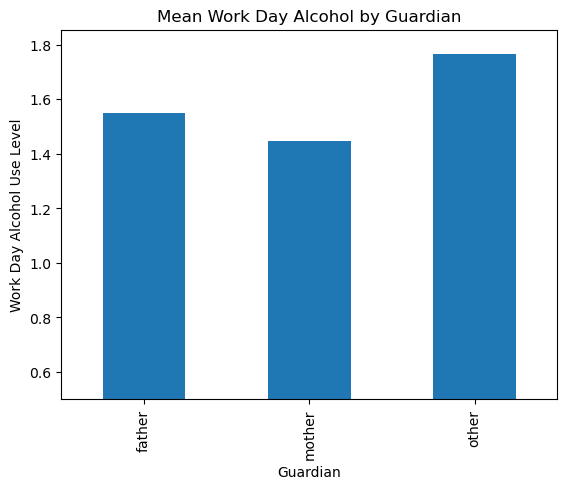

,mean,sum,count
guardian,,,
father,1.55,377,243
mother,1.45,1054,728
other,1.77,129,73


In [408]:
mean_workdayalc_guardian = df.groupby('guardian')['work_day_alcohol_use'].mean()
mean_workdayalc_guardian.plot(kind='bar')

plt.xlabel('Guardian')
plt.ylabel('Work Day Alcohol Use Level')
plt.title('Mean Work Day Alcohol by Guardian')
plt.ylim(bottom=0.5)
plt.show()

df.groupby(['guardian'])['work_day_alcohol_use'].agg(['mean', 'sum', 'count']).round(2)

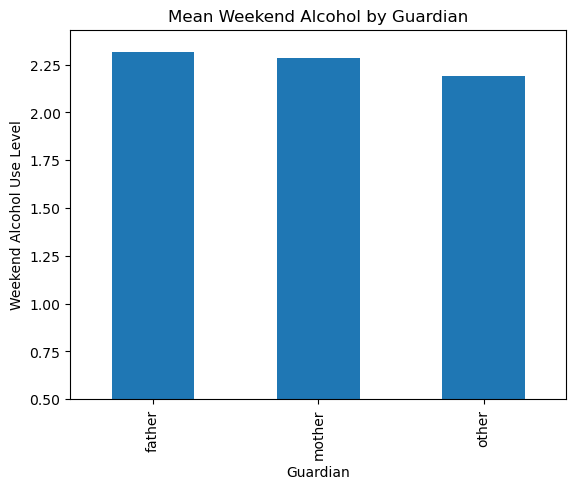

,mean,sum,count
guardian,,,
father,2.32,563,243
mother,2.28,1662,728
other,2.19,160,73


In [409]:
mean_weekendalc_guardian = df.groupby('guardian')['weekend_alcohol_use'].mean()
mean_weekendalc_guardian.plot(kind='bar')

plt.xlabel('Guardian')
plt.ylabel('Weekend Alcohol Use Level')
plt.title('Mean Weekend Alcohol by Guardian')
plt.ylim(bottom=0.5)
plt.show()

df.groupby(['guardian'])['weekend_alcohol_use'].agg(['mean', 'sum', 'count']).round(2)

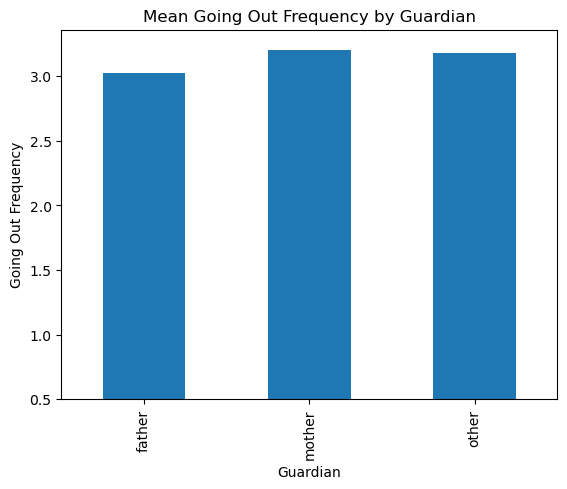

,mean,sum,count
guardian,,,
father,3.02,734,243
mother,3.20,2329,728
other,3.18,232,73


In [410]:
mean_goingout_guardian = df.groupby('guardian')['going_out_frequency'].mean()
mean_goingout_guardian.plot(kind='bar')

plt.xlabel('Guardian')
plt.ylabel('Going Out Frequency')
plt.title('Mean Going Out Frequency by Guardian')
plt.ylim(bottom=0.5)
plt.show()

df.groupby(['guardian'])['going_out_frequency'].agg(['mean', 'sum', 'count']).round(2)

## EDA on Address

In [411]:
df.groupby(['address'])['travel_time'].agg(['mean', 'count']).round(2)

,mean,count
address,,
R,1.93,285
U,1.37,759


In [412]:
df.groupby(['school', 'address'])['travel_time'].agg(['mean', 'count']).round(2)

mean  count
school address             
GP     R        1.79    141
       U        1.33    631
MS     R        2.08    144
       U        1.58    128

In [413]:
df.groupby(['address'])['g3'].agg(['mean', 'count']).round(2)

,mean,count
address,,
R,10.60,285
U,11.62,759


In [414]:
df.groupby(['address'])['study_time'].agg(['mean', 'count']).round(2)

,mean,count
address,,
R,1.92,285
U,1.99,759


In [415]:
df.groupby(['address'])['absences'].agg(['mean', 'count']).round(2)

,mean,count
address,,
R,4.06,285
U,4.57,759


In [416]:
df.groupby(['address'])['failures'].agg(['mean', 'count']).round(2)

,mean,count
address,,
R,0.33,285
U,0.24,759


## Final EDA & Test Mining & Analysis

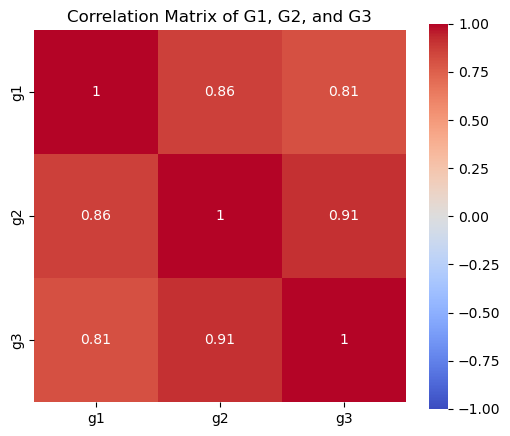

In [417]:
# checking correlation between g1, g2 and g3
corr_matrix_grades = df[['g1','g2','g3']].corr().round(2)

plt.figure(figsize=(6,5))

sns.heatmap(
    corr_matrix_grades,
    annot=True,      
    cmap='coolwarm',     
    vmin=-1, vmax=1,
    square=True
)

plt.title('Correlation Matrix of G1, G2, and G3')
plt.show()

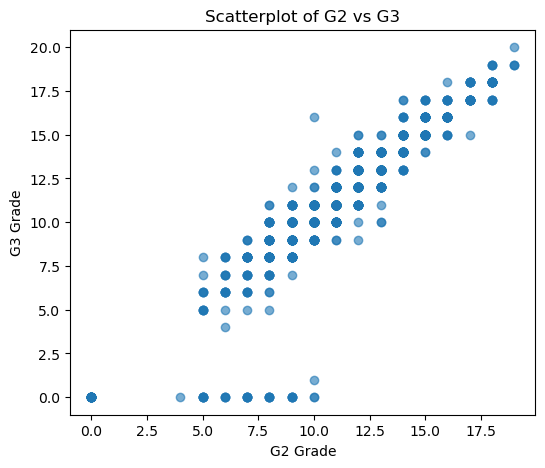

In [418]:
plt.figure(figsize=(6,5))

plt.scatter(df['g2'], df['g3'], alpha=0.6)

plt.xlabel('G2 Grade')
plt.ylabel('G3 Grade')
plt.title('Scatterplot of G2 vs G3')

plt.show()

<Figure size 600x500 with 0 Axes>

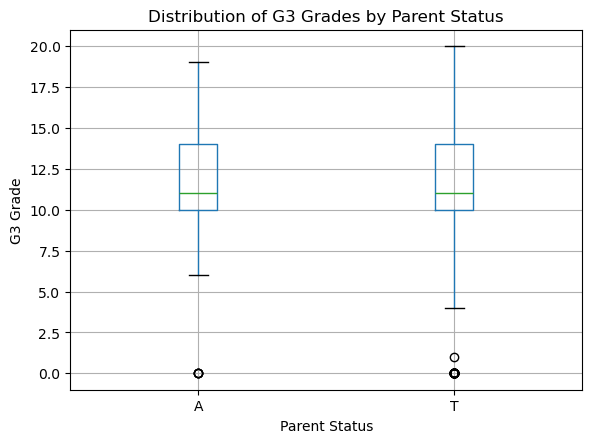

,mean,count
parent_status,,
A,11.67,121
T,11.30,923


In [419]:
plt.figure(figsize=(6,5))

df.boxplot(column='g3', by='parent_status')

plt.xlabel('Parent Status')
plt.ylabel('G3 Grade')
plt.title('Distribution of G3 Grades by Parent Status')

plt.suptitle('')
plt.show()

df.groupby('parent_status')['g3'].agg(['mean', 'count']).round(2)

<Figure size 600x500 with 0 Axes>

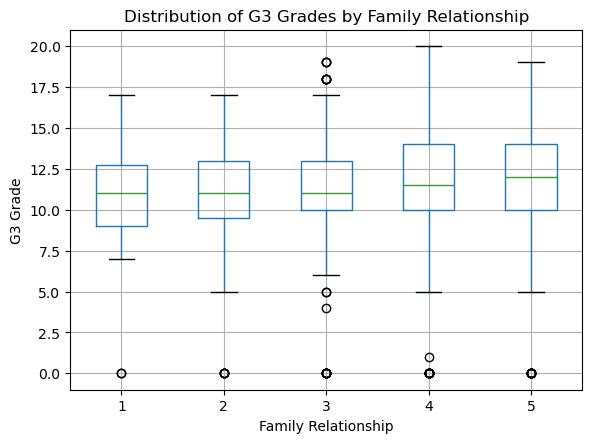

,mean,count
family_relationship,,
1,10.63,30
2,10.49,47
3,10.97,169
4,11.59,512
5,11.34,286


In [420]:
plt.figure(figsize=(6,5))

df.boxplot(column='g3', by='family_relationship')

plt.xlabel('Family Relationship')
plt.ylabel('G3 Grade')
plt.title('Distribution of G3 Grades by Family Relationship')

plt.suptitle('') 
plt.show()

df.groupby('family_relationship')['g3'].agg(['mean', 'count']).round(2)

<Figure size 600x500 with 0 Axes>

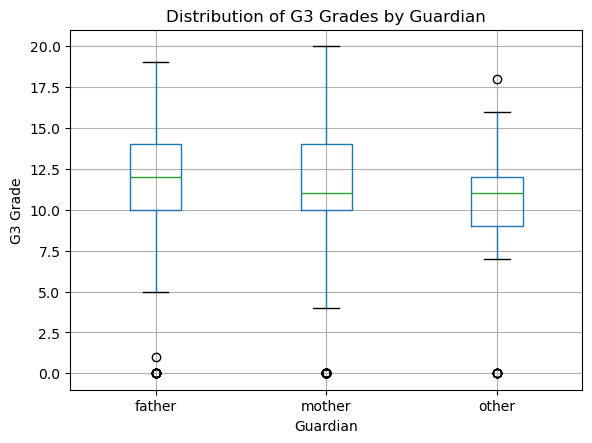

In [421]:
plt.figure(figsize=(6,5))

df.boxplot(column='g3', by='guardian')

plt.xlabel('Guardian')
plt.ylabel('G3 Grade')
plt.title('Distribution of G3 Grades by Guardian')

plt.suptitle('') 
plt.show()

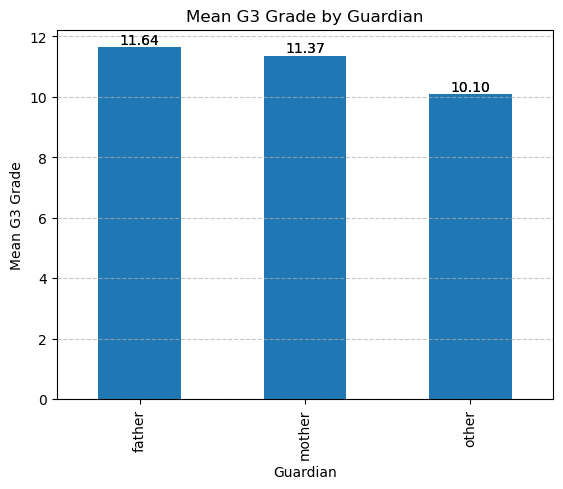

,mean,count
guardian,,
father,11.64,243
mother,11.37,728
other,10.10,73


In [422]:
mean_g3_guardian = df.groupby('guardian')['g3'].mean()
mean_g3_guardian.plot(kind='bar')

ax = mean_g3_guardian.plot(kind='bar')
plt.xlabel('Guardian')
plt.ylabel('Mean G3 Grade')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.title('Mean G3 Grade by Guardian')
for bar in ax.patches:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2,
            height,
            f"{height:.2f}",
            ha='center',
            va='bottom')
plt.show()

df.groupby('guardian')['g3'].agg(['mean', 'count']).round(2)

<Figure size 600x500 with 0 Axes>

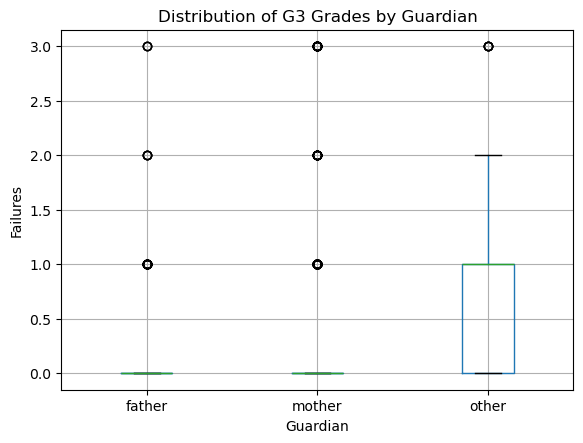

In [423]:
plt.figure(figsize=(6,5))

df.boxplot(column='failures', by='guardian')

plt.xlabel('Guardian')
plt.ylabel('Failures')
plt.title('Distribution of G3 Grades by Guardian')

plt.suptitle('') 
plt.show()

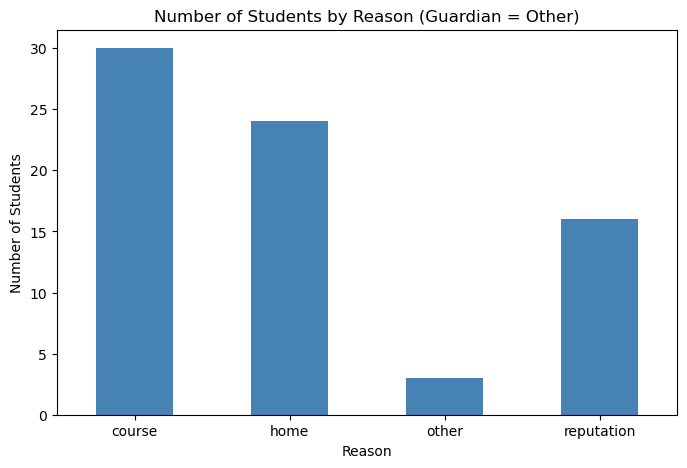

In [424]:
reason_counts = df_other.groupby('reason').size()

reason_counts.plot(kind='bar', figsize=(8,5), color='steelblue')

plt.xlabel('Reason')
plt.ylabel('Number of Students')
plt.title('Number of Students by Reason (Guardian = Other)')
plt.xticks(rotation=0)

plt.show()

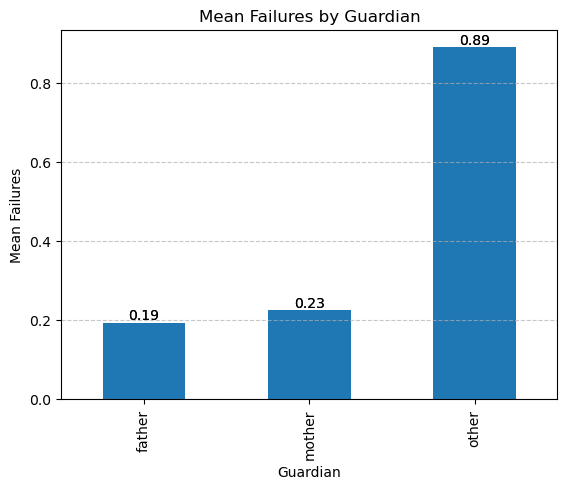

,mean,count
guardian,,
father,0.19,243
mother,0.23,728
other,0.89,73


In [425]:
mean_g3_guardian = df.groupby('guardian')['failures'].mean()
mean_g3_guardian.plot(kind='bar')

ax = mean_g3_guardian.plot(kind='bar')
plt.xlabel('Guardian')
plt.ylabel('Mean Failures')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.title('Mean Failures by Guardian')
for bar in ax.patches:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2,
            height,
            f"{height:.2f}",
            ha='center',
            va='bottom')
plt.show()

df.groupby('guardian')['failures'].agg(['mean', 'count']).round(2)

In [426]:
pd.crosstab(df['guardian'], df['reason'])

reason,course,home,other,reputation
guardian,,,,
father,94,59,27,63
mother,306,175,78,169
other,30,24,3,16


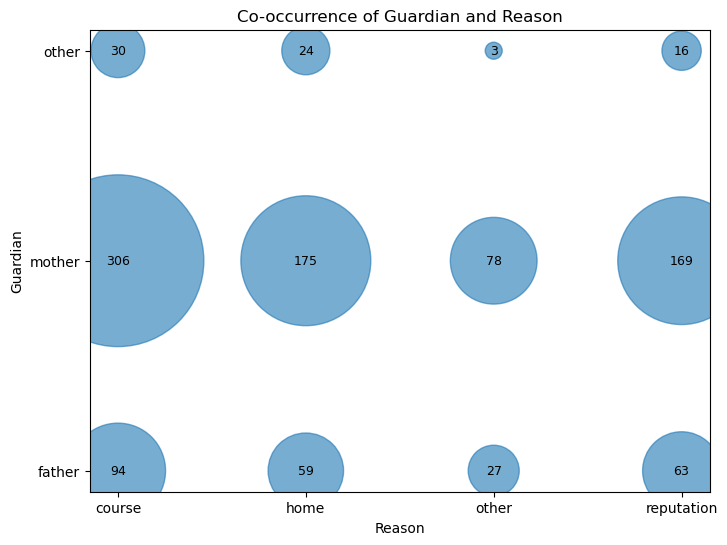

In [427]:
co_occurrence = (
    df.groupby(['guardian', 'reason'])
      .size()
      .reset_index(name='count')
)

plt.figure(figsize=(8,6))

x_labels = co_occurrence['reason'].unique()
y_labels = co_occurrence['guardian'].unique()

x_pos = co_occurrence['reason'].astype('category').cat.codes
y_pos = co_occurrence['guardian'].astype('category').cat.codes

plt.scatter(
    x_pos,
    y_pos,
    s=co_occurrence['count'] * 50, 
    alpha=0.6
)

for i in range(len(co_occurrence)):
    plt.text(
        x_pos[i],
        y_pos[i],
        co_occurrence['count'][i],
        ha='center',
        va='center',
        fontsize=9
    )

plt.xticks(range(len(x_labels)), x_labels)
plt.yticks(range(len(y_labels)), y_labels)

plt.xlabel('Reason')
plt.ylabel('Guardian')
plt.title('Co-occurrence of Guardian and Reason')

plt.show()

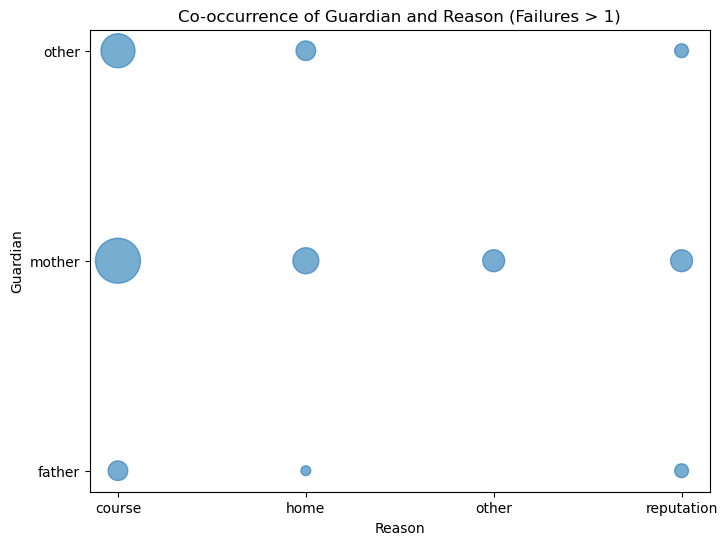

In [428]:
# Filtering only students with failures > 1
df_fail = df[df['failures'] > 1]

co_occurrence = (
    df_fail.groupby(['guardian', 'reason'])
           .size()
           .reset_index(name='count')
)

plt.figure(figsize=(8,6))

x_pos = co_occurrence['reason'].astype('category').cat.codes
y_pos = co_occurrence['guardian'].astype('category').cat.codes

x_labels = co_occurrence['reason'].astype('category').cat.categories
y_labels = co_occurrence['guardian'].astype('category').cat.categories

plt.scatter(
    x_pos,
    y_pos,
    s=co_occurrence['count'] * 50, 
    alpha=0.6
)

plt.xticks(range(len(x_labels)), x_labels)
plt.yticks(range(len(y_labels)), y_labels)

plt.xlabel('Reason')
plt.ylabel('Guardian')
plt.title('Co-occurrence of Guardian and Reason (Failures > 1)')

plt.show()

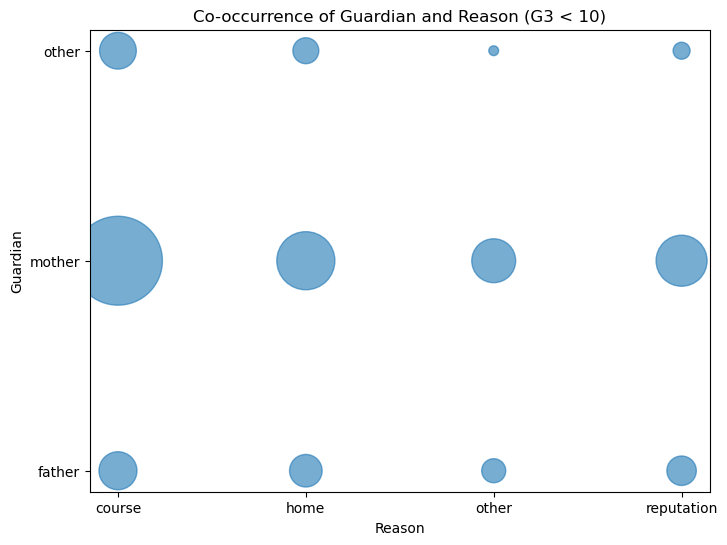

In [429]:
# Filtering only students with g3 < 10
df_g3_minus = df[df['g3'] < 10]

# Compute co-occurrence
co_occurrence_g3_minus = (
    df_g3_minus.groupby(['guardian', 'reason'])
           .size()
           .reset_index(name='count')
)

plt.figure(figsize=(8,6))

x_pos_g3_minus = co_occurrence_g3_minus['reason'].astype('category').cat.codes
y_pos_g3_minus = co_occurrence_g3_minus['guardian'].astype('category').cat.codes

x_labels_g3_minus = co_occurrence_g3_minus['reason'].astype('category').cat.categories
y_labels_g3_minus = co_occurrence_g3_minus['guardian'].astype('category').cat.categories

plt.scatter(
    x_pos_g3_minus,
    y_pos_g3_minus,
    s=co_occurrence_g3_minus['count'] * 50,
    alpha=0.6
)

plt.xticks(range(len(x_labels_g3_minus)), x_labels_g3_minus)
plt.yticks(range(len(y_labels_g3_minus)), y_labels_g3_minus)

plt.xlabel('Reason')
plt.ylabel('Guardian')
plt.title('Co-occurrence of Guardian and Reason (G3 < 10)')

plt.show()

In [430]:
df.groupby(['guardian', 'reason'])['g3'].agg(['mean', 'count']).round(2)

mean  count
guardian reason                  
father   course      11.55     94
         home        11.76     59
         other       10.56     27
         reputation  12.13     63
mother   course      10.92    306
         home        11.38    175
         other       10.95     78
         reputation  12.35    169
other    course       9.53     30
         home        10.33     24
         other       11.00      3
         reputation  10.62     16

In [431]:
df.groupby(['guardian', 'reason'])['failures'].agg(['mean', 'count']).round(2)

mean  count
guardian reason                 
father   course      0.23     94
         home        0.15     59
         other       0.15     27
         reputation  0.19     63
mother   course      0.29    306
         home        0.20    175
         other       0.29     78
         reputation  0.11    169
other    course      1.23     30
         home        0.75     24
         other       0.00      3
         reputation  0.62     16

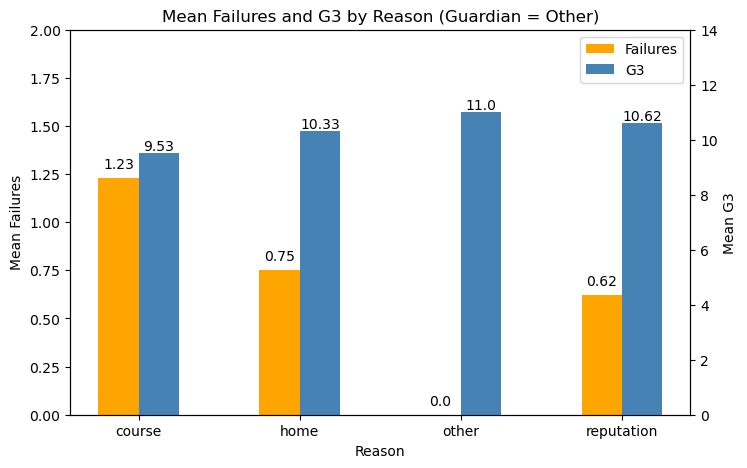

In [432]:
from matplotlib.patches import Patch

df_other = df[df['guardian'] == 'other']

means_reas = (
    df_other.groupby('reason')[['failures', 'g3']]
    .mean()
    .round(2)
)

x = np.arange(len(means_reas.index))
width = 0.25 

fig, ax1 = plt.subplots(figsize=(8,5))

bars1 = ax1.bar(
    x - width/2, 
    means_reas['failures'], 
    width, 
    color='orange'
)
ax1.set_ylabel('Mean Failures')
ax1.set_ylim(0, 2)

for bar in bars1:
    height = bar.get_height()
    ax1.text(
        bar.get_x() + bar.get_width()/2,
        height + 0.05,
        round(height,2),
        ha='center'
    )

ax2 = ax1.twinx()
bars2 = ax2.bar(
    x + width/2, 
    means_reas['g3'], 
    width, 
    color='steelblue'
)
ax2.set_ylabel('Mean G3')
ax2.set_ylim(0, 14)

for bar in bars2:
    height = bar.get_height()
    ax2.text(
        bar.get_x() + bar.get_width()/2,
        height + 0.1,
        round(height,2),
        ha='center'
    )

ax1.set_xticks(x)
ax1.set_xticklabels(means_reas.index)
ax1.set_xlabel('Reason')

plt.title('Mean Failures and G3 by Reason (Guardian = Other)')

legend_elements = [
    Patch(facecolor='orange', label='Failures'),
    Patch(facecolor='steelblue', label='G3')
]

ax1.legend(handles=legend_elements)

plt.show()

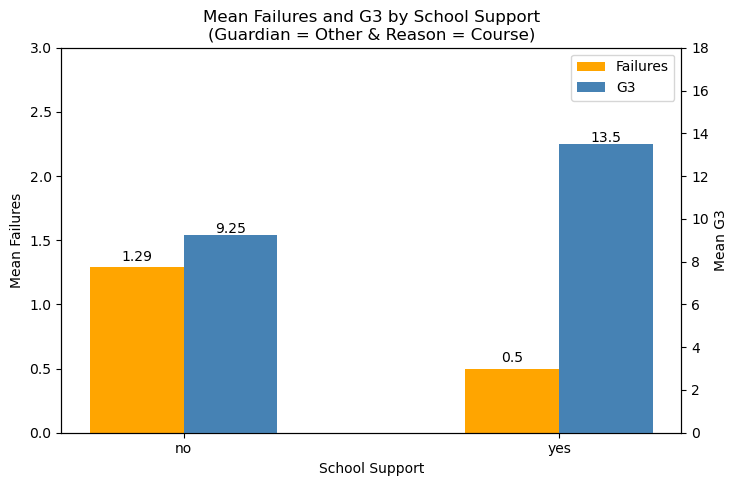

In [433]:
# Checking results with school support, filtering only guardian = other and reason = course
df_other_course = df[
    (df['guardian'] == 'other') &
    (df['reason'] == 'course')
]

means_reas_2 = (
    df_other_course.groupby('school_support')[['failures', 'g3']]
    .mean()
    .round(2)
)

x = np.arange(len(means_reas_2.index))
width = 0.25 

fig, ax1 = plt.subplots(figsize=(8,5))

bars1 = ax1.bar(
    x - width/2, 
    means_reas_2['failures'], 
    width, 
    color='orange'
)
ax1.set_ylabel('Mean Failures')
ax1.set_ylim(0, 3)

for bar in bars1:
    height = bar.get_height()
    ax1.text(
        bar.get_x() + bar.get_width()/2,
        height + 0.05,
        round(height,2),
        ha='center'
    )

ax2 = ax1.twinx()
bars2 = ax2.bar(
    x + width/2, 
    means_reas_2['g3'], 
    width, 
    color='steelblue'
)
ax2.set_ylabel('Mean G3')
ax2.set_ylim(0, 18)

for bar in bars2:
    height = bar.get_height()
    ax2.text(
        bar.get_x() + bar.get_width()/2,
        height + 0.1,
        round(height,2),
        ha='center'
    )

ax1.set_xticks(x)
ax1.set_xticklabels(means_reas_2.index)
ax1.set_xlabel('School Support')

plt.title('Mean Failures and G3 by School Support\n(Guardian = Other & Reason = Course)')

legend_elements = [
    Patch(facecolor='orange', label='Failures'),
    Patch(facecolor='steelblue', label='G3')
]

ax1.legend(handles=legend_elements)

plt.show()

In [434]:
professional_jobs = ['teacher', 'health']

df['professional_household'] = (
    df['mother_job'].isin(professional_jobs) &
    df['father_job'].isin(professional_jobs)
).astype(int)

In [435]:
df['professional_household_label'] = df['professional_household'].map({
    1: 'Both Parents Professional',
    0: 'Other Household Type'
})

In [436]:
df['professional_household_label'].value_counts()

professional_household_label
Other Household Type         989
Both Parents Professional     55
Name: count, dtype: int64

In [437]:
summary = (
    df.groupby('professional_household_label')[['g3','failures']]
      .agg(['mean','count'])
      .round(2)
)

summary

g3       failures      
                               mean count     mean count
professional_household_label                            
Both Parents Professional     13.45    55     0.05    55
Other Household Type          11.22   989     0.28   989

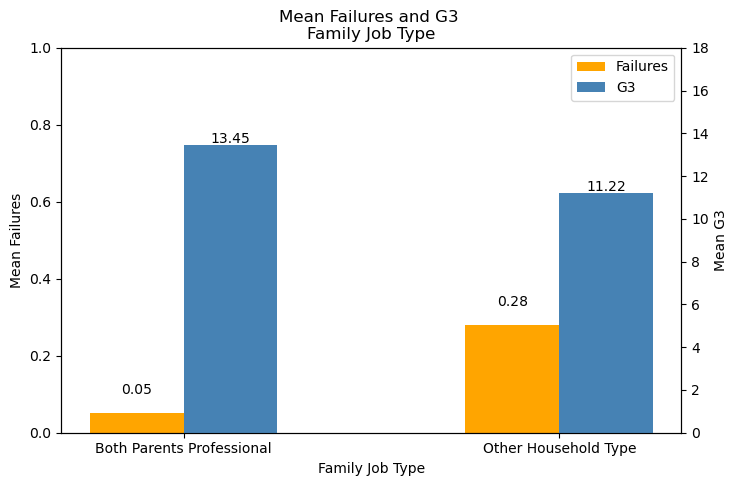

In [438]:
means_professional = (
    df.groupby('professional_household_label')[['failures', 'g3']]
    .mean()
    .round(2)
)

x = np.arange(len(means_professional.index))
width = 0.25 

fig, ax1 = plt.subplots(figsize=(8,5))

bars1 = ax1.bar(
    x - width/2,
    means_professional['failures'],
    width,
    color='orange'
)

ax1.set_ylabel('Mean Failures')
ax1.set_ylim(0, 1)

for bar in bars1:
    height = bar.get_height()
    ax1.text(
        bar.get_x() + bar.get_width()/2,
        height + 0.05,
        round(height,2),
        ha='center'
    )

ax2 = ax1.twinx()

bars2 = ax2.bar(
    x + width/2,
    means_professional['g3'],
    width,
    color='steelblue'
)

ax2.set_ylabel('Mean G3')
ax2.set_ylim(0, 18)

for bar in bars2:
    height = bar.get_height()
    ax2.text(
        bar.get_x() + bar.get_width()/2,
        height + 0.1,
        round(height,2),
        ha='center'
    )

ax1.set_xticks(x)
ax1.set_xticklabels(means_professional.index)
ax1.set_xlabel('Family Job Type')

plt.title('Mean Failures and G3 \nFamily Job Type')

legend_elements = [
    Patch(facecolor='orange', label='Failures'),
    Patch(facecolor='steelblue', label='G3')
]

ax1.legend(handles=legend_elements)

plt.show()

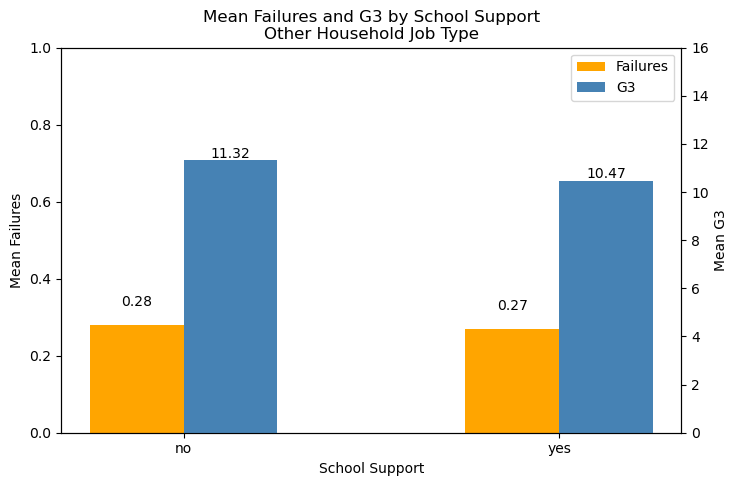

In [439]:
# Checking results with school support, filtering only Other Household Type
df_non_professional = df[df['professional_household'] == 0]

means_no_prof = (
    df_non_professional.groupby('school_support')[['failures', 'g3']]
    .mean()
    .round(2)
)

x = np.arange(len(means_no_prof.index))
width = 0.25 

fig, ax1 = plt.subplots(figsize=(8,5))

bars1 = ax1.bar(
    x - width/2, 
    means_no_prof['failures'], 
    width, 
    color='orange'
)
ax1.set_ylabel('Mean Failures')
ax1.set_ylim(0, 1)

for bar in bars1:
    height = bar.get_height()
    ax1.text(
        bar.get_x() + bar.get_width()/2,
        height + 0.05,
        round(height,2),
        ha='center'
    )

ax2 = ax1.twinx()
bars2 = ax2.bar(
    x + width/2, 
    means_no_prof['g3'], 
    width, 
    color='steelblue'
)
ax2.set_ylabel('Mean G3')
ax2.set_ylim(0, 16)

for bar in bars2:
    height = bar.get_height()
    ax2.text(
        bar.get_x() + bar.get_width()/2,
        height + 0.1,
        round(height,2),
        ha='center'
    )

ax1.set_xticks(x)
ax1.set_xticklabels(means_no_prof.index)
ax1.set_xlabel('School Support')

plt.title('Mean Failures and G3 by School Support\nOther Household Job Type')

legend_elements = [
    Patch(facecolor='orange', label='Failures'),
    Patch(facecolor='steelblue', label='G3')
]

ax1.legend(handles=legend_elements)

plt.show()

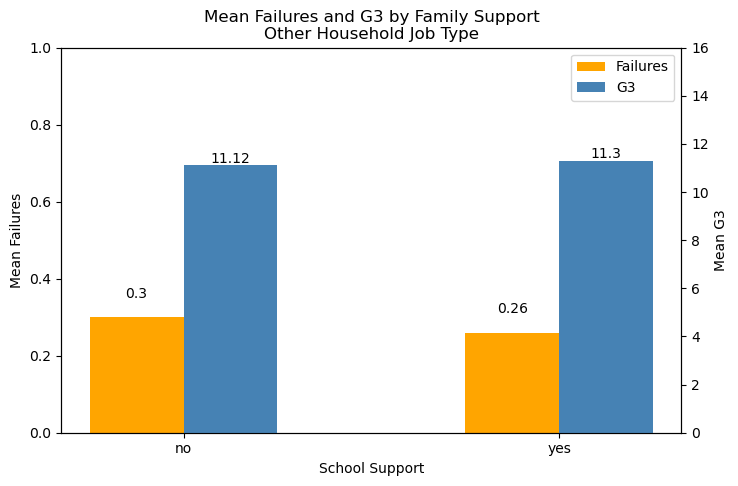

In [440]:
# Checking results with school support, filtering only Other Household Type
means_no_prof = (
    df_non_professional.groupby('family_support')[['failures', 'g3']]
    .mean()
    .round(2)
)

x = np.arange(len(means_no_prof.index))
width = 0.25 

fig, ax1 = plt.subplots(figsize=(8,5))

bars1 = ax1.bar(
    x - width/2, 
    means_no_prof['failures'], 
    width, 
    color='orange'
)
ax1.set_ylabel('Mean Failures')
ax1.set_ylim(0, 1)

for bar in bars1:
    height = bar.get_height()
    ax1.text(
        bar.get_x() + bar.get_width()/2,
        height + 0.05,
        round(height,2),
        ha='center'
    )

ax2 = ax1.twinx()
bars2 = ax2.bar(
    x + width/2, 
    means_no_prof['g3'], 
    width, 
    color='steelblue'
)
ax2.set_ylabel('Mean G3')
ax2.set_ylim(0, 16)

for bar in bars2:
    height = bar.get_height()
    ax2.text(
        bar.get_x() + bar.get_width()/2,
        height + 0.1,
        round(height,2),
        ha='center'
    )

ax1.set_xticks(x)
ax1.set_xticklabels(means_no_prof.index)
ax1.set_xlabel('School Support')

plt.title('Mean Failures and G3 by Family Support\nOther Household Job Type')

legend_elements = [
    Patch(facecolor='orange', label='Failures'),
    Patch(facecolor='steelblue', label='G3')
]

ax1.legend(handles=legend_elements)

plt.show()